# **General Prep**

In [1]:
#pip install pingouin

In [2]:
import os
import warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
from scipy import stats
from scipy.stats import zscore
from sklearn.linear_model import Ridge
from sklearn.utils import resample
from sklearn.metrics import r2_score
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import RidgeCV
import pingouin as pg
from statsmodels.stats.outliers_influence import variance_inflation_factor, OLSInfluence
from statsmodels.stats.diagnostic import het_breuschpagan, linear_rainbow
from statsmodels.stats.stattools import durbin_watson


In [3]:
warnings.filterwarnings('ignore')
pd.set_option('display.max_rows', 50)
pd.set_option('display.max_columns', 500)

# Set a modern style
plt.style.use('seaborn-v0_8-pastel')

In [4]:
# Set the working directory dynamically
notebook_dir = os.path.dirname(os.path.abspath('__file__'))
project_root = os.path.abspath(os.path.join(notebook_dir, '..', '..', '..'))
study2_dir = os.path.join(project_root, 'study2')
os.chdir(study2_dir)

# Print current directory
print(f"Current working directory: {os.getcwd()}")

Current working directory: c:\Users\Ryo\OneDrive\Desktop\Master Thesis\master_thesis\study2


# **Data Preperation**

In [5]:
file_loc = 'raw/Study2_June_14_2024_17.29_final.xlsx'
df = pd.read_excel(file_loc)
df

,ResponseId,Ads_OP_1,Ads_OP_2,Ads_OP_3,Ads_OP_4,Ads_OP_5,Ads_OP_6,Ads_CO_1,Ads_CO_2,Ads_CO_3,Ads_CO_4,Ads_CO_5,Ads_CO_6,Ads_EX_1,Ads_EX_2,Ads_EX_3,Ads_EX_4,Ads_EX_5,Ads_EX_6,Ads_AG_1,Ads_AG_2,Ads_AG_3,Ads_AG_4,Ads_AG_5,Ads_AG_6,Cha_OP_1,Cha_OP_2,Cha_OP_3,Cha_OP_4,Cha_OP_5,Cha_OP_6,Cha_OP_7,Cha_CO_1,Cha_CO_2,Cha_CO_3,Cha_CO_4,Cha_CO_5,Cha_CO_6,Cha_CO_7,Cha_EX_1,Cha_EX_2,Cha_EX_3,Cha_EX_4,Cha_EX_5,Cha_EX_6,Cha_EX_7,Cha_AG_1,Cha_AG_2,Cha_AG_3,Cha_AG_4,Cha_AG_5,Cha_AG_6,Cha_AG_7,big5_1,big5_2,big5_3,big5_4,big5_5,big5_6,big5_7,big5_8,big5_9,big5_10,big5_11,big5_12,big5_13,big5_14,big5_15,big5_16,big5_17,big5_18,big5_19,big5_20,big5_21,big5_22,big5_23,big5_24,big5_25,big5_26,big5_27,big5_28,big5_29,big5_30,gender,age,education,race,employment,income
0,r1,30,0,45,31,46,47,45,0,37,47,42,43,37,46,41,43,42,45,55,44,40,41,40,46,50,61,66,68,71,64,63,60,63,55,62,63,60,60,34,28,32,30,50,39,39,38,0,0,0,54,0,0,5,4,4,4,5,2,2,4,4,3,2,3,3,4,2,1,3,3,3,2,3,5,4,4,4,4,3,2,2,3,1,31,4,4,2,2
1,r2,50,54,50,50,58,51,42,54,61,61,64,67,18,50,23,21,15,8,58,50,65,61,52,55,65,74,88,85,58,59,59,75,60,76,80,81,79,58,60,62,59,62,66,73,60,71,72,80,80,82,83,79,4,4,3,5,4,2,2,3,3,2,3,2,5,3,3,2,3,3,2,3,4,4,4,3,5,4,3,3,4,2,2,43,5,1,6,10
2,r3,20,15,30,25,30,15,75,80,79,90,77,85,80,85,97,89,82,100,73,73,83,71,74,90,95,84,100,100,100,90,100,88,98,97,91,97,86,86,86,88,100,100,96,100,80,98,100,97,97,100,95,94,4,4,2,3,2,4,2,2,2,1,3,4,4,4,4,3,2,3,4,3,2,4,4,4,5,1,3,2,2,2,1,22,4,1,2,1
3,r4,1,13,10,11,6,6,50,50,39,0,50,50,3,4,3,2,4,4,89,93,98,100,100,100,70,70,76,81,89,88,51,82,78,85,86,87,83,85,0,50,50,50,50,50,50,84,92,93,94,89,99,97,4,4,2,3,2,2,1,1,2,3,3,4,4,4,4,3,1,4,5,3,2,5,5,5,5,2,1,1,2,3,2,58,2,1,7,10
4,r5,60,40,60,60,70,70,40,40,40,30,30,30,70,70,80,80,80,80,40,20,20,20,40,30,60,71,80,71,90,80,75,84,82,83,86,80,82,80,75,79,71,77,77,78,76,90,85,84,91,91,87,94,4,4,3,5,4,2,4,3,5,4,2,1,4,2,4,3,5,4,3,2,4,4,4,4,4,2,5,4,4,2,1,32,4,1,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
129,r130,0,0,0,0,0,0,20,61,20,60,10,1,0,0,0,0,0,0,100,100,100,100,100,100,100,100,100,100,100,100,100,100,97,100,100,100,100,100,100,100,100,100,100,100,100,100,100,100,100,100,100,100,4,5,1,4,4,1,2,1,4,2,2,4,4,4,4,2,1,5,4,2,4,5,5,2,4,2,1,1,1,2,2,53,2,1,4,6
130,r131,82,78,90,94,97,100,86,82,86,90,93,97,91,85,92,100,100,100,30,15,10,10,6,0,91,93,95,98,98,99,99,92,92,95,97,99,99,98,93,95,96,97,100,99,98,92,95,93,96,99,99,95,4,5,2,2,5,4,1,1,1,1,4,5,4,5,4,4,1,4,5,1,2,5,5,5,4,2,2,2,1,1,2,55,5,2,9,11
131,r132,60,70,100,100,100,100,100,80,75,90,70,50,90,85,95,50,95,100,20,35,15,25,25,20,100,95,65,85,100,95,100,100,100,100,95,100,99,100,100,100,100,100,100,98,100,100,100,100,99,100,99,100,2,5,1,3,4,3,1,1,1,2,4,3,4,4,4,5,1,5,4,2,3,5,5,5,4,1,2,3,2,2,2,51,3,1,6,3
132,r133,87,86,86,82,83,82,72,72,72,76,75,77,91,83,86,86,87,90,76,74,77,75,77,79,92,92,90,93,91,93,94,80,84,87,86,84,87,87,85,84,88,88,86,87,89,92,84,87,86,83,87,83,3,5,1,4,5,5,4,2,1,2,5,5,5,5,5,5,2,5,5,4,3,5,5,5,4,4,3,2,2,2,1,43,5,2,7,12


In [6]:
# Exclude invalid participants
preview_ids = ['r1']
pilot_ids = ['r2', 'r3', 'r4', 'r5', 'r6', 'r7', 'r8', 'r9', 'r10']
answer_not_valid_ids = ['r22', 'r25', 'r28', 'r30', 'r31', 'r39', 'r40', 'r46',
                        'r50', 'r51', 'r59', 'r64', 'r78', 'r94', 'r99', 'r110',
                        'r115', 'r117', 'r130', 'r132']
invalid_ids = preview_ids + pilot_ids + answer_not_valid_ids

print(f"original shape {df.shape}")
df = df[~df['ResponseId'].isin(invalid_ids)]
print(f"final df shape {df.shape}")

original shape (134, 89)
final df shape (104, 89)


In [7]:
print(df['ResponseId'].tolist())

['r11', 'r12', 'r13', 'r14', 'r15', 'r16', 'r17', 'r18', 'r19', 'r20', 'r21', 'r23', 'r24', 'r26', 'r27', 'r29', 'r32', 'r33', 'r34', 'r35', 'r36', 'r37', 'r38', 'r41', 'r42', 'r43', 'r44', 'r45', 'r47', 'r48', 'r49', 'r52', 'r53', 'r54', 'r55', 'r56', 'r57', 'r58', 'r60', 'r61', 'r62', 'r63', 'r65', 'r66', 'r67', 'r68', 'r69', 'r70', 'r71', 'r72', 'r73', 'r74', 'r75', 'r76', 'r77', 'r79', 'r80', 'r81', 'r82', 'r83', 'r84', 'r85', 'r86', 'r87', 'r88', 'r89', 'r90', 'r91', 'r92', 'r93', 'r95', 'r96', 'r97', 'r98', 'r100', 'r101', 'r102', 'r103', 'r104', 'r105', 'r106', 'r107', 'r108', 'r109', 'r111', 'r112', 'r113', 'r114', 'r116', 'r118', 'r119', 'r120', 'r121', 'r122', 'r123', 'r124', 'r125', 'r126', 'r127', 'r128', 'r129', 'r131', 'r133', 'r134']


In [8]:
df

,ResponseId,Ads_OP_1,Ads_OP_2,Ads_OP_3,Ads_OP_4,Ads_OP_5,Ads_OP_6,Ads_CO_1,Ads_CO_2,Ads_CO_3,Ads_CO_4,Ads_CO_5,Ads_CO_6,Ads_EX_1,Ads_EX_2,Ads_EX_3,Ads_EX_4,Ads_EX_5,Ads_EX_6,Ads_AG_1,Ads_AG_2,Ads_AG_3,Ads_AG_4,Ads_AG_5,Ads_AG_6,Cha_OP_1,Cha_OP_2,Cha_OP_3,Cha_OP_4,Cha_OP_5,Cha_OP_6,Cha_OP_7,Cha_CO_1,Cha_CO_2,Cha_CO_3,Cha_CO_4,Cha_CO_5,Cha_CO_6,Cha_CO_7,Cha_EX_1,Cha_EX_2,Cha_EX_3,Cha_EX_4,Cha_EX_5,Cha_EX_6,Cha_EX_7,Cha_AG_1,Cha_AG_2,Cha_AG_3,Cha_AG_4,Cha_AG_5,Cha_AG_6,Cha_AG_7,big5_1,big5_2,big5_3,big5_4,big5_5,big5_6,big5_7,big5_8,big5_9,big5_10,big5_11,big5_12,big5_13,big5_14,big5_15,big5_16,big5_17,big5_18,big5_19,big5_20,big5_21,big5_22,big5_23,big5_24,big5_25,big5_26,big5_27,big5_28,big5_29,big5_30,gender,age,education,race,employment,income
10,r11,73,74,76,74,76,81,85,100,80,82,88,0,73,75,84,82,100,84,82,82,87,92,100,93,86,85,89,100,100,100,100,100,100,89,100,90,100,100,100,87,81,83,91,74,89,85,78,96,80,93,100,89,4,4,3,2,2,4,3,3,3,3,5,5,4,5,4,4,1,2,3,2,3,4,5,4,3,2,3,2,2,4,1,34,4,2,5,1
11,r12,75,77,87,85,90,76,50,43,45,42,38,39,84,79,87,75,79,77,12,14,32,24,14,9,32,26,28,26,31,14,32,21,17,15,19,31,21,23,32,30,42,27,33,35,38,50,50,50,53,52,34,36,2,4,2,4,4,4,2,2,1,1,4,4,5,4,4,5,5,4,4,2,2,4,4,5,4,4,4,2,1,2,1,36,5,1,7,7
12,r13,30,30,27,45,55,34,81,72,81,63,60,85,82,56,81,65,75,86,82,59,74,57,65,79,69,55,81,89,78,70,85,82,62,80,91,76,71,89,74,66,84,78,76,67,90,71,70,64,77,70,66,75,2,5,1,2,2,5,4,2,2,4,3,4,5,4,4,5,4,5,4,4,2,4,5,5,5,2,4,2,2,2,2,48,5,1,6,11
13,r14,54,45,54,56,56,54,45,48,45,47,47,47,48,48,47,54,54,55,43,42,46,45,45,45,59,58,55,56,56,55,57,61,64,60,60,63,54,54,58,53,53,62,67,62,55,57,54,55,64,70,55,54,3,4,3,5,5,3,3,4,4,2,3,3,4,2,4,3,3,2,2,2,3,4,4,3,4,2,3,3,4,2,2,41,4,1,5,5
14,r15,63,65,63,64,59,62,35,34,36,37,38,39,60,58,58,59,58,59,41,41,39,38,38,39,59,60,61,58,58,60,61,62,58,60,60,59,64,59,62,62,59,59,59,56,60,58,61,59,62,68,58,61,4,5,4,4,4,4,1,4,4,1,4,2,5,4,4,2,1,4,4,2,2,5,4,4,4,4,2,2,2,2,2,48,2,1,1,9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
127,r128,93,61,84,84,87,88,77,91,94,73,82,79,9,27,21,60,60,50,28,63,33,64,36,37,81,91,82,86,89,89,88,86,87,90,87,93,93,84,100,98,93,95,96,93,90,98,85,90,89,91,97,100,4,4,3,5,4,4,4,4,5,2,3,2,4,3,4,4,3,3,3,2,2,4,4,4,5,3,3,3,4,2,2,27,4,2,1,1
128,r129,10,40,20,0,0,0,50,100,80,65,91,100,90,100,100,0,0,100,30,65,9,1,0,0,83,50,52,70,50,50,63,82,100,82,100,0,0,88,50,50,58,67,0,0,58,60,83,100,85,0,0,66,1,5,1,1,4,1,1,1,1,3,3,4,5,5,1,5,1,1,5,2,4,5,5,5,4,1,1,1,1,4,2,30,2,1,6,5
130,r131,82,78,90,94,97,100,86,82,86,90,93,97,91,85,92,100,100,100,30,15,10,10,6,0,91,93,95,98,98,99,99,92,92,95,97,99,99,98,93,95,96,97,100,99,98,92,95,93,96,99,99,95,4,5,2,2,5,4,1,1,1,1,4,5,4,5,4,4,1,4,5,1,2,5,5,5,4,2,2,2,1,1,2,55,5,2,9,11
132,r133,87,86,86,82,83,82,72,72,72,76,75,77,91,83,86,86,87,90,76,74,77,75,77,79,92,92,90,93,91,93,94,80,84,87,86,84,87,87,85,84,88,88,86,87,89,92,84,87,86,83,87,83,3,5,1,4,5,5,4,2,1,2,5,5,5,5,5,5,2,5,5,4,3,5,5,5,4,4,3,2,2,2,1,43,5,2,7,12


In [9]:
socioecono_columns = ['gender',	'age',	'education', 'race', 'employment', 'income']

In [10]:
all_columns = df.columns.tolist()
ads_columns = [col for col in all_columns if col.split('_')[0] == 'Ads' ]
chat_columns = [col for col in all_columns if col.split('_')[0] == 'Cha' ]

In [11]:
ads_df = df[['ResponseId'] + ads_columns]
ads_df

,ResponseId,Ads_OP_1,Ads_OP_2,Ads_OP_3,Ads_OP_4,Ads_OP_5,Ads_OP_6,Ads_CO_1,Ads_CO_2,Ads_CO_3,Ads_CO_4,Ads_CO_5,Ads_CO_6,Ads_EX_1,Ads_EX_2,Ads_EX_3,Ads_EX_4,Ads_EX_5,Ads_EX_6,Ads_AG_1,Ads_AG_2,Ads_AG_3,Ads_AG_4,Ads_AG_5,Ads_AG_6
10,r11,73,74,76,74,76,81,85,100,80,82,88,0,73,75,84,82,100,84,82,82,87,92,100,93
11,r12,75,77,87,85,90,76,50,43,45,42,38,39,84,79,87,75,79,77,12,14,32,24,14,9
12,r13,30,30,27,45,55,34,81,72,81,63,60,85,82,56,81,65,75,86,82,59,74,57,65,79
13,r14,54,45,54,56,56,54,45,48,45,47,47,47,48,48,47,54,54,55,43,42,46,45,45,45
14,r15,63,65,63,64,59,62,35,34,36,37,38,39,60,58,58,59,58,59,41,41,39,38,38,39
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
127,r128,93,61,84,84,87,88,77,91,94,73,82,79,9,27,21,60,60,50,28,63,33,64,36,37
128,r129,10,40,20,0,0,0,50,100,80,65,91,100,90,100,100,0,0,100,30,65,9,1,0,0
130,r131,82,78,90,94,97,100,86,82,86,90,93,97,91,85,92,100,100,100,30,15,10,10,6,0
132,r133,87,86,86,82,83,82,72,72,72,76,75,77,91,83,86,86,87,90,76,74,77,75,77,79


In [12]:
chat_df = df[['ResponseId'] + chat_columns]
chat_df

,ResponseId,Cha_OP_1,Cha_OP_2,Cha_OP_3,Cha_OP_4,Cha_OP_5,Cha_OP_6,Cha_OP_7,Cha_CO_1,Cha_CO_2,Cha_CO_3,Cha_CO_4,Cha_CO_5,Cha_CO_6,Cha_CO_7,Cha_EX_1,Cha_EX_2,Cha_EX_3,Cha_EX_4,Cha_EX_5,Cha_EX_6,Cha_EX_7,Cha_AG_1,Cha_AG_2,Cha_AG_3,Cha_AG_4,Cha_AG_5,Cha_AG_6,Cha_AG_7
10,r11,86,85,89,100,100,100,100,100,100,89,100,90,100,100,100,87,81,83,91,74,89,85,78,96,80,93,100,89
11,r12,32,26,28,26,31,14,32,21,17,15,19,31,21,23,32,30,42,27,33,35,38,50,50,50,53,52,34,36
12,r13,69,55,81,89,78,70,85,82,62,80,91,76,71,89,74,66,84,78,76,67,90,71,70,64,77,70,66,75
13,r14,59,58,55,56,56,55,57,61,64,60,60,63,54,54,58,53,53,62,67,62,55,57,54,55,64,70,55,54
14,r15,59,60,61,58,58,60,61,62,58,60,60,59,64,59,62,62,59,59,59,56,60,58,61,59,62,68,58,61
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
127,r128,81,91,82,86,89,89,88,86,87,90,87,93,93,84,100,98,93,95,96,93,90,98,85,90,89,91,97,100
128,r129,83,50,52,70,50,50,63,82,100,82,100,0,0,88,50,50,58,67,0,0,58,60,83,100,85,0,0,66
130,r131,91,93,95,98,98,99,99,92,92,95,97,99,99,98,93,95,96,97,100,99,98,92,95,93,96,99,99,95
132,r133,92,92,90,93,91,93,94,80,84,87,86,84,87,87,85,84,88,88,86,87,89,92,84,87,86,83,87,83


In [13]:
socioecono_df = df[['ResponseId'] + socioecono_columns]
socioecono_df

,ResponseId,gender,age,education,race,employment,income
10,r11,1,34,4,2,5,1
11,r12,1,36,5,1,7,7
12,r13,2,48,5,1,6,11
13,r14,2,41,4,1,5,5
14,r15,2,48,2,1,1,9
...,...,...,...,...,...,...,...
127,r128,2,27,4,2,1,1
128,r129,2,30,2,1,6,5
130,r131,2,55,5,2,9,11
132,r133,1,43,5,2,7,12


In [14]:
# Set the working directory dynamically
notebook_dir = os.path.dirname(os.path.abspath('__file__'))
project_root = os.path.abspath(os.path.join(notebook_dir, '..'))
study3_dir = os.path.join(project_root, 'study3')
os.chdir(study3_dir)

# Print current directory
print(f"Current working directory: {os.getcwd()}")


Current working directory: c:\Users\Ryo\OneDrive\Desktop\Master Thesis\master_thesis\study3


In [15]:
socioecono_df.to_csv('raw/socioecono_scores.csv', index=False)

In [16]:
print(f"mean age {socioecono_df['age'].mean()} with sd {socioecono_df['age'].std()}, female % {socioecono_df[socioecono_df['gender']==1]['gender'].sum()/socioecono_df.shape[0]}")

mean age 40.13461538461539 with sd 11.586783307866355, female % 0.49038461538461536


In [17]:
for col in ['education', 'race', 'employment']:
    print(socioecono_df[col].value_counts())

education
4    48
2    22
5    21
3    11
6     2
Name: count, dtype: int64
race
1    70
2    23
4     4
6     4
3     2
0     1
Name: count, dtype: int64
employment
7    55
5    11
1    10
6     9
4     6
3     6
2     3
8     2
0     1
9     1
Name: count, dtype: int64


In [18]:
race_simplify = [4, 6, 3, 0]
employment_simplify = [4, 3, 2, 8, 0, 9]

socioecono_df['race'] = np.where(socioecono_df['race'].isin(race_simplify), 99, socioecono_df['race'])
socioecono_df['employment'] = np.where(socioecono_df['employment'].isin(employment_simplify), 99, socioecono_df['employment'])

In [19]:
for col in ['education', 'race', 'employment']:
    print(socioecono_df[col].value_counts())

education
4    48
2    22
5    21
3    11
6     2
Name: count, dtype: int64
race
1     70
2     23
99    11
Name: count, dtype: int64
employment
7     55
99    19
5     11
1     10
6      9
Name: count, dtype: int64


In [20]:
['ResponseId'] + socioecono_columns

['ResponseId', 'gender', 'age', 'education', 'race', 'employment', 'income']

In [21]:
df.isna().sum()

ResponseId    0
Ads_OP_1      0
Ads_OP_2      0
Ads_OP_3      0
Ads_OP_4      0
             ..
age           0
education     0
race          0
employment    0
income        0
Length: 89, dtype: int64

## Transform df (responses)

In [22]:
ads_perceived_personalization = [1]
ads_perceived_credibility = [2]
ads_overall_attitude = [3,4,5]
ads_engagement = [6]

In [23]:
chat_perceived_personalization = [1]
chat_trust = [2,3]
chat_satisfaction = [4]
chat_positive_emotion = [5]
chat_engagement = [6,7]

In [24]:
ads_df

,ResponseId,Ads_OP_1,Ads_OP_2,Ads_OP_3,Ads_OP_4,Ads_OP_5,Ads_OP_6,Ads_CO_1,Ads_CO_2,Ads_CO_3,Ads_CO_4,Ads_CO_5,Ads_CO_6,Ads_EX_1,Ads_EX_2,Ads_EX_3,Ads_EX_4,Ads_EX_5,Ads_EX_6,Ads_AG_1,Ads_AG_2,Ads_AG_3,Ads_AG_4,Ads_AG_5,Ads_AG_6
10,r11,73,74,76,74,76,81,85,100,80,82,88,0,73,75,84,82,100,84,82,82,87,92,100,93
11,r12,75,77,87,85,90,76,50,43,45,42,38,39,84,79,87,75,79,77,12,14,32,24,14,9
12,r13,30,30,27,45,55,34,81,72,81,63,60,85,82,56,81,65,75,86,82,59,74,57,65,79
13,r14,54,45,54,56,56,54,45,48,45,47,47,47,48,48,47,54,54,55,43,42,46,45,45,45
14,r15,63,65,63,64,59,62,35,34,36,37,38,39,60,58,58,59,58,59,41,41,39,38,38,39
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
127,r128,93,61,84,84,87,88,77,91,94,73,82,79,9,27,21,60,60,50,28,63,33,64,36,37
128,r129,10,40,20,0,0,0,50,100,80,65,91,100,90,100,100,0,0,100,30,65,9,1,0,0
130,r131,82,78,90,94,97,100,86,82,86,90,93,97,91,85,92,100,100,100,30,15,10,10,6,0
132,r133,87,86,86,82,83,82,72,72,72,76,75,77,91,83,86,86,87,90,76,74,77,75,77,79


## drop responses that contain na value within column(s) that cannot be remedied through averaging with other columns

In [25]:
ads_overall_attitude_cols = []
for col in ads_columns:
    id = int(col.split('_')[2])
    if ads_overall_attitude.__contains__(id):
        ads_overall_attitude_cols.append(col)
    else:
        ads_df.dropna(subset=[col], inplace= True)

In [26]:
ads_df

,ResponseId,Ads_OP_1,Ads_OP_2,Ads_OP_3,Ads_OP_4,Ads_OP_5,Ads_OP_6,Ads_CO_1,Ads_CO_2,Ads_CO_3,Ads_CO_4,Ads_CO_5,Ads_CO_6,Ads_EX_1,Ads_EX_2,Ads_EX_3,Ads_EX_4,Ads_EX_5,Ads_EX_6,Ads_AG_1,Ads_AG_2,Ads_AG_3,Ads_AG_4,Ads_AG_5,Ads_AG_6
10,r11,73,74,76,74,76,81,85,100,80,82,88,0,73,75,84,82,100,84,82,82,87,92,100,93
11,r12,75,77,87,85,90,76,50,43,45,42,38,39,84,79,87,75,79,77,12,14,32,24,14,9
12,r13,30,30,27,45,55,34,81,72,81,63,60,85,82,56,81,65,75,86,82,59,74,57,65,79
13,r14,54,45,54,56,56,54,45,48,45,47,47,47,48,48,47,54,54,55,43,42,46,45,45,45
14,r15,63,65,63,64,59,62,35,34,36,37,38,39,60,58,58,59,58,59,41,41,39,38,38,39
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
127,r128,93,61,84,84,87,88,77,91,94,73,82,79,9,27,21,60,60,50,28,63,33,64,36,37
128,r129,10,40,20,0,0,0,50,100,80,65,91,100,90,100,100,0,0,100,30,65,9,1,0,0
130,r131,82,78,90,94,97,100,86,82,86,90,93,97,91,85,92,100,100,100,30,15,10,10,6,0
132,r133,87,86,86,82,83,82,72,72,72,76,75,77,91,83,86,86,87,90,76,74,77,75,77,79


In [27]:
chat_trust_cols = []
chat_engagement_cols = []

for col in chat_columns:
    id = int(col.split('_')[2])
    if chat_trust.__contains__(id):
        chat_trust_cols.append(col)
    elif chat_engagement.__contains__(id):
        chat_engagement_cols.append(col)
    else:
        chat_df.dropna(subset=[col], inplace= True)

In [28]:
chat_df

,ResponseId,Cha_OP_1,Cha_OP_2,Cha_OP_3,Cha_OP_4,Cha_OP_5,Cha_OP_6,Cha_OP_7,Cha_CO_1,Cha_CO_2,Cha_CO_3,Cha_CO_4,Cha_CO_5,Cha_CO_6,Cha_CO_7,Cha_EX_1,Cha_EX_2,Cha_EX_3,Cha_EX_4,Cha_EX_5,Cha_EX_6,Cha_EX_7,Cha_AG_1,Cha_AG_2,Cha_AG_3,Cha_AG_4,Cha_AG_5,Cha_AG_6,Cha_AG_7
10,r11,86,85,89,100,100,100,100,100,100,89,100,90,100,100,100,87,81,83,91,74,89,85,78,96,80,93,100,89
11,r12,32,26,28,26,31,14,32,21,17,15,19,31,21,23,32,30,42,27,33,35,38,50,50,50,53,52,34,36
12,r13,69,55,81,89,78,70,85,82,62,80,91,76,71,89,74,66,84,78,76,67,90,71,70,64,77,70,66,75
13,r14,59,58,55,56,56,55,57,61,64,60,60,63,54,54,58,53,53,62,67,62,55,57,54,55,64,70,55,54
14,r15,59,60,61,58,58,60,61,62,58,60,60,59,64,59,62,62,59,59,59,56,60,58,61,59,62,68,58,61
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
127,r128,81,91,82,86,89,89,88,86,87,90,87,93,93,84,100,98,93,95,96,93,90,98,85,90,89,91,97,100
128,r129,83,50,52,70,50,50,63,82,100,82,100,0,0,88,50,50,58,67,0,0,58,60,83,100,85,0,0,66
130,r131,91,93,95,98,98,99,99,92,92,95,97,99,99,98,93,95,96,97,100,99,98,92,95,93,96,99,99,95
132,r133,92,92,90,93,91,93,94,80,84,87,86,84,87,87,85,84,88,88,86,87,89,92,84,87,86,83,87,83


## translating the responses to features

In [29]:
big5_types = ['OP', 'CO', 'EX', 'AG']

In [30]:
#ads_perceived_personalization = [1]
#ads_perceived_credibility = [2]
#ads_overall_attitude = [3,4,5]
#ads_engagement = [6]

ads_dict = {'ResponseId': ads_df['ResponseId']}
ads_overall_attitudecronbach_alpha_dict = {}

for col in ads_columns:
    type_part = col.split('_')[1]
    id_part = int(col.split('_')[2])
    
    for big5_type in big5_types:
        if type_part == big5_type:
            if id_part == 1:
                col_name = 'perceived_personalization_' + big5_type
                if col_name not in ads_dict:
                    ads_dict[col_name] = ads_df[col]
                else:
                    ads_dict[col_name] = pd.concat([ads_dict[col_name], ads_df[col]], axis=1)
                
            elif id_part == 2:
                col_name = 'perceived_credibility_' + big5_type
                if col_name not in ads_dict:
                    ads_dict[col_name] = ads_df[col]
                else:
                    ads_dict[col_name] = pd.concat([ads_dict[col_name], ads_df[col]], axis=1)
                
            elif id_part in [3, 4, 5]:
                col_name = 'overall_attitude_' + big5_type
                cols_to_mean = ['Ads_' + big5_type + '_3', 'Ads_' + big5_type + '_4', 'Ads_' + big5_type + '_5']
                if col_name not in ads_dict:
                    ads_dict[col_name] = ads_df[cols_to_mean].mean(axis=1).astype(int)
                
                # Calculate Cronbach's Alpha
                cronbach_alpha = pg.cronbach_alpha(data=ads_df[cols_to_mean])[0]
                ads_overall_attitudecronbach_alpha_dict[big5_type] = cronbach_alpha
                
            else:
                col_name = 'ads_engagement_' + big5_type
                if col_name not in ads_dict:
                    ads_dict[col_name] = ads_df[col]
                else:
                    ads_dict[col_name] = pd.concat([ads_dict[col_name], ads_df[col]], axis=1)


In [31]:
ads_scores = pd.DataFrame(ads_dict)

cols_to_convert = ads_scores.columns.difference(['ResponseId'])
ads_scores[cols_to_convert] = ads_scores[cols_to_convert].astype(int)

ads_scores

,ResponseId,perceived_personalization_OP,perceived_credibility_OP,overall_attitude_OP,ads_engagement_OP,perceived_personalization_CO,perceived_credibility_CO,overall_attitude_CO,ads_engagement_CO,perceived_personalization_EX,perceived_credibility_EX,overall_attitude_EX,ads_engagement_EX,perceived_personalization_AG,perceived_credibility_AG,overall_attitude_AG,ads_engagement_AG
10,r11,73,74,75,81,85,100,83,0,73,75,88,84,82,82,93,93
11,r12,75,77,87,76,50,43,41,39,84,79,80,77,12,14,23,9
12,r13,30,30,42,34,81,72,68,85,82,56,73,86,82,59,65,79
13,r14,54,45,55,54,45,48,46,47,48,48,51,55,43,42,45,45
14,r15,63,65,62,62,35,34,37,39,60,58,58,59,41,41,38,39
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
127,r128,93,61,85,88,77,91,83,79,9,27,47,50,28,63,44,37
128,r129,10,40,6,0,50,100,78,100,90,100,33,100,30,65,3,0
130,r131,82,78,93,100,86,82,89,97,91,85,97,100,30,15,8,0
132,r133,87,86,83,82,72,72,74,77,91,83,86,90,76,74,76,79


In [32]:
np.mean(list(ads_overall_attitudecronbach_alpha_dict.values()))

0.9440483281842984

In [33]:
#chat_perceived_personalization = [1]
#chat_trust = [2,3]
#chat_satisfaction = [4]
#chat_positive_emotion = [5]
#chat_engagement = [6,7]

chat_dict = {'ResponseId': chat_df['ResponseId']}
chat_trust_cronbach_alpha_dict = {}
chat_engagement_cronbach_alpha_dict = {}

for col in chat_columns:
    type_part = col.split('_')[1]
    id_part = int(col.split('_')[2])
    
    for big5_type in big5_types:
        if type_part == big5_type:
            if id_part == 1:
                col_name = 'chat_perceived_personalization_' + big5_type
                if col_name not in chat_dict:
                    chat_dict[col_name] = chat_df[col]
                else:
                    chat_dict[col_name] = pd.concat([chat_dict[col_name], chat_df[col]], axis=1)
                
            elif id_part in [2, 3]:
                col_name = 'chat_trust_' + big5_type
                cols_to_mean = ['Cha_' + big5_type + '_2', 'Cha_' + big5_type + '_3']
                if col_name not in chat_dict:
                    chat_dict[col_name] = chat_df[cols_to_mean].mean(axis=1).astype(int)
                
                # Calculate Cronbach's Alpha
                cronbach_alpha = pg.cronbach_alpha(data=chat_df[cols_to_mean])[0]
                chat_trust_cronbach_alpha_dict[big5_type] = cronbach_alpha

            elif id_part == 4:
                col_name = 'chat_satisfaction_' + big5_type
                if col_name not in chat_dict:
                    chat_dict[col_name] = chat_df[col]
                else:
                    chat_dict[col_name] = pd.concat([chat_dict[col_name], chat_df[col]], axis=1)
            
            elif id_part == 5:
                col_name = 'chat_positive_emotion_' + big5_type
                if col_name not in chat_dict:
                    chat_dict[col_name] = chat_df[col]
                else:
                    chat_dict[col_name] = pd.concat([chat_dict[col_name], chat_df[col]], axis=1)
                
            else:
                col_name = 'chat_engagement_' + big5_type
                cols_to_mean = ['Cha_' + big5_type + '_6', 'Cha_' + big5_type + '_7']
                if col_name not in chat_dict:
                    chat_dict[col_name] = chat_df[cols_to_mean].mean(axis=1).astype(int)
                
                # Calculate Cronbach's Alpha
                cronbach_alpha = pg.cronbach_alpha(data=chat_df[cols_to_mean])[0]
                chat_engagement_cronbach_alpha_dict[big5_type] = cronbach_alpha

In [34]:
chat_scores = pd.DataFrame(chat_dict)

cols_to_convert = chat_scores.columns.difference(['ResponseId'])
chat_scores[cols_to_convert] = chat_scores[cols_to_convert].astype(int)

chat_scores

,ResponseId,chat_perceived_personalization_OP,chat_trust_OP,chat_satisfaction_OP,chat_positive_emotion_OP,chat_engagement_OP,chat_perceived_personalization_CO,chat_trust_CO,chat_satisfaction_CO,chat_positive_emotion_CO,chat_engagement_CO,chat_perceived_personalization_EX,chat_trust_EX,chat_satisfaction_EX,chat_positive_emotion_EX,chat_engagement_EX,chat_perceived_personalization_AG,chat_trust_AG,chat_satisfaction_AG,chat_positive_emotion_AG,chat_engagement_AG
10,r11,86,87,100,100,100,100,94,100,90,100,100,84,83,91,81,85,87,80,93,94
11,r12,32,27,26,31,23,21,16,19,31,22,32,36,27,33,36,50,50,53,52,35
12,r13,69,68,89,78,77,82,71,91,76,80,74,75,78,76,78,71,67,77,70,70
13,r14,59,56,56,56,56,61,62,60,63,54,58,53,62,67,58,57,54,64,70,54
14,r15,59,60,58,58,60,62,59,60,59,61,62,60,59,59,58,58,60,62,68,59
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
127,r128,81,86,86,89,88,86,88,87,93,88,100,95,95,96,91,98,87,89,91,98
128,r129,83,51,70,50,56,82,91,100,0,44,50,54,67,0,29,60,91,85,0,33
130,r131,91,94,98,98,99,92,93,97,99,98,93,95,97,100,98,92,94,96,99,97
132,r133,92,91,93,91,93,80,85,86,84,87,85,86,88,86,88,92,85,86,83,85


In [35]:
chat_overall_attitude_cols = ['chat_trust', 'chat_satisfaction', 'chat_positive_emotion']
chat_overall_attitude_cronbach_alpha_dict = {}

for big5_type in big5_types:
    cols_to_mean = [col + '_' + big5_type for col in chat_overall_attitude_cols]
    new_col_name = 'chat_overall_attitude' + '_' + big5_type
    chat_scores[new_col_name] = chat_scores[cols_to_mean].mean(axis=1).astype(int)

    # Calculate Cronbach's Alpha
    cronbach_alpha = pg.cronbach_alpha(data=chat_scores[cols_to_mean])[0]
    chat_overall_attitude_cronbach_alpha_dict[big5_type] = cronbach_alpha

In [36]:
chat_scores

,ResponseId,chat_perceived_personalization_OP,chat_trust_OP,chat_satisfaction_OP,chat_positive_emotion_OP,chat_engagement_OP,chat_perceived_personalization_CO,chat_trust_CO,chat_satisfaction_CO,chat_positive_emotion_CO,chat_engagement_CO,chat_perceived_personalization_EX,chat_trust_EX,chat_satisfaction_EX,chat_positive_emotion_EX,chat_engagement_EX,chat_perceived_personalization_AG,chat_trust_AG,chat_satisfaction_AG,chat_positive_emotion_AG,chat_engagement_AG,chat_overall_attitude_OP,chat_overall_attitude_CO,chat_overall_attitude_EX,chat_overall_attitude_AG
10,r11,86,87,100,100,100,100,94,100,90,100,100,84,83,91,81,85,87,80,93,94,95,94,86,86
11,r12,32,27,26,31,23,21,16,19,31,22,32,36,27,33,36,50,50,53,52,35,28,22,32,51
12,r13,69,68,89,78,77,82,71,91,76,80,74,75,78,76,78,71,67,77,70,70,78,79,76,71
13,r14,59,56,56,56,56,61,62,60,63,54,58,53,62,67,58,57,54,64,70,54,56,61,60,62
14,r15,59,60,58,58,60,62,59,60,59,61,62,60,59,59,58,58,60,62,68,59,58,59,59,63
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
127,r128,81,86,86,89,88,86,88,87,93,88,100,95,95,96,91,98,87,89,91,98,87,89,95,89
128,r129,83,51,70,50,56,82,91,100,0,44,50,54,67,0,29,60,91,85,0,33,57,63,40,58
130,r131,91,94,98,98,99,92,93,97,99,98,93,95,97,100,98,92,94,96,99,97,96,96,97,96
132,r133,92,91,93,91,93,80,85,86,84,87,85,86,88,86,88,92,85,86,83,85,91,85,86,84


In [37]:
np.mean(list(chat_trust_cronbach_alpha_dict.values()))

0.9186252848282042

In [38]:
np.mean(list(chat_engagement_cronbach_alpha_dict.values()))

0.8486066495877661

In [39]:
np.mean(list(chat_overall_attitude_cronbach_alpha_dict.values()))

0.9519012341918955

# Transform df (big 5)

In [40]:
flag = 'big5_'
selected_cols = [col for col in df.columns if flag in col]
big5_df = df[selected_cols]
#df = df.iloc[:,:-1] # remove attention check
big5_df.head()

,big5_1,big5_2,big5_3,big5_4,big5_5,big5_6,big5_7,big5_8,big5_9,big5_10,big5_11,big5_12,big5_13,big5_14,big5_15,big5_16,big5_17,big5_18,big5_19,big5_20,big5_21,big5_22,big5_23,big5_24,big5_25,big5_26,big5_27,big5_28,big5_29,big5_30
10,4,4,3,2,2,4,3,3,3,3,5,5,4,5,4,4,1,2,3,2,3,4,5,4,3,2,3,2,2,4
11,2,4,2,4,4,4,2,2,1,1,4,4,5,4,4,5,5,4,4,2,2,4,4,5,4,4,4,2,1,2
12,2,5,1,2,2,5,4,2,2,4,3,4,5,4,4,5,4,5,4,4,2,4,5,5,5,2,4,2,2,2
13,3,4,3,5,5,3,3,4,4,2,3,3,4,2,4,3,3,2,2,2,3,4,4,3,4,2,3,3,4,2
14,4,5,4,4,4,4,1,4,4,1,4,2,5,4,4,2,1,4,4,2,2,5,4,4,4,4,2,2,2,2


In [41]:
reversed = [1, 21, 26, 7, 17, 27, 3, 8, 28, 14, 19, 24, 10, 20, 30]

big5 = {
    'Extraversion': [1, 6, 11, 16, 21, 26],
    'Agreeableness': [2, 7, 12, 17, 22, 27],
    'Conscientiousness': [3, 8, 13, 18, 23, 28],
    'Neuroticism': [4, 9, 14, 19, 24, 29],
    'Open_Mindedness': [5, 10, 15, 20, 25, 30]
}

big5

{'Extraversion': [1, 6, 11, 16, 21, 26],
 'Agreeableness': [2, 7, 12, 17, 22, 27],
 'Conscientiousness': [3, 8, 13, 18, 23, 28],
 'Neuroticism': [4, 9, 14, 19, 24, 29],
 'Open_Mindedness': [5, 10, 15, 20, 25, 30]}

In [42]:
for value in big5.values():
    print(value)

[1, 6, 11, 16, 21, 26]
[2, 7, 12, 17, 22, 27]
[3, 8, 13, 18, 23, 28]
[4, 9, 14, 19, 24, 29]
[5, 10, 15, 20, 25, 30]


In [43]:
big5_df = big5_df.copy()
big5_df.columns = [col.split('_')[1] for col in big5_df.columns]
big5_df.head()

,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30
10,4,4,3,2,2,4,3,3,3,3,5,5,4,5,4,4,1,2,3,2,3,4,5,4,3,2,3,2,2,4
11,2,4,2,4,4,4,2,2,1,1,4,4,5,4,4,5,5,4,4,2,2,4,4,5,4,4,4,2,1,2
12,2,5,1,2,2,5,4,2,2,4,3,4,5,4,4,5,4,5,4,4,2,4,5,5,5,2,4,2,2,2
13,3,4,3,5,5,3,3,4,4,2,3,3,4,2,4,3,3,2,2,2,3,4,4,3,4,2,3,3,4,2
14,4,5,4,4,4,4,1,4,4,1,4,2,5,4,4,2,1,4,4,2,2,5,4,4,4,4,2,2,2,2


In [44]:
def reverse_scores(row, df, col_str):
    # 5 = max big 5 questionaries score
    return (max(df[col_str].max(), 5) + 1) - row

In [45]:
for col in reversed:
    col_str = str(col)
    if col_str in big5_df.columns:
        big5_df[col_str] = big5_df[col_str].apply(lambda row: reverse_scores(row, big5_df, col_str))

big5_df.head()

,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30
10,2,4,3,2,2,4,3,3,3,3,5,5,4,1,4,4,5,2,3,4,3,4,5,2,3,4,3,4,2,2
11,4,4,4,4,4,4,4,4,1,5,4,4,5,2,4,5,1,4,2,4,4,4,4,1,4,2,2,4,1,4
12,4,5,5,2,2,5,2,4,2,2,3,4,5,2,4,5,2,5,2,2,4,4,5,1,5,4,2,4,2,4
13,3,4,3,5,5,3,3,2,4,4,3,3,4,4,4,3,3,2,4,4,3,4,4,3,4,4,3,3,4,4
14,2,5,2,4,4,4,5,2,4,5,4,2,5,2,4,2,5,4,2,4,4,5,4,2,4,2,4,4,2,4


In [46]:
# Initialize a dictionary to store the Big 5 traits
big5_scores = {trait: [] for trait in big5.keys()}

# Add columns to the dictionary
for col in big5_df.columns:
    question_num = int(col)
    for trait, values in big5.items():
        if question_num in values:
            big5_scores[trait].append(big5_df[col])

# Convert lists to DataFrame and calculate mean while ignoring NaN values
for trait, scores in big5_scores.items():
    big5_df[trait] = pd.concat(scores, axis=1).mean(axis=1)

big5_df.head(5)

,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,Extraversion,Agreeableness,Conscientiousness,Neuroticism,Open_Mindedness
10,2,4,3,2,2,4,3,3,3,3,5,5,4,1,4,4,5,2,3,4,3,4,5,2,3,4,3,4,2,2,3.666667,4.000000,3.500000,2.166667,3.000000
11,4,4,4,4,4,4,4,4,1,5,4,4,5,2,4,5,1,4,2,4,4,4,4,1,4,2,2,4,1,4,3.833333,3.166667,4.166667,1.833333,4.166667
12,4,5,5,2,2,5,2,4,2,2,3,4,5,2,4,5,2,5,2,2,4,4,5,1,5,4,2,4,2,4,4.166667,3.166667,4.666667,1.833333,3.166667
13,3,4,3,5,5,3,3,2,4,4,3,3,4,4,4,3,3,2,4,4,3,4,4,3,4,4,3,3,4,4,3.166667,3.333333,3.000000,4.000000,4.166667
14,2,5,2,4,4,4,5,2,4,5,4,2,5,2,4,2,5,4,2,4,4,5,4,2,4,2,4,4,2,4,3.000000,4.333333,3.500000,2.666667,4.166667


In [47]:
final_columns = list(big5.keys())
big5_df_final = big5_df[final_columns]
big5_df_final.insert(0, 'ResponseId', df['ResponseId'])
big5_df_final.tail(6)

,ResponseId,Extraversion,Agreeableness,Conscientiousness,Neuroticism,Open_Mindedness
126,r127,4.166667,3.500000,3.666667,2.833333,2.666667
127,r128,3.333333,3.000000,3.166667,3.666667,4.166667
128,r129,3.500000,4.833333,4.333333,1.000000,3.000000
130,r131,3.666667,4.833333,4.333333,1.166667,4.666667
132,r133,3.833333,4.000000,4.666667,1.666667,4.000000
133,r134,4.500000,4.666667,5.000000,1.333333,3.166667


In [48]:
# Convert all columns except 'ResponseId' to float
for col in big5_df_final.columns:
    if col != 'ResponseId':
        big5_df_final[col] = big5_df_final[col].astype(float)

# Save to CSV with all columns (except 'ResponseId') as float
big5_df_final.to_csv('raw/big5_scores.csv', index=False)

array([[<Axes: title={'center': 'Extraversion'}>,
        <Axes: title={'center': 'Agreeableness'}>],
       [<Axes: title={'center': 'Conscientiousness'}>,
        <Axes: title={'center': 'Neuroticism'}>],
       [<Axes: title={'center': 'Open_Mindedness'}>, <Axes: >]],
      dtype=object)

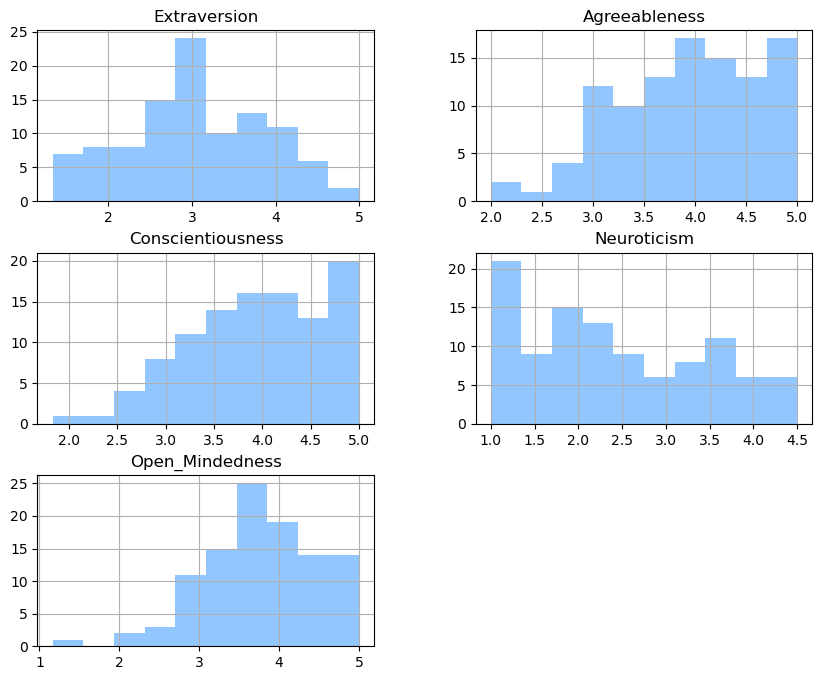

In [49]:
big5_df_final.hist(figsize=(10,8))

In [50]:
big5_df_final.iloc[:,1:].corr()

,Extraversion,Agreeableness,Conscientiousness,Neuroticism,Open_Mindedness
Extraversion,1.000000,0.130244,0.356257,-0.471949,0.171136
Agreeableness,0.130244,1.000000,0.347496,-0.373241,-0.023883
Conscientiousness,0.356257,0.347496,1.000000,-0.544333,0.089948
Neuroticism,-0.471949,-0.373241,-0.544333,1.000000,-0.052281
Open_Mindedness,0.171136,-0.023883,0.089948,-0.052281,1.000000


In [51]:
big5_df_cronbach = big5_df.iloc[:,:30]
big5_df_cronbach.head()

,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30
10,2,4,3,2,2,4,3,3,3,3,5,5,4,1,4,4,5,2,3,4,3,4,5,2,3,4,3,4,2,2
11,4,4,4,4,4,4,4,4,1,5,4,4,5,2,4,5,1,4,2,4,4,4,4,1,4,2,2,4,1,4
12,4,5,5,2,2,5,2,4,2,2,3,4,5,2,4,5,2,5,2,2,4,4,5,1,5,4,2,4,2,4
13,3,4,3,5,5,3,3,2,4,4,3,3,4,4,4,3,3,2,4,4,3,4,4,3,4,4,3,3,4,4
14,2,5,2,4,4,4,5,2,4,5,4,2,5,2,4,2,5,4,2,4,4,5,4,2,4,2,4,4,2,4


In [52]:
# Define the items for each Big Five trait
big5_items = {
    'Extraversion': ['1', '6', '11', '16', '21', '26'],
    'Agreeableness': ['2', '7', '12', '17', '22', '27'],
    'Conscientiousness': ['3', '8', '13', '18', '23', '28'],
    'Neuroticism': ['4', '9', '14', '19', '24', '29'],
    'Open_Mindedness': ['5', '10', '15', '20', '25', '30']
}

cronbach_alphas = {}

for trait, items in big5_items.items():
    # Select the columns for the current trait
    trait_data = big5_df_cronbach[items]
    
    # Calculate Cronbach's alpha
    alpha = pg.cronbach_alpha(data=trait_data)
    
    # Store the result
    cronbach_alphas[trait] = alpha[0]  # alpha[0] contains the alpha value

# Print the results
print("Cronbach's Alpha for Big Five Traits:")
for trait, alpha in cronbach_alphas.items():
    print(f"{trait}: {alpha:.3f}")

Cronbach's Alpha for Big Five Traits:
Extraversion: 0.757
Agreeableness: 0.768
Conscientiousness: 0.802
Neuroticism: 0.874
Open_Mindedness: 0.725


# **Analysis**

In [53]:
# redefine for clarity
big5_types = ['OP', 'CO', 'EX', 'AG']

In [54]:
big5_lookup = {'OP': 'Open_Mindedness' ,
               'CO' : 'Conscientiousness',
               'EX': 'Extraversion',
               'AG': 'Agreeableness'}

## **Study2a**

In [55]:
# Set the working directory dynamically
notebook_dir = os.path.dirname(os.path.abspath('__file__'))
project_root = os.path.abspath(os.path.join(notebook_dir, '..'))
study2_dir = os.path.join(project_root, 'study2')
os.chdir(study2_dir)

# Print current directory
print(f"Current working directory: {os.getcwd()}")

Current working directory: c:\Users\Ryo\OneDrive\Desktop\Master Thesis\master_thesis\study2


### Funcitons

In [56]:
def qqplot_with_confidence(data, ax=None, dist='norm', confidence=0.95):
    if ax is None:
        fig, ax = plt.subplots(figsize=(10, 8))
    
    # Create Q-Q plot using Pingouin
    ax = pg.qqplot(data, dist=dist, confidence=confidence, ax=ax)
    
    # Customize the plot
    ax.set_title('Q-Q Plot with 95% Confidence Interval', fontsize=14)
    ax.set_xlabel('Theoretical Quantiles', fontsize=12)
    ax.set_ylabel('Sample Quantiles', fontsize=12)
    
    # Modify colors and styles
    for line in ax.lines:
        if line.get_linestyle() == '-':  # This is the 45-degree reference line
            line.set_color('#0000FF')
            line.set_linewidth(1.5)
        elif line.get_linestyle() == '--':  # These are the confidence interval lines
            line.set_color('lightgrey')
            line.set_linewidth(1)
    
    # Modify scatter points
    scatter = ax.collections[0]
    scatter.set_facecolor('grey')
    scatter.set_edgecolor('grey')
    scatter.set_alpha(0.7)
    
    # Remove the R² text
    # ax.texts = []
    
    # Set background grid
    ax.grid(True, linestyle=':', alpha=0.6)
    ax.set_axisbelow(True)
    
    return ax

def check_regression_assumptions(model, X, y):
    assumption_results = {}
    
    is_ols = isinstance(model, sm.regression.linear_model.RegressionResultsWrapper)
    
    if is_ols:
        # Checks for OLS model
        # 1. Linearity (Rainbow test)
        rainbow_statistic, rainbow_p_value = linear_rainbow(model)
        assumption_results['rainbow_p_value'] = rainbow_p_value
        print(f"Rainbow test for linearity - statistic: {rainbow_statistic:.4f}, p-value: {rainbow_p_value:.4f}")
        
        # 2. Independence of errors (Durbin-Watson test)
        dw_statistic = durbin_watson(model.resid)
        assumption_results['durbin_watson'] = dw_statistic
        print(f"Durbin-Watson statistic: {dw_statistic:.4f}")
        
        # 3. Homoscedasticity (Breusch-Pagan test)
        _, pvalue, _, _ = het_breuschpagan(model.resid, model.model.exog)
        assumption_results['het_breuschpagan'] = pvalue
        print(f"Breusch-Pagan test p-value: {pvalue:.4f}")
        
        # 6. Influential outliers (Cook's distance)
        influence = OLSInfluence(model)
        cooks_d = influence.cooks_distance[0]
        assumption_results['cooks_distance'] = cooks_d
        n = len(X)
        influential = cooks_d > 4/n
        print(f"\nNumber of influential points (Cook's distance > 4/n): {sum(influential)}")
    
    # Checks applicable to both OLS and Robust Regression
    # 4. Normality of residuals (Shapiro-Wilk test)
    _, p_value = stats.shapiro(model.resid)
    assumption_results['shapiro_p_value'] = p_value
    print(f"Shapiro-Wilk test p-value: {p_value:.4f}")
    
    # Q-Q plot for normality with confidence intervals
    plt.figure(figsize=(10, 8))
    qqplot_with_confidence(model.resid)
    plt.show()
    
    # 5. Multicollinearity (VIF)
    vif_data = pd.DataFrame()
    vif_data['Variable'] = X.columns
    vif_data['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
    assumption_results['vif_data'] = vif_data
    print("\nVariance Inflation Factors:")
    print(vif_data)
    
    return assumption_results

In [57]:
def fit_OLS_and_draw_plot(input_df, 
                          output_list_for_OLS, 
                          output_list_for_plots, 
                          exclude_influential=False,
                          use_quadratic=False,
                          use_composite_scores=False,
                          study='a',
                          use_ridge=False,
                          alpha=1.0):
    if use_composite_scores:
        big5_types_to_use = ['mean']
    else:
        big5_types_to_use = big5_types

    for big5_type in big5_types_to_use:
        if use_composite_scores:
            y = input_df[y_target_constract]
            suffix = ''
        else:
            y = input_df[y_target_constract + '_' + big5_type]
            suffix = '_' + big5_type
        
        X_processed = X.copy()
        
        if use_quadratic:
            if study == 'a':
                pp_col = f'perceived_personalization_{big5_type}'
                X_processed[f'{pp_col}_squared'] = X_processed[pp_col] ** 2
            else:
                pp_col = f'chat_perceived_personalization{suffix}'
                X_processed[f'{pp_col}_squared'] = X_processed[pp_col] ** 2
        
        if use_ridge:
            # Prepare the data
            scaler = StandardScaler()
            X_scaled = pd.DataFrame(scaler.fit_transform(X_processed), columns=X_processed.columns, index=X_processed.index)
            
            # Perform Ridge regression with cross-validation
            alphas = np.logspace(-6, 6, 13)
            ridge_cv = RidgeCV(alphas=alphas, store_cv_values=True, fit_intercept=True)
            ridge_cv.fit(X_scaled, y)
            
            # Get the best alpha
            best_alpha = ridge_cv.alpha_
            
            # Make predictions
            y_pred_ridge = ridge_cv.predict(X_scaled)
            
            # Calculate R-squared using the same method as in the attached code
            r_squared_ridge = calculate_r_squared(y, y_pred_ridge)
            
            # Bootstrap for Ridge CI
            coef_samples = bootstrap_ridge(X_scaled, y, n_iterations=1000, alpha=best_alpha)
            ci_lower = np.percentile(coef_samples, 2.5, axis=0)
            ci_upper = np.percentile(coef_samples, 97.5, axis=0)
            
            print(f"\n{'-'*50}\n{y_target_constract}{suffix} (Ridge Regression)\n{'-'*50}")
            print(f"Ridge R-squared: {r_squared_ridge:.4f} (best alpha={best_alpha:.4f})")
            
            # Print coefficients
            print("\nRidge Coefficients:")
            for i, (name, coef) in enumerate(zip(['const'] + list(X_processed.columns), np.insert(ridge_cv.coef_, 0, ridge_cv.intercept_))):
                ci_l, ci_u = ci_lower[i], ci_upper[i]
                print(f"{name}: {coef:.4f} (95% CI: [{ci_l:.4f}, {ci_u:.4f}])")
            
            # Create a results object (similar to OLS results)
            results_full = type('RidgeResults', (), {
                'params': np.insert(ridge_cv.coef_, 0, ridge_cv.intercept_),
                'conf_int': lambda: np.column_stack((ci_lower, ci_upper)),
                'rsquared': r_squared_ridge,
                'pvalues': np.full(len(ridge_cv.coef_) + 1, np.nan),  # Ridge doesn't provide p-values
                'summary': lambda: print(f"R-squared: {r_squared_ridge:.4f}\nBest alpha: {best_alpha:.4f}")
            })
            
            output_list_for_OLS.append((results_full, None))

            # Plotting (for Ridge)
            col_flag = big5_lookup[big5_type]
            plt.figure(figsize=(8, 6))
            sns.regplot(x=chat_big5_df_final[col_flag], y=y, ci=95, scatter_kws={"s": 30})
            plt.xlabel(f"Participants' {big5_type} Score")
            plt.ylabel(f"{y_target_constract}{suffix} Score")
            plt.title(f"{y_target_constract}{suffix} vs {big5_type} (Ridge, R² = {r_squared_ridge:.3f})")

            output_list_for_plots.append(plt)
            plt.show()
            
            output_list_for_OLS.append((results_full, None))
        else:
            # Original OLS code (unchanged)
            X_with_const = sm.add_constant(X_processed)
            model_full = sm.OLS(y, X_with_const)
            results_full = model_full.fit()
            
            # Calculate R-squared using the same method as Ridge
            y_pred_ols = results_full.predict(X_with_const)
            r_squared_ols = calculate_r_squared(y, y_pred_ols)
            
            print(f"\n{'-'*50}\n{y_target_constract}{suffix} ({'Quadratic' if use_quadratic else 'Linear'} Model)\n{'-'*50}")
            print(results_full.summary())
            print(f"Manually calculated R-squared: {r_squared_ols:.4f}")
            
            # Check regression assumptions and store results
            results_full.assumption_results = check_regression_assumptions(results_full, X_with_const, y)
            
            if exclude_influential and sum(results_full.assumption_results['cooks_distance'] > 4/len(X_with_const)) > 0:
                # Fit the model excluding influential points
                influential = results_full.assumption_results['cooks_distance'] > 4/len(X_with_const)
                X_filtered = X_with_const[~influential]
                y_filtered = y[~influential]
                
                model_filtered = sm.OLS(y_filtered, X_filtered)
                results_filtered = model_filtered.fit()
                
                # Calculate R-squared for filtered model
                y_pred_filtered = results_filtered.predict(X_filtered)
                r_squared_filtered = calculate_r_squared(y_filtered, y_pred_filtered)
                
                print(f"\n{'-'*50}\n{y_target_constract}{suffix} (Excluding Influential Points)\n{'-'*50}")
                print(results_filtered.summary())
                print(f"Manually calculated R-squared (filtered): {r_squared_filtered:.4f}")
                
                # Check assumptions for the filtered model
                print("\nAssumption checks for the filtered model:")
                results_filtered.assumption_results = check_regression_assumptions(results_filtered, X_filtered, y_filtered)
                
                # Append both results
                output_list_for_OLS.append((results_full, results_filtered))
            else:
                output_list_for_OLS.append((results_full, None))
        
        # Visualizing (only for OLS)
        if not use_ridge:
            for construct in X_target_constructs:
                col = construct + suffix
                if construct != y_target_constract:
                    p_value = results_full.pvalues[col]
                    coef = results_full.params[col]
                    r_squared = r_squared_ols  # Use manually calculated R-squared
                    f_pvalue = results_full.f_pvalue
                    
                    plt.figure(figsize=(7, 7))
                    
                    if use_quadratic and 'perceived_personalization' in construct:
                        sns.regplot(x=X_processed[col], y=y, ci=95, scatter_kws={"s": 30}, order=2)
                    else:
                        sns.regplot(x=X_processed[col], y=y, ci=95, scatter_kws={"s": 30})
                    
                    plt.xlabel(f"{col} Score")
                    plt.ylabel(f"{y_target_constract}{suffix} Score")
                    plt.title(f"{y_target_constract}{suffix} vs {construct}{suffix}")
                    
                    # Add annotations
                    plt.annotate(f"R² = {r_squared:.3f}\np-value = {f_pvalue:.3f}\n{construct} coef = {coef:.3f} (p = {p_value:.3f})", 
                                xy=(0.05, 0.95), xycoords='axes fraction',
                                ha='left', va='top',
                                bbox=dict(boxstyle='round', fc='white', ec='gray', alpha=0.8))
                    
                    output_list_for_plots.append(plt)
                    plt.show()

In [58]:
def calculate_r_squared(y_true, y_pred):
    ss_total = np.sum((y_true - np.mean(y_true))**2)
    ss_residual = np.sum((y_true - y_pred)**2)
    r_squared = 1 - (ss_residual / ss_total)
    return r_squared

def bootstrap_ridge(X, y, n_iterations=1000, alpha=1.0):
    coef_samples = []
    for _ in range(n_iterations):
        indices = resample(X.index)
        X_resampled, y_resampled = X.loc[indices], y.loc[indices]
        ridge = Ridge(alpha=alpha, fit_intercept=True)
        ridge.fit(X_resampled, y_resampled)
        coef_samples.append(np.insert(ridge.coef_, 0, ridge.intercept_))
    return np.array(coef_samples)


In [59]:
def extract_regression_info(results_tuple, big5_type, primary_var_str, use_quadratic=False):
    results_full, results_filtered = results_tuple
    
    def get_primary_var_info(results, primary_var_str=primary_var_str):
        primary_var = f'{primary_var_str}_{big5_type}'
        coef = results.params[primary_var]
        t_value = results.tvalues[primary_var]
        p_value = results.pvalues[primary_var]
        
        if use_quadratic:
            quadratic_var = f'{primary_var}_squared'
            quad_coef = results.params[quadratic_var]
            quad_t_value = results.tvalues[quadratic_var]
            quad_p_value = results.pvalues[quadratic_var]
            return primary_var, coef, t_value, p_value, quad_coef, quad_t_value, quad_p_value
        else:
            return primary_var, coef, t_value, p_value
    
    def get_max_vif(vif_data):
        return vif_data[vif_data['Variable'] != 'const']['VIF'].max()
    
    if use_quadratic:
        primary_var, coef, t_value, p_value, quad_coef, quad_t_value, quad_p_value = get_primary_var_info(results_full)
    else:
        primary_var, coef, t_value, p_value = get_primary_var_info(results_full)
    
    info = {
        'Trait': big5_type,
        'R Squared': results_full.rsquared,
        'Adj. R Squared': results_full.rsquared_adj,
        'F- Stats': results_full.fvalue,
        'Prob (F - Stat)': results_full.f_pvalue,
        'Primary Variable': primary_var,
        'Coef': coef,
        't-value': t_value,
        'P > |t|': p_value,
        'Linearity (Rainbow p-value)': results_full.assumption_results['rainbow_p_value'],
        'Independence (Durbin-Watson)': results_full.assumption_results['durbin_watson'],
        'Homoscedasticity (BP p-value)': results_full.assumption_results['het_breuschpagan'],
        'Normality (Shapiro-Wilk p-value)': results_full.assumption_results['shapiro_p_value'],
        'Max VIF': get_max_vif(results_full.assumption_results['vif_data']),
        'Influential Points': sum(results_full.assumption_results['cooks_distance'] > 4/len(results_full.model.exog))
    }
    
    if use_quadratic:
        info.update({
            'Quadratic Coef': quad_coef,
            'Quadratic t-value': quad_t_value,
            'Quadratic P > |t|': quad_p_value
        })
    
    if results_filtered is not None:
        if use_quadratic:
            filtered_primary_var, filtered_coef, filtered_t_value, filtered_p_value, filtered_quad_coef, filtered_quad_t_value, filtered_quad_p_value = get_primary_var_info(results_filtered)
        else:
            filtered_primary_var, filtered_coef, filtered_t_value, filtered_p_value = get_primary_var_info(results_filtered)
        
        filtered_info = {
            'Filtered R Squared': results_filtered.rsquared,
            'Filtered Adj. R Squared': results_filtered.rsquared_adj,
            'Filtered F- Stats': results_filtered.fvalue,
            'Filtered Prob (F - Stat)': results_filtered.f_pvalue,
            'Filtered Coef': filtered_coef,
            'Filtered t-value': filtered_t_value,
            'Filtered P > |t|': filtered_p_value,
            'Filtered Linearity (Rainbow p-value)': results_filtered.assumption_results['rainbow_p_value'],
            'Filtered Independence (Durbin-Watson)': results_filtered.assumption_results['durbin_watson'],
            'Filtered Homoscedasticity (BP p-value)': results_filtered.assumption_results['het_breuschpagan'],
            'Filtered Normality (Shapiro-Wilk p-value)': results_filtered.assumption_results['shapiro_p_value'],
            'Filtered Max VIF': get_max_vif(results_filtered.assumption_results['vif_data']),
            'Filtered Influential Points': sum(results_filtered.assumption_results['cooks_distance'] > 4/len(results_filtered.model.exog))
        }
        
        if use_quadratic:
            filtered_info.update({
                'Filtered Quadratic Coef': filtered_quad_coef,
                'Filtered Quadratic t-value': filtered_quad_t_value,
                'Filtered Quadratic P > |t|': filtered_quad_p_value
            })
        
        info.update(filtered_info)
    
    return info

In [60]:
def save_all_regression_results(results_list, 
                                primary_var_str, 
                                file_name='regression_results.csv'):
    all_info = []
    for i, results_tuple in enumerate(results_list):
        big5_type = big5_types[i % len(big5_types)]
        info = extract_regression_info(results_tuple, big5_type, primary_var_str)
        all_info.append(info)
    
    df = pd.DataFrame(all_info)
    df.to_csv(file_name, index=False)
    print(f"Results saved to {file_name}")

### study2a data prep

In [61]:
ads_scores_df = pd.merge(ads_scores, socioecono_df, on='ResponseId', how='left')

In [62]:
ads_scores_df.head(1)

,ResponseId,perceived_personalization_OP,perceived_credibility_OP,overall_attitude_OP,ads_engagement_OP,perceived_personalization_CO,perceived_credibility_CO,overall_attitude_CO,ads_engagement_CO,perceived_personalization_EX,perceived_credibility_EX,overall_attitude_EX,ads_engagement_EX,perceived_personalization_AG,perceived_credibility_AG,overall_attitude_AG,ads_engagement_AG,gender,age,education,race,employment,income
0,r11,73,74,75,81,85,100,83,0,73,75,88,84,82,82,93,93,1,34,4,2,5,1


In [63]:
# prep
socioecono_columns = ['gender',	'age',	'education', 'race', 'employment', 'income']                               # redefine to clarify
categorical_cols = ['gender', 'education', 'race', 'employment']                                                   # define categorical variables
ads_scores_result_cols = ads_scores_df.iloc[:,1:17].columns.tolist()                                               # responses to study2a
ads_constructs = ['perceived_personalization',	'perceived_credibility', 'overall_attitude',	'ads_engagement']  # construct base names


In [64]:
ads_scores_df_dummies = pd.get_dummies(ads_scores_df[categorical_cols], columns=categorical_cols, drop_first=True)
ads_scores_df = pd.concat([ads_scores_df.drop(ads_scores_df[categorical_cols], axis = 1), ads_scores_df_dummies], axis=1)

boolean_cols = ads_scores_df.select_dtypes(include=['bool']).columns
ads_scores_df[boolean_cols] = ads_scores_df[boolean_cols].astype(int)
ads_scores_df.head(1)

,ResponseId,perceived_personalization_OP,perceived_credibility_OP,overall_attitude_OP,ads_engagement_OP,perceived_personalization_CO,perceived_credibility_CO,overall_attitude_CO,ads_engagement_CO,perceived_personalization_EX,perceived_credibility_EX,overall_attitude_EX,ads_engagement_EX,perceived_personalization_AG,perceived_credibility_AG,overall_attitude_AG,ads_engagement_AG,age,income,gender_2,education_3,education_4,education_5,education_6,race_2,race_99,employment_5,employment_6,employment_7,employment_99
0,r11,73,74,75,81,85,100,83,0,73,75,88,84,82,82,93,93,34,1,0,0,1,0,0,1,0,1,0,0,0


In [65]:
ads_id = ads_scores_df['ResponseId'].unique().tolist()
stmd_ads_scores_df = ads_scores_df.drop(ads_scores_df[ads_scores_result_cols], axis = 1)
ads_big5_df_final = pd.merge(stmd_ads_scores_df, big5_df_final, on='ResponseId', how='left')

boolean_cols = ads_big5_df_final.select_dtypes(include=['bool']).columns
ads_big5_df_final[boolean_cols] = ads_big5_df_final[boolean_cols].astype(int)
ads_big5_df_final.head(1)

,ResponseId,age,income,gender_2,education_3,education_4,education_5,education_6,race_2,race_99,employment_5,employment_6,employment_7,employment_99,Extraversion,Agreeableness,Conscientiousness,Neuroticism,Open_Mindedness
0,r11,34,1,0,0,1,0,0,1,0,1,0,0,0,3.666667,4.0,3.5,2.166667,3.0


### study2a analysis

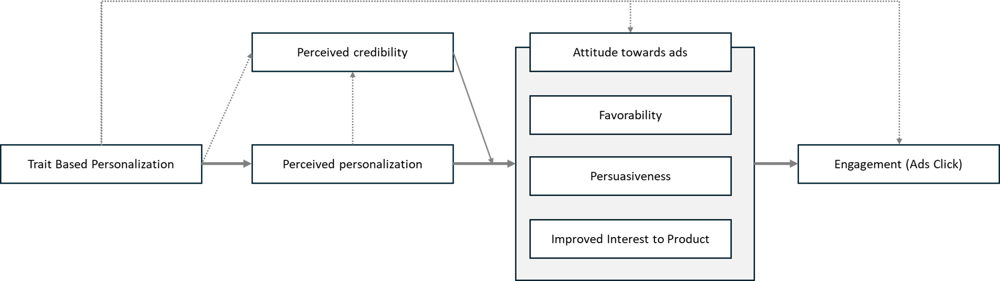

Features to be regressed:
1. [y] each of the constructs(same questions for 4 different(big5) personalized contents) vs [X] big5 scores, controlling for socioeconomic 
2. [y] 'perceived_credibility' scores for each of 4 versions vs [X] 'perceived_personalization' scores for each of 4 versions & matched big5 scores for each of 4 versions, controlling for socioeconomic 
3. [y] 'overall_attitude' scores for each of 4 versions vs [X] 'perceived_personalization' scores for each of 4 versions & (moderator) 'perceived_credibility' scores for each of 4 versions & matched big5 scores for each of 4 versions, controlling for socioeconomic 
4. [y] 'ads_engagement' scores for each of 4 versions vs [X] 'overall_attitude' scores for each of 4 versions & matched big5 scores for each of 4 versions, controlling for socioeconomic 

#### Study2a.1

Study2a.1: [y] each of the constructs(same questions for 4 different(big5) personalized contents) vs [X] big5 scores, controlling for socioeconomic 

[perceived_personalization] Generate (1) scatter plot with fitted line with 95% CI and (2) OLS summary for each of the followings:
- ads_scores_df['perceived_personalization_OP'] vs ads_big5_df_final['Open_Mindedness'], controlling for socio economic
- ads_scores_df['perceived_personalization_CO'] vs ads_big5_df_final['Conscientiousness'], controlling for socio economic
- ads_scores_df['perceived_personalization_EX'] vs ads_big5_df_final['Extraversion'], controlling for socio economic
- ads_scores_df['perceived_personalization_AG'] vs ads_big5_df_final['Agreeableness'], controlling for socio economic

[perceived_credibility] Generate (1) scatter plot with fitted line with 95% CI and (2) OLS summary for each of the followings:
- ads_scores_df['perceived_credibility_OP'] vs ads_big5_df_final['Open_Mindedness'], controlling for socio economic
- ads_scores_df['perceived_credibility_CO'] vs ads_big5_df_final['Conscientiousness'], controlling for socio economic
- ads_scores_df['perceived_credibility_EX'] vs ads_big5_df_final['Extraversion'], controlling for socio economic
- ads_scores_df['perceived_credibility_AG'] vs ads_big5_df_final['Agreeableness'], controlling for socio economic

[overall_attitude] Generate (1) scatter plot with fitted line with 95% CI and (2) OLS summary for each of the followings:
- ads_scores_df['overall_attitude_OP'] vs ads_big5_df_final['Open_Mindedness'], controlling for socio economic
- ads_scores_df['overall_attitude_CO'] vs ads_big5_df_final['Conscientiousness'], controlling for socio economic
- ads_scores_df['overall_attitude_EX'] vs ads_big5_df_final['Extraversion'], controlling for socio economic
- ads_scores_df['overall_attitude_AG'] vs ads_big5_df_final['Agreeableness'], controlling for socio economic

[ads_engagement] Generate (1) scatter plot with fitted line with 95% CI and (2) OLS summary for each of the followings:
- ads_scores_df['ads_engagement_OP'] vs ads_big5_df_final['Open_Mindedness'], controlling for socio economic
- ads_scores_df['ads_engagement_CO'] vs ads_big5_df_final['Conscientiousness'], controlling for socio economic
- ads_scores_df['ads_engagement_EX'] vs ads_big5_df_final['Extraversion'], controlling for socio economic
- ads_scores_df['ads_engagement_AG'] vs ads_big5_df_final['Agreeableness'], controlling for socio economic

In [66]:
ads_big5_df_final.tail()

,ResponseId,age,income,gender_2,education_3,education_4,education_5,education_6,race_2,race_99,employment_5,employment_6,employment_7,employment_99,Extraversion,Agreeableness,Conscientiousness,Neuroticism,Open_Mindedness
99,r128,27,1,1,0,1,0,0,1,0,0,0,0,0,3.333333,3.000000,3.166667,3.666667,4.166667
100,r129,30,5,1,0,0,0,0,0,0,0,1,0,0,3.500000,4.833333,4.333333,1.000000,3.000000
101,r131,55,11,1,0,0,1,0,1,0,0,0,0,1,3.666667,4.833333,4.333333,1.166667,4.666667
102,r133,43,12,0,0,0,1,0,1,0,0,0,1,0,3.833333,4.000000,4.666667,1.666667,4.000000
103,r134,43,8,1,0,0,1,0,1,0,0,0,1,0,4.500000,4.666667,5.000000,1.333333,3.166667


In [67]:
ads_big5_df_final.columns

Index(['ResponseId', 'age', 'income', 'gender_2', 'education_3', 'education_4',
       'education_5', 'education_6', 'race_2', 'race_99', 'employment_5',
       'employment_6', 'employment_7', 'employment_99', 'Extraversion',
       'Agreeableness', 'Conscientiousness', 'Neuroticism', 'Open_Mindedness'],
      dtype='object')

In [68]:
ads_scores_df.columns

Index(['ResponseId', 'perceived_personalization_OP',
       'perceived_credibility_OP', 'overall_attitude_OP', 'ads_engagement_OP',
       'perceived_personalization_CO', 'perceived_credibility_CO',
       'overall_attitude_CO', 'ads_engagement_CO',
       'perceived_personalization_EX', 'perceived_credibility_EX',
       'overall_attitude_EX', 'ads_engagement_EX',
       'perceived_personalization_AG', 'perceived_credibility_AG',
       'overall_attitude_AG', 'ads_engagement_AG', 'age', 'income', 'gender_2',
       'education_3', 'education_4', 'education_5', 'education_6', 'race_2',
       'race_99', 'employment_5', 'employment_6', 'employment_7',
       'employment_99'],
      dtype='object')

In [69]:
X = ads_big5_df_final.iloc[:,1:]

continuous_columns = []
dummy_columns = []

for col in X.columns:
    if 'race_' in col or 'employment_' in col or 'gender_' in col or 'education_' in col:
        dummy_columns.append(col)
    else:
        continuous_columns.append(col)

scaler = StandardScaler()
X_continuous_scaled = scaler.fit_transform(X[continuous_columns])
X_continuous_scaled = pd.DataFrame(X_continuous_scaled, columns=continuous_columns)
X_scaled = pd.concat([X_continuous_scaled, X[dummy_columns].reset_index(drop=True)], axis=1)

X = sm.add_constant(X_scaled)


--------------------------------------------------
perceived_personalization OP (OLS Model)
--------------------------------------------------
                                 OLS Regression Results                                 
Dep. Variable:     perceived_personalization_OP   R-squared:                       0.250
Model:                                      OLS   Adj. R-squared:                  0.091
Method:                           Least Squares   F-statistic:                     1.572
Date:                          Mon, 09 Sep 2024   Prob (F-statistic):             0.0861
Time:                                  15:47:08   Log-Likelihood:                -483.34
No. Observations:                           104   AIC:                             1005.
Df Residuals:                                85   BIC:                             1055.
Df Model:                                    18                                         
Covariance Type:                      nonrobust        

<Figure size 1000x800 with 0 Axes>

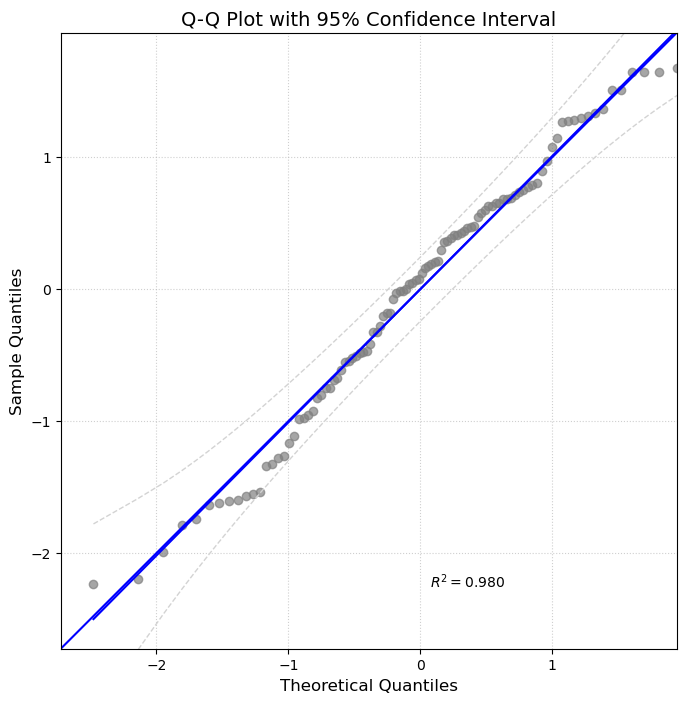


Variance Inflation Factors:
             Variable        VIF
0               const  20.916584
1                 age   1.286787
2              income   1.676433
3        Extraversion   1.557372
4       Agreeableness   1.474634
5   Conscientiousness   1.908142
6         Neuroticism   2.539991
7     Open_Mindedness   1.219343
8            gender_2   1.867471
9         education_3   1.643520
10        education_4   2.284489
11        education_5   2.052900
12        education_6   1.260054
13             race_2   1.231170
14            race_99   1.289926
15       employment_5   2.452343
16       employment_6   2.021125
17       employment_7   4.533852
18      employment_99   2.925199


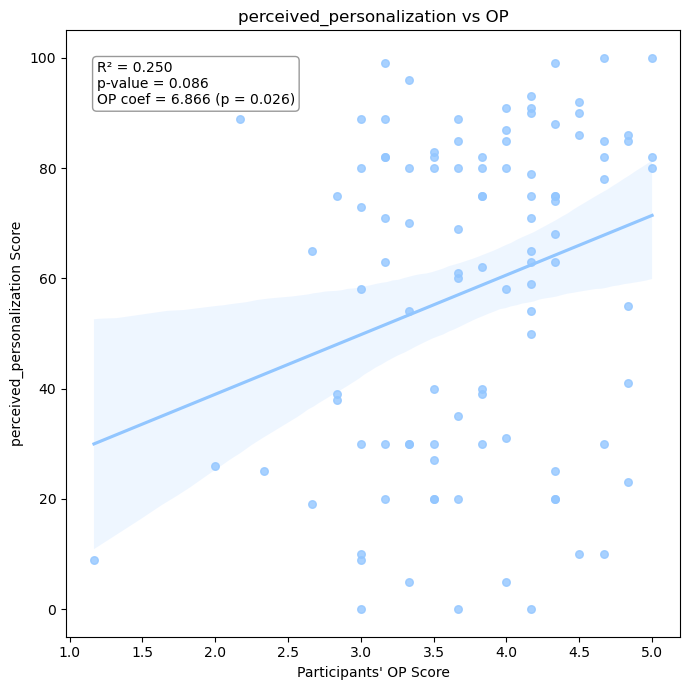


--------------------------------------------------
perceived_personalization CO (OLS Model)
--------------------------------------------------
                                 OLS Regression Results                                 
Dep. Variable:     perceived_personalization_CO   R-squared:                       0.221
Model:                                      OLS   Adj. R-squared:                  0.057
Method:                           Least Squares   F-statistic:                     1.343
Date:                          Mon, 09 Sep 2024   Prob (F-statistic):              0.183
Time:                                  15:47:09   Log-Likelihood:                -478.02
No. Observations:                           104   AIC:                             994.0
Df Residuals:                                85   BIC:                             1044.
Df Model:                                    18                                         
Covariance Type:                      nonrobust        

<Figure size 1000x800 with 0 Axes>

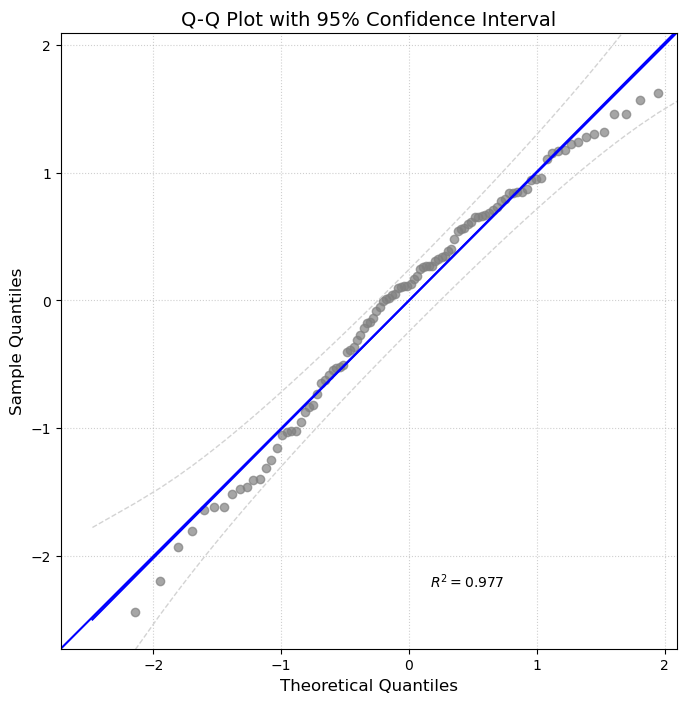


Variance Inflation Factors:
             Variable        VIF
0               const  20.916584
1                 age   1.286787
2              income   1.676433
3        Extraversion   1.557372
4       Agreeableness   1.474634
5   Conscientiousness   1.908142
6         Neuroticism   2.539991
7     Open_Mindedness   1.219343
8            gender_2   1.867471
9         education_3   1.643520
10        education_4   2.284489
11        education_5   2.052900
12        education_6   1.260054
13             race_2   1.231170
14            race_99   1.289926
15       employment_5   2.452343
16       employment_6   2.021125
17       employment_7   4.533852
18      employment_99   2.925199


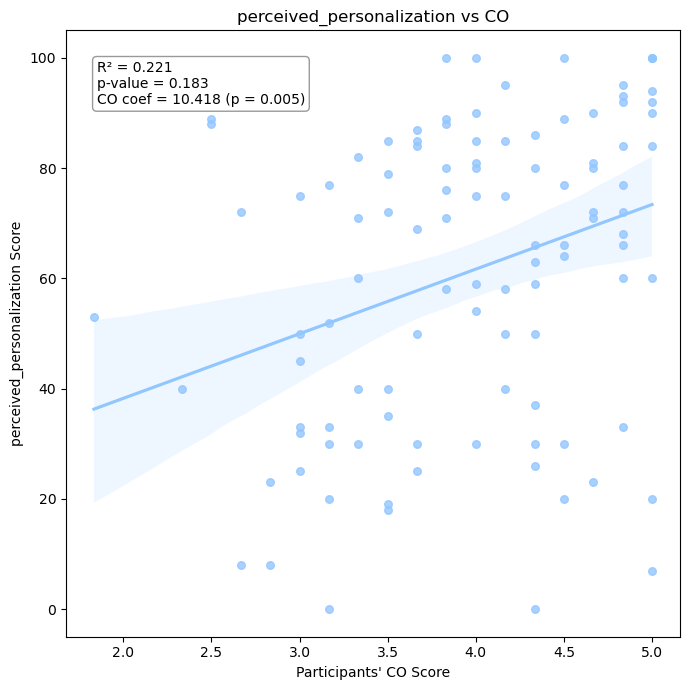


--------------------------------------------------
perceived_personalization EX (OLS Model)
--------------------------------------------------
                                 OLS Regression Results                                 
Dep. Variable:     perceived_personalization_EX   R-squared:                       0.306
Model:                                      OLS   Adj. R-squared:                  0.159
Method:                           Least Squares   F-statistic:                     2.079
Date:                          Mon, 09 Sep 2024   Prob (F-statistic):             0.0134
Time:                                  15:47:09   Log-Likelihood:                -489.55
No. Observations:                           104   AIC:                             1017.
Df Residuals:                                85   BIC:                             1067.
Df Model:                                    18                                         
Covariance Type:                      nonrobust        

<Figure size 1000x800 with 0 Axes>

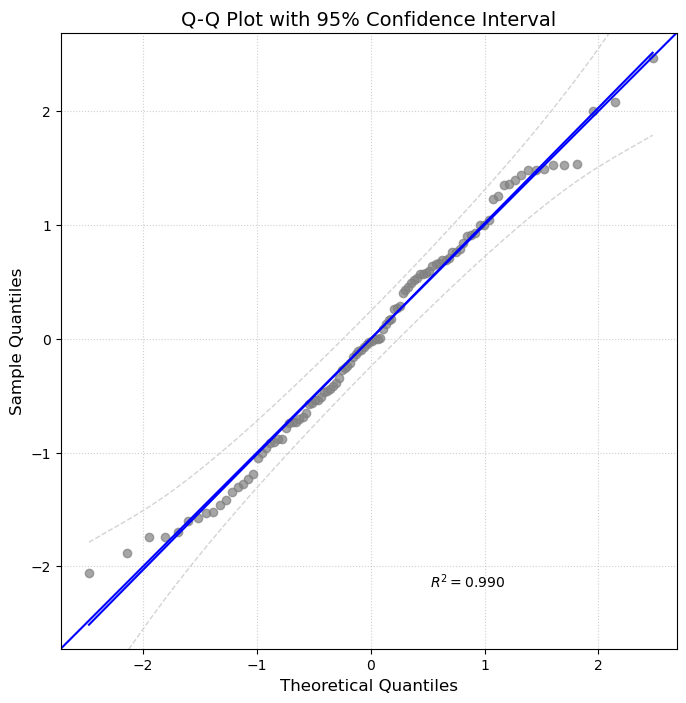


Variance Inflation Factors:
             Variable        VIF
0               const  20.916584
1                 age   1.286787
2              income   1.676433
3        Extraversion   1.557372
4       Agreeableness   1.474634
5   Conscientiousness   1.908142
6         Neuroticism   2.539991
7     Open_Mindedness   1.219343
8            gender_2   1.867471
9         education_3   1.643520
10        education_4   2.284489
11        education_5   2.052900
12        education_6   1.260054
13             race_2   1.231170
14            race_99   1.289926
15       employment_5   2.452343
16       employment_6   2.021125
17       employment_7   4.533852
18      employment_99   2.925199


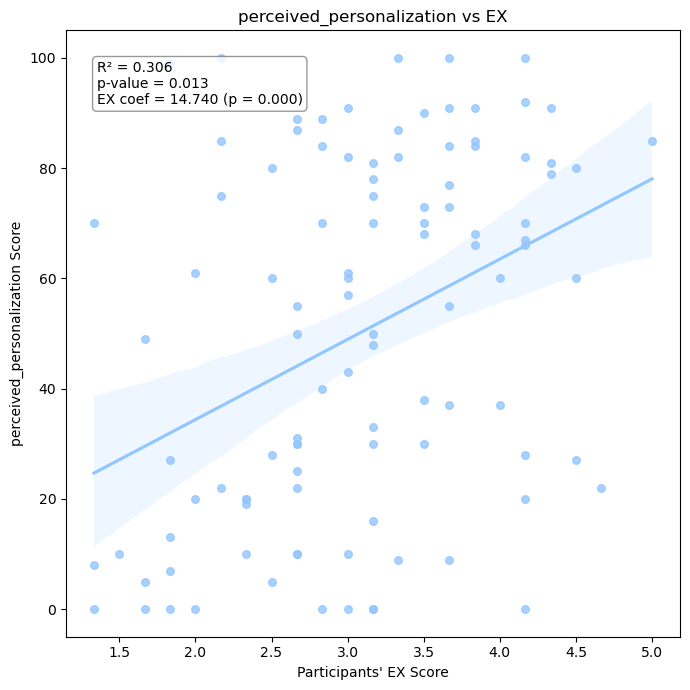


--------------------------------------------------
perceived_personalization AG (OLS Model)
--------------------------------------------------
                                 OLS Regression Results                                 
Dep. Variable:     perceived_personalization_AG   R-squared:                       0.179
Model:                                      OLS   Adj. R-squared:                  0.005
Method:                           Least Squares   F-statistic:                     1.030
Date:                          Mon, 09 Sep 2024   Prob (F-statistic):              0.436
Time:                                  15:47:10   Log-Likelihood:                -482.78
No. Observations:                           104   AIC:                             1004.
Df Residuals:                                85   BIC:                             1054.
Df Model:                                    18                                         
Covariance Type:                      nonrobust        

<Figure size 1000x800 with 0 Axes>

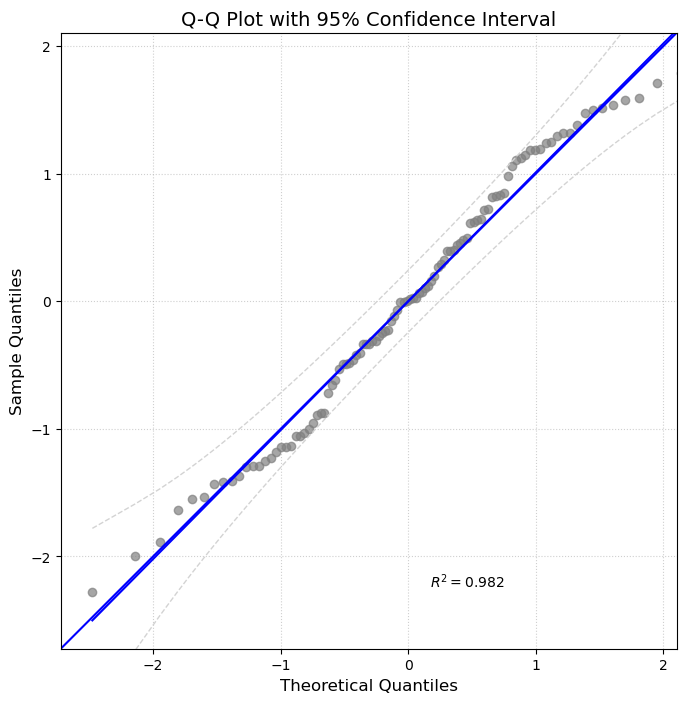


Variance Inflation Factors:
             Variable        VIF
0               const  20.916584
1                 age   1.286787
2              income   1.676433
3        Extraversion   1.557372
4       Agreeableness   1.474634
5   Conscientiousness   1.908142
6         Neuroticism   2.539991
7     Open_Mindedness   1.219343
8            gender_2   1.867471
9         education_3   1.643520
10        education_4   2.284489
11        education_5   2.052900
12        education_6   1.260054
13             race_2   1.231170
14            race_99   1.289926
15       employment_5   2.452343
16       employment_6   2.021125
17       employment_7   4.533852
18      employment_99   2.925199


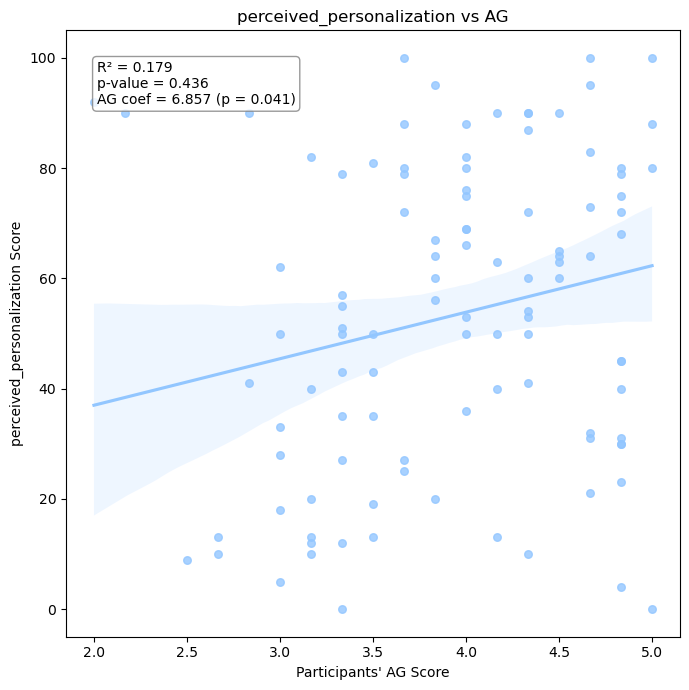


--------------------------------------------------
perceived_credibility OP (OLS Model)
--------------------------------------------------
                               OLS Regression Results                               
Dep. Variable:     perceived_credibility_OP   R-squared:                       0.136
Model:                                  OLS   Adj. R-squared:                 -0.047
Method:                       Least Squares   F-statistic:                    0.7457
Date:                      Mon, 09 Sep 2024   Prob (F-statistic):              0.755
Time:                              15:47:11   Log-Likelihood:                -470.98
No. Observations:                       104   AIC:                             980.0
Df Residuals:                            85   BIC:                             1030.
Df Model:                                18                                         
Covariance Type:                  nonrobust                                         
          

<Figure size 1000x800 with 0 Axes>

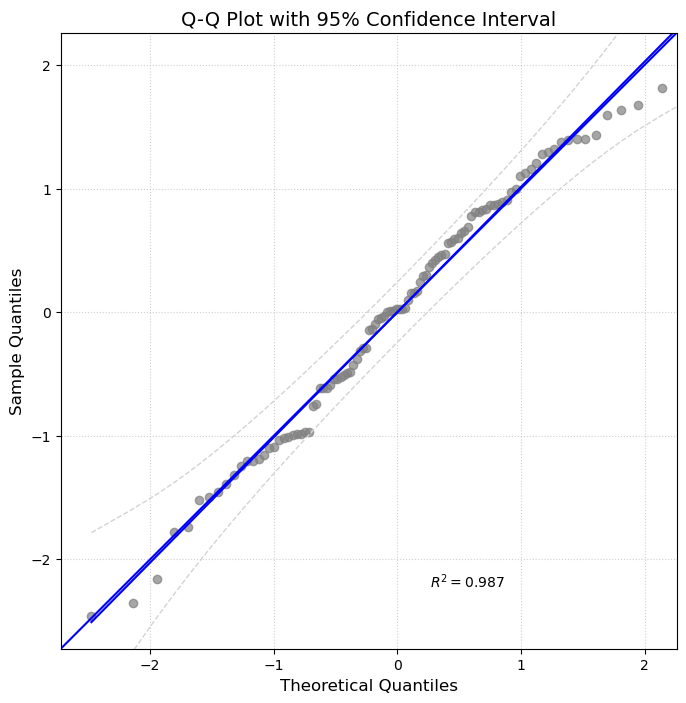


Variance Inflation Factors:
             Variable        VIF
0               const  20.916584
1                 age   1.286787
2              income   1.676433
3        Extraversion   1.557372
4       Agreeableness   1.474634
5   Conscientiousness   1.908142
6         Neuroticism   2.539991
7     Open_Mindedness   1.219343
8            gender_2   1.867471
9         education_3   1.643520
10        education_4   2.284489
11        education_5   2.052900
12        education_6   1.260054
13             race_2   1.231170
14            race_99   1.289926
15       employment_5   2.452343
16       employment_6   2.021125
17       employment_7   4.533852
18      employment_99   2.925199


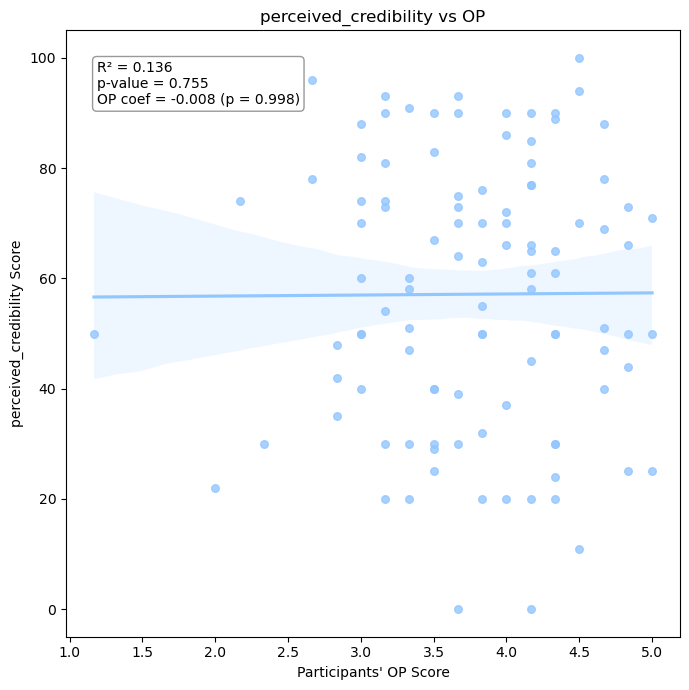


--------------------------------------------------
perceived_credibility CO (OLS Model)
--------------------------------------------------
                               OLS Regression Results                               
Dep. Variable:     perceived_credibility_CO   R-squared:                       0.222
Model:                                  OLS   Adj. R-squared:                  0.057
Method:                       Least Squares   F-statistic:                     1.348
Date:                      Mon, 09 Sep 2024   Prob (F-statistic):              0.180
Time:                              15:47:11   Log-Likelihood:                -471.75
No. Observations:                       104   AIC:                             981.5
Df Residuals:                            85   BIC:                             1032.
Df Model:                                18                                         
Covariance Type:                  nonrobust                                         
          

<Figure size 1000x800 with 0 Axes>

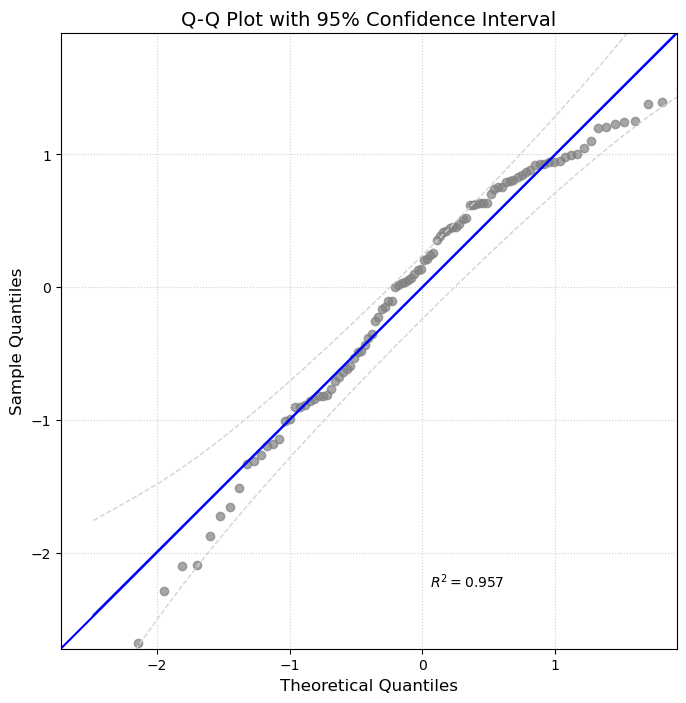


Variance Inflation Factors:
             Variable        VIF
0               const  20.916584
1                 age   1.286787
2              income   1.676433
3        Extraversion   1.557372
4       Agreeableness   1.474634
5   Conscientiousness   1.908142
6         Neuroticism   2.539991
7     Open_Mindedness   1.219343
8            gender_2   1.867471
9         education_3   1.643520
10        education_4   2.284489
11        education_5   2.052900
12        education_6   1.260054
13             race_2   1.231170
14            race_99   1.289926
15       employment_5   2.452343
16       employment_6   2.021125
17       employment_7   4.533852
18      employment_99   2.925199


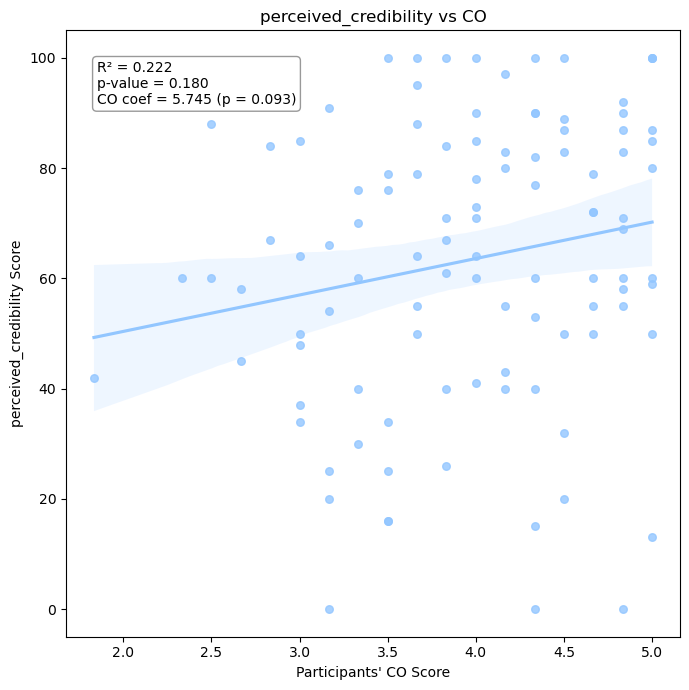


--------------------------------------------------
perceived_credibility EX (OLS Model)
--------------------------------------------------
                               OLS Regression Results                               
Dep. Variable:     perceived_credibility_EX   R-squared:                       0.216
Model:                                  OLS   Adj. R-squared:                  0.050
Method:                       Least Squares   F-statistic:                     1.301
Date:                      Mon, 09 Sep 2024   Prob (F-statistic):              0.208
Time:                              15:47:12   Log-Likelihood:                -476.95
No. Observations:                       104   AIC:                             991.9
Df Residuals:                            85   BIC:                             1042.
Df Model:                                18                                         
Covariance Type:                  nonrobust                                         
          

<Figure size 1000x800 with 0 Axes>

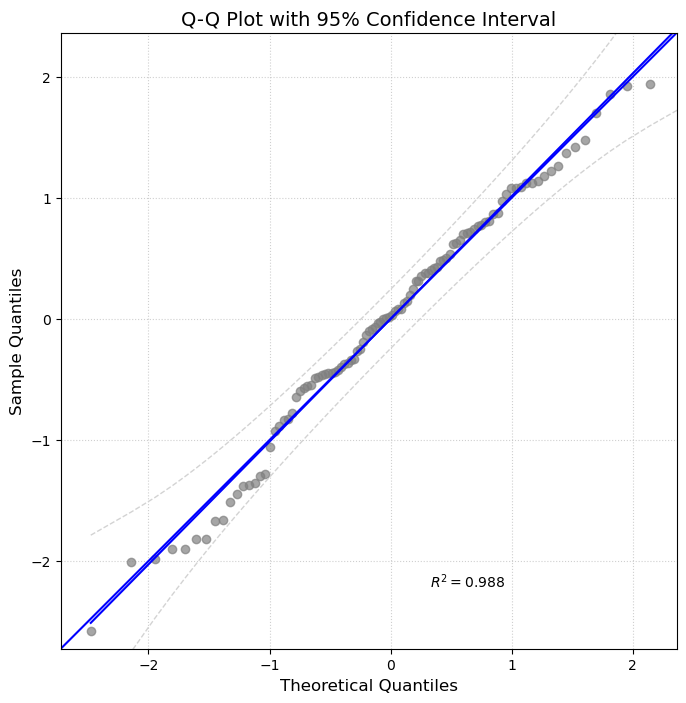


Variance Inflation Factors:
             Variable        VIF
0               const  20.916584
1                 age   1.286787
2              income   1.676433
3        Extraversion   1.557372
4       Agreeableness   1.474634
5   Conscientiousness   1.908142
6         Neuroticism   2.539991
7     Open_Mindedness   1.219343
8            gender_2   1.867471
9         education_3   1.643520
10        education_4   2.284489
11        education_5   2.052900
12        education_6   1.260054
13             race_2   1.231170
14            race_99   1.289926
15       employment_5   2.452343
16       employment_6   2.021125
17       employment_7   4.533852
18      employment_99   2.925199


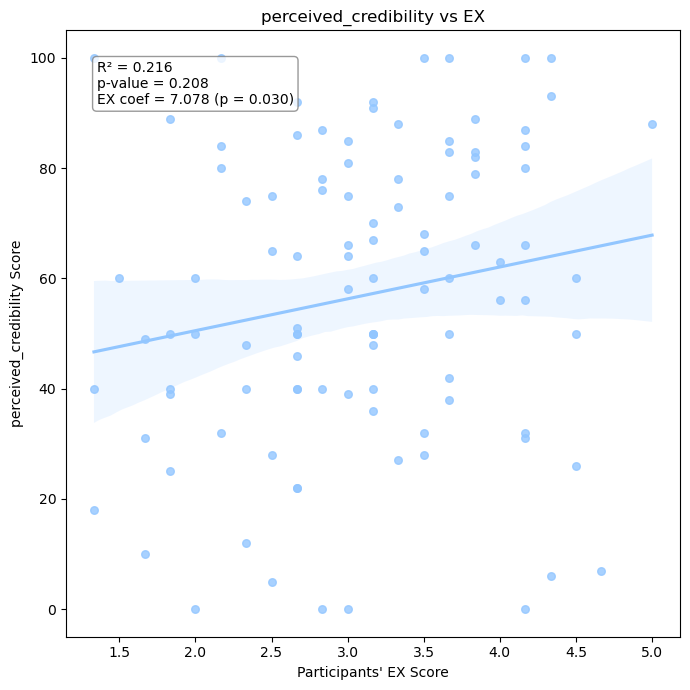


--------------------------------------------------
perceived_credibility AG (OLS Model)
--------------------------------------------------
                               OLS Regression Results                               
Dep. Variable:     perceived_credibility_AG   R-squared:                       0.165
Model:                                  OLS   Adj. R-squared:                 -0.012
Method:                       Least Squares   F-statistic:                    0.9341
Date:                      Mon, 09 Sep 2024   Prob (F-statistic):              0.541
Time:                              15:47:13   Log-Likelihood:                -469.14
No. Observations:                       104   AIC:                             976.3
Df Residuals:                            85   BIC:                             1027.
Df Model:                                18                                         
Covariance Type:                  nonrobust                                         
          

<Figure size 1000x800 with 0 Axes>

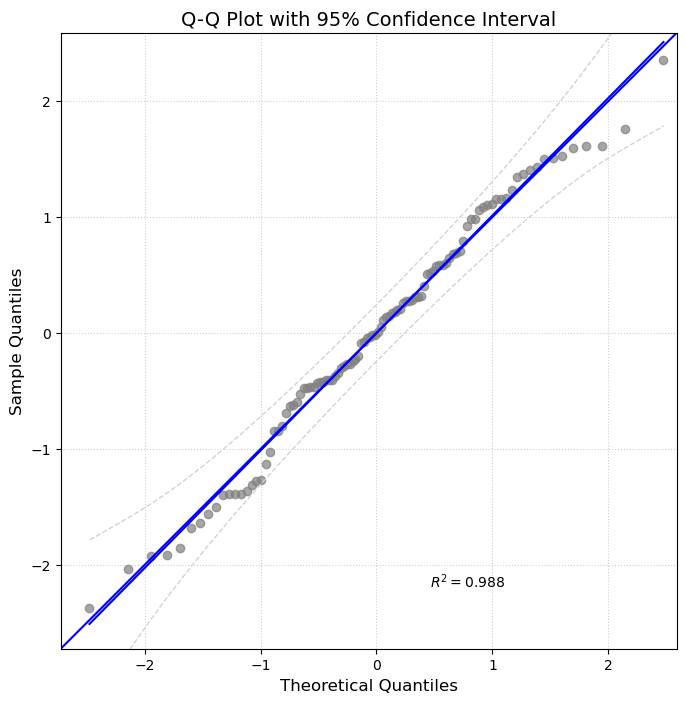


Variance Inflation Factors:
             Variable        VIF
0               const  20.916584
1                 age   1.286787
2              income   1.676433
3        Extraversion   1.557372
4       Agreeableness   1.474634
5   Conscientiousness   1.908142
6         Neuroticism   2.539991
7     Open_Mindedness   1.219343
8            gender_2   1.867471
9         education_3   1.643520
10        education_4   2.284489
11        education_5   2.052900
12        education_6   1.260054
13             race_2   1.231170
14            race_99   1.289926
15       employment_5   2.452343
16       employment_6   2.021125
17       employment_7   4.533852
18      employment_99   2.925199


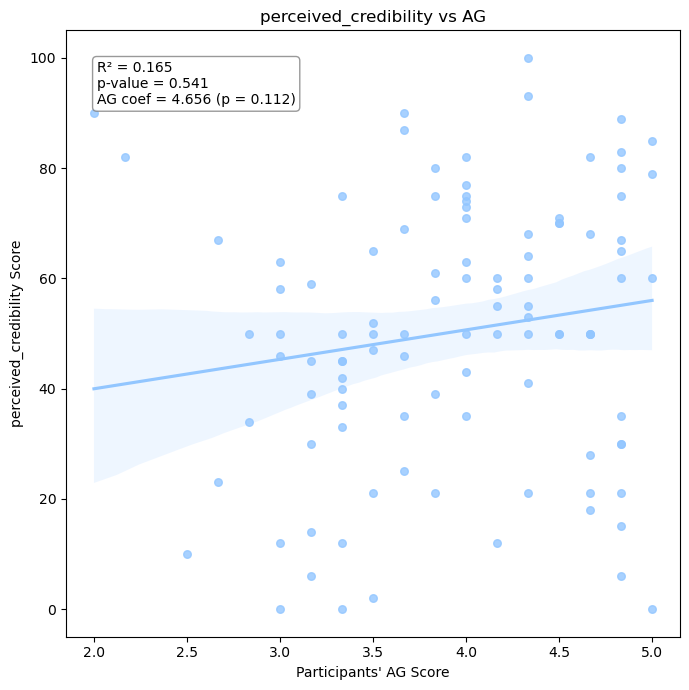


--------------------------------------------------
overall_attitude OP (OLS Model)
--------------------------------------------------
                             OLS Regression Results                            
Dep. Variable:     overall_attitude_OP   R-squared:                       0.199
Model:                             OLS   Adj. R-squared:                  0.030
Method:                  Least Squares   F-statistic:                     1.174
Date:                 Mon, 09 Sep 2024   Prob (F-statistic):              0.301
Time:                         15:47:13   Log-Likelihood:                -483.75
No. Observations:                  104   AIC:                             1005.
Df Residuals:                       85   BIC:                             1056.
Df Model:                           18                                         
Covariance Type:             nonrobust                                         
                        coef    std err          t      P>|t|    

<Figure size 1000x800 with 0 Axes>

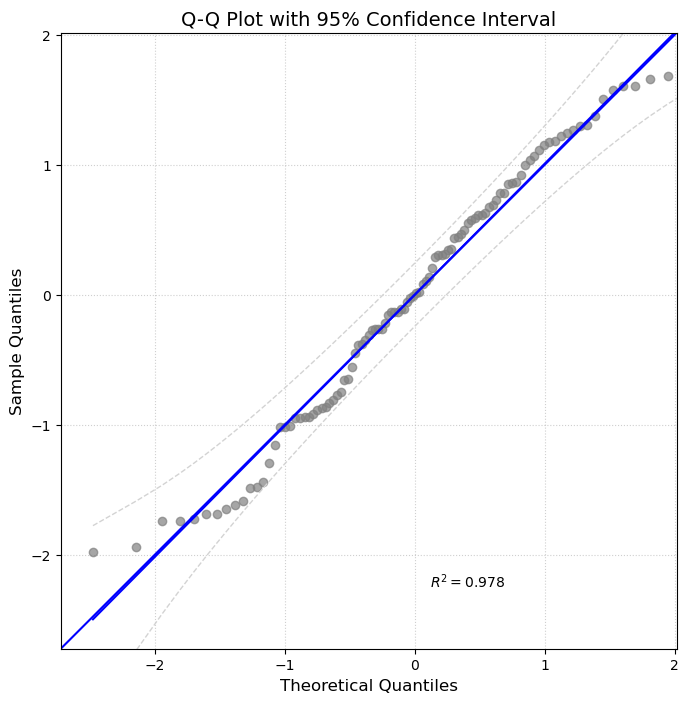


Variance Inflation Factors:
             Variable        VIF
0               const  20.916584
1                 age   1.286787
2              income   1.676433
3        Extraversion   1.557372
4       Agreeableness   1.474634
5   Conscientiousness   1.908142
6         Neuroticism   2.539991
7     Open_Mindedness   1.219343
8            gender_2   1.867471
9         education_3   1.643520
10        education_4   2.284489
11        education_5   2.052900
12        education_6   1.260054
13             race_2   1.231170
14            race_99   1.289926
15       employment_5   2.452343
16       employment_6   2.021125
17       employment_7   4.533852
18      employment_99   2.925199


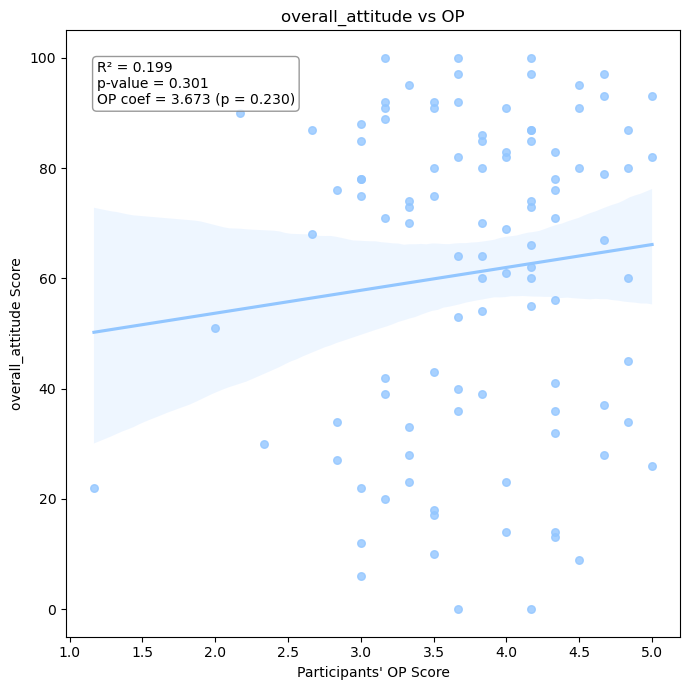


--------------------------------------------------
overall_attitude CO (OLS Model)
--------------------------------------------------
                             OLS Regression Results                            
Dep. Variable:     overall_attitude_CO   R-squared:                       0.189
Model:                             OLS   Adj. R-squared:                  0.017
Method:                  Least Squares   F-statistic:                     1.101
Date:                 Mon, 09 Sep 2024   Prob (F-statistic):              0.365
Time:                         15:47:14   Log-Likelihood:                -482.55
No. Observations:                  104   AIC:                             1003.
Df Residuals:                       85   BIC:                             1053.
Df Model:                           18                                         
Covariance Type:             nonrobust                                         
                        coef    std err          t      P>|t|    

<Figure size 1000x800 with 0 Axes>

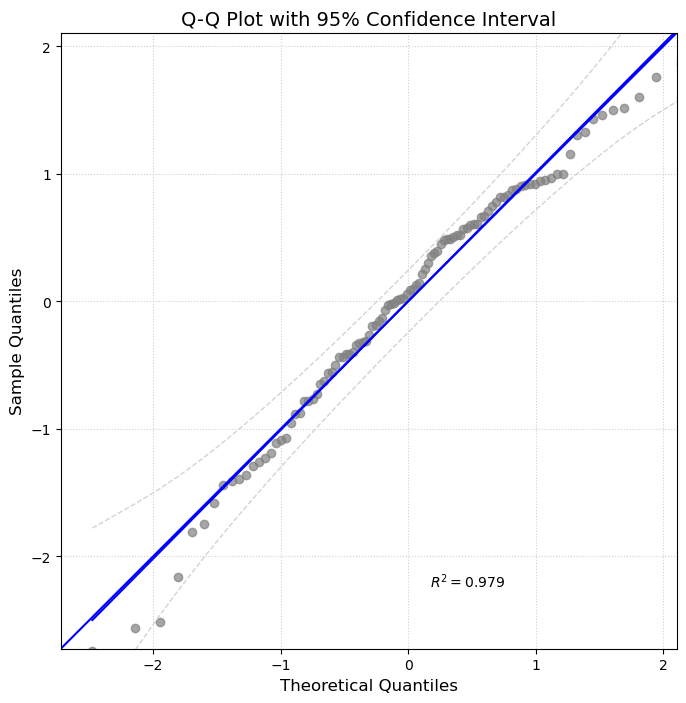


Variance Inflation Factors:
             Variable        VIF
0               const  20.916584
1                 age   1.286787
2              income   1.676433
3        Extraversion   1.557372
4       Agreeableness   1.474634
5   Conscientiousness   1.908142
6         Neuroticism   2.539991
7     Open_Mindedness   1.219343
8            gender_2   1.867471
9         education_3   1.643520
10        education_4   2.284489
11        education_5   2.052900
12        education_6   1.260054
13             race_2   1.231170
14            race_99   1.289926
15       employment_5   2.452343
16       employment_6   2.021125
17       employment_7   4.533852
18      employment_99   2.925199


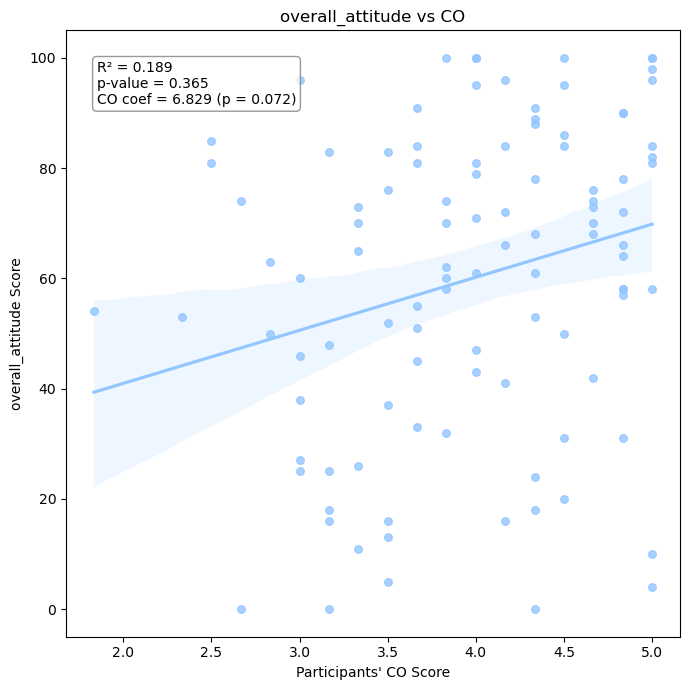


--------------------------------------------------
overall_attitude EX (OLS Model)
--------------------------------------------------
                             OLS Regression Results                            
Dep. Variable:     overall_attitude_EX   R-squared:                       0.265
Model:                             OLS   Adj. R-squared:                  0.110
Method:                  Least Squares   F-statistic:                     1.705
Date:                 Mon, 09 Sep 2024   Prob (F-statistic):             0.0539
Time:                         15:47:15   Log-Likelihood:                -486.23
No. Observations:                  104   AIC:                             1010.
Df Residuals:                       85   BIC:                             1061.
Df Model:                           18                                         
Covariance Type:             nonrobust                                         
                        coef    std err          t      P>|t|    

<Figure size 1000x800 with 0 Axes>

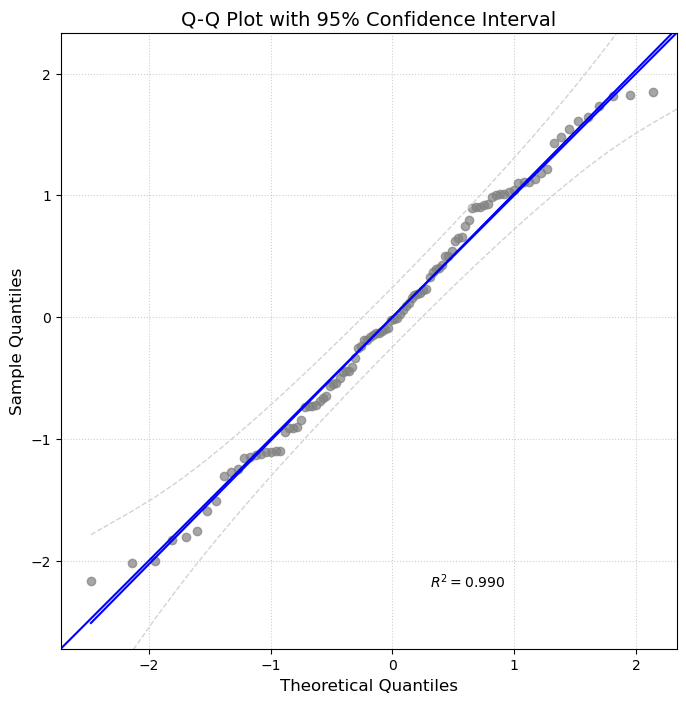


Variance Inflation Factors:
             Variable        VIF
0               const  20.916584
1                 age   1.286787
2              income   1.676433
3        Extraversion   1.557372
4       Agreeableness   1.474634
5   Conscientiousness   1.908142
6         Neuroticism   2.539991
7     Open_Mindedness   1.219343
8            gender_2   1.867471
9         education_3   1.643520
10        education_4   2.284489
11        education_5   2.052900
12        education_6   1.260054
13             race_2   1.231170
14            race_99   1.289926
15       employment_5   2.452343
16       employment_6   2.021125
17       employment_7   4.533852
18      employment_99   2.925199


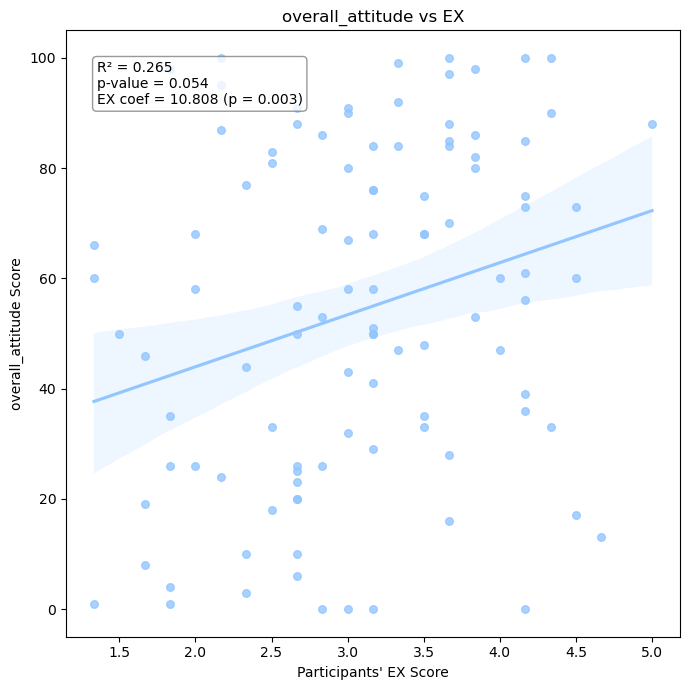


--------------------------------------------------
overall_attitude AG (OLS Model)
--------------------------------------------------
                             OLS Regression Results                            
Dep. Variable:     overall_attitude_AG   R-squared:                       0.146
Model:                             OLS   Adj. R-squared:                 -0.035
Method:                  Least Squares   F-statistic:                    0.8063
Date:                 Mon, 09 Sep 2024   Prob (F-statistic):              0.688
Time:                         15:47:16   Log-Likelihood:                -482.95
No. Observations:                  104   AIC:                             1004.
Df Residuals:                       85   BIC:                             1054.
Df Model:                           18                                         
Covariance Type:             nonrobust                                         
                        coef    std err          t      P>|t|    

<Figure size 1000x800 with 0 Axes>

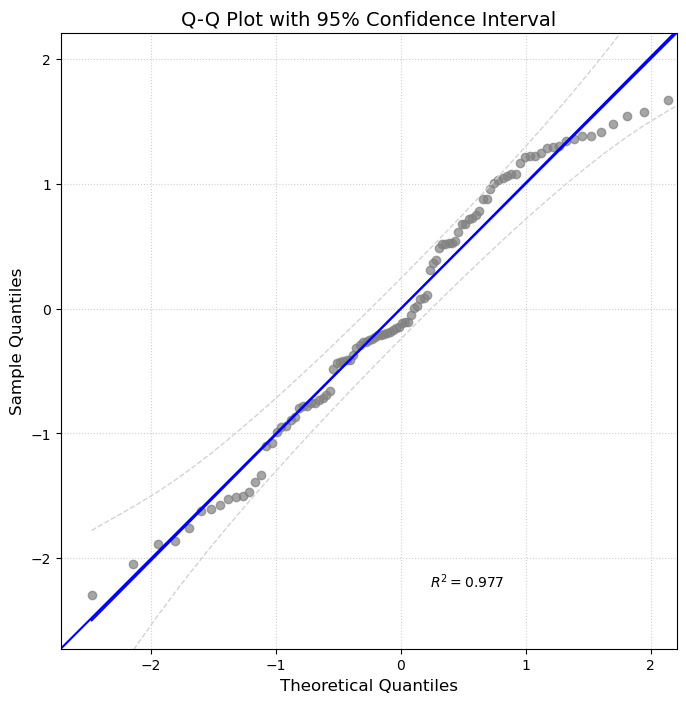


Variance Inflation Factors:
             Variable        VIF
0               const  20.916584
1                 age   1.286787
2              income   1.676433
3        Extraversion   1.557372
4       Agreeableness   1.474634
5   Conscientiousness   1.908142
6         Neuroticism   2.539991
7     Open_Mindedness   1.219343
8            gender_2   1.867471
9         education_3   1.643520
10        education_4   2.284489
11        education_5   2.052900
12        education_6   1.260054
13             race_2   1.231170
14            race_99   1.289926
15       employment_5   2.452343
16       employment_6   2.021125
17       employment_7   4.533852
18      employment_99   2.925199


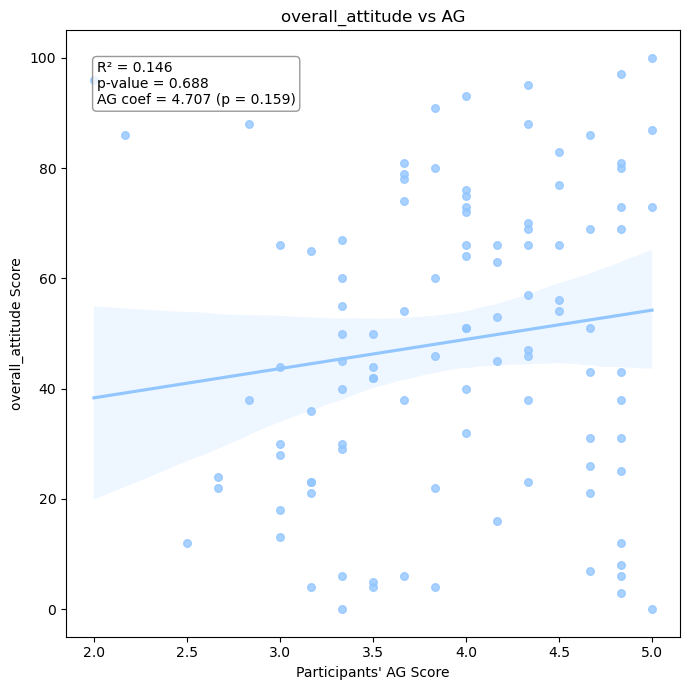


--------------------------------------------------
ads_engagement OP (OLS Model)
--------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:      ads_engagement_OP   R-squared:                       0.164
Model:                            OLS   Adj. R-squared:                 -0.013
Method:                 Least Squares   F-statistic:                    0.9251
Date:                Mon, 09 Sep 2024   Prob (F-statistic):              0.551
Time:                        15:47:17   Log-Likelihood:                -500.68
No. Observations:                 104   AIC:                             1039.
Df Residuals:                      85   BIC:                             1090.
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
                        coef    std err          t      P>|t|      [0.025    

<Figure size 1000x800 with 0 Axes>

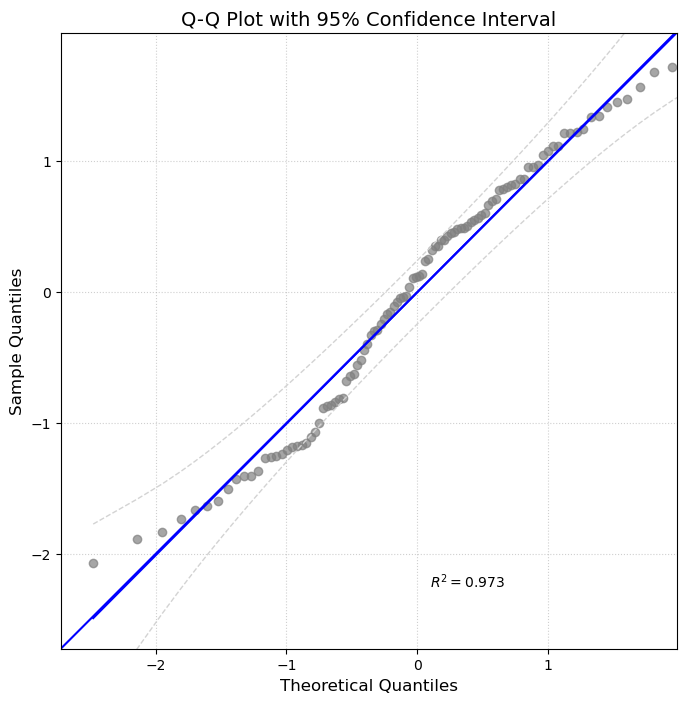


Variance Inflation Factors:
             Variable        VIF
0               const  20.916584
1                 age   1.286787
2              income   1.676433
3        Extraversion   1.557372
4       Agreeableness   1.474634
5   Conscientiousness   1.908142
6         Neuroticism   2.539991
7     Open_Mindedness   1.219343
8            gender_2   1.867471
9         education_3   1.643520
10        education_4   2.284489
11        education_5   2.052900
12        education_6   1.260054
13             race_2   1.231170
14            race_99   1.289926
15       employment_5   2.452343
16       employment_6   2.021125
17       employment_7   4.533852
18      employment_99   2.925199


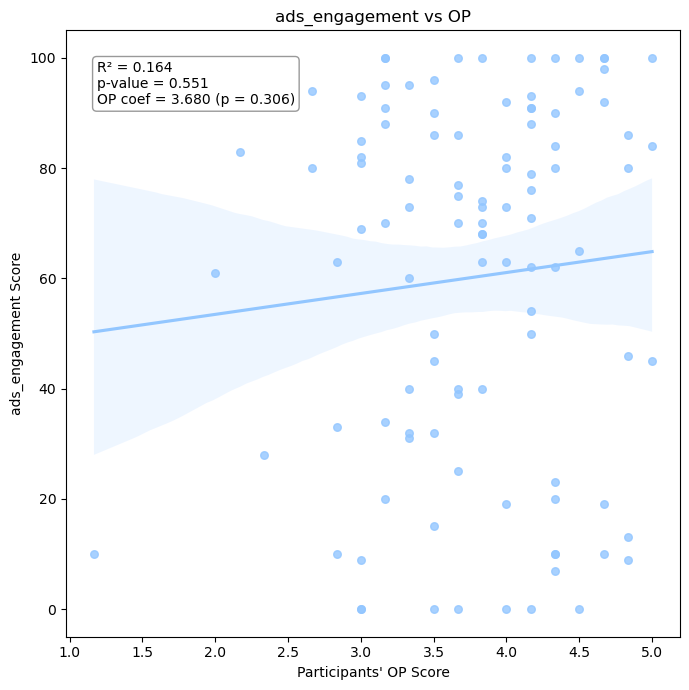


--------------------------------------------------
ads_engagement CO (OLS Model)
--------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:      ads_engagement_CO   R-squared:                       0.220
Model:                            OLS   Adj. R-squared:                  0.055
Method:                 Least Squares   F-statistic:                     1.334
Date:                Mon, 09 Sep 2024   Prob (F-statistic):              0.188
Time:                        15:47:17   Log-Likelihood:                -493.97
No. Observations:                 104   AIC:                             1026.
Df Residuals:                      85   BIC:                             1076.
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
                        coef    std err          t      P>|t|      [0.025    

<Figure size 1000x800 with 0 Axes>

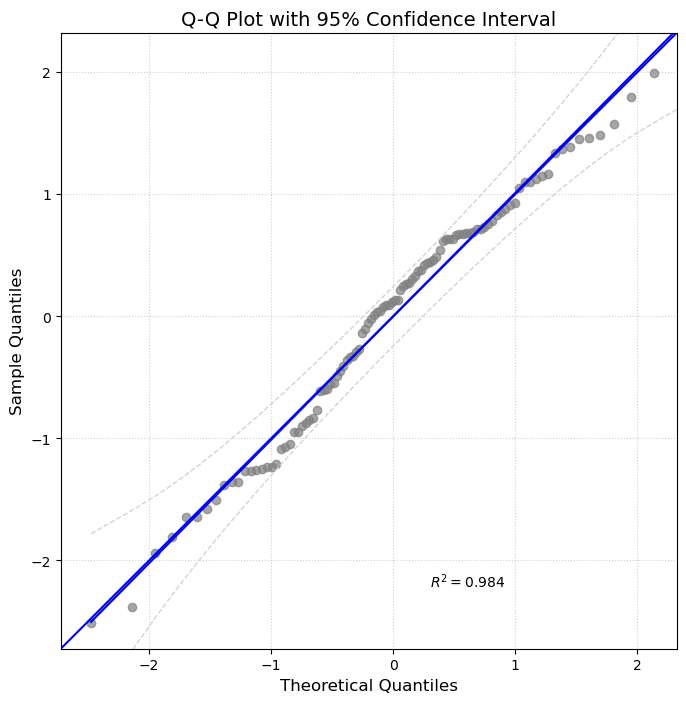


Variance Inflation Factors:
             Variable        VIF
0               const  20.916584
1                 age   1.286787
2              income   1.676433
3        Extraversion   1.557372
4       Agreeableness   1.474634
5   Conscientiousness   1.908142
6         Neuroticism   2.539991
7     Open_Mindedness   1.219343
8            gender_2   1.867471
9         education_3   1.643520
10        education_4   2.284489
11        education_5   2.052900
12        education_6   1.260054
13             race_2   1.231170
14            race_99   1.289926
15       employment_5   2.452343
16       employment_6   2.021125
17       employment_7   4.533852
18      employment_99   2.925199


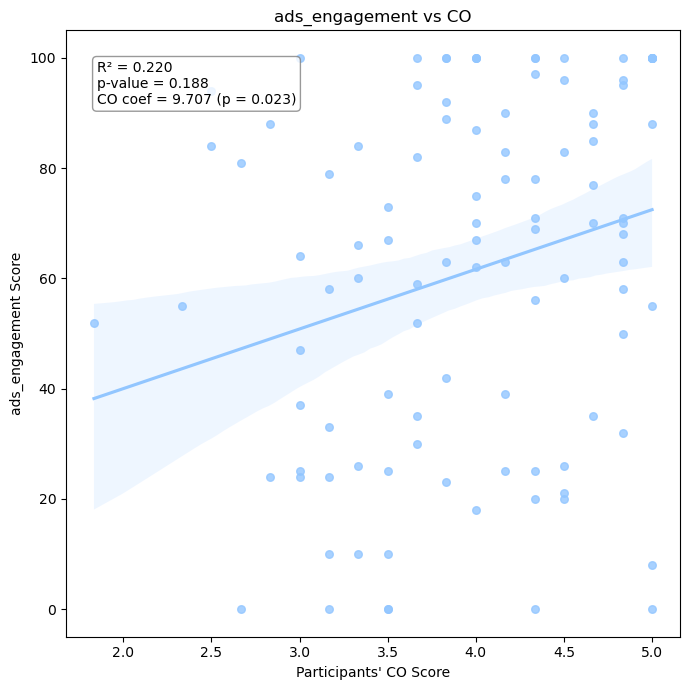


--------------------------------------------------
ads_engagement EX (OLS Model)
--------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:      ads_engagement_EX   R-squared:                       0.291
Model:                            OLS   Adj. R-squared:                  0.140
Method:                 Least Squares   F-statistic:                     1.935
Date:                Mon, 09 Sep 2024   Prob (F-statistic):             0.0231
Time:                        15:47:18   Log-Likelihood:                -496.35
No. Observations:                 104   AIC:                             1031.
Df Residuals:                      85   BIC:                             1081.
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
                        coef    std err          t      P>|t|      [0.025    

<Figure size 1000x800 with 0 Axes>

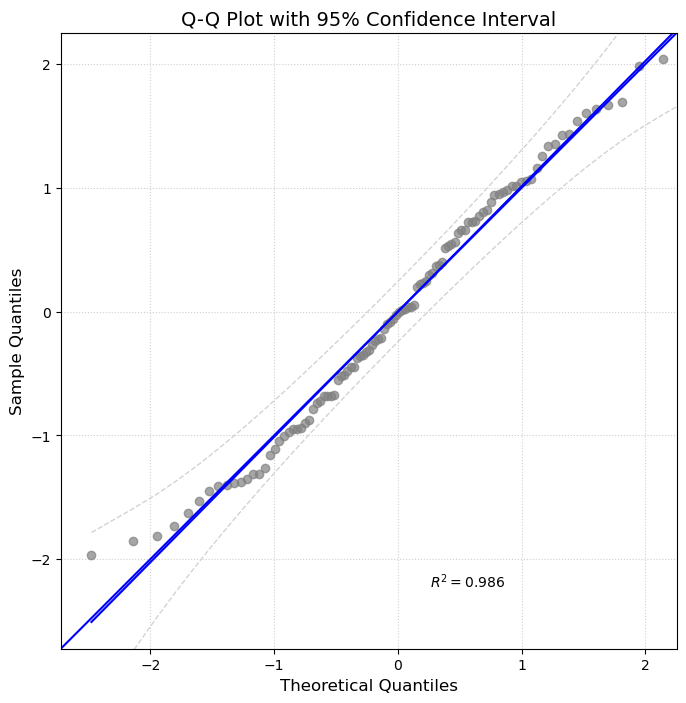


Variance Inflation Factors:
             Variable        VIF
0               const  20.916584
1                 age   1.286787
2              income   1.676433
3        Extraversion   1.557372
4       Agreeableness   1.474634
5   Conscientiousness   1.908142
6         Neuroticism   2.539991
7     Open_Mindedness   1.219343
8            gender_2   1.867471
9         education_3   1.643520
10        education_4   2.284489
11        education_5   2.052900
12        education_6   1.260054
13             race_2   1.231170
14            race_99   1.289926
15       employment_5   2.452343
16       employment_6   2.021125
17       employment_7   4.533852
18      employment_99   2.925199


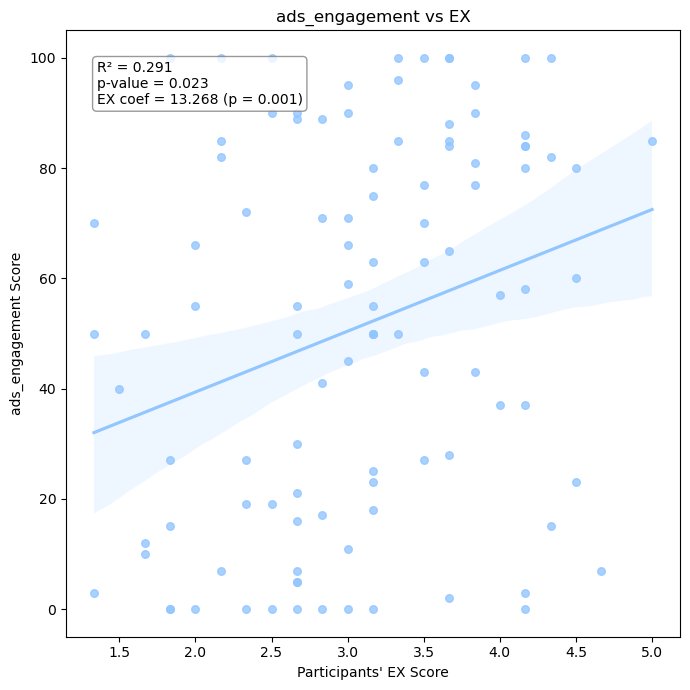


--------------------------------------------------
ads_engagement AG (OLS Model)
--------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:      ads_engagement_AG   R-squared:                       0.138
Model:                            OLS   Adj. R-squared:                 -0.044
Method:                 Least Squares   F-statistic:                    0.7574
Date:                Mon, 09 Sep 2024   Prob (F-statistic):              0.742
Time:                        15:47:19   Log-Likelihood:                -496.48
No. Observations:                 104   AIC:                             1031.
Df Residuals:                      85   BIC:                             1081.
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
                        coef    std err          t      P>|t|      [0.025    

<Figure size 1000x800 with 0 Axes>

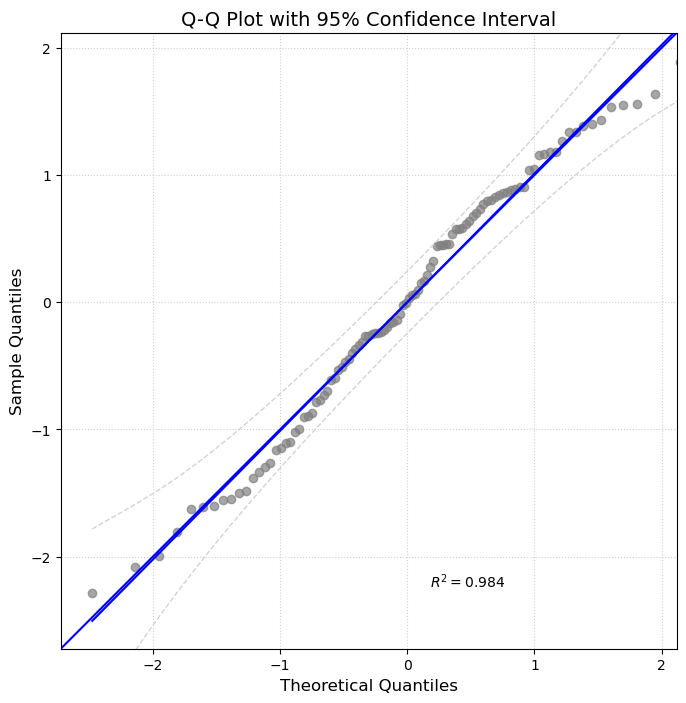


Variance Inflation Factors:
             Variable        VIF
0               const  20.916584
1                 age   1.286787
2              income   1.676433
3        Extraversion   1.557372
4       Agreeableness   1.474634
5   Conscientiousness   1.908142
6         Neuroticism   2.539991
7     Open_Mindedness   1.219343
8            gender_2   1.867471
9         education_3   1.643520
10        education_4   2.284489
11        education_5   2.052900
12        education_6   1.260054
13             race_2   1.231170
14            race_99   1.289926
15       employment_5   2.452343
16       employment_6   2.021125
17       employment_7   4.533852
18      employment_99   2.925199


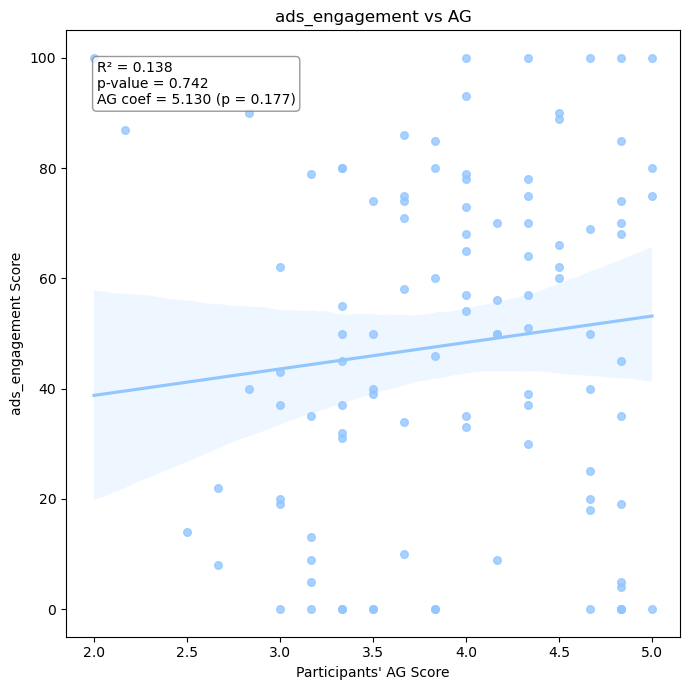

In [70]:
Study2a_1_results_list = []
Study2a_1_plot_list = []

for construct in ads_constructs:
    for big5_type in big5_types:
        col = construct + '_' + big5_type
        y = ads_scores_df[col]
        
        # Original OLS model
        model_ols = sm.OLS(y, X)
        results_ols = model_ols.fit()
        
        print(f"\n{'-'*50}\n{construct} {big5_type} (OLS Model)\n{'-'*50}")
        print(results_ols.summary())
        
        # Check regression assumptions
        print("\nAssumption checks for OLS model:")
        assumption_results_ols = check_regression_assumptions(results_ols, X, y)
        results_ols.assumption_results = assumption_results_ols
        
        # Store OLS results
        Study2a_1_results_list.append(results_ols)
        
        # Plotting (using full dataset for visualization)
        col_flag = big5_lookup[big5_type]
        p_value_ols = results_ols.pvalues[col_flag]
        r_squared = results_ols.rsquared
        f_pvalue = results_ols.f_pvalue
        coef = results_ols.params[col_flag]
        
        fig, ax = plt.subplots(figsize=(7, 7))
        
        # OLS plot
        sns.regplot(x=ads_big5_df_final[col_flag], y=y, ci=95, scatter_kws={"s": 30}, ax=ax)
        ax.set_xlabel(f"Participants' {big5_type} Score")
        ax.set_ylabel(f"{construct} Score")
        ax.set_title(f"{construct} vs {big5_type}")
        
        # Add annotations
        ax.annotate(f"R² = {r_squared:.3f}\np-value = {f_pvalue:.3f}\n{big5_type} coef = {coef:.3f} (p = {p_value_ols:.3f})", 
                    xy=(0.05, 0.95), xycoords='axes fraction',
                    ha='left', va='top',
                    bbox=dict(boxstyle='round', fc='white', ec='gray', alpha=0.8))
        
        plt.tight_layout()
        Study2a_1_plot_list.append(plt)
        plt.show()

#### Study2a.2

Study2a.2: [y] 'perceived_credibility' scores for each of 4 versions vs [X] 'perceived_personalization' scores for each of 4 versions & matched big5 scores for each of 4 versions, controlling for socioeconomic 

[perceived_credibility] Generate (1) scatter plot with fitted line with 95% CI and (2) OLS summary for each of the followings:
- ads_scores_df['perceived_credibility_OP'] vs ads_scores_df['perceived_personalization_OP'], ads_big5_df_final['Open_Mindedness'], controlling for socio economic
- ads_scores_df['perceived_credibility_CO'] vs ads_scores_df['perceived_personalization_CO'], ads_big5_df_final['Conscientiousness'], controlling for socio economic
- ads_scores_df['perceived_credibility_EX'] vs ads_scores_df['perceived_personalization_EX'], ads_big5_df_final['Extraversion'], controlling for socio economic
- ads_scores_df['perceived_credibility_AG'] vs ads_scores_df['perceived_personalization_AG'], ads_big5_df_final['Agreeableness'], controlling for socio economic

In [71]:
ads_constructs

['perceived_personalization',
 'perceived_credibility',
 'overall_attitude',
 'ads_engagement']

In [72]:
ads_big5_df_final.iloc[:,1:]

,age,income,gender_2,education_3,education_4,education_5,education_6,race_2,race_99,employment_5,employment_6,employment_7,employment_99,Extraversion,Agreeableness,Conscientiousness,Neuroticism,Open_Mindedness
0,34,1,0,0,1,0,0,1,0,1,0,0,0,3.666667,4.000000,3.500000,2.166667,3.000000
1,36,7,0,0,0,1,0,0,0,0,0,1,0,3.833333,3.166667,4.166667,1.833333,4.166667
2,48,11,1,0,0,1,0,0,0,0,1,0,0,4.166667,3.166667,4.666667,1.833333,3.166667
3,41,5,1,0,1,0,0,0,0,1,0,0,0,3.166667,3.333333,3.000000,4.000000,4.166667
4,48,9,1,0,0,0,0,0,0,0,0,0,0,3.000000,4.333333,3.500000,2.666667,4.166667
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99,27,1,1,0,1,0,0,1,0,0,0,0,0,3.333333,3.000000,3.166667,3.666667,4.166667
100,30,5,1,0,0,0,0,0,0,0,1,0,0,3.500000,4.833333,4.333333,1.000000,3.000000
101,55,11,1,0,0,1,0,1,0,0,0,0,1,3.666667,4.833333,4.333333,1.166667,4.666667
102,43,12,0,0,0,1,0,1,0,0,0,1,0,3.833333,4.000000,4.666667,1.666667,4.000000


In [73]:
big5_types

['OP', 'CO', 'EX', 'AG']

In [74]:
# Definition of X
# 1. big 5 trait scores + socio economics = ads_big5_df_final.iloc[:,1:]
# 2. perceived_personalization for each of 4 personality traits
# 3. 

# Definition of y
# perceived_credibility for each of 4 personality traits

X = ads_big5_df_final.iloc[:,1:]
X_target_constructs = ['perceived_personalization']
y_target_constract = 'perceived_credibility'

for construct in X_target_constructs:
    for big5_type in big5_types:
        col_name = construct + '_' + big5_type
        
        X[col_name] = ads_scores_df[col_name]

continuous_columns = [col for col in X.columns if col not in ['race', 'employment', 'gender', 'education']]
dummy_columns = [col for col in X.columns if col in ['race', 'employment', 'gender', 'education']]

scaler = StandardScaler()
X_continuous_scaled = pd.DataFrame(scaler.fit_transform(X[continuous_columns]), columns=continuous_columns)
X_scaled = pd.concat([X_continuous_scaled, X[dummy_columns].reset_index(drop=True)], axis=1)

X = X_scaled



--------------------------------------------------
perceived_credibility_OP (Linear Model)
--------------------------------------------------
                               OLS Regression Results                               
Dep. Variable:     perceived_credibility_OP   R-squared:                       0.579
Model:                                  OLS   Adj. R-squared:                  0.465
Method:                       Least Squares   F-statistic:                     5.063
Date:                      Mon, 09 Sep 2024   Prob (F-statistic):           3.56e-08
Time:                              15:47:20   Log-Likelihood:                -433.62
No. Observations:                       104   AIC:                             913.2
Df Residuals:                            81   BIC:                             974.1
Df Model:                                22                                         
Covariance Type:                  nonrobust                                         
       

<Figure size 1000x800 with 0 Axes>

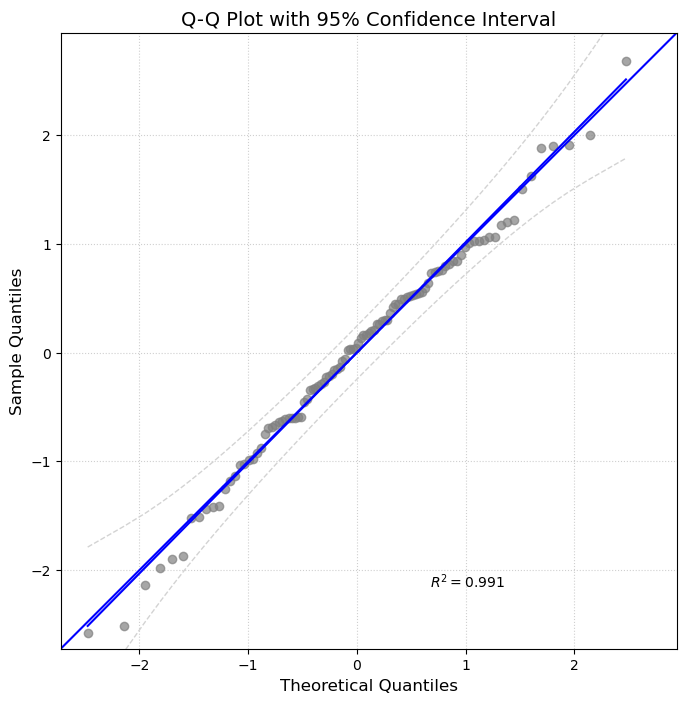


Variance Inflation Factors:
                        Variable       VIF
0                          const  1.000000
1                            age  1.307712
2                         income  1.836443
3                       gender_2  1.951595
4                    education_3  1.661754
5                    education_4  2.381900
6                    education_5  2.192394
7                    education_6  1.313681
8                         race_2  1.297180
9                        race_99  1.376942
10                  employment_5  2.493299
11                  employment_6  2.143363
12                  employment_7  4.651713
13                 employment_99  3.127307
14                  Extraversion  1.878989
15                 Agreeableness  1.655020
16             Conscientiousness  2.219051
17                   Neuroticism  2.603477
18               Open_Mindedness  1.360308
19  perceived_personalization_OP  1.593049
20  perceived_personalization_CO  1.409626
21  perceived_personaliza

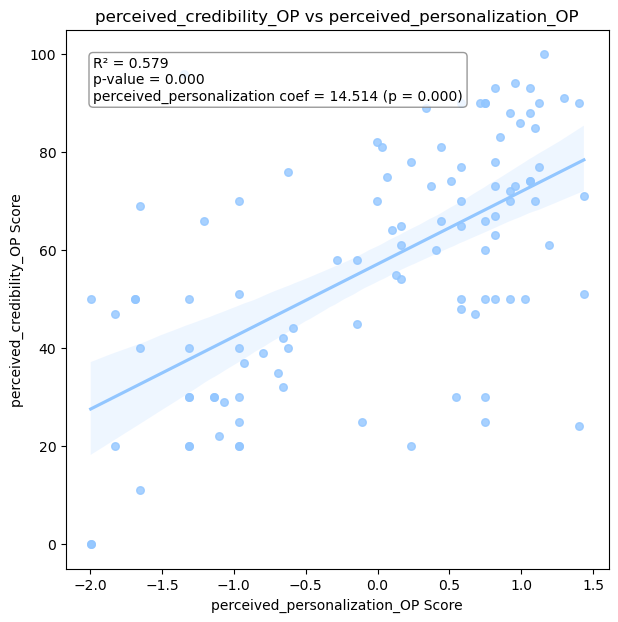


--------------------------------------------------
perceived_credibility_CO (Linear Model)
--------------------------------------------------
                               OLS Regression Results                               
Dep. Variable:     perceived_credibility_CO   R-squared:                       0.667
Model:                                  OLS   Adj. R-squared:                  0.577
Method:                       Least Squares   F-statistic:                     7.373
Date:                      Mon, 09 Sep 2024   Prob (F-statistic):           1.04e-11
Time:                              15:47:20   Log-Likelihood:                -427.63
No. Observations:                       104   AIC:                             901.3
Df Residuals:                            81   BIC:                             962.1
Df Model:                                22                                         
Covariance Type:                  nonrobust                                         
       

<Figure size 1000x800 with 0 Axes>

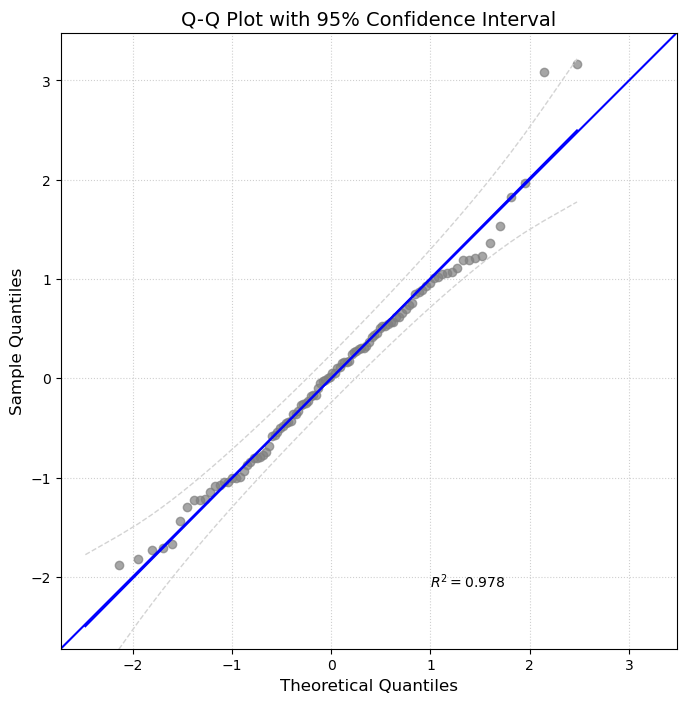


Variance Inflation Factors:
                        Variable       VIF
0                          const  1.000000
1                            age  1.307712
2                         income  1.836443
3                       gender_2  1.951595
4                    education_3  1.661754
5                    education_4  2.381900
6                    education_5  2.192394
7                    education_6  1.313681
8                         race_2  1.297180
9                        race_99  1.376942
10                  employment_5  2.493299
11                  employment_6  2.143363
12                  employment_7  4.651713
13                 employment_99  3.127307
14                  Extraversion  1.878989
15                 Agreeableness  1.655020
16             Conscientiousness  2.219051
17                   Neuroticism  2.603477
18               Open_Mindedness  1.360308
19  perceived_personalization_OP  1.593049
20  perceived_personalization_CO  1.409626
21  perceived_personaliza

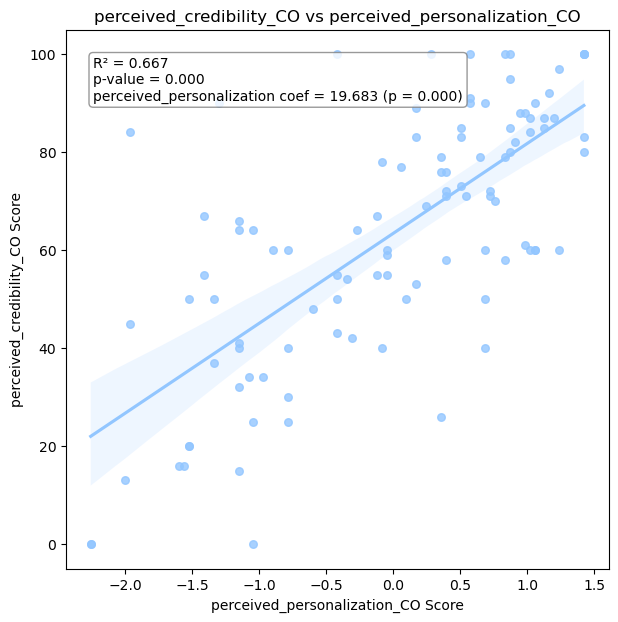


--------------------------------------------------
perceived_credibility_EX (Linear Model)
--------------------------------------------------
                               OLS Regression Results                               
Dep. Variable:     perceived_credibility_EX   R-squared:                       0.617
Model:                                  OLS   Adj. R-squared:                  0.513
Method:                       Least Squares   F-statistic:                     5.930
Date:                      Mon, 09 Sep 2024   Prob (F-statistic):           1.42e-09
Time:                              15:47:21   Log-Likelihood:                -439.70
No. Observations:                       104   AIC:                             925.4
Df Residuals:                            81   BIC:                             986.2
Df Model:                                22                                         
Covariance Type:                  nonrobust                                         
       

<Figure size 1000x800 with 0 Axes>

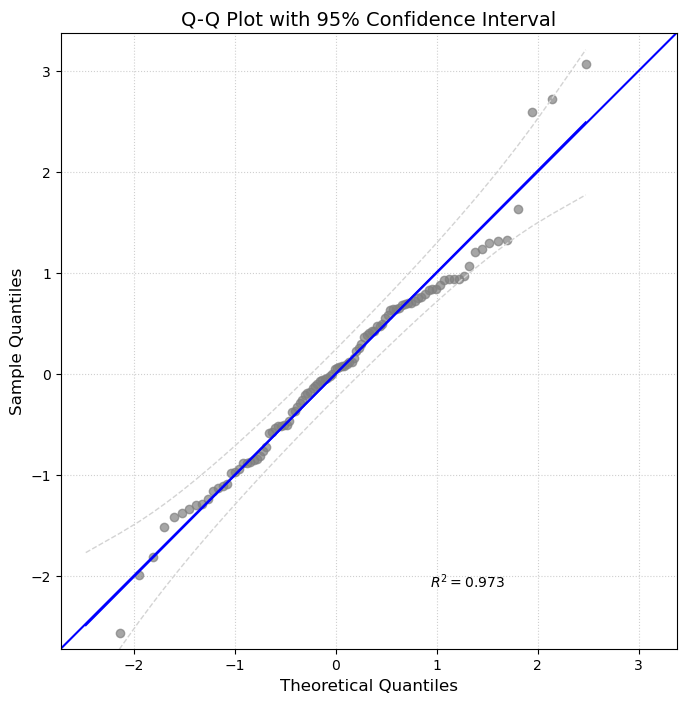


Variance Inflation Factors:
                        Variable       VIF
0                          const  1.000000
1                            age  1.307712
2                         income  1.836443
3                       gender_2  1.951595
4                    education_3  1.661754
5                    education_4  2.381900
6                    education_5  2.192394
7                    education_6  1.313681
8                         race_2  1.297180
9                        race_99  1.376942
10                  employment_5  2.493299
11                  employment_6  2.143363
12                  employment_7  4.651713
13                 employment_99  3.127307
14                  Extraversion  1.878989
15                 Agreeableness  1.655020
16             Conscientiousness  2.219051
17                   Neuroticism  2.603477
18               Open_Mindedness  1.360308
19  perceived_personalization_OP  1.593049
20  perceived_personalization_CO  1.409626
21  perceived_personaliza

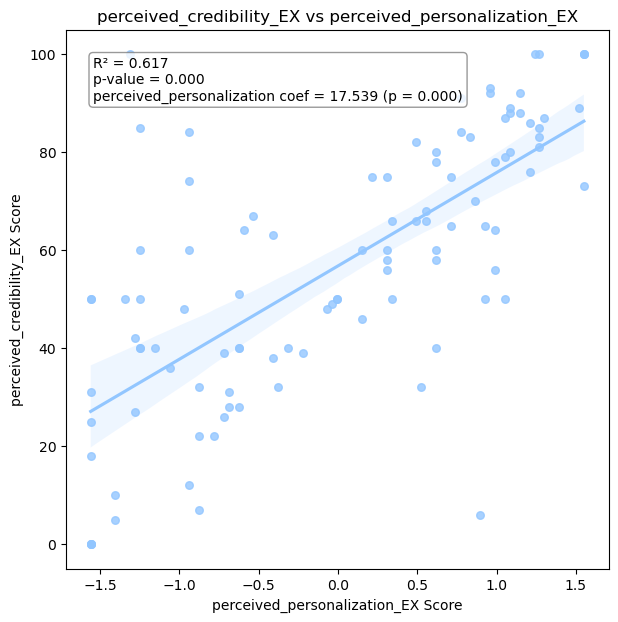


--------------------------------------------------
perceived_credibility_AG (Linear Model)
--------------------------------------------------
                               OLS Regression Results                               
Dep. Variable:     perceived_credibility_AG   R-squared:                       0.638
Model:                                  OLS   Adj. R-squared:                  0.539
Method:                       Least Squares   F-statistic:                     6.476
Date:                      Mon, 09 Sep 2024   Prob (F-statistic):           2.08e-10
Time:                              15:47:22   Log-Likelihood:                -425.75
No. Observations:                       104   AIC:                             897.5
Df Residuals:                            81   BIC:                             958.3
Df Model:                                22                                         
Covariance Type:                  nonrobust                                         
       

<Figure size 1000x800 with 0 Axes>

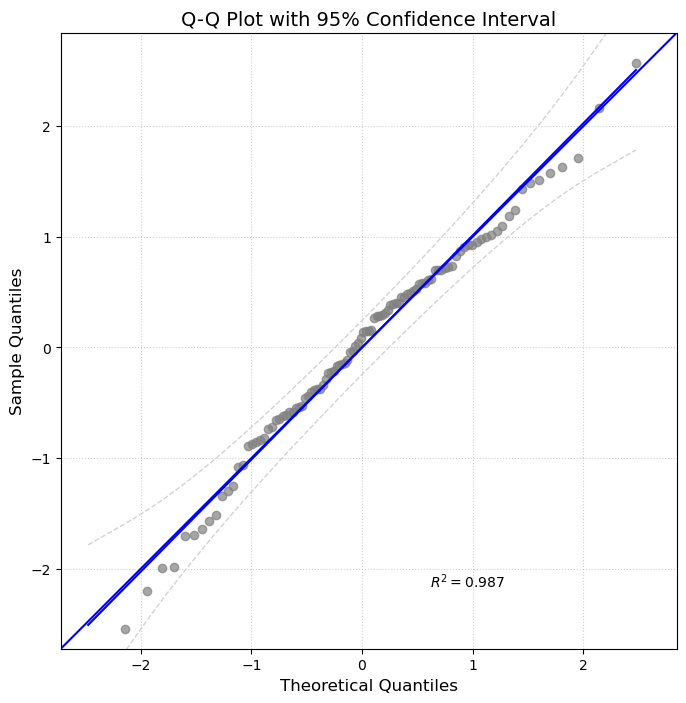


Variance Inflation Factors:
                        Variable       VIF
0                          const  1.000000
1                            age  1.307712
2                         income  1.836443
3                       gender_2  1.951595
4                    education_3  1.661754
5                    education_4  2.381900
6                    education_5  2.192394
7                    education_6  1.313681
8                         race_2  1.297180
9                        race_99  1.376942
10                  employment_5  2.493299
11                  employment_6  2.143363
12                  employment_7  4.651713
13                 employment_99  3.127307
14                  Extraversion  1.878989
15                 Agreeableness  1.655020
16             Conscientiousness  2.219051
17                   Neuroticism  2.603477
18               Open_Mindedness  1.360308
19  perceived_personalization_OP  1.593049
20  perceived_personalization_CO  1.409626
21  perceived_personaliza

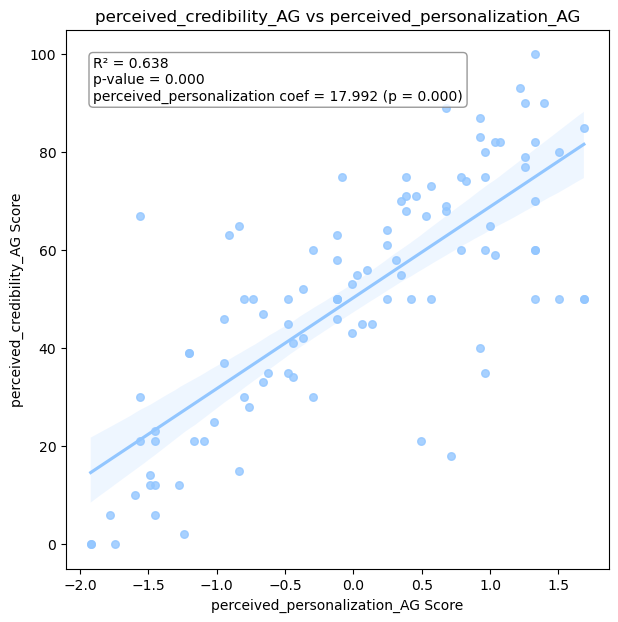

In [75]:
# For linear regression (original behavior)
Study2a_2_results_list_linear = []
Study2a_2_plot_list_linear = []

fit_OLS_and_draw_plot(ads_scores_df, 
                      Study2a_2_results_list_linear, 
                      Study2a_2_plot_list_linear,
                      exclude_influential=False,
                      use_quadratic=False)


--------------------------------------------------
perceived_credibility_OP (Quadratic Model)
--------------------------------------------------
                               OLS Regression Results                               
Dep. Variable:     perceived_credibility_OP   R-squared:                       0.584
Model:                                  OLS   Adj. R-squared:                  0.465
Method:                       Least Squares   F-statistic:                     4.888
Date:                      Mon, 09 Sep 2024   Prob (F-statistic):           5.45e-08
Time:                              15:47:23   Log-Likelihood:                -432.96
No. Observations:                       104   AIC:                             913.9
Df Residuals:                            80   BIC:                             977.4
Df Model:                                23                                         
Covariance Type:                  nonrobust                                         
    

<Figure size 1000x800 with 0 Axes>

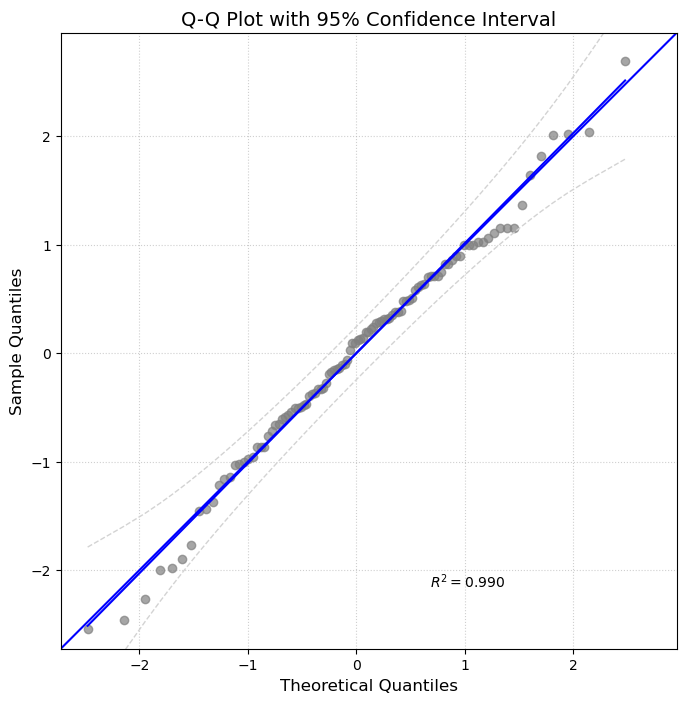


Variance Inflation Factors:
                                Variable       VIF
0                                  const  3.442758
1                                    age  1.319800
2                                 income  1.839738
3                               gender_2  1.984169
4                            education_3  1.674999
5                            education_4  2.597250
6                            education_5  2.197778
7                            education_6  1.357521
8                                 race_2  1.317474
9                                race_99  1.379806
10                          employment_5  2.551511
11                          employment_6  2.143531
12                          employment_7  4.688624
13                         employment_99  3.131341
14                          Extraversion  1.885003
15                         Agreeableness  1.655262
16                     Conscientiousness  2.334960
17                           Neuroticism  2.604566
18

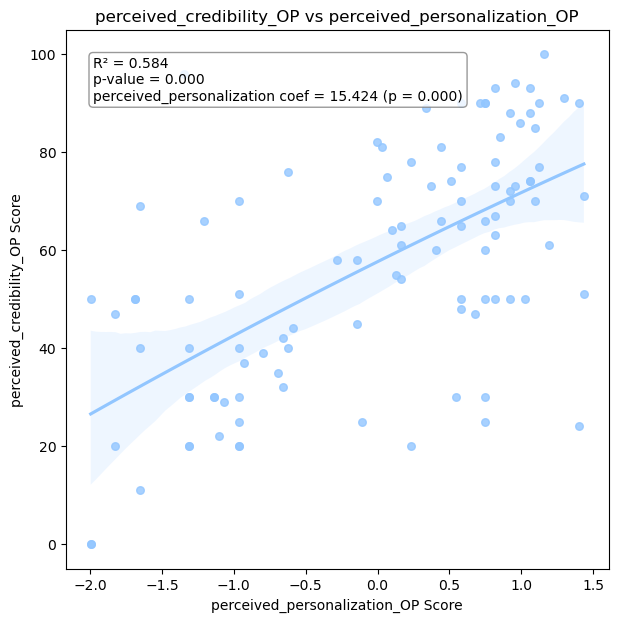


--------------------------------------------------
perceived_credibility_CO (Quadratic Model)
--------------------------------------------------
                               OLS Regression Results                               
Dep. Variable:     perceived_credibility_CO   R-squared:                       0.667
Model:                                  OLS   Adj. R-squared:                  0.571
Method:                       Least Squares   F-statistic:                     6.966
Date:                      Mon, 09 Sep 2024   Prob (F-statistic):           2.88e-11
Time:                              15:47:24   Log-Likelihood:                -427.63
No. Observations:                       104   AIC:                             903.3
Df Residuals:                            80   BIC:                             966.7
Df Model:                                23                                         
Covariance Type:                  nonrobust                                         
    

<Figure size 1000x800 with 0 Axes>

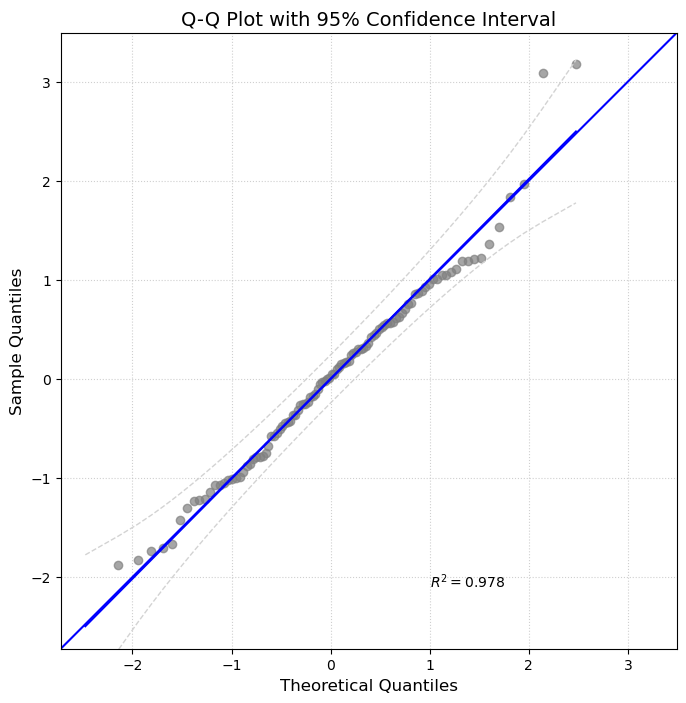


Variance Inflation Factors:
                                Variable       VIF
0                                  const  2.440829
1                                    age  1.307765
2                                 income  1.840836
3                               gender_2  1.968694
4                            education_3  1.684023
5                            education_4  2.382784
6                            education_5  2.194107
7                            education_6  1.323830
8                                 race_2  1.306491
9                                race_99  1.447811
10                          employment_5  2.547819
11                          employment_6  2.150884
12                          employment_7  4.660170
13                         employment_99  3.139065
14                          Extraversion  1.881655
15                         Agreeableness  1.705814
16                     Conscientiousness  2.309723
17                           Neuroticism  2.608903
18

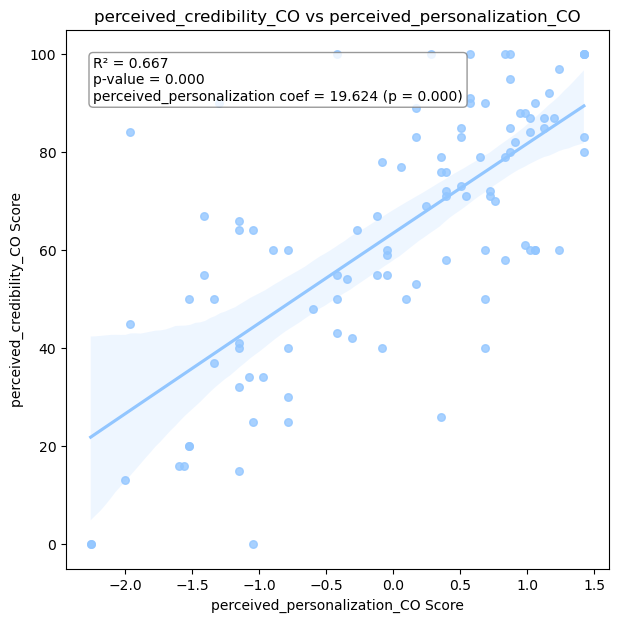


--------------------------------------------------
perceived_credibility_EX (Quadratic Model)
--------------------------------------------------
                               OLS Regression Results                               
Dep. Variable:     perceived_credibility_EX   R-squared:                       0.625
Model:                                  OLS   Adj. R-squared:                  0.517
Method:                       Least Squares   F-statistic:                     5.786
Date:                      Mon, 09 Sep 2024   Prob (F-statistic):           1.80e-09
Time:                              15:47:24   Log-Likelihood:                -438.66
No. Observations:                       104   AIC:                             925.3
Df Residuals:                            80   BIC:                             988.8
Df Model:                                23                                         
Covariance Type:                  nonrobust                                         
    

<Figure size 1000x800 with 0 Axes>

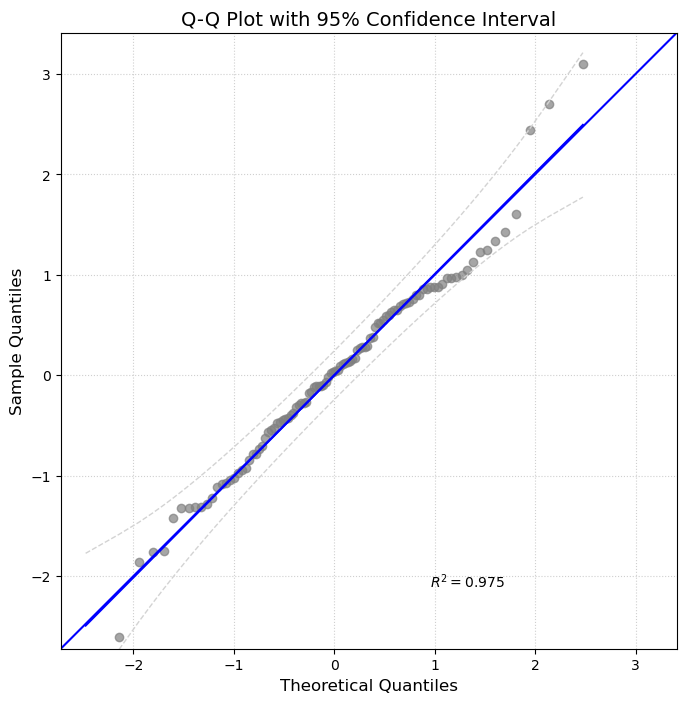


Variance Inflation Factors:
                                Variable       VIF
0                                  const  3.154052
1                                    age  1.308005
2                                 income  1.841220
3                               gender_2  1.970862
4                            education_3  1.672539
5                            education_4  2.407505
6                            education_5  2.208621
7                            education_6  1.323453
8                                 race_2  1.298145
9                                race_99  1.378784
10                          employment_5  2.493348
11                          employment_6  2.191347
12                          employment_7  4.687780
13                         employment_99  3.189517
14                          Extraversion  1.911305
15                         Agreeableness  1.673310
16                     Conscientiousness  2.301471
17                           Neuroticism  2.604912
18

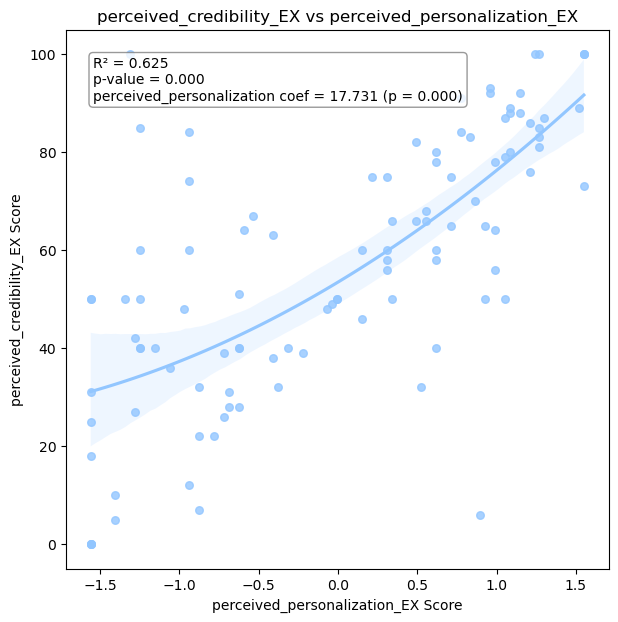


--------------------------------------------------
perceived_credibility_AG (Quadratic Model)
--------------------------------------------------
                               OLS Regression Results                               
Dep. Variable:     perceived_credibility_AG   R-squared:                       0.662
Model:                                  OLS   Adj. R-squared:                  0.565
Method:                       Least Squares   F-statistic:                     6.817
Date:                      Mon, 09 Sep 2024   Prob (F-statistic):           4.76e-11
Time:                              15:47:25   Log-Likelihood:                -422.10
No. Observations:                       104   AIC:                             892.2
Df Residuals:                            80   BIC:                             955.7
Df Model:                                23                                         
Covariance Type:                  nonrobust                                         
    

<Figure size 1000x800 with 0 Axes>

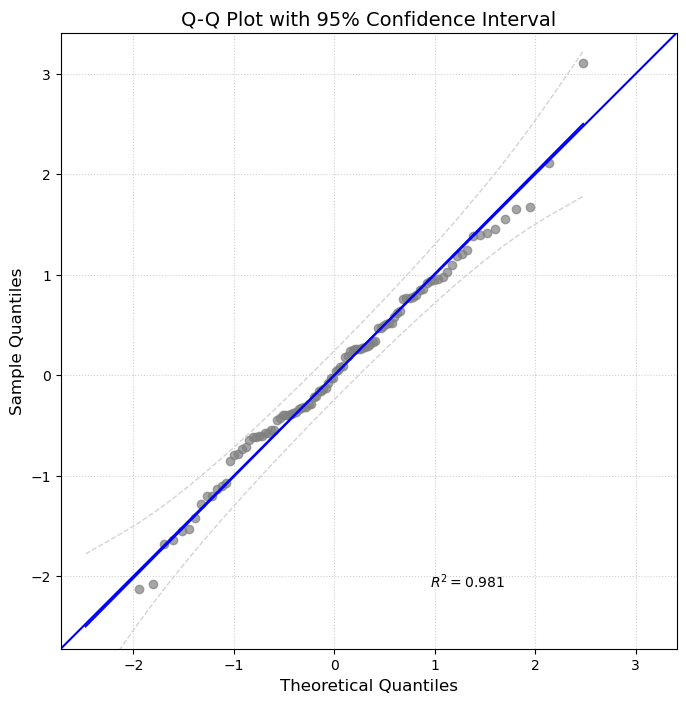


Variance Inflation Factors:
                                Variable       VIF
0                                  const  2.346979
1                                    age  1.334484
2                                 income  1.842239
3                               gender_2  1.953865
4                            education_3  1.690448
5                            education_4  2.400390
6                            education_5  2.201235
7                            education_6  1.314179
8                                 race_2  1.297209
9                                race_99  1.383094
10                          employment_5  2.617646
11                          employment_6  2.151508
12                          employment_7  4.658191
13                         employment_99  3.163466
14                          Extraversion  1.880336
15                         Agreeableness  1.682028
16                     Conscientiousness  2.242034
17                           Neuroticism  2.615422
18

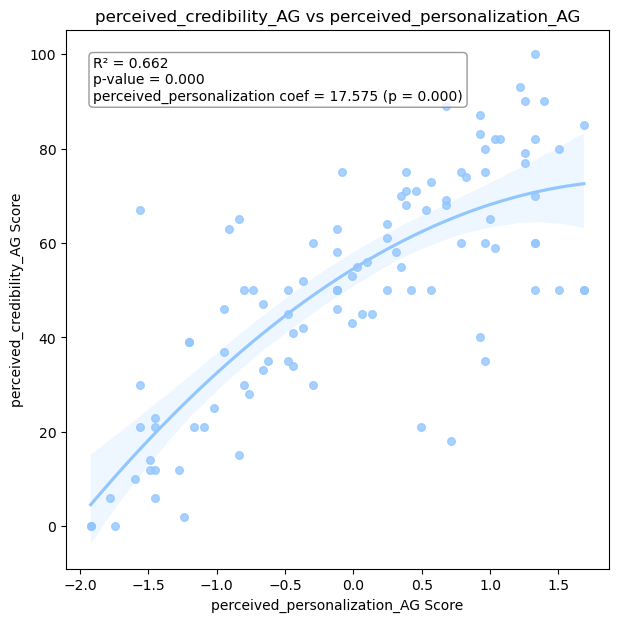

In [76]:
# For quadratic regression (to test for uncanny valley effect)
Study2a_2_results_list_quadratic = []
Study2a_2_plot_list_quadratic = []

fit_OLS_and_draw_plot(ads_scores_df, 
                      Study2a_2_results_list_quadratic, 
                      Study2a_2_plot_list_quadratic,
                      exclude_influential=False,
                      use_quadratic=True)

In [77]:
# Save results
save_all_regression_results(Study2a_2_results_list_linear, 
                            'perceived_personalization',
                            'presentation_materials/tmp/study2a_2_results_linear.csv')

Results saved to presentation_materials/tmp/study2a_2_results_linear.csv


In [78]:
save_all_regression_results(Study2a_2_results_list_quadratic, 
                            'perceived_personalization',
                            'presentation_materials/tmp/study2a_2_results_quadratic.csv')

Results saved to presentation_materials/tmp/study2a_2_results_quadratic.csv


#### Study2a.3

Study2a.3. [y] 'overall_attitude' scores for each of 4 versions vs [X] 'perceived_personalization' scores for each of 4 versions & & matched big5 scores for each of 4 versions, controlling for socioeconomic.  Produce two versions to test moderator effect of  'perceived_credibility' scores for each of 4 versions.

[overall_attitude: Without Interaction] Generate (1) scatter plot with fitted line with 95% CI and (2) OLS summary for each of the followings:
- ads_scores_df['overall_attitude_OP'] vs ads_scores_df['perceived_personalization_OP'], ads_big5_df_final['Open_Mindedness'], ads_scores_df['perceived_credibility_OP'], controlling for socio economic
- ads_scores_df['overall_attitude_CO'] vs ads_scores_df['perceived_personalization_CO'], ads_big5_df_final['Conscientiousness'], ads_scores_df['perceived_credibility_CO'], controlling for socio economic
- ads_scores_df['overall_attitude_EX'] vs ads_scores_df['perceived_personalization_EX'], ads_big5_df_final['Extraversion'], ads_scores_df['perceived_credibility_EX'], controlling for socio economic
- ads_scores_df['overall_attitude_AG'] vs ads_scores_df['perceived_personalization_AG'], ads_big5_df_final['Agreeableness'], ads_scores_df['perceived_credibility_AG'], controlling for socio economic

[Introduce interaction column] 
- ads_scores_df['interaction_perceived_personalization_perceived_credibility_OP'] = ads_scores_df['perceived_personalization_OP'] * ads_scores_df['perceived_credibility_OP']
- ads_scores_df['interaction_perceived_personalization_perceived_credibility_CO'] = ads_scores_df['perceived_personalization_CO'] * ads_scores_df['perceived_credibility_CO']
- ads_scores_df['interaction_perceived_personalization_perceived_credibility_EX'] = ads_scores_df['perceived_personalization_EX'] * ads_scores_df['perceived_credibility_EX']
- ads_scores_df['interaction_perceived_personalization_perceived_credibility_AG'] = ads_scores_df['perceived_personalization_AG'] * ads_scores_df['perceived_credibility_AG']

[overall_attitude: With Interaction] Generate (1) scatter plot with fitted line with 95% CI and (2) OLS summary for each of the followings:
- ads_scores_df['overall_attitude_OP'] vs ads_scores_df['perceived_personalization_OP'], ads_big5_df_final['Open_Mindedness'], ads_scores_df['perceived_credibility_OP'], ads_scores_df['interaction_perceived_personalization_perceived_credibility_OP'], controlling for socio economic
- ads_scores_df['overall_attitude_CO'] vs ads_scores_df['perceived_personalization_CO'], ads_big5_df_final['Conscientiousness'], ads_scores_df['perceived_credibility_CO'], ads_scores_df['interaction_perceived_personalization_perceived_credibility_CO'], controlling for socio economic
- ads_scores_df['overall_attitude_EX'] vs ads_scores_df['perceived_personalization_EX'], ads_big5_df_final['Extraversion'], ads_scores_df['perceived_credibility_EX'], ads_scores_df['interaction_perceived_personalization_perceived_credibility_EX'], controlling for socio economic
- ads_scores_df['overall_attitude_AG'] vs ads_scores_df['perceived_personalization_AG'], ads_big5_df_final['Agreeableness'], ads_scores_df['perceived_credibility_AG'], ads_scores_df['interaction_perceived_personalization_perceived_credibility_AG''], controlling for socio economic

[Calculating the impact of moderator]
- sm.stats.anova_lm(Without Interaction model OP, With Interaction model OP)
- sm.stats.anova_lm(Without Interaction model CO, With Interaction model CO)
- sm.stats.anova_lm(Without Interaction model EX, With Interaction model EX)
- sm.stats.anova_lm(Without Interaction model AG, With Interaction model AG)

[overall_attitude: Without Interaction] Generate (1) scatter plot with fitted line with 95% CI and (2) OLS summary for each of the followings:
- ads_scores_df['overall_attitude_OP'] vs ads_scores_df['perceived_personalization_OP'], ads_big5_df_final['Open_Mindedness'], ads_scores_df['perceived_credibility_OP'], controlling for socio economic
- ads_scores_df['overall_attitude_CO'] vs ads_scores_df['perceived_personalization_CO'], ads_big5_df_final['Conscientiousness'], ads_scores_df['perceived_credibility_CO'], controlling for socio economic
- ads_scores_df['overall_attitude_EX'] vs ads_scores_df['perceived_personalization_EX'], ads_big5_df_final['Extraversion'], ads_scores_df['perceived_credibility_EX'], controlling for socio economic
- ads_scores_df['overall_attitude_AG'] vs ads_scores_df['perceived_personalization_AG'], ads_big5_df_final['Agreeableness'], ads_scores_df['perceived_credibility_AG'], controlling for socio economic

In [79]:
# Definition of X
# 1. big 5 trait scores + socio economics = ads_big5_df_final.iloc[:,1:]
# 2. perceived_personalization for each of 4 personality traits
# 3. perceived_credibiliy for each of 4 personality traits

# Definition of y
# ovearall_attitude for each of 4 personality traits

# Data preparation
X = ads_big5_df_final.iloc[:,1:]
X_target_constructs = ['perceived_personalization', 'perceived_credibility']
y_target_constract = 'overall_attitude'

for construct in X_target_constructs:
    for big5_type in big5_types:
        col_name = construct + '_' + big5_type
        X[col_name] = ads_scores_df[col_name]

continuous_columns = [col for col in X.columns if col not in ['race', 'employment', 'gender', 'education']]
dummy_columns = [col for col in X.columns if col in ['race', 'employment', 'gender', 'education']]

scaler = StandardScaler()
X_continuous_scaled = pd.DataFrame(scaler.fit_transform(X[continuous_columns]), columns=continuous_columns)
X_scaled = pd.concat([X_continuous_scaled, X[dummy_columns].reset_index(drop=True)], axis=1)

X = X_scaled


--------------------------------------------------
overall_attitude_OP (Linear Model)
--------------------------------------------------
                             OLS Regression Results                            
Dep. Variable:     overall_attitude_OP   R-squared:                       0.839
Model:                             OLS   Adj. R-squared:                  0.785
Method:                  Least Squares   F-statistic:                     15.48
Date:                 Mon, 09 Sep 2024   Prob (F-statistic):           4.74e-21
Time:                         15:47:26   Log-Likelihood:                -400.19
No. Observations:                  104   AIC:                             854.4
Df Residuals:                       77   BIC:                             925.8
Df Model:                           26                                         
Covariance Type:             nonrobust                                         
                                   coef    std err          t 

<Figure size 1000x800 with 0 Axes>

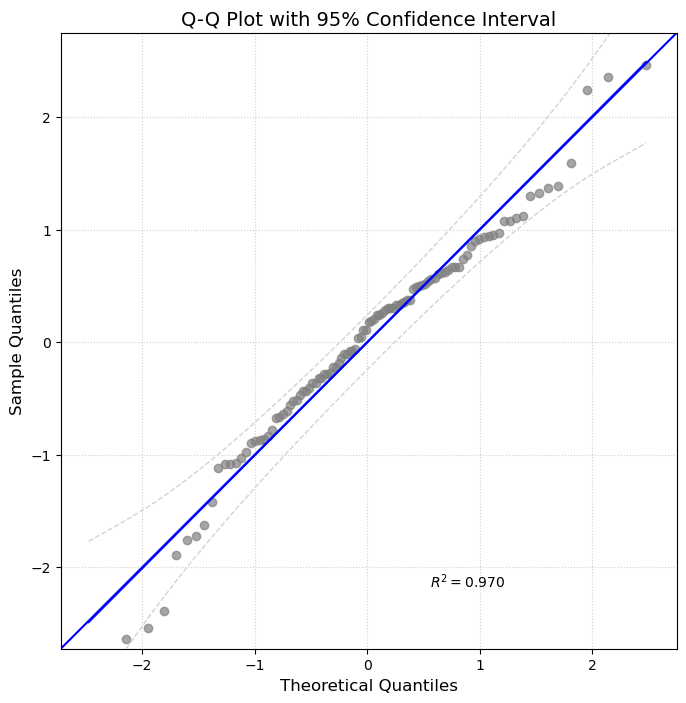


Variance Inflation Factors:
                        Variable       VIF
0                          const  1.000000
1                            age  1.385728
2                         income  2.055971
3                       gender_2  2.022432
4                    education_3  1.920064
5                    education_4  2.614363
6                    education_5  2.364079
7                    education_6  1.380157
8                         race_2  1.346463
9                        race_99  1.435985
10                  employment_5  2.529127
11                  employment_6  2.287217
12                  employment_7  4.759474
13                 employment_99  3.218314
14                  Extraversion  1.971783
15                 Agreeableness  1.669976
16             Conscientiousness  2.338850
17                   Neuroticism  2.635492
18               Open_Mindedness  1.412184
19  perceived_personalization_OP  2.478156
20  perceived_personalization_CO  3.306149
21  perceived_personaliza

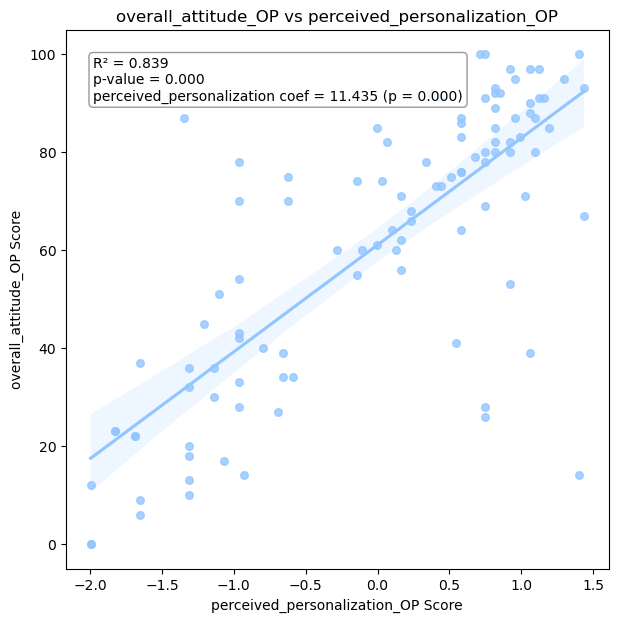

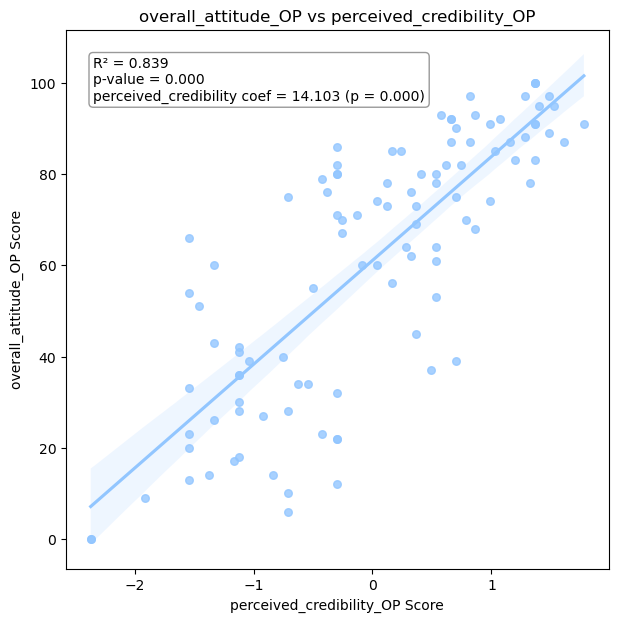


--------------------------------------------------
overall_attitude_CO (Linear Model)
--------------------------------------------------
                             OLS Regression Results                            
Dep. Variable:     overall_attitude_CO   R-squared:                       0.872
Model:                             OLS   Adj. R-squared:                  0.829
Method:                  Least Squares   F-statistic:                     20.25
Date:                 Mon, 09 Sep 2024   Prob (F-statistic):           1.05e-24
Time:                         15:47:27   Log-Likelihood:                -386.38
No. Observations:                  104   AIC:                             826.8
Df Residuals:                       77   BIC:                             898.2
Df Model:                           26                                         
Covariance Type:             nonrobust                                         
                                   coef    std err          t 

<Figure size 1000x800 with 0 Axes>

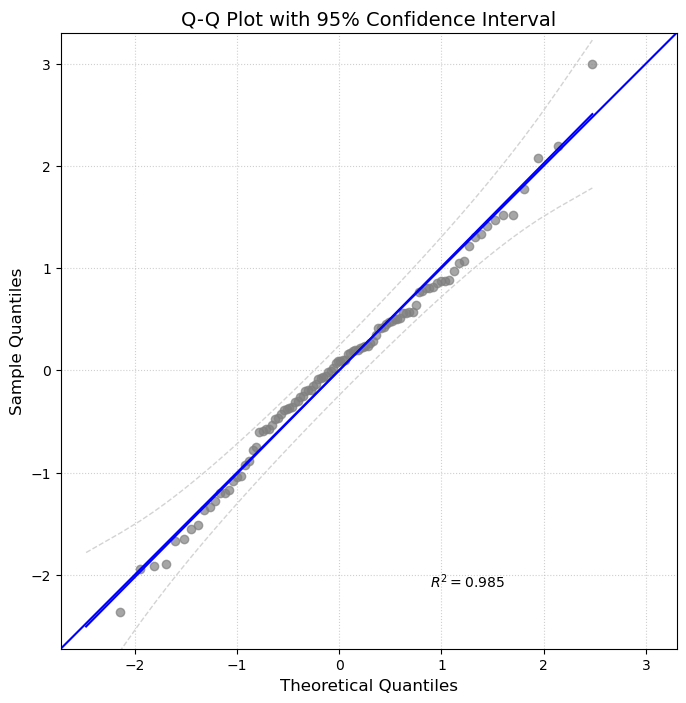


Variance Inflation Factors:
                        Variable       VIF
0                          const  1.000000
1                            age  1.385728
2                         income  2.055971
3                       gender_2  2.022432
4                    education_3  1.920064
5                    education_4  2.614363
6                    education_5  2.364079
7                    education_6  1.380157
8                         race_2  1.346463
9                        race_99  1.435985
10                  employment_5  2.529127
11                  employment_6  2.287217
12                  employment_7  4.759474
13                 employment_99  3.218314
14                  Extraversion  1.971783
15                 Agreeableness  1.669976
16             Conscientiousness  2.338850
17                   Neuroticism  2.635492
18               Open_Mindedness  1.412184
19  perceived_personalization_OP  2.478156
20  perceived_personalization_CO  3.306149
21  perceived_personaliza

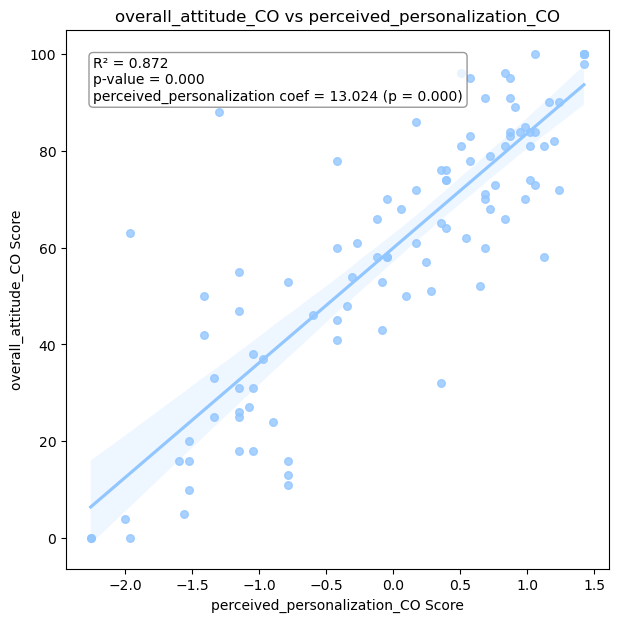

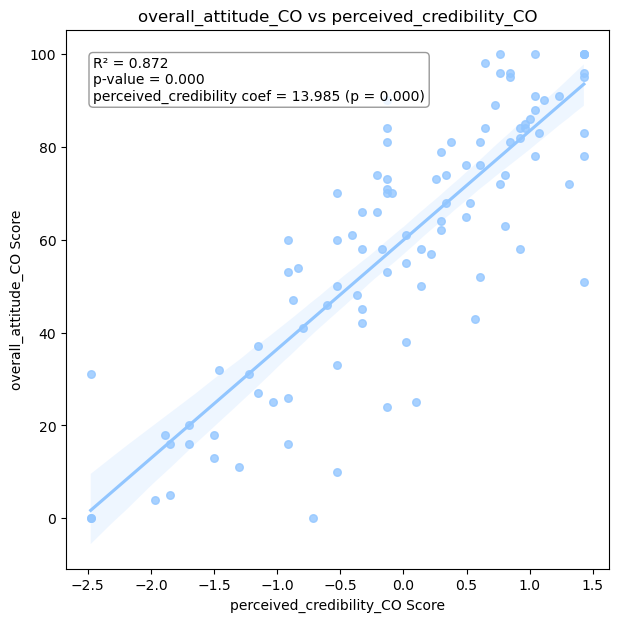


--------------------------------------------------
overall_attitude_EX (Linear Model)
--------------------------------------------------
                             OLS Regression Results                            
Dep. Variable:     overall_attitude_EX   R-squared:                       0.866
Model:                             OLS   Adj. R-squared:                  0.820
Method:                  Least Squares   F-statistic:                     19.08
Date:                 Mon, 09 Sep 2024   Prob (F-statistic):           7.13e-24
Time:                         15:47:28   Log-Likelihood:                -397.90
No. Observations:                  104   AIC:                             849.8
Df Residuals:                       77   BIC:                             921.2
Df Model:                           26                                         
Covariance Type:             nonrobust                                         
                                   coef    std err          t 

<Figure size 1000x800 with 0 Axes>

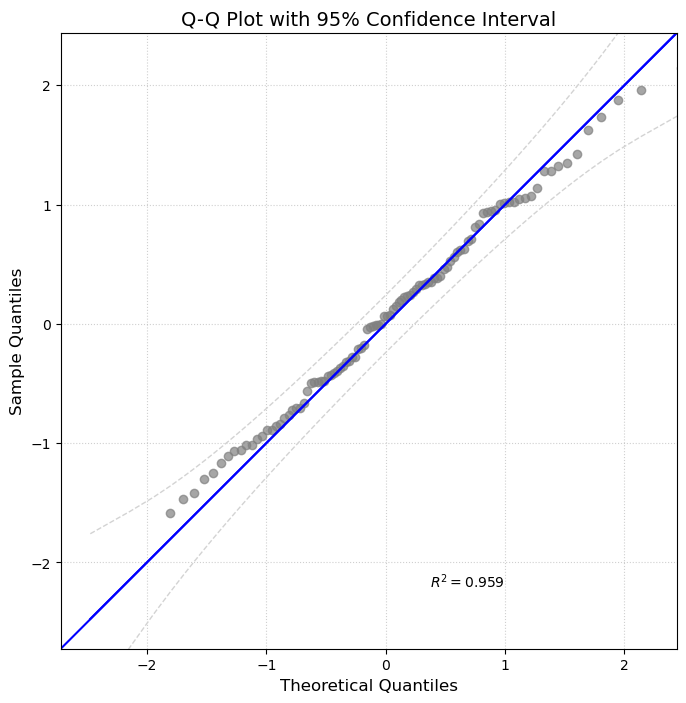


Variance Inflation Factors:
                        Variable       VIF
0                          const  1.000000
1                            age  1.385728
2                         income  2.055971
3                       gender_2  2.022432
4                    education_3  1.920064
5                    education_4  2.614363
6                    education_5  2.364079
7                    education_6  1.380157
8                         race_2  1.346463
9                        race_99  1.435985
10                  employment_5  2.529127
11                  employment_6  2.287217
12                  employment_7  4.759474
13                 employment_99  3.218314
14                  Extraversion  1.971783
15                 Agreeableness  1.669976
16             Conscientiousness  2.338850
17                   Neuroticism  2.635492
18               Open_Mindedness  1.412184
19  perceived_personalization_OP  2.478156
20  perceived_personalization_CO  3.306149
21  perceived_personaliza

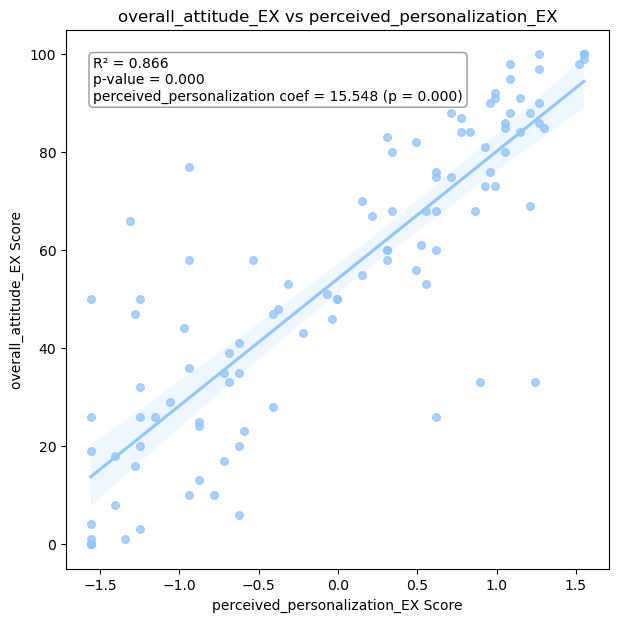

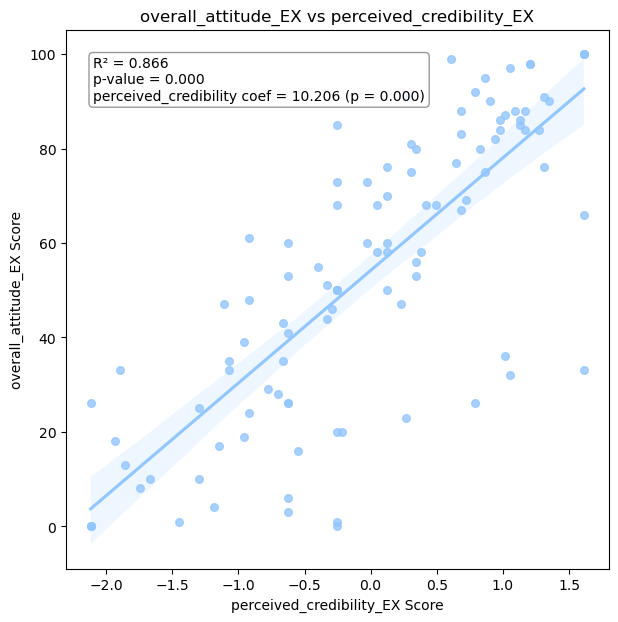


--------------------------------------------------
overall_attitude_AG (Linear Model)
--------------------------------------------------
                             OLS Regression Results                            
Dep. Variable:     overall_attitude_AG   R-squared:                       0.899
Model:                             OLS   Adj. R-squared:                  0.865
Method:                  Least Squares   F-statistic:                     26.30
Date:                 Mon, 09 Sep 2024   Prob (F-statistic):           2.01e-28
Time:                         15:47:29   Log-Likelihood:                -372.04
No. Observations:                  104   AIC:                             798.1
Df Residuals:                       77   BIC:                             869.5
Df Model:                           26                                         
Covariance Type:             nonrobust                                         
                                   coef    std err          t 

<Figure size 1000x800 with 0 Axes>

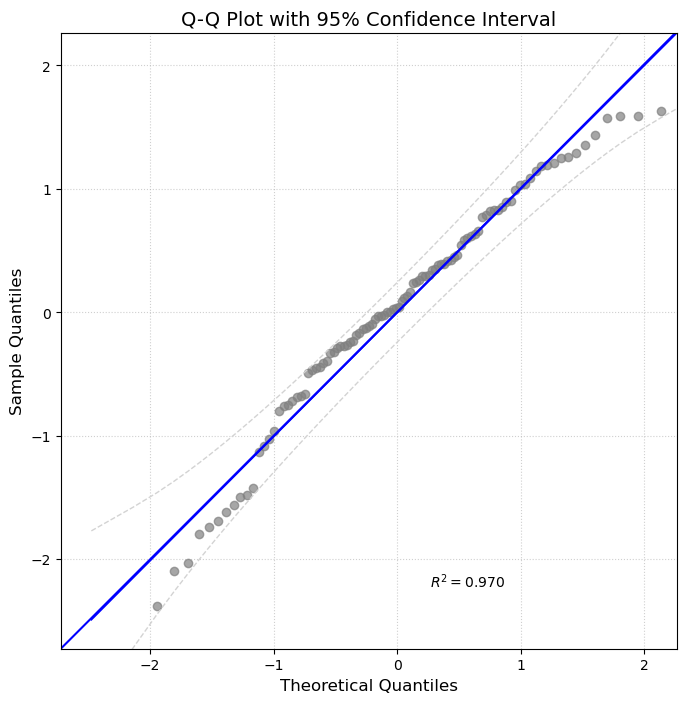


Variance Inflation Factors:
                        Variable       VIF
0                          const  1.000000
1                            age  1.385728
2                         income  2.055971
3                       gender_2  2.022432
4                    education_3  1.920064
5                    education_4  2.614363
6                    education_5  2.364079
7                    education_6  1.380157
8                         race_2  1.346463
9                        race_99  1.435985
10                  employment_5  2.529127
11                  employment_6  2.287217
12                  employment_7  4.759474
13                 employment_99  3.218314
14                  Extraversion  1.971783
15                 Agreeableness  1.669976
16             Conscientiousness  2.338850
17                   Neuroticism  2.635492
18               Open_Mindedness  1.412184
19  perceived_personalization_OP  2.478156
20  perceived_personalization_CO  3.306149
21  perceived_personaliza

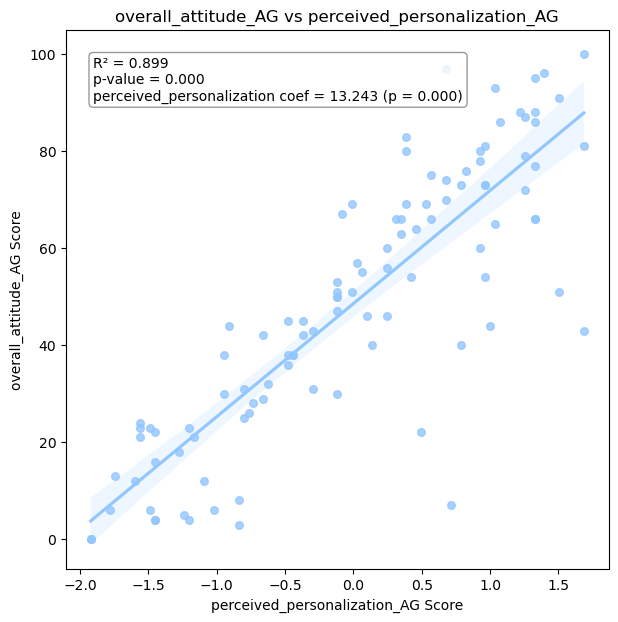

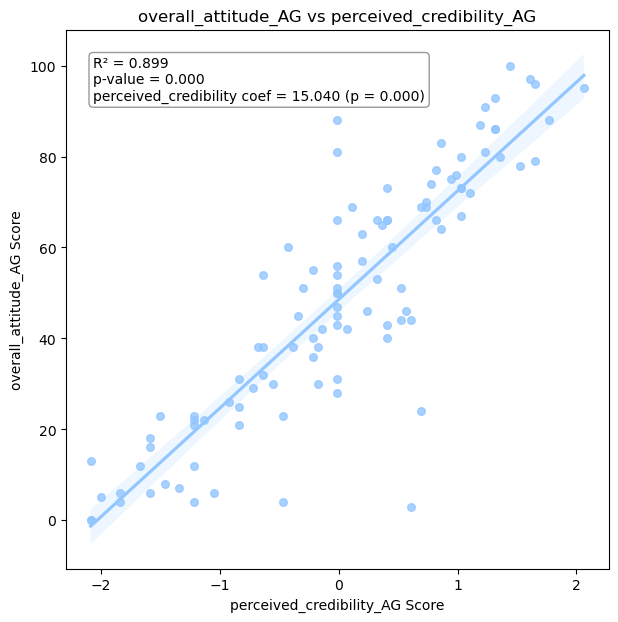

In [80]:
Study2a_3_results_list = []
Study2a_3_plot_list = []

fit_OLS_and_draw_plot(ads_scores_df, 
                      Study2a_3_results_list, Study2a_3_plot_list)


--------------------------------------------------
overall_attitude_OP (Quadratic Model)
--------------------------------------------------
                             OLS Regression Results                            
Dep. Variable:     overall_attitude_OP   R-squared:                       0.845
Model:                             OLS   Adj. R-squared:                  0.790
Method:                  Least Squares   F-statistic:                     15.35
Date:                 Mon, 09 Sep 2024   Prob (F-statistic):           5.33e-21
Time:                         15:47:30   Log-Likelihood:                -398.34
No. Observations:                  104   AIC:                             852.7
Df Residuals:                       76   BIC:                             926.7
Df Model:                           27                                         
Covariance Type:             nonrobust                                         
                                           coef    std err 

<Figure size 1000x800 with 0 Axes>

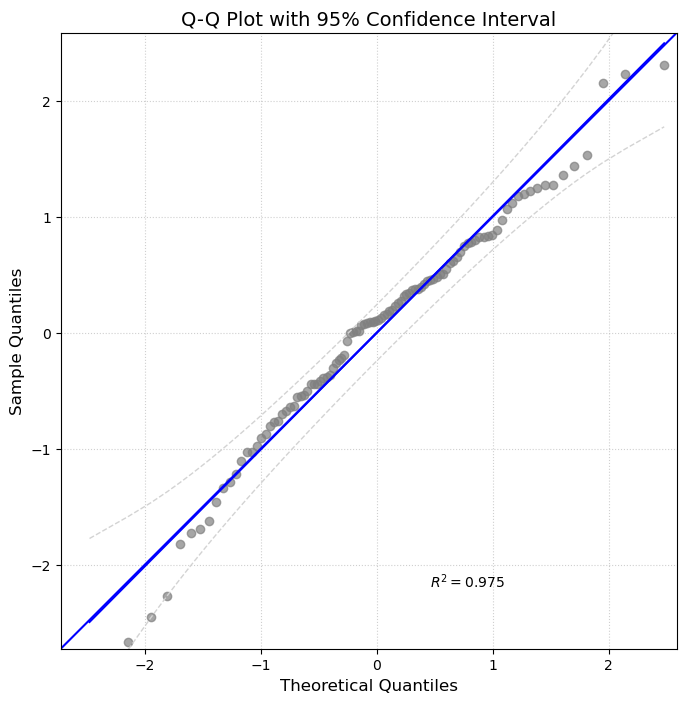


Variance Inflation Factors:
                                Variable       VIF
0                                  const  3.557947
1                                    age  1.399081
2                                 income  2.056676
3                               gender_2  2.057950
4                            education_3  1.964701
5                            education_4  2.787615
6                            education_5  2.364494
7                            education_6  1.446275
8                                 race_2  1.366002
9                                race_99  1.436058
10                          employment_5  2.595395
11                          employment_6  2.288166
12                          employment_7  4.779698
13                         employment_99  3.225084
14                          Extraversion  1.975157
15                         Agreeableness  1.670453
16                     Conscientiousness  2.487725
17                           Neuroticism  2.637249
18

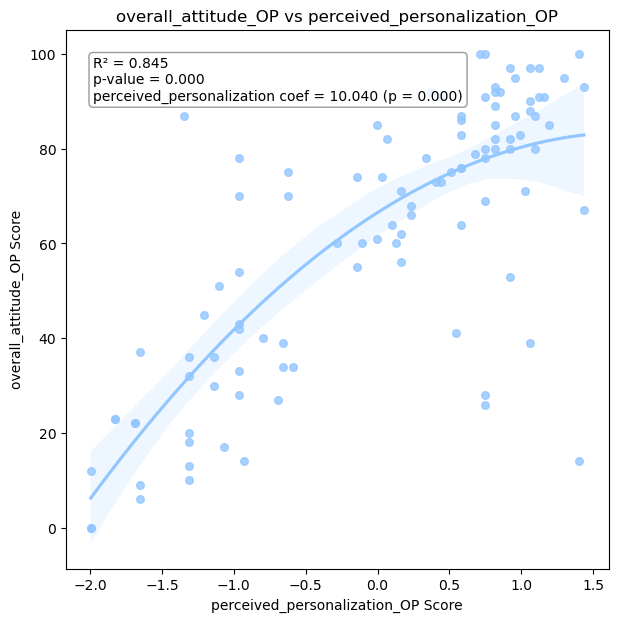

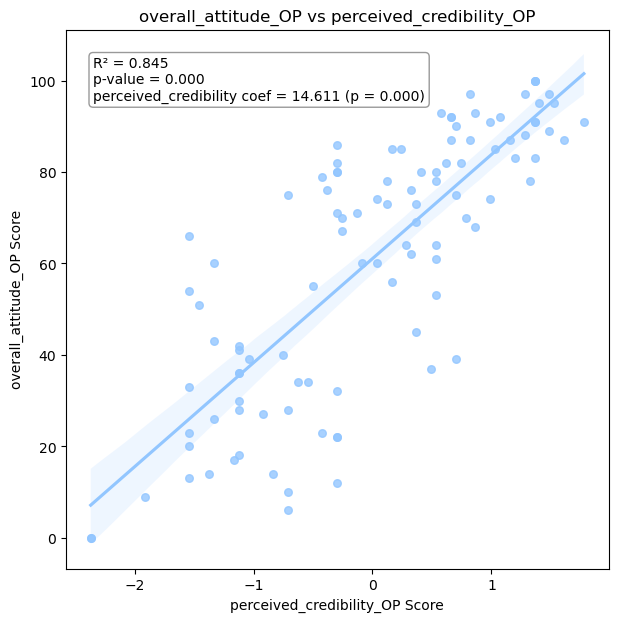


--------------------------------------------------
overall_attitude_CO (Quadratic Model)
--------------------------------------------------
                             OLS Regression Results                            
Dep. Variable:     overall_attitude_CO   R-squared:                       0.873
Model:                             OLS   Adj. R-squared:                  0.828
Method:                  Least Squares   F-statistic:                     19.35
Date:                 Mon, 09 Sep 2024   Prob (F-statistic):           4.07e-24
Time:                         15:47:31   Log-Likelihood:                -386.14
No. Observations:                  104   AIC:                             828.3
Df Residuals:                       76   BIC:                             902.3
Df Model:                           27                                         
Covariance Type:             nonrobust                                         
                                           coef    std err 

<Figure size 1000x800 with 0 Axes>

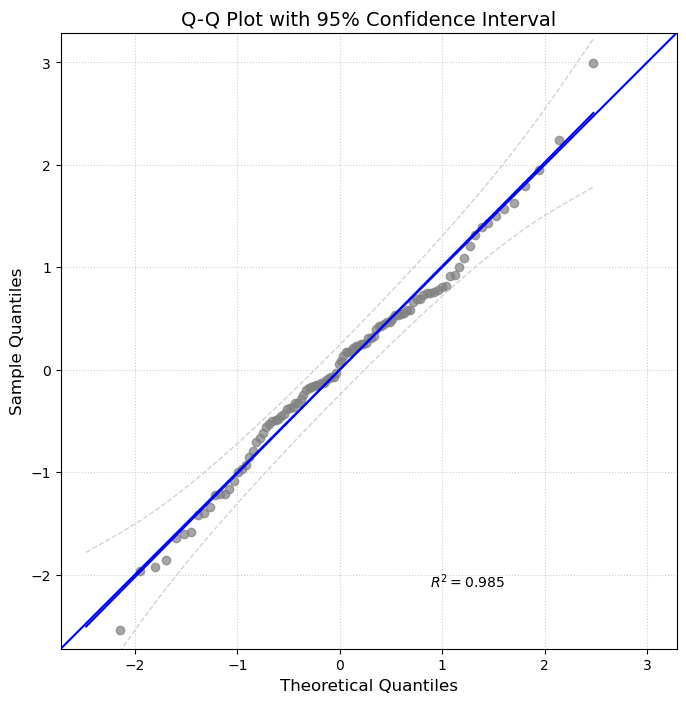


Variance Inflation Factors:
                                Variable       VIF
0                                  const  2.456175
1                                    age  1.385775
2                                 income  2.059685
3                               gender_2  2.040238
4                            education_3  1.939699
5                            education_4  2.618145
6                            education_5  2.364286
7                            education_6  1.390610
8                                 race_2  1.358961
9                                race_99  1.511279
10                          employment_5  2.580444
11                          employment_6  2.293410
12                          employment_7  4.767671
13                         employment_99  3.230154
14                          Extraversion  1.975813
15                         Agreeableness  1.723587
16                     Conscientiousness  2.414798
17                           Neuroticism  2.643165
18

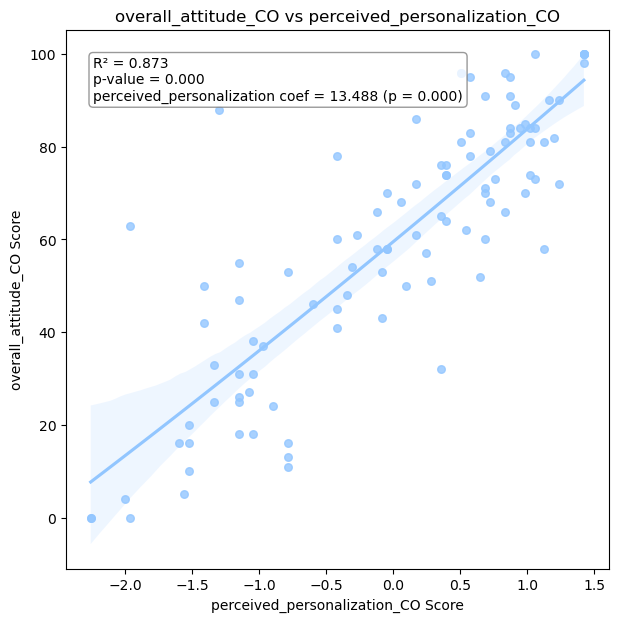

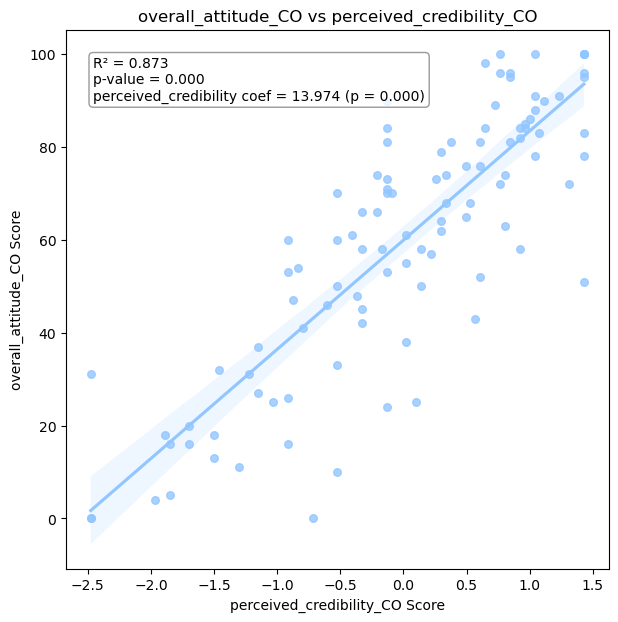


--------------------------------------------------
overall_attitude_EX (Quadratic Model)
--------------------------------------------------
                             OLS Regression Results                            
Dep. Variable:     overall_attitude_EX   R-squared:                       0.866
Model:                             OLS   Adj. R-squared:                  0.818
Method:                  Least Squares   F-statistic:                     18.16
Date:                 Mon, 09 Sep 2024   Prob (F-statistic):           3.03e-23
Time:                         15:47:32   Log-Likelihood:                -397.84
No. Observations:                  104   AIC:                             851.7
Df Residuals:                       76   BIC:                             925.7
Df Model:                           27                                         
Covariance Type:             nonrobust                                         
                                           coef    std err 

<Figure size 1000x800 with 0 Axes>

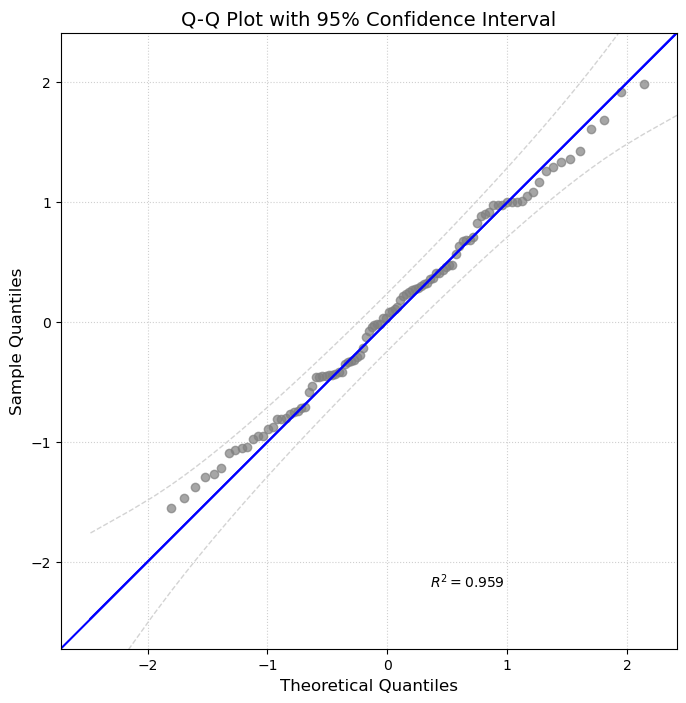


Variance Inflation Factors:
                                Variable       VIF
0                                  const  3.690905
1                                    age  1.390553
2                                 income  2.057539
3                               gender_2  2.026512
4                            education_3  1.921476
5                            education_4  2.614363
6                            education_5  2.364164
7                            education_6  1.396319
8                                 race_2  1.347920
9                                race_99  1.451151
10                          employment_5  2.533198
11                          employment_6  2.357918
12                          employment_7  4.807224
13                         employment_99  3.241112
14                          Extraversion  2.047594
15                         Agreeableness  1.682807
16                     Conscientiousness  2.440913
17                           Neuroticism  2.639414
18

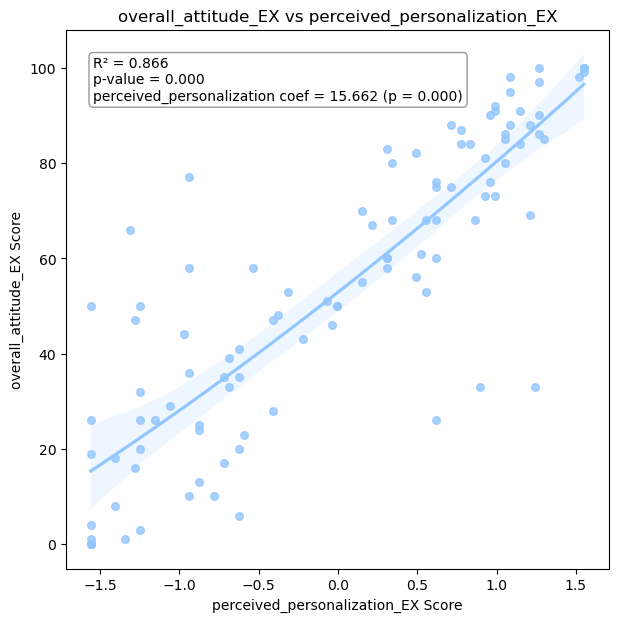

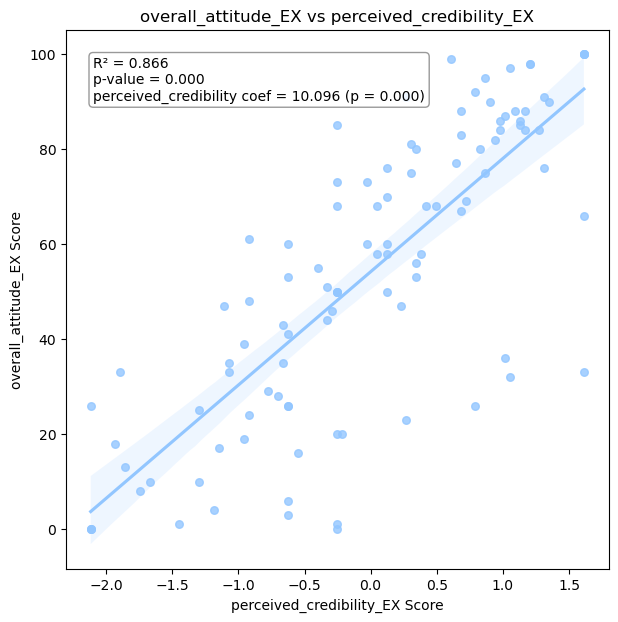


--------------------------------------------------
overall_attitude_AG (Quadratic Model)
--------------------------------------------------
                             OLS Regression Results                            
Dep. Variable:     overall_attitude_AG   R-squared:                       0.899
Model:                             OLS   Adj. R-squared:                  0.863
Method:                  Least Squares   F-statistic:                     25.00
Date:                 Mon, 09 Sep 2024   Prob (F-statistic):           1.04e-27
Time:                         15:47:33   Log-Likelihood:                -372.03
No. Observations:                  104   AIC:                             800.1
Df Residuals:                       76   BIC:                             874.1
Df Model:                           27                                         
Covariance Type:             nonrobust                                         
                                           coef    std err 

<Figure size 1000x800 with 0 Axes>

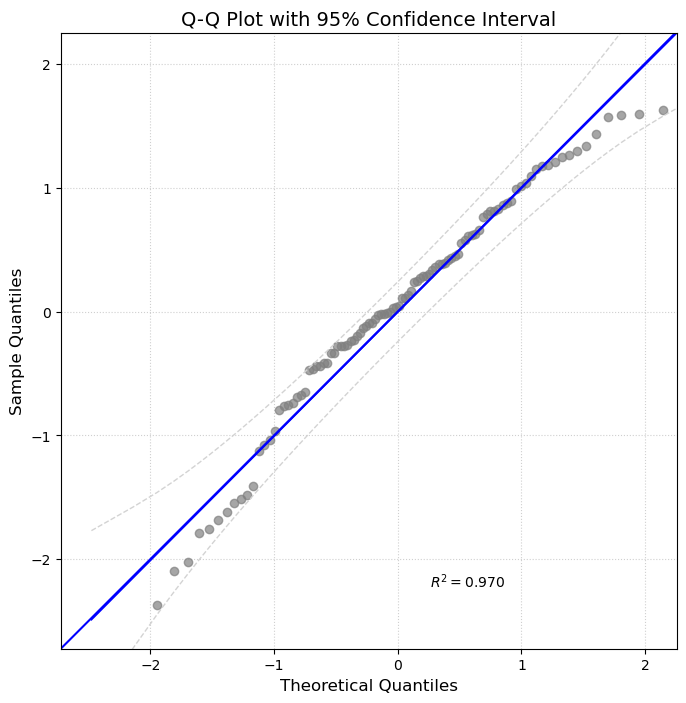


Variance Inflation Factors:
                                Variable       VIF
0                                  const  2.487007
1                                    age  1.409477
2                                 income  2.073385
3                               gender_2  2.028211
4                            education_3  1.940597
5                            education_4  2.630140
6                            education_5  2.373032
7                            education_6  1.383604
8                                 race_2  1.349542
9                                race_99  1.440135
10                          employment_5  2.652808
11                          employment_6  2.309975
12                          employment_7  4.763425
13                         employment_99  3.281272
14                          Extraversion  1.974100
15                         Agreeableness  1.701773
16                     Conscientiousness  2.353498
17                           Neuroticism  2.647071
18

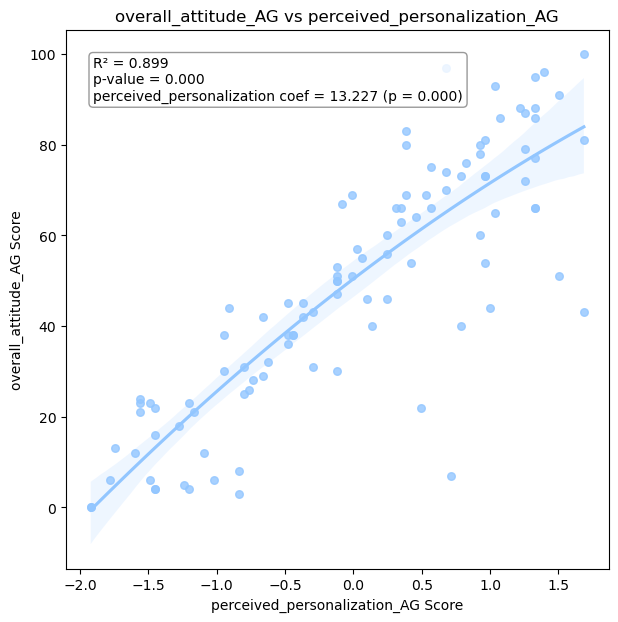

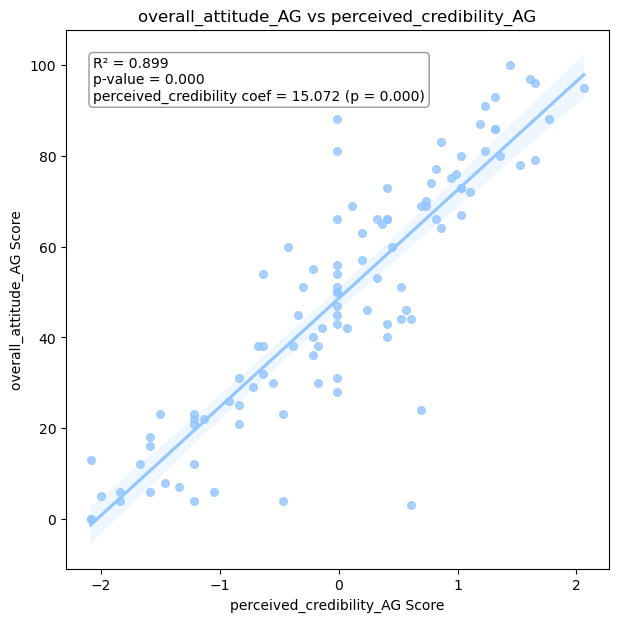

In [81]:
# For quadratic regression (to test for uncanny valley effect)
Study2a_3_results_list_quadratic = []
Study2a_3_plot_list_quadratic = []

fit_OLS_and_draw_plot(ads_scores_df, 
                      Study2a_3_results_list_quadratic, 
                      Study2a_3_plot_list_quadratic,
                      exclude_influential=False,
                      use_quadratic=True)

In [82]:
# Use the function
save_all_regression_results(Study2a_3_results_list,
                            'perceived_personalization',
                            'presentation_materials/tmp/study2a_3_personalization_results.csv')

Results saved to presentation_materials/tmp/study2a_3_personalization_results.csv


In [83]:
# Use the function
save_all_regression_results(Study2a_3_results_list_quadratic,
                            'perceived_personalization',
                            'presentation_materials/tmp/study2a_3_personalization_results_quadratic.csv')

Results saved to presentation_materials/tmp/study2a_3_personalization_results_quadratic.csv


In [84]:
# Use the function
save_all_regression_results(Study2a_3_results_list, 
                            'perceived_credibility',
                            'presentation_materials/tmp/study2a_3_credibility_results.csv')

Results saved to presentation_materials/tmp/study2a_3_credibility_results.csv


#### Study2a.4

Study2a.4. [y] 'ads_engagement' scores for each of 4 versions vs [X] 'overall_attitude' scores for each of 4 versions & matched big5 scores for each of 4 versions, controlling for socioeconomic 

[ads_engagement] Generate (1) scatter plot with fitted line with 95% CI and (2) OLS summary for each of the followings:
- ads_scores_df['ads_engagement_OP'] vs ads_scores_df['overall_attitude_OP'], ads_big5_df_final['Open_Mindedness'], controlling for socio economic
- ads_scores_df['ads_engagement_CO'] vs ads_scores_df['overall_attitude_CO'], ads_big5_df_final['Conscientiousness'], controlling for socio economic
- ads_scores_df['ads_engagement_EX'] vs ads_scores_df['overall_attitude_EX'], ads_big5_df_final['Extraversion'], controlling for socio economic
- ads_scores_df['ads_engagement_AG'] vs ads_scores_df['overall_attitude_AG'], ads_big5_df_final['Agreeableness'], controlling for socio economic

In [85]:
# Definition of X
# 1. big 5 trait scores + socio economics = ads_big5_df_final.iloc[:,1:]
# 2. overall_attitude for each of 4 personality traits
# 3. controlling: perceived_personalization
# 4. controlling: perceived_credibility

# Definition of y
# ads_engagement for each of 4 personality traits

X = ads_big5_df_final.iloc[:,1:]
X_target_constructs = ['perceived_personalization', 'perceived_credibility', 'overall_attitude']
y_target_constract = 'ads_engagement'

for construct in X_target_constructs:
    for big5_type in big5_types:
        col_name = construct + '_' + big5_type
        
        X[col_name] = ads_scores_df[col_name]

continuous_columns = []
dummy_columns = []

for col in X.columns:
    if 'race_' in col or 'employment_' in col or 'gender_' in col or 'education_' in col:
        dummy_columns.append(col)
    else:
        continuous_columns.append(col)

scaler = StandardScaler()
X_continuous_scaled = scaler.fit_transform(X[continuous_columns])
X_continuous_scaled = pd.DataFrame(X_continuous_scaled, columns=continuous_columns)
X_scaled = pd.concat([X_continuous_scaled, X[dummy_columns].reset_index(drop=True)], axis=1)

X = sm.add_constant(X)


--------------------------------------------------
ads_engagement_OP (Linear Model)
--------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:      ads_engagement_OP   R-squared:                       0.918
Model:                            OLS   Adj. R-squared:                  0.884
Method:                 Least Squares   F-statistic:                     27.15
Date:                Mon, 09 Sep 2024   Prob (F-statistic):           8.68e-29
Time:                        15:47:35   Log-Likelihood:                -380.09
No. Observations:                 104   AIC:                             822.2
Df Residuals:                      73   BIC:                             904.2
Df Model:                          30                                         
Covariance Type:            nonrobust                                         
                                   coef    std err          t      P>|t|  

<Figure size 1000x800 with 0 Axes>

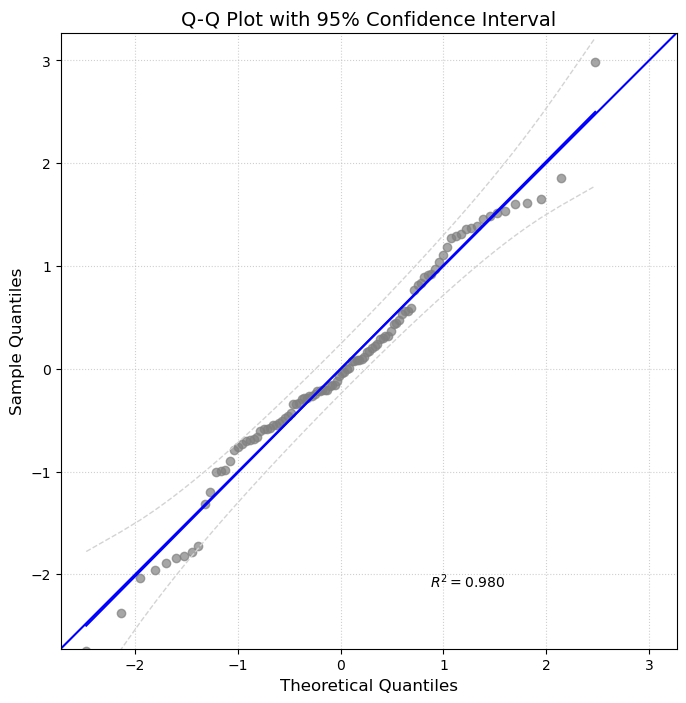


Variance Inflation Factors:
                        Variable         VIF
0                          const  272.750985
1                            age    1.554389
2                         income    2.121273
3                       gender_2    2.190641
4                    education_3    2.011126
5                    education_4    2.787526
6                    education_5    2.509418
7                    education_6    1.521856
8                         race_2    1.406188
9                        race_99    1.500913
10                  employment_5    2.849539
11                  employment_6    2.344804
12                  employment_7    5.346350
13                 employment_99    3.340161
14                  Extraversion    1.993184
15                 Agreeableness    1.754188
16             Conscientiousness    2.466522
17                   Neuroticism    2.829980
18               Open_Mindedness    1.508647
19  perceived_personalization_OP    3.557426
20  perceived_personalizat

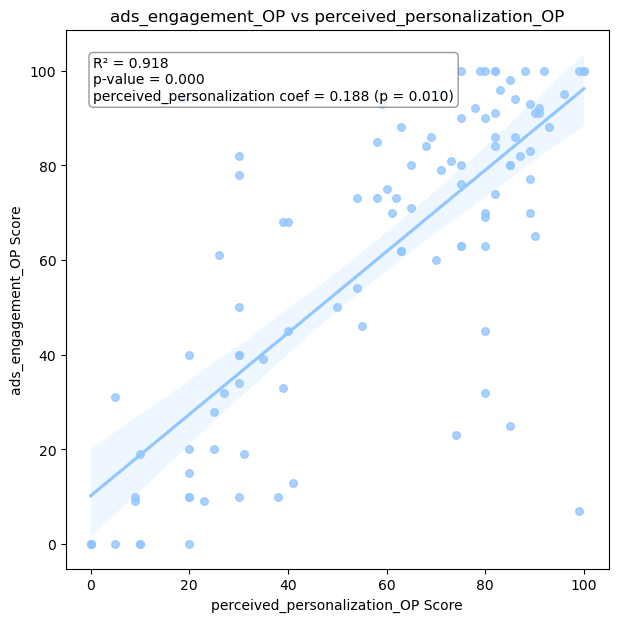

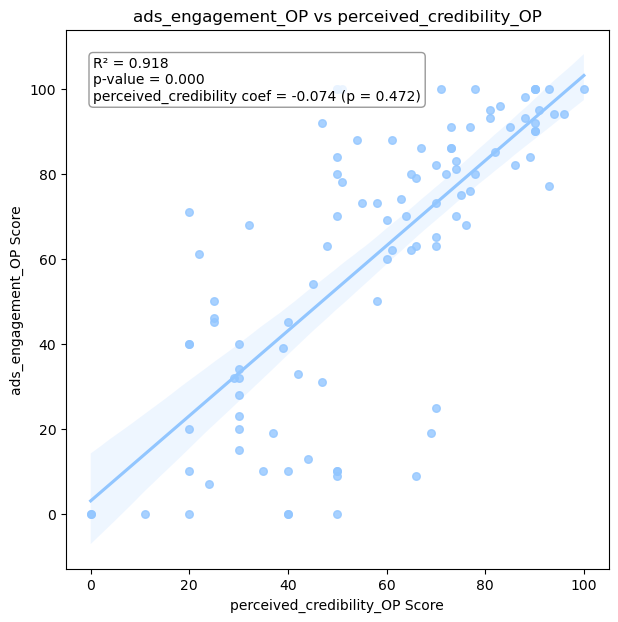

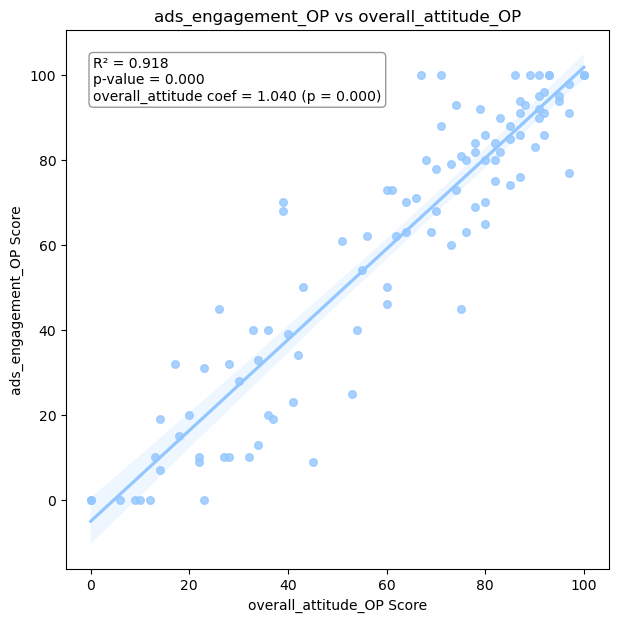


--------------------------------------------------
ads_engagement_CO (Linear Model)
--------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:      ads_engagement_CO   R-squared:                       0.872
Model:                            OLS   Adj. R-squared:                  0.820
Method:                 Least Squares   F-statistic:                     16.63
Date:                Mon, 09 Sep 2024   Prob (F-statistic):           4.02e-22
Time:                        15:47:36   Log-Likelihood:                -399.86
No. Observations:                 104   AIC:                             861.7
Df Residuals:                      73   BIC:                             943.7
Df Model:                          30                                         
Covariance Type:            nonrobust                                         
                                   coef    std err          t      P>|t|  

<Figure size 1000x800 with 0 Axes>

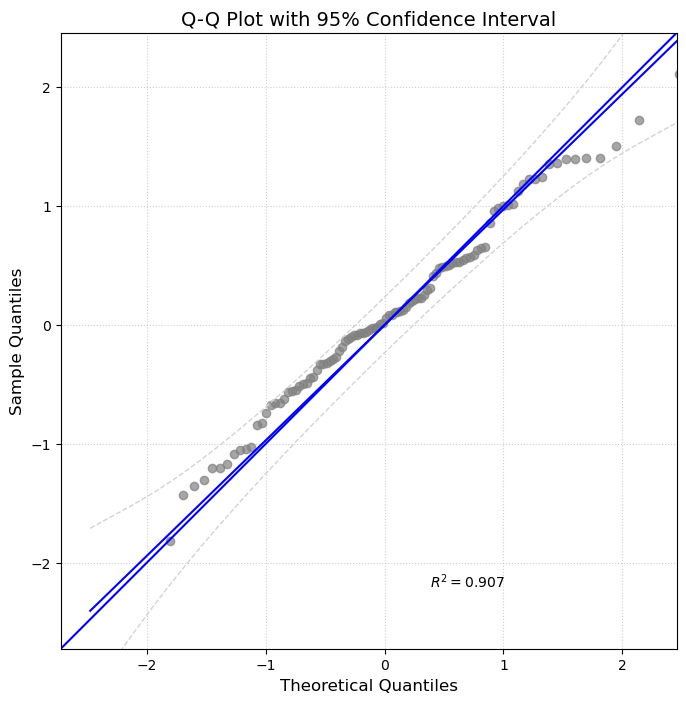


Variance Inflation Factors:
                        Variable         VIF
0                          const  272.750985
1                            age    1.554389
2                         income    2.121273
3                       gender_2    2.190641
4                    education_3    2.011126
5                    education_4    2.787526
6                    education_5    2.509418
7                    education_6    1.521856
8                         race_2    1.406188
9                        race_99    1.500913
10                  employment_5    2.849539
11                  employment_6    2.344804
12                  employment_7    5.346350
13                 employment_99    3.340161
14                  Extraversion    1.993184
15                 Agreeableness    1.754188
16             Conscientiousness    2.466522
17                   Neuroticism    2.829980
18               Open_Mindedness    1.508647
19  perceived_personalization_OP    3.557426
20  perceived_personalizat

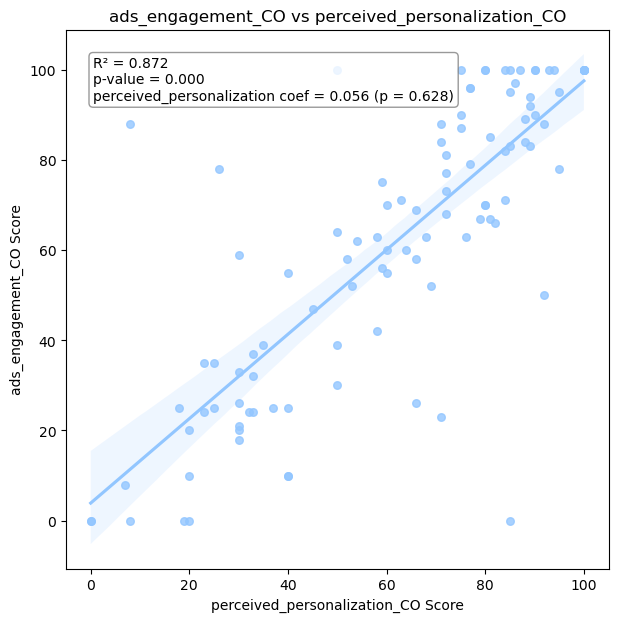

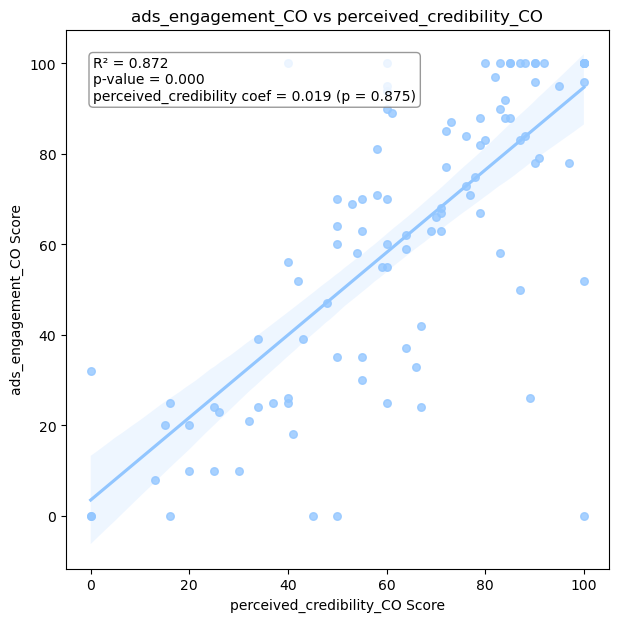

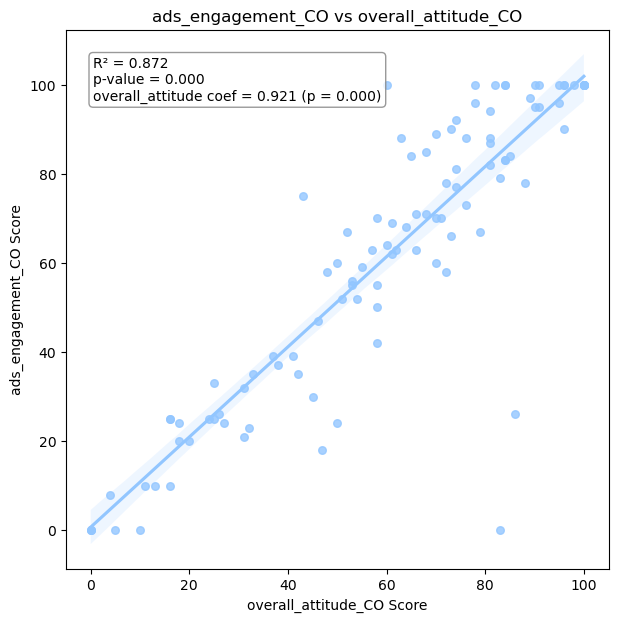


--------------------------------------------------
ads_engagement_EX (Linear Model)
--------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:      ads_engagement_EX   R-squared:                       0.919
Model:                            OLS   Adj. R-squared:                  0.886
Method:                 Least Squares   F-statistic:                     27.75
Date:                Mon, 09 Sep 2024   Prob (F-statistic):           4.28e-29
Time:                        15:47:37   Log-Likelihood:                -383.28
No. Observations:                 104   AIC:                             828.6
Df Residuals:                      73   BIC:                             910.5
Df Model:                          30                                         
Covariance Type:            nonrobust                                         
                                   coef    std err          t      P>|t|  

<Figure size 1000x800 with 0 Axes>

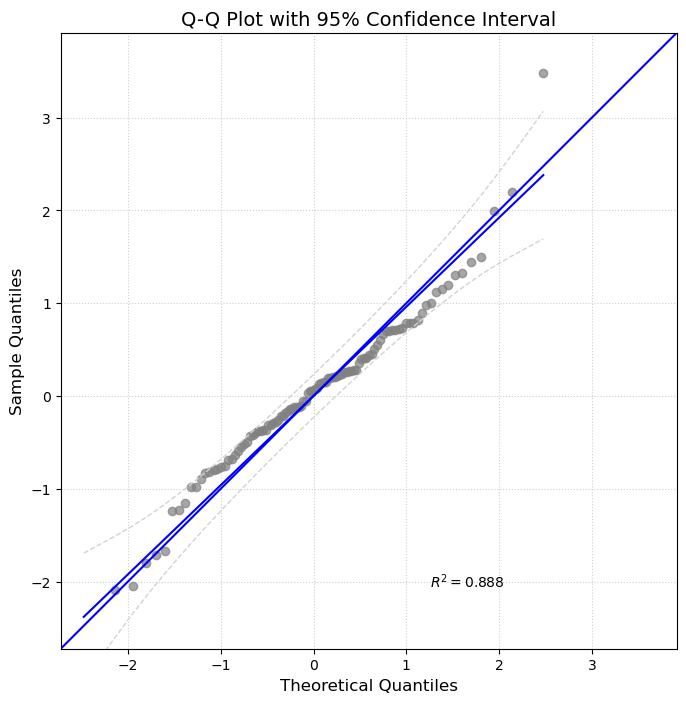


Variance Inflation Factors:
                        Variable         VIF
0                          const  272.750985
1                            age    1.554389
2                         income    2.121273
3                       gender_2    2.190641
4                    education_3    2.011126
5                    education_4    2.787526
6                    education_5    2.509418
7                    education_6    1.521856
8                         race_2    1.406188
9                        race_99    1.500913
10                  employment_5    2.849539
11                  employment_6    2.344804
12                  employment_7    5.346350
13                 employment_99    3.340161
14                  Extraversion    1.993184
15                 Agreeableness    1.754188
16             Conscientiousness    2.466522
17                   Neuroticism    2.829980
18               Open_Mindedness    1.508647
19  perceived_personalization_OP    3.557426
20  perceived_personalizat

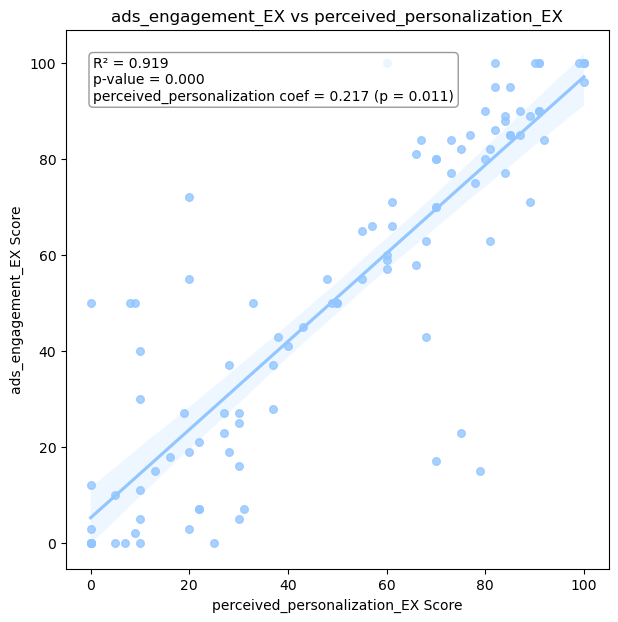

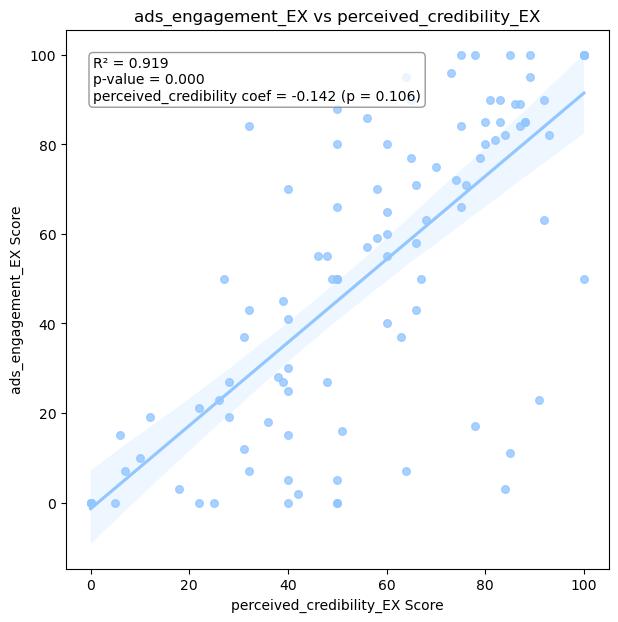

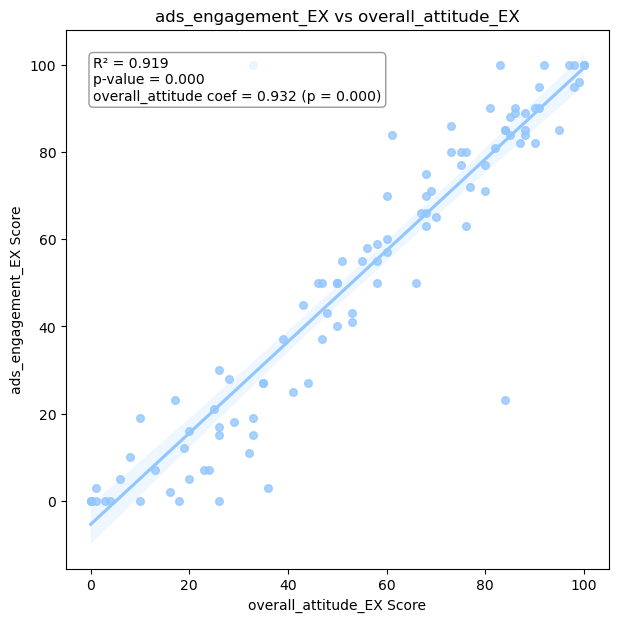


--------------------------------------------------
ads_engagement_AG (Linear Model)
--------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:      ads_engagement_AG   R-squared:                       0.958
Model:                            OLS   Adj. R-squared:                  0.941
Method:                 Least Squares   F-statistic:                     56.15
Date:                Mon, 09 Sep 2024   Prob (F-statistic):           2.32e-39
Time:                        15:47:39   Log-Likelihood:                -338.79
No. Observations:                 104   AIC:                             739.6
Df Residuals:                      73   BIC:                             821.6
Df Model:                          30                                         
Covariance Type:            nonrobust                                         
                                   coef    std err          t      P>|t|  

<Figure size 1000x800 with 0 Axes>

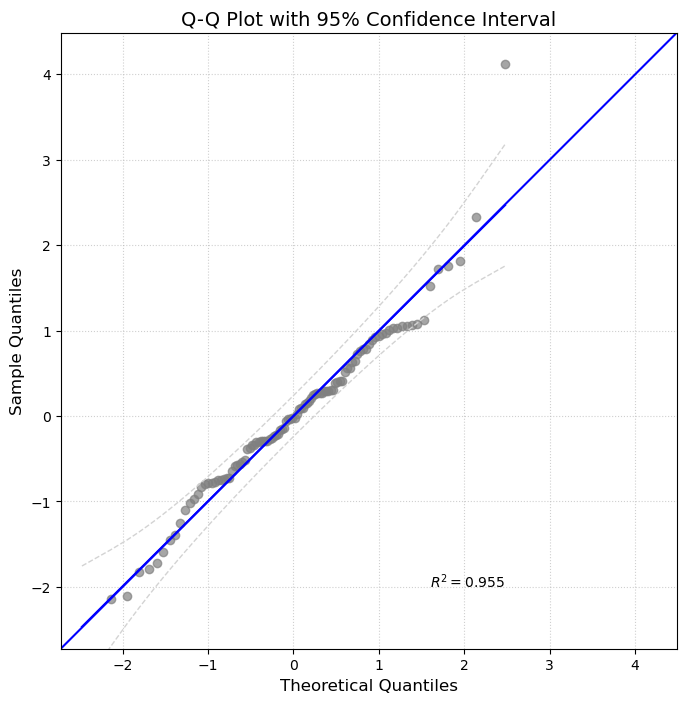


Variance Inflation Factors:
                        Variable         VIF
0                          const  272.750985
1                            age    1.554389
2                         income    2.121273
3                       gender_2    2.190641
4                    education_3    2.011126
5                    education_4    2.787526
6                    education_5    2.509418
7                    education_6    1.521856
8                         race_2    1.406188
9                        race_99    1.500913
10                  employment_5    2.849539
11                  employment_6    2.344804
12                  employment_7    5.346350
13                 employment_99    3.340161
14                  Extraversion    1.993184
15                 Agreeableness    1.754188
16             Conscientiousness    2.466522
17                   Neuroticism    2.829980
18               Open_Mindedness    1.508647
19  perceived_personalization_OP    3.557426
20  perceived_personalizat

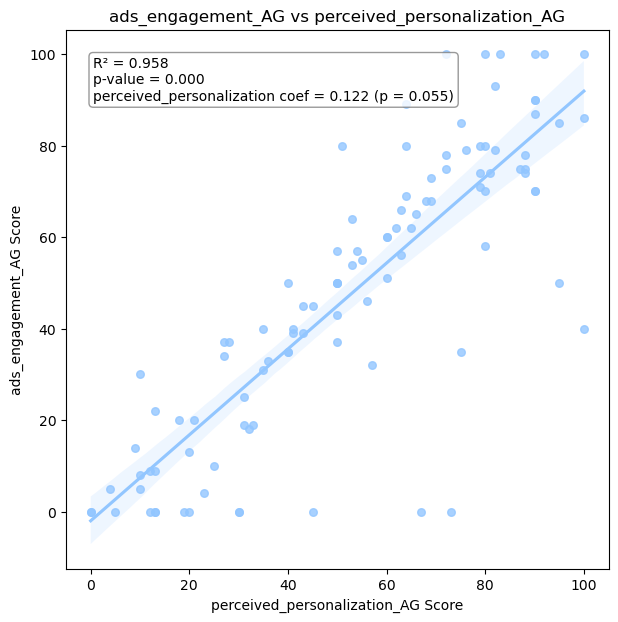

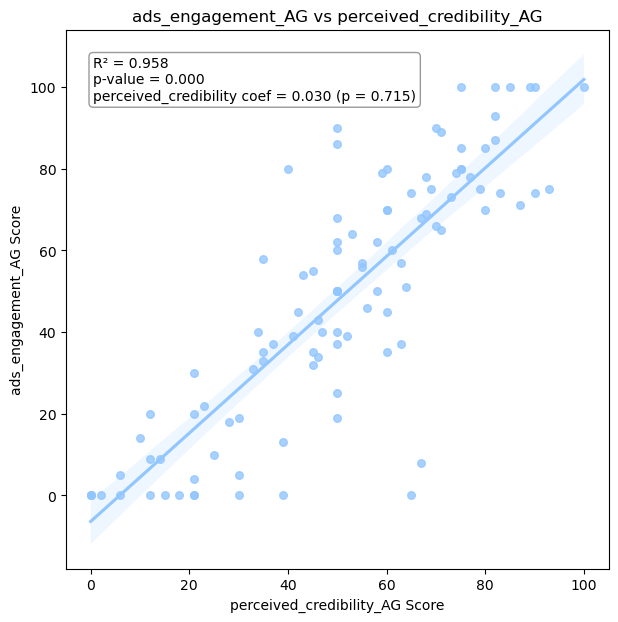

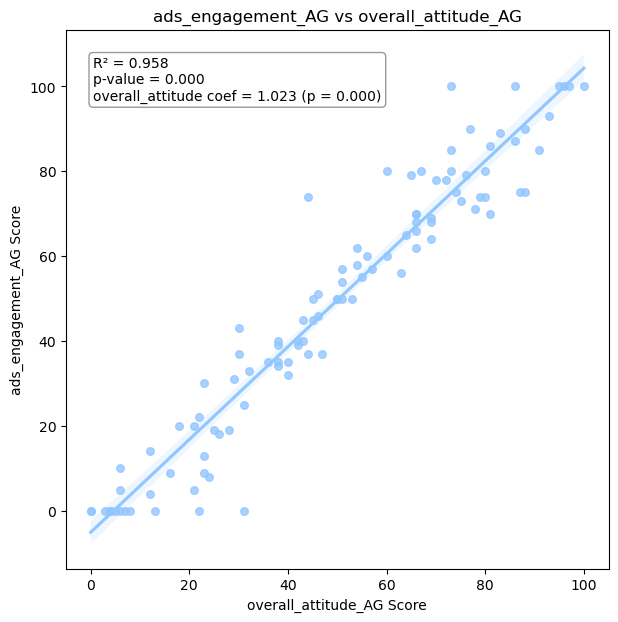

In [86]:
Study2a_4_results_list = []
Study2a_4_plot_list = []

fit_OLS_and_draw_plot(ads_scores_df, 
                      Study2a_4_results_list, Study2a_4_plot_list)


--------------------------------------------------
ads_engagement_OP (Ridge Regression)
--------------------------------------------------
Ridge R-squared: 0.9166 (best alpha=1.0000)

Ridge Coefficients:
const: 63.5312 (95% CI: [56.4581, 70.7385])
age: 2.7544 (95% CI: [-0.0610, 5.6236])
income: 1.4263 (95% CI: [-1.9056, 4.4876])
Extraversion: 0.9840 (95% CI: [-2.6744, 4.5434])
Agreeableness: -0.9600 (95% CI: [-4.2978, 2.0614])
Conscientiousness: 0.2086 (95% CI: [-3.4033, 3.5123])
Neuroticism: 1.7458 (95% CI: [-2.7198, 5.2595])
Open_Mindedness: -1.1948 (95% CI: [-3.5496, 1.6335])
perceived_personalization_OP: 5.7889 (95% CI: [1.0051, 11.1777])
perceived_personalization_CO: -5.4672 (95% CI: [-9.1708, 0.0689])
perceived_personalization_EX: -0.6590 (95% CI: [-6.4268, 5.6926])
perceived_personalization_AG: 2.0496 (95% CI: [-2.3666, 6.5167])
perceived_credibility_OP: -0.5801 (95% CI: [-5.7178, 4.9557])
perceived_credibility_CO: 1.0259 (95% CI: [-3.7010, 6.2635])
perceived_credibility_EX: -4

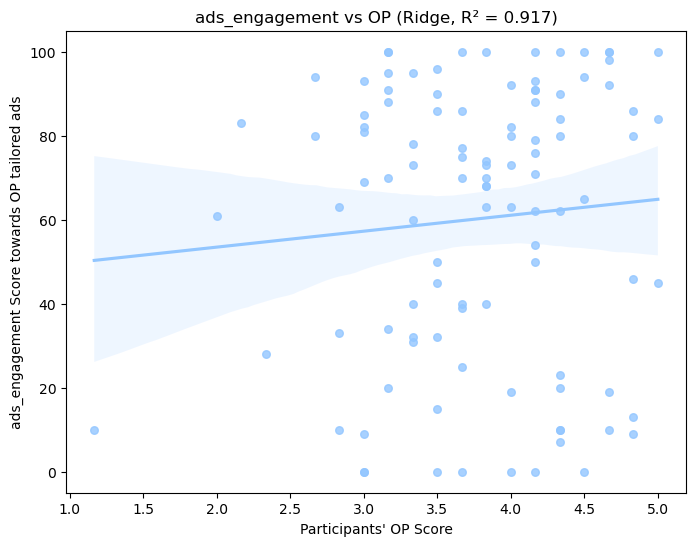


--------------------------------------------------
ads_engagement_CO (Ridge Regression)
--------------------------------------------------
Ridge R-squared: 0.8526 (best alpha=10.0000)

Ridge Coefficients:
const: 61.8512 (95% CI: [57.3255, 65.3826])
age: -0.1972 (95% CI: [-2.5222, 2.6134])
income: 2.8225 (95% CI: [-0.3453, 6.0135])
Extraversion: -0.7564 (95% CI: [-3.4909, 1.9277])
Agreeableness: -2.0864 (95% CI: [-4.4867, 0.3422])
Conscientiousness: 1.6393 (95% CI: [-1.0528, 4.6045])
Neuroticism: -0.7983 (95% CI: [-3.3656, 2.2828])
Open_Mindedness: 1.4013 (95% CI: [-1.2960, 4.2120])
perceived_personalization_OP: 0.8213 (95% CI: [-2.9821, 3.5651])
perceived_personalization_CO: 5.5349 (95% CI: [1.6766, 11.1067])
perceived_personalization_EX: 1.0068 (95% CI: [-2.4145, 4.0952])
perceived_personalization_AG: 2.6189 (95% CI: [-0.2644, 5.2969])
perceived_credibility_OP: 1.3363 (95% CI: [-1.7756, 3.5795])
perceived_credibility_CO: 4.7743 (95% CI: [1.4123, 8.1829])
perceived_credibility_EX: -2.

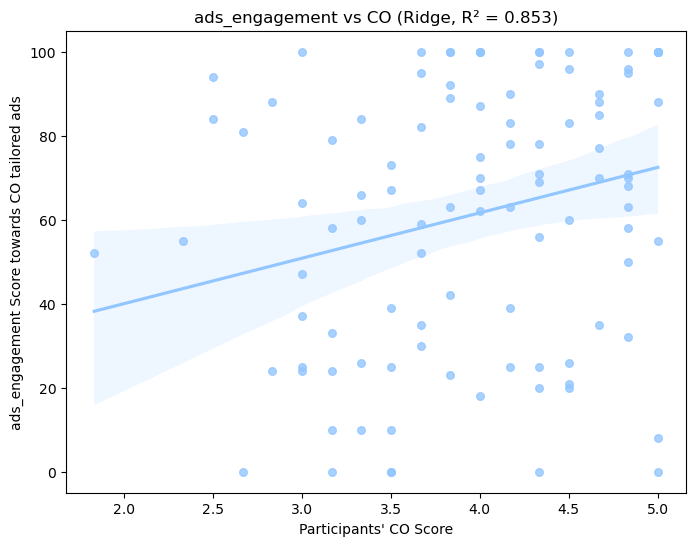


--------------------------------------------------
ads_engagement_EX (Ridge Regression)
--------------------------------------------------
Ridge R-squared: 0.9034 (best alpha=10.0000)

Ridge Coefficients:
const: 51.5088 (95% CI: [47.1511, 55.1516])
age: -0.6320 (95% CI: [-2.5239, 1.4659])
income: 0.2471 (95% CI: [-2.0099, 2.3972])
Extraversion: 1.0510 (95% CI: [-1.2993, 3.3934])
Agreeableness: -0.8823 (95% CI: [-3.5539, 1.3126])
Conscientiousness: 1.2290 (95% CI: [-1.5385, 3.6510])
Neuroticism: -0.6166 (95% CI: [-3.4026, 2.3178])
Open_Mindedness: -2.0906 (95% CI: [-4.5080, 0.0283])
perceived_personalization_OP: 0.7876 (95% CI: [-1.7443, 3.1249])
perceived_personalization_CO: -1.9332 (95% CI: [-4.6045, 1.3097])
perceived_personalization_EX: 10.0478 (95% CI: [6.2680, 13.6443])
perceived_personalization_AG: 2.4467 (95% CI: [-0.3859, 5.0257])
perceived_credibility_OP: 0.9181 (95% CI: [-1.4675, 3.0426])
perceived_credibility_CO: 0.1679 (95% CI: [-3.1681, 2.6354])
perceived_credibility_EX: 

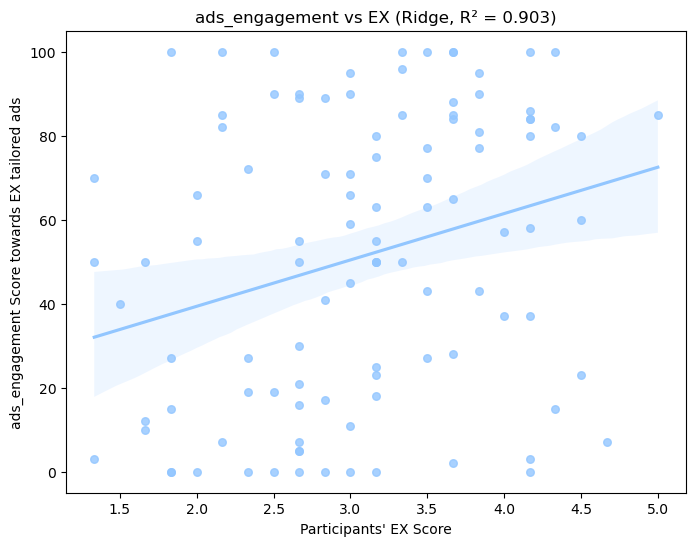


--------------------------------------------------
ads_engagement_AG (Ridge Regression)
--------------------------------------------------
Ridge R-squared: 0.9578 (best alpha=1.0000)

Ridge Coefficients:
const: 49.7069 (95% CI: [45.4239, 53.8697])
age: 1.3199 (95% CI: [-0.2974, 2.9805])
income: 3.4486 (95% CI: [1.4296, 5.3454])
Extraversion: 0.7329 (95% CI: [-1.4882, 3.0745])
Agreeableness: -1.2780 (95% CI: [-3.3177, 0.5038])
Conscientiousness: 1.5851 (95% CI: [-1.0342, 4.0600])
Neuroticism: 1.3114 (95% CI: [-1.1206, 3.6193])
Open_Mindedness: -0.1421 (95% CI: [-1.7755, 1.7236])
perceived_personalization_OP: -0.8305 (95% CI: [-3.2943, 1.8471])
perceived_personalization_CO: -1.7294 (95% CI: [-4.8996, 1.7901])
perceived_personalization_EX: 0.9260 (95% CI: [-3.4191, 4.7973])
perceived_personalization_AG: 4.2393 (95% CI: [0.9755, 9.2099])
perceived_credibility_OP: -2.3377 (95% CI: [-5.0420, 0.8871])
perceived_credibility_CO: 1.5572 (95% CI: [-1.5225, 4.2842])
perceived_credibility_EX: -2.4

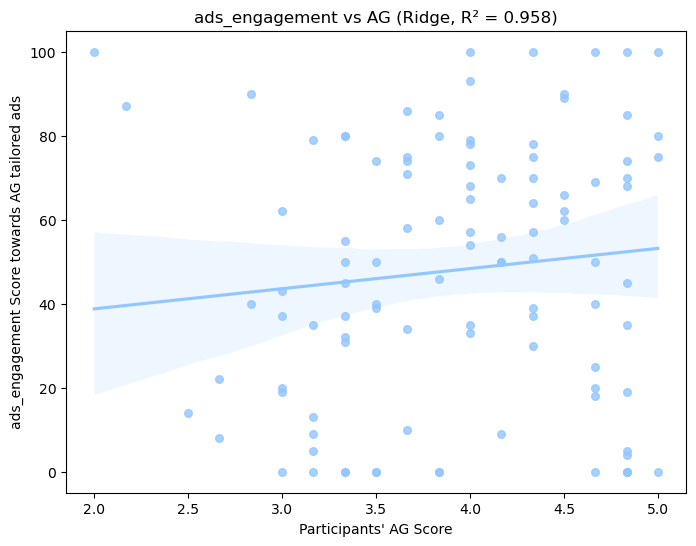

In [87]:
# Ridge Regression for Study2a_4
X = ads_big5_df_final.iloc[:,1:]
X_target_constructs = ['perceived_personalization', 'perceived_credibility', 'overall_attitude']
y_target_constract = 'ads_engagement'

for construct in X_target_constructs:
    for big5_type in big5_types:
        col_name = construct + '_' + big5_type
        X[col_name] = ads_scores_df[col_name]

continuous_columns = []
dummy_columns = []

for col in X.columns:
    if 'race_' in col or 'employment_' in col or 'gender_' in col or 'education_' in col:
        dummy_columns.append(col)
    else:
        continuous_columns.append(col)

scaler = StandardScaler()
X_continuous_scaled = scaler.fit_transform(X[continuous_columns])
X_continuous_scaled = pd.DataFrame(X_continuous_scaled, columns=continuous_columns)
X_scaled = pd.concat([X_continuous_scaled, X[dummy_columns].reset_index(drop=True)], axis=1)

Study2a_4_ridge_results = []
Study2a_4_ridge_plot_list = []

for big5_type in big5_types:
    col = y_target_constract + '_' + big5_type
    y = ads_scores_df[col]
    
    # Perform Ridge regression with cross-validation
    alphas = np.logspace(-6, 6, 13)
    ridge_cv = RidgeCV(alphas=alphas, store_cv_values=True, fit_intercept=True)
    ridge_cv.fit(X_scaled, y)
    best_alpha = ridge_cv.alpha_
    
    # Make predictions
    y_pred_ridge = ridge_cv.predict(X_scaled)
    
    # Calculate R-squared
    r_squared_ridge = calculate_r_squared(y, y_pred_ridge)
    
    # Bootstrap for Ridge CI
    coef_samples = bootstrap_ridge(X_scaled, y, n_iterations=1000, alpha=best_alpha)
    ci_lower = np.percentile(coef_samples, 2.5, axis=0)
    ci_upper = np.percentile(coef_samples, 97.5, axis=0)
    
    print(f"\n{'-'*50}\n{y_target_constract}_{big5_type} (Ridge Regression)\n{'-'*50}")
    print(f"Ridge R-squared: {r_squared_ridge:.4f} (best alpha={best_alpha:.4f})")
    
    # Store results
    Study2a_4_ridge_results.append((ridge_cv, r_squared_ridge, best_alpha, ci_lower, ci_upper))
    
    # Print coefficients
    print("\nRidge Coefficients:")
    for i, (name, coef) in enumerate(zip(['const'] + list(X_scaled.columns), np.insert(ridge_cv.coef_, 0, ridge_cv.intercept_))):
        ci_l, ci_u = ci_lower[i], ci_upper[i]
        print(f"{name}: {coef:.4f} (95% CI: [{ci_l:.4f}, {ci_u:.4f}])")
    
    # Plotting (using full dataset for visualization)
    col_flag = big5_lookup[big5_type]
    plt.figure(figsize=(8, 6))
    sns.regplot(x=ads_big5_df_final[col_flag], y=y, ci=95, scatter_kws={"s": 30})
    plt.xlabel(f"Participants' {big5_type} Score")
    plt.ylabel(f"{y_target_constract} Score towards {big5_type} tailored ads")
    plt.title(f"{y_target_constract} vs {big5_type} (Ridge, R² = {r_squared_ridge:.3f})")

    # Save or show the plot
    Study2a_4_ridge_plot_list.append(plt)
    plt.show()

In [88]:
# Use the function
save_all_regression_results(Study2a_4_results_list, 
                            'overall_attitude',
                            'presentation_materials/tmp/study2a_4_results.csv')

Results saved to presentation_materials/tmp/study2a_4_results.csv


## **Study2b**

![image.png](attachment:image.png)

Features to be regressed:
1. [y] each of the constructs(same questions for 4 different(big5) personalized contents) vs [X] big5 scores, controlling for socioeconomic 
2. [y] 'chat_overall_attitude' scores for each of 4 versions vs [X] 'chat_perceived_personalization' scores for each of 4 versions & matched big5 scores for each of 4 versions, controlling for socioeconomic 
3. [y] 'ads_engagement' scores for each of 4 versions vs [X] 'chat_overall_attitude' scores for each of 4 versions & matched big5 scores for each of 4 versions & 'chat_perceived_personalization' scores for each of 4 versions, controlling for socioeconomic 

#### Study 2b Preprocessing

In [89]:
# prep
socioecono_columns = ['gender',	'age',	'education', 'race', 'employment', 'income']                               # redefine to clarify
categorical_cols = ['gender', 'education', 'race', 'employment']                                                   # redefine categorical variables
chat_scores_result_cols = chat_scores.iloc[:,1:].columns.tolist()                                                  # responses to study2b
chat_constructs = ['chat_perceived_personalization', 'chat_overall_attitude', 'chat_engagement']                 # construct base names for chat

In [90]:
chat_scores_df = pd.merge(chat_scores, socioecono_df, on='ResponseId', how='left')
chat_scores_df

,ResponseId,chat_perceived_personalization_OP,chat_trust_OP,chat_satisfaction_OP,chat_positive_emotion_OP,chat_engagement_OP,chat_perceived_personalization_CO,chat_trust_CO,chat_satisfaction_CO,chat_positive_emotion_CO,chat_engagement_CO,chat_perceived_personalization_EX,chat_trust_EX,chat_satisfaction_EX,chat_positive_emotion_EX,chat_engagement_EX,chat_perceived_personalization_AG,chat_trust_AG,chat_satisfaction_AG,chat_positive_emotion_AG,chat_engagement_AG,chat_overall_attitude_OP,chat_overall_attitude_CO,chat_overall_attitude_EX,chat_overall_attitude_AG,gender,age,education,race,employment,income
0,r11,86,87,100,100,100,100,94,100,90,100,100,84,83,91,81,85,87,80,93,94,95,94,86,86,1,34,4,2,5,1
1,r12,32,27,26,31,23,21,16,19,31,22,32,36,27,33,36,50,50,53,52,35,28,22,32,51,1,36,5,1,7,7
2,r13,69,68,89,78,77,82,71,91,76,80,74,75,78,76,78,71,67,77,70,70,78,79,76,71,2,48,5,1,6,11
3,r14,59,56,56,56,56,61,62,60,63,54,58,53,62,67,58,57,54,64,70,54,56,61,60,62,2,41,4,1,5,5
4,r15,59,60,58,58,60,62,59,60,59,61,62,60,59,59,58,58,60,62,68,59,58,59,59,63,2,48,2,1,1,9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99,r128,81,86,86,89,88,86,88,87,93,88,100,95,95,96,91,98,87,89,91,98,87,89,95,89,2,27,4,2,1,1
100,r129,83,51,70,50,56,82,91,100,0,44,50,54,67,0,29,60,91,85,0,33,57,63,40,58,2,30,2,1,6,5
101,r131,91,94,98,98,99,92,93,97,99,98,93,95,97,100,98,92,94,96,99,97,96,96,97,96,2,55,5,2,99,11
102,r133,92,91,93,91,93,80,85,86,84,87,85,86,88,86,88,92,85,86,83,85,91,85,86,84,1,43,5,2,7,12


In [91]:
chat_scores_df_dummies = pd.get_dummies(chat_scores_df[categorical_cols], columns=categorical_cols, drop_first=True)
chat_scores_df = pd.concat([chat_scores_df.drop(chat_scores_df[categorical_cols], axis = 1), chat_scores_df_dummies], axis=1)

boolean_cols = chat_scores_df.select_dtypes(include=['bool']).columns
chat_scores_df[boolean_cols] = chat_scores_df[boolean_cols].astype(int)
chat_scores_df

,ResponseId,chat_perceived_personalization_OP,chat_trust_OP,chat_satisfaction_OP,chat_positive_emotion_OP,chat_engagement_OP,chat_perceived_personalization_CO,chat_trust_CO,chat_satisfaction_CO,chat_positive_emotion_CO,chat_engagement_CO,chat_perceived_personalization_EX,chat_trust_EX,chat_satisfaction_EX,chat_positive_emotion_EX,chat_engagement_EX,chat_perceived_personalization_AG,chat_trust_AG,chat_satisfaction_AG,chat_positive_emotion_AG,chat_engagement_AG,chat_overall_attitude_OP,chat_overall_attitude_CO,chat_overall_attitude_EX,chat_overall_attitude_AG,age,income,gender_2,education_3,education_4,education_5,education_6,race_2,race_99,employment_5,employment_6,employment_7,employment_99
0,r11,86,87,100,100,100,100,94,100,90,100,100,84,83,91,81,85,87,80,93,94,95,94,86,86,34,1,0,0,1,0,0,1,0,1,0,0,0
1,r12,32,27,26,31,23,21,16,19,31,22,32,36,27,33,36,50,50,53,52,35,28,22,32,51,36,7,0,0,0,1,0,0,0,0,0,1,0
2,r13,69,68,89,78,77,82,71,91,76,80,74,75,78,76,78,71,67,77,70,70,78,79,76,71,48,11,1,0,0,1,0,0,0,0,1,0,0
3,r14,59,56,56,56,56,61,62,60,63,54,58,53,62,67,58,57,54,64,70,54,56,61,60,62,41,5,1,0,1,0,0,0,0,1,0,0,0
4,r15,59,60,58,58,60,62,59,60,59,61,62,60,59,59,58,58,60,62,68,59,58,59,59,63,48,9,1,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99,r128,81,86,86,89,88,86,88,87,93,88,100,95,95,96,91,98,87,89,91,98,87,89,95,89,27,1,1,0,1,0,0,1,0,0,0,0,0
100,r129,83,51,70,50,56,82,91,100,0,44,50,54,67,0,29,60,91,85,0,33,57,63,40,58,30,5,1,0,0,0,0,0,0,0,1,0,0
101,r131,91,94,98,98,99,92,93,97,99,98,93,95,97,100,98,92,94,96,99,97,96,96,97,96,55,11,1,0,0,1,0,1,0,0,0,0,1
102,r133,92,91,93,91,93,80,85,86,84,87,85,86,88,86,88,92,85,86,83,85,91,85,86,84,43,12,0,0,0,1,0,1,0,0,0,1,0


In [92]:
chat_id = chat_scores_df['ResponseId'].unique().tolist()
stmd_chat_scores_df = chat_scores_df.drop(chat_scores_df[chat_scores_result_cols], axis = 1)
chat_big5_df_final = pd.merge(stmd_chat_scores_df, big5_df_final, on='ResponseId', how='left')

boolean_cols = chat_big5_df_final.select_dtypes(include=['bool']).columns
chat_big5_df_final[boolean_cols] = chat_big5_df_final[boolean_cols].astype(int)
chat_big5_df_final

,ResponseId,age,income,gender_2,education_3,education_4,education_5,education_6,race_2,race_99,employment_5,employment_6,employment_7,employment_99,Extraversion,Agreeableness,Conscientiousness,Neuroticism,Open_Mindedness
0,r11,34,1,0,0,1,0,0,1,0,1,0,0,0,3.666667,4.000000,3.500000,2.166667,3.000000
1,r12,36,7,0,0,0,1,0,0,0,0,0,1,0,3.833333,3.166667,4.166667,1.833333,4.166667
2,r13,48,11,1,0,0,1,0,0,0,0,1,0,0,4.166667,3.166667,4.666667,1.833333,3.166667
3,r14,41,5,1,0,1,0,0,0,0,1,0,0,0,3.166667,3.333333,3.000000,4.000000,4.166667
4,r15,48,9,1,0,0,0,0,0,0,0,0,0,0,3.000000,4.333333,3.500000,2.666667,4.166667
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99,r128,27,1,1,0,1,0,0,1,0,0,0,0,0,3.333333,3.000000,3.166667,3.666667,4.166667
100,r129,30,5,1,0,0,0,0,0,0,0,1,0,0,3.500000,4.833333,4.333333,1.000000,3.000000
101,r131,55,11,1,0,0,1,0,1,0,0,0,0,1,3.666667,4.833333,4.333333,1.166667,4.666667
102,r133,43,12,0,0,0,1,0,1,0,0,0,1,0,3.833333,4.000000,4.666667,1.666667,4.000000


#### Study2b.1

Study2b.1: [y] each of the constructs(same questions for 4 different(big5) personalized contents) vs [X] big5 scores, controlling for socioeconomic 

[chat_perceived_personalization] Generate (1) scatter plot with fitted line with 95% CI and (2) OLS summary for each of the followings:
- chat_scores_df['chat_perceived_personalization_OP'] vs chat_big5_df_final['Open_Mindedness'], controlling for socio economic
- chat_scores_df['chat_perceived_personalization_CO'] vs chat_big5_df_final['Conscientiousness'], controlling for socio economic
- chat_scores_df['chat_perceived_personalization_EX'] vs chat_big5_df_final['Extraversion'], controlling for socio economic
- chat_scores_df['chat_perceived_personalization_AG'] vs chat_big5_df_final['Agreeableness'], controlling for socio economic

[chat_overall_attitude] Generate (1) scatter plot with fitted line with 95% CI and (2) OLS summary for each of the followings:
- chat_scores_df['chat_overall_attitude_OP'] vs chat_big5_df_final['Open_Mindedness'], controlling for socio economic
- chat_scores_df['chat_overall_attitude_CO'] vs chat_big5_df_final['Conscientiousness'], controlling for socio economic
- chat_scores_df['chat_overall_attitude_EX'] vs chat_big5_df_final['Extraversion'], controlling for socio economic
- chat_scores_df['chat_overall_attitude_AG'] vs chat_big5_df_final['Agreeableness'], controlling for socio economic

[chat_engagement] Generate (1) scatter plot with fitted line with 95% CI and (2) OLS summary for each of the followings:
- chat_scores_df['chat_engagement_OP'] vs chat_big5_df_final['Open_Mindedness'], controlling for socio economic
- chat_scores_df['chat_engagement_CO'] vs chat_big5_df_final['Conscientiousness'], controlling for socio economic
- chat_scores_df['chat_engagement_EX'] vs chat_big5_df_final['Extraversion'], controlling for socio economic
- chat_scores_df['chat_engagement_AG'] vs chat_big5_df_final['Agreeableness'], controlling for socio economic


--------------------------------------------------
chat_perceived_personalization OP (Full Model)
--------------------------------------------------
                                    OLS Regression Results                                   
Dep. Variable:     chat_perceived_personalization_OP   R-squared:                       0.298
Model:                                           OLS   Adj. R-squared:                  0.150
Method:                                Least Squares   F-statistic:                     2.007
Date:                               Mon, 09 Sep 2024   Prob (F-statistic):             0.0176
Time:                                       15:47:58   Log-Likelihood:                -465.00
No. Observations:                                104   AIC:                             968.0
Df Residuals:                                     85   BIC:                             1018.
Df Model:                                         18                                         
Cova

<Figure size 1000x800 with 0 Axes>

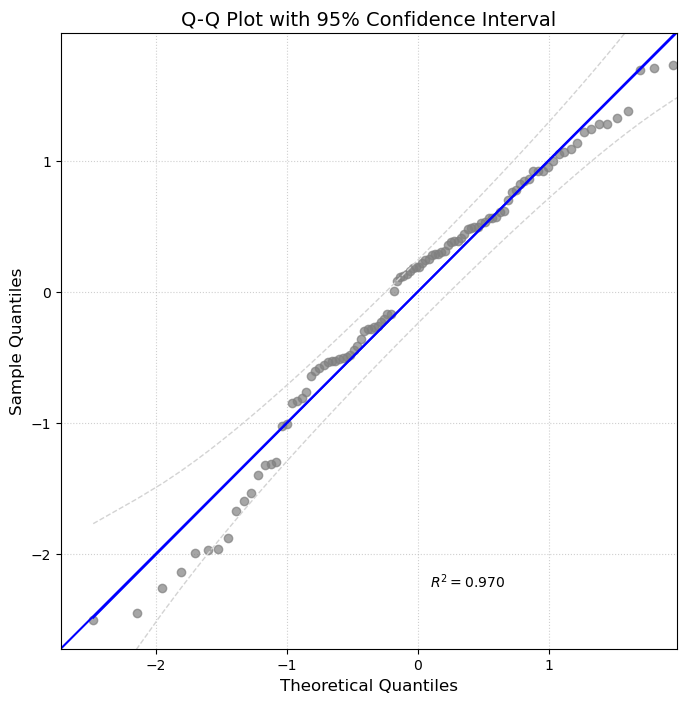


Variance Inflation Factors:
             Variable         VIF
0               const  223.427717
1                 age    1.286787
2              income    1.676433
3            gender_2    1.867471
4         education_3    1.643520
5         education_4    2.284489
6         education_5    2.052900
7         education_6    1.260054
8              race_2    1.231170
9             race_99    1.289926
10       employment_5    2.452343
11       employment_6    2.021125
12       employment_7    4.533852
13      employment_99    2.925199
14       Extraversion    1.557372
15      Agreeableness    1.474634
16  Conscientiousness    1.908142
17        Neuroticism    2.539991
18    Open_Mindedness    1.219343


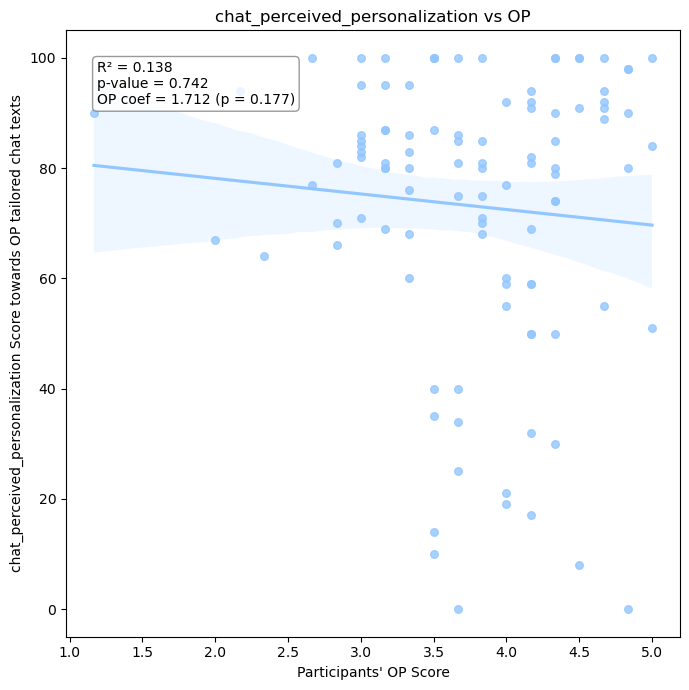


--------------------------------------------------
chat_perceived_personalization CO (Full Model)
--------------------------------------------------
                                    OLS Regression Results                                   
Dep. Variable:     chat_perceived_personalization_CO   R-squared:                       0.286
Model:                                           OLS   Adj. R-squared:                  0.134
Method:                                Least Squares   F-statistic:                     1.888
Date:                               Mon, 09 Sep 2024   Prob (F-statistic):             0.0276
Time:                                       15:47:58   Log-Likelihood:                -454.95
No. Observations:                                104   AIC:                             947.9
Df Residuals:                                     85   BIC:                             998.1
Df Model:                                         18                                         
Cova

<Figure size 1000x800 with 0 Axes>

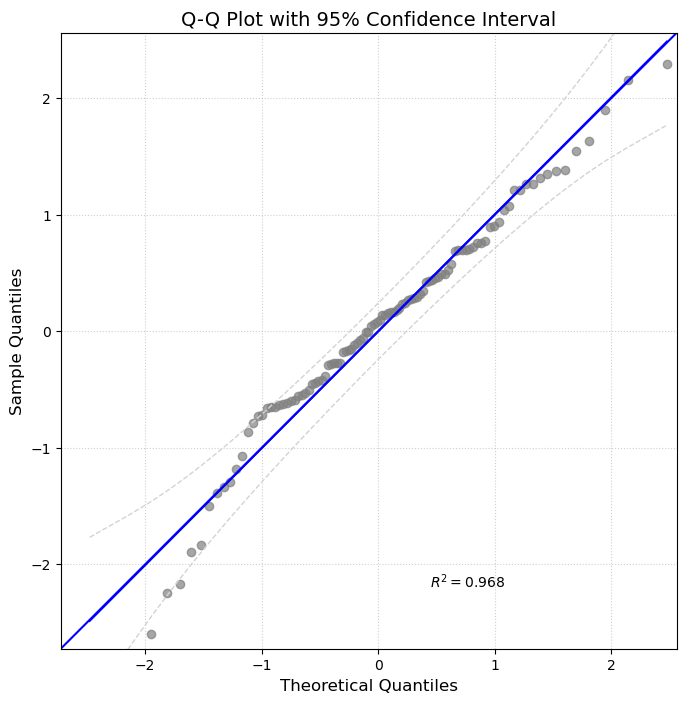


Variance Inflation Factors:
             Variable         VIF
0               const  223.427717
1                 age    1.286787
2              income    1.676433
3            gender_2    1.867471
4         education_3    1.643520
5         education_4    2.284489
6         education_5    2.052900
7         education_6    1.260054
8              race_2    1.231170
9             race_99    1.289926
10       employment_5    2.452343
11       employment_6    2.021125
12       employment_7    4.533852
13      employment_99    2.925199
14       Extraversion    1.557372
15      Agreeableness    1.474634
16  Conscientiousness    1.908142
17        Neuroticism    2.539991
18    Open_Mindedness    1.219343


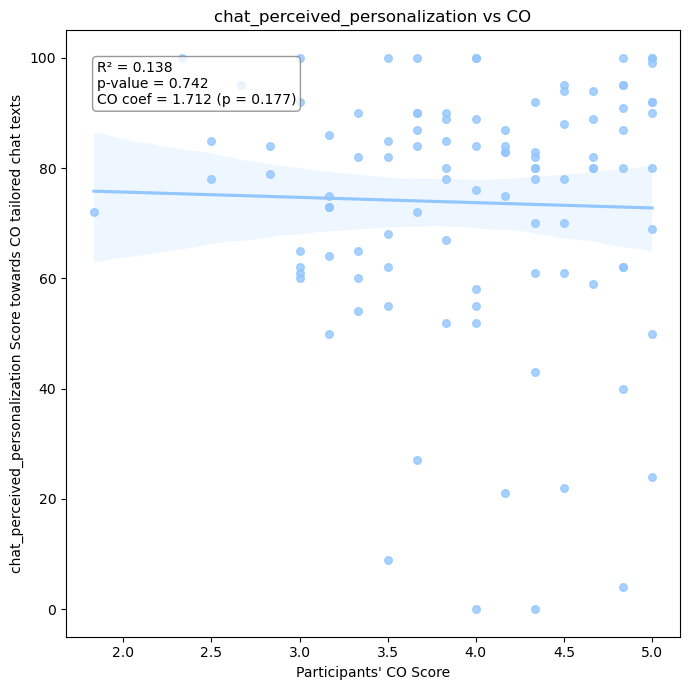


--------------------------------------------------
chat_perceived_personalization EX (Full Model)
--------------------------------------------------
                                    OLS Regression Results                                   
Dep. Variable:     chat_perceived_personalization_EX   R-squared:                       0.272
Model:                                           OLS   Adj. R-squared:                  0.118
Method:                                Least Squares   F-statistic:                     1.763
Date:                               Mon, 09 Sep 2024   Prob (F-statistic):             0.0438
Time:                                       15:47:59   Log-Likelihood:                -469.67
No. Observations:                                104   AIC:                             977.3
Df Residuals:                                     85   BIC:                             1028.
Df Model:                                         18                                         
Cova

<Figure size 1000x800 with 0 Axes>

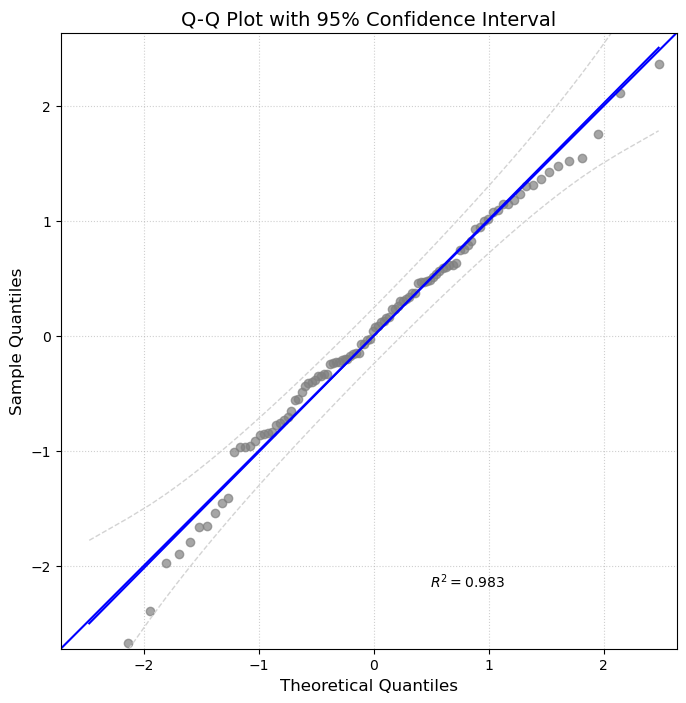


Variance Inflation Factors:
             Variable         VIF
0               const  223.427717
1                 age    1.286787
2              income    1.676433
3            gender_2    1.867471
4         education_3    1.643520
5         education_4    2.284489
6         education_5    2.052900
7         education_6    1.260054
8              race_2    1.231170
9             race_99    1.289926
10       employment_5    2.452343
11       employment_6    2.021125
12       employment_7    4.533852
13      employment_99    2.925199
14       Extraversion    1.557372
15      Agreeableness    1.474634
16  Conscientiousness    1.908142
17        Neuroticism    2.539991
18    Open_Mindedness    1.219343


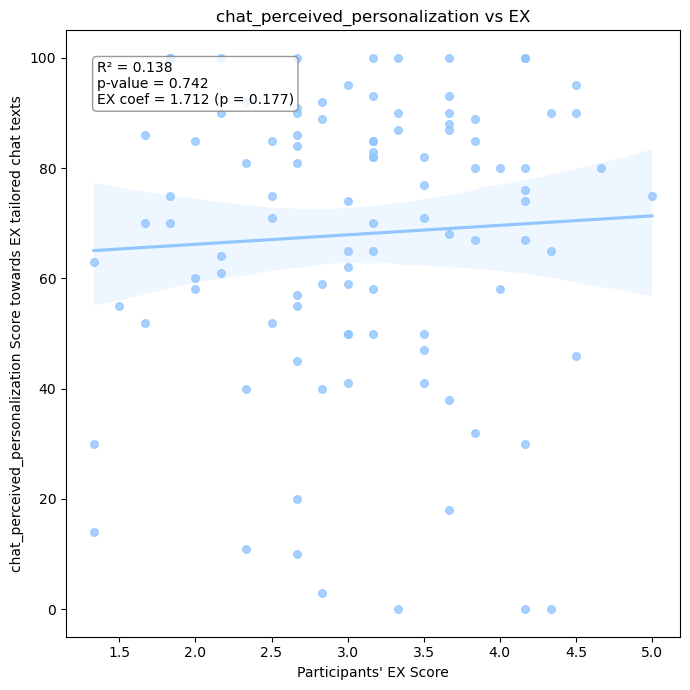


--------------------------------------------------
chat_perceived_personalization AG (Full Model)
--------------------------------------------------
                                    OLS Regression Results                                   
Dep. Variable:     chat_perceived_personalization_AG   R-squared:                       0.251
Model:                                           OLS   Adj. R-squared:                  0.092
Method:                                Least Squares   F-statistic:                     1.582
Date:                               Mon, 09 Sep 2024   Prob (F-statistic):             0.0833
Time:                                       15:48:00   Log-Likelihood:                -463.76
No. Observations:                                104   AIC:                             965.5
Df Residuals:                                     85   BIC:                             1016.
Df Model:                                         18                                         
Cova

<Figure size 1000x800 with 0 Axes>

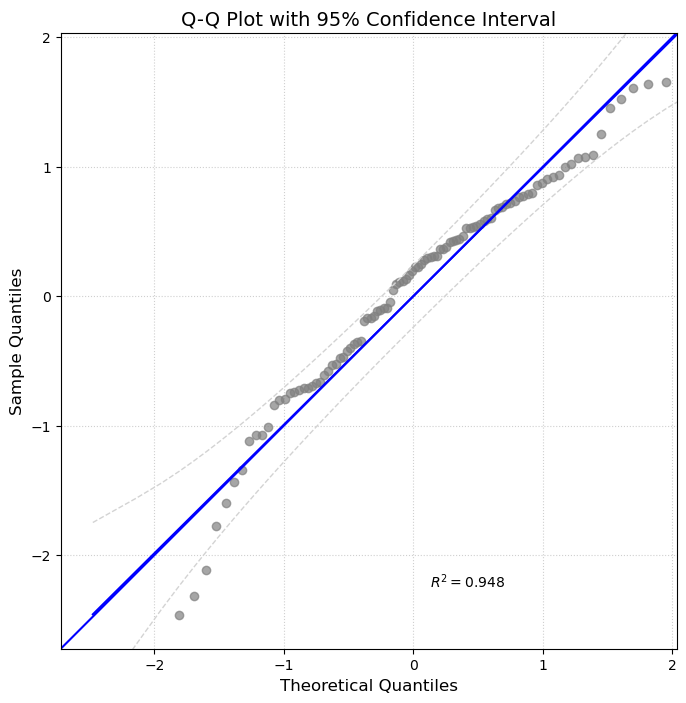


Variance Inflation Factors:
             Variable         VIF
0               const  223.427717
1                 age    1.286787
2              income    1.676433
3            gender_2    1.867471
4         education_3    1.643520
5         education_4    2.284489
6         education_5    2.052900
7         education_6    1.260054
8              race_2    1.231170
9             race_99    1.289926
10       employment_5    2.452343
11       employment_6    2.021125
12       employment_7    4.533852
13      employment_99    2.925199
14       Extraversion    1.557372
15      Agreeableness    1.474634
16  Conscientiousness    1.908142
17        Neuroticism    2.539991
18    Open_Mindedness    1.219343


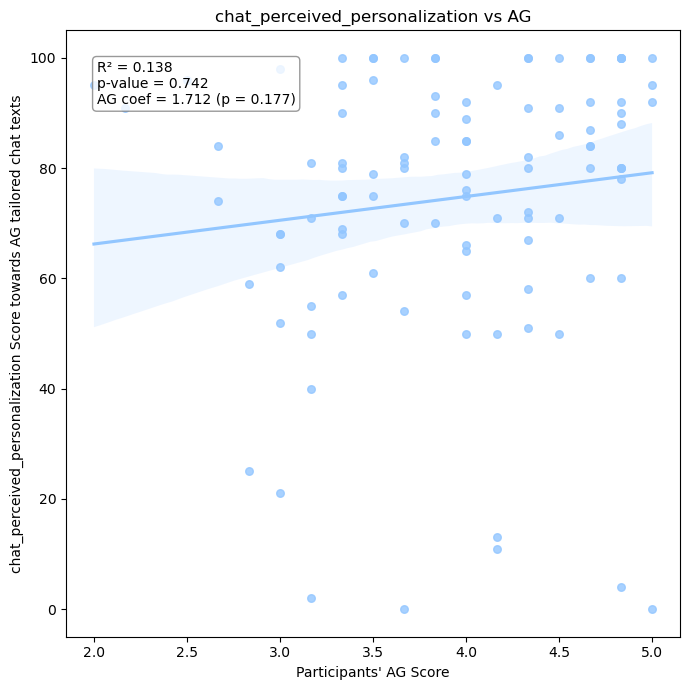


--------------------------------------------------
chat_overall_attitude OP (Full Model)
--------------------------------------------------
                               OLS Regression Results                               
Dep. Variable:     chat_overall_attitude_OP   R-squared:                       0.245
Model:                                  OLS   Adj. R-squared:                  0.085
Method:                       Least Squares   F-statistic:                     1.533
Date:                      Mon, 09 Sep 2024   Prob (F-statistic):             0.0985
Time:                              15:48:01   Log-Likelihood:                -457.23
No. Observations:                       104   AIC:                             952.5
Df Residuals:                            85   BIC:                             1003.
Df Model:                                18                                         
Covariance Type:                  nonrobust                                         
         

<Figure size 1000x800 with 0 Axes>

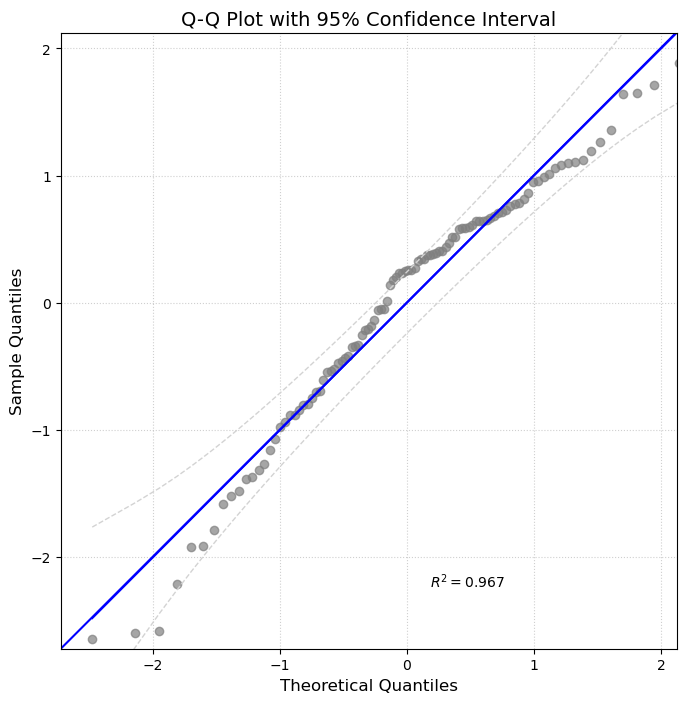


Variance Inflation Factors:
             Variable         VIF
0               const  223.427717
1                 age    1.286787
2              income    1.676433
3            gender_2    1.867471
4         education_3    1.643520
5         education_4    2.284489
6         education_5    2.052900
7         education_6    1.260054
8              race_2    1.231170
9             race_99    1.289926
10       employment_5    2.452343
11       employment_6    2.021125
12       employment_7    4.533852
13      employment_99    2.925199
14       Extraversion    1.557372
15      Agreeableness    1.474634
16  Conscientiousness    1.908142
17        Neuroticism    2.539991
18    Open_Mindedness    1.219343


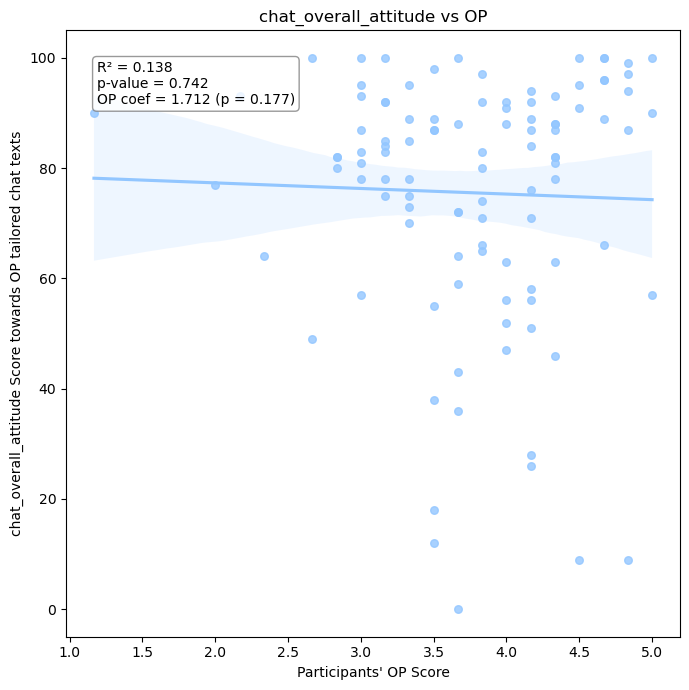


--------------------------------------------------
chat_overall_attitude CO (Full Model)
--------------------------------------------------
                               OLS Regression Results                               
Dep. Variable:     chat_overall_attitude_CO   R-squared:                       0.205
Model:                                  OLS   Adj. R-squared:                  0.037
Method:                       Least Squares   F-statistic:                     1.219
Date:                      Mon, 09 Sep 2024   Prob (F-statistic):              0.265
Time:                              15:48:02   Log-Likelihood:                -453.40
No. Observations:                       104   AIC:                             944.8
Df Residuals:                            85   BIC:                             995.0
Df Model:                                18                                         
Covariance Type:                  nonrobust                                         
         

<Figure size 1000x800 with 0 Axes>

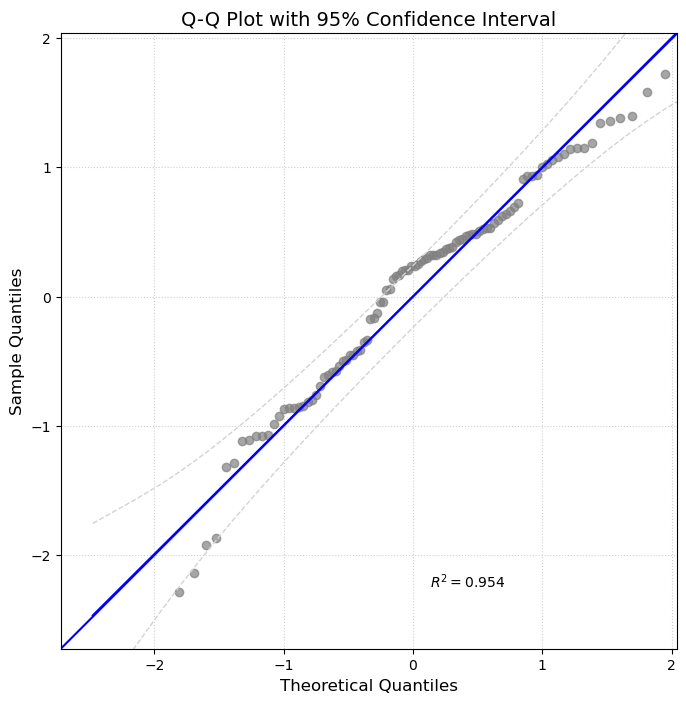


Variance Inflation Factors:
             Variable         VIF
0               const  223.427717
1                 age    1.286787
2              income    1.676433
3            gender_2    1.867471
4         education_3    1.643520
5         education_4    2.284489
6         education_5    2.052900
7         education_6    1.260054
8              race_2    1.231170
9             race_99    1.289926
10       employment_5    2.452343
11       employment_6    2.021125
12       employment_7    4.533852
13      employment_99    2.925199
14       Extraversion    1.557372
15      Agreeableness    1.474634
16  Conscientiousness    1.908142
17        Neuroticism    2.539991
18    Open_Mindedness    1.219343


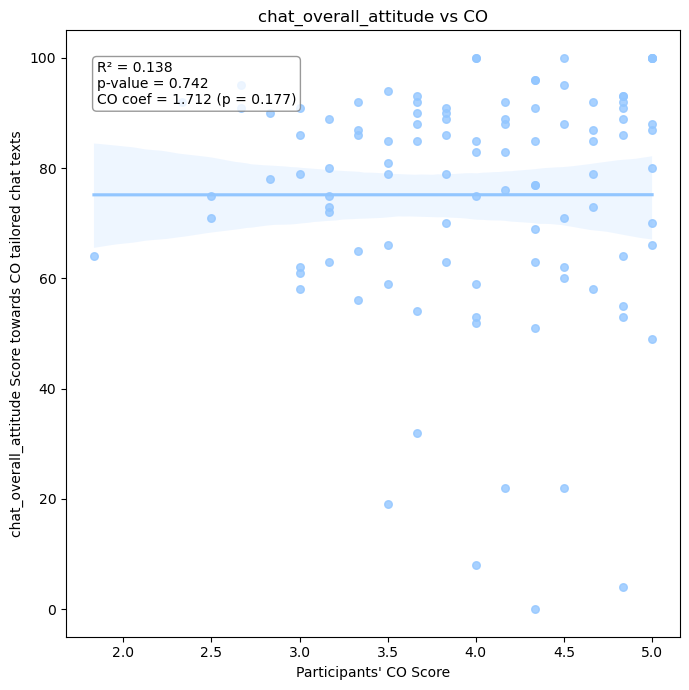


--------------------------------------------------
chat_overall_attitude EX (Full Model)
--------------------------------------------------
                               OLS Regression Results                               
Dep. Variable:     chat_overall_attitude_EX   R-squared:                       0.251
Model:                                  OLS   Adj. R-squared:                  0.093
Method:                       Least Squares   F-statistic:                     1.586
Date:                      Mon, 09 Sep 2024   Prob (F-statistic):             0.0821
Time:                              15:48:03   Log-Likelihood:                -461.47
No. Observations:                       104   AIC:                             960.9
Df Residuals:                            85   BIC:                             1011.
Df Model:                                18                                         
Covariance Type:                  nonrobust                                         
         

<Figure size 1000x800 with 0 Axes>

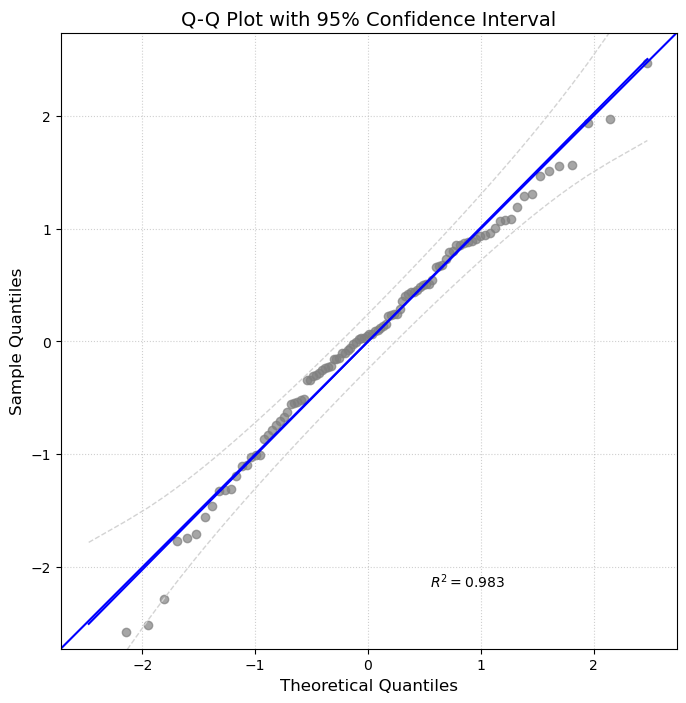


Variance Inflation Factors:
             Variable         VIF
0               const  223.427717
1                 age    1.286787
2              income    1.676433
3            gender_2    1.867471
4         education_3    1.643520
5         education_4    2.284489
6         education_5    2.052900
7         education_6    1.260054
8              race_2    1.231170
9             race_99    1.289926
10       employment_5    2.452343
11       employment_6    2.021125
12       employment_7    4.533852
13      employment_99    2.925199
14       Extraversion    1.557372
15      Agreeableness    1.474634
16  Conscientiousness    1.908142
17        Neuroticism    2.539991
18    Open_Mindedness    1.219343


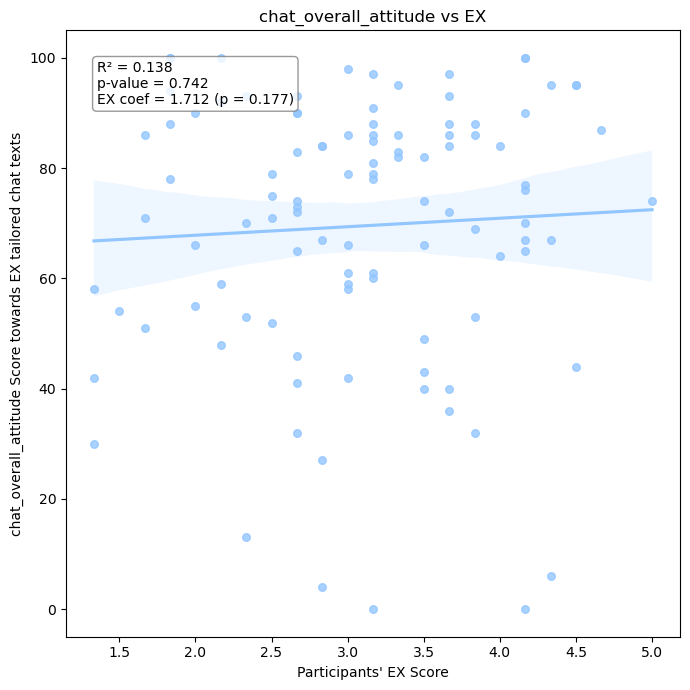


--------------------------------------------------
chat_overall_attitude AG (Full Model)
--------------------------------------------------
                               OLS Regression Results                               
Dep. Variable:     chat_overall_attitude_AG   R-squared:                       0.201
Model:                                  OLS   Adj. R-squared:                  0.031
Method:                       Least Squares   F-statistic:                     1.185
Date:                      Mon, 09 Sep 2024   Prob (F-statistic):              0.292
Time:                              15:48:03   Log-Likelihood:                -452.45
No. Observations:                       104   AIC:                             942.9
Df Residuals:                            85   BIC:                             993.1
Df Model:                                18                                         
Covariance Type:                  nonrobust                                         
         

<Figure size 1000x800 with 0 Axes>

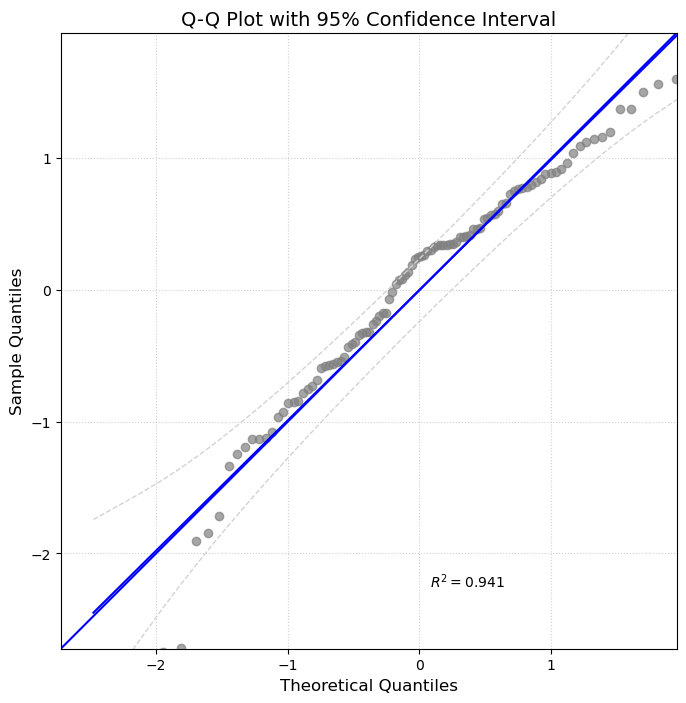


Variance Inflation Factors:
             Variable         VIF
0               const  223.427717
1                 age    1.286787
2              income    1.676433
3            gender_2    1.867471
4         education_3    1.643520
5         education_4    2.284489
6         education_5    2.052900
7         education_6    1.260054
8              race_2    1.231170
9             race_99    1.289926
10       employment_5    2.452343
11       employment_6    2.021125
12       employment_7    4.533852
13      employment_99    2.925199
14       Extraversion    1.557372
15      Agreeableness    1.474634
16  Conscientiousness    1.908142
17        Neuroticism    2.539991
18    Open_Mindedness    1.219343


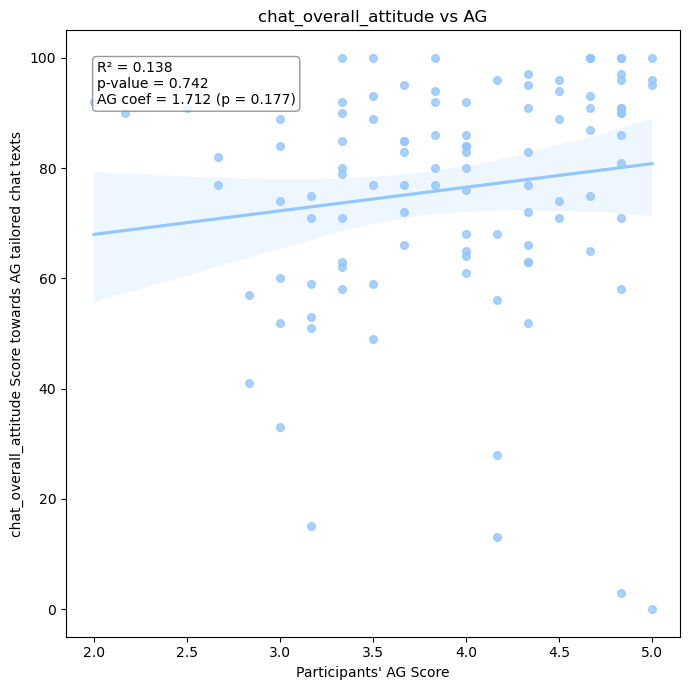


--------------------------------------------------
chat_engagement OP (Full Model)
--------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:     chat_engagement_OP   R-squared:                       0.251
Model:                            OLS   Adj. R-squared:                  0.092
Method:                 Least Squares   F-statistic:                     1.578
Date:                Mon, 09 Sep 2024   Prob (F-statistic):             0.0844
Time:                        15:48:04   Log-Likelihood:                -466.95
No. Observations:                 104   AIC:                             971.9
Df Residuals:                      85   BIC:                             1022.
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
                        coef    std err          t      P>|t|      [0.025  

<Figure size 1000x800 with 0 Axes>

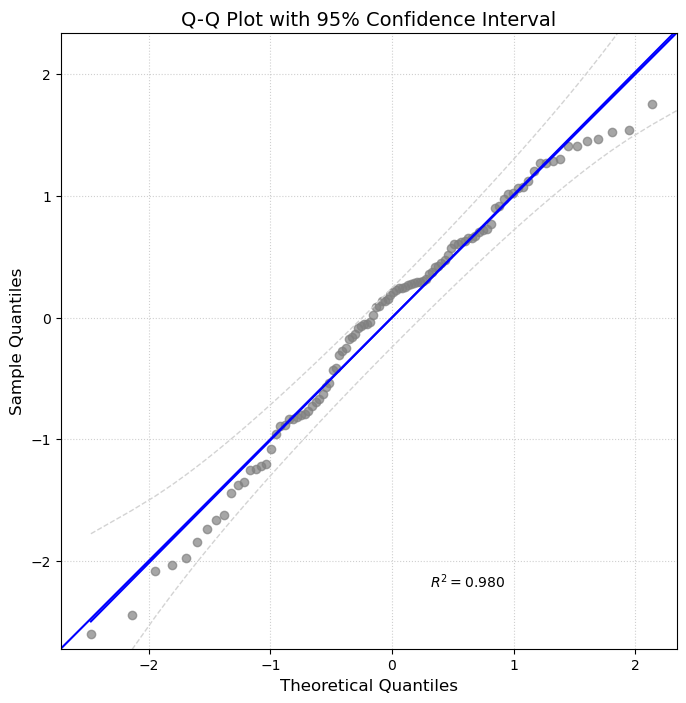


Variance Inflation Factors:
             Variable         VIF
0               const  223.427717
1                 age    1.286787
2              income    1.676433
3            gender_2    1.867471
4         education_3    1.643520
5         education_4    2.284489
6         education_5    2.052900
7         education_6    1.260054
8              race_2    1.231170
9             race_99    1.289926
10       employment_5    2.452343
11       employment_6    2.021125
12       employment_7    4.533852
13      employment_99    2.925199
14       Extraversion    1.557372
15      Agreeableness    1.474634
16  Conscientiousness    1.908142
17        Neuroticism    2.539991
18    Open_Mindedness    1.219343


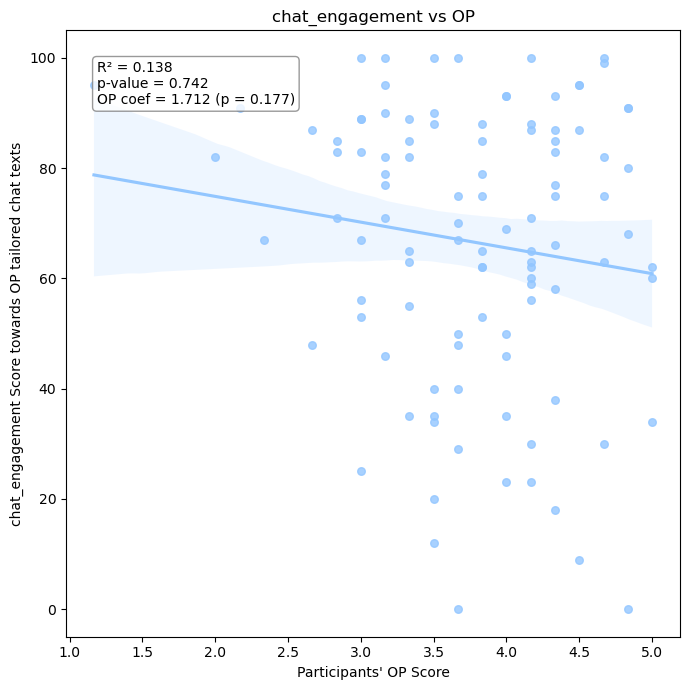


--------------------------------------------------
chat_engagement CO (Full Model)
--------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:     chat_engagement_CO   R-squared:                       0.269
Model:                            OLS   Adj. R-squared:                  0.114
Method:                 Least Squares   F-statistic:                     1.735
Date:                Mon, 09 Sep 2024   Prob (F-statistic):             0.0484
Time:                        15:48:05   Log-Likelihood:                -460.95
No. Observations:                 104   AIC:                             959.9
Df Residuals:                      85   BIC:                             1010.
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
                        coef    std err          t      P>|t|      [0.025  

<Figure size 1000x800 with 0 Axes>

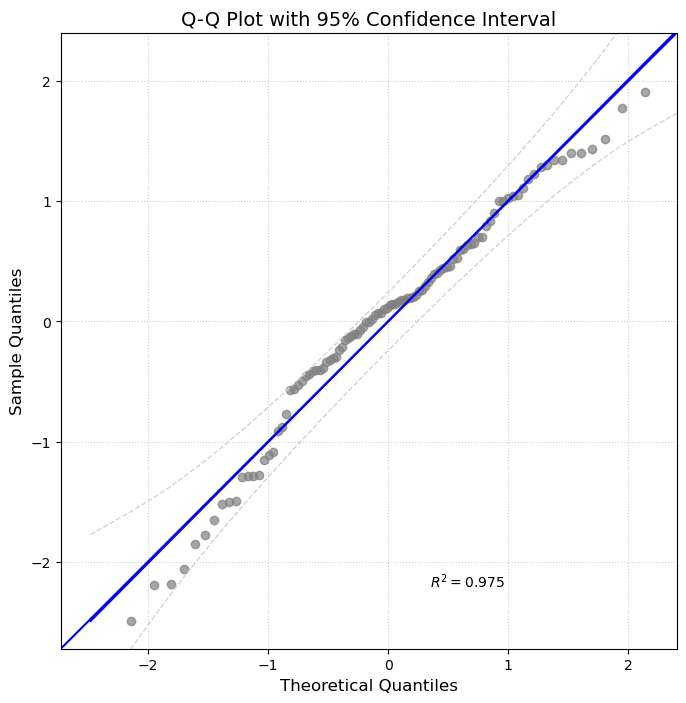


Variance Inflation Factors:
             Variable         VIF
0               const  223.427717
1                 age    1.286787
2              income    1.676433
3            gender_2    1.867471
4         education_3    1.643520
5         education_4    2.284489
6         education_5    2.052900
7         education_6    1.260054
8              race_2    1.231170
9             race_99    1.289926
10       employment_5    2.452343
11       employment_6    2.021125
12       employment_7    4.533852
13      employment_99    2.925199
14       Extraversion    1.557372
15      Agreeableness    1.474634
16  Conscientiousness    1.908142
17        Neuroticism    2.539991
18    Open_Mindedness    1.219343


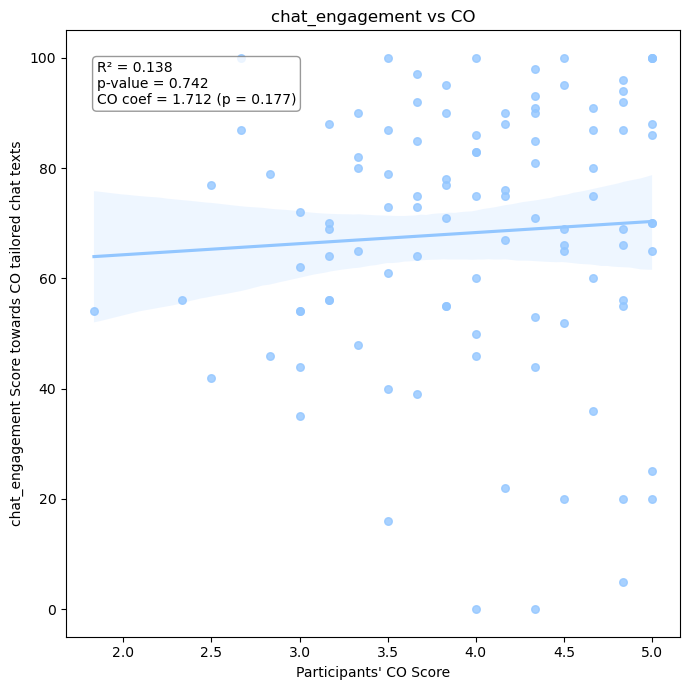


--------------------------------------------------
chat_engagement EX (Full Model)
--------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:     chat_engagement_EX   R-squared:                       0.343
Model:                            OLS   Adj. R-squared:                  0.204
Method:                 Least Squares   F-statistic:                     2.466
Date:                Mon, 09 Sep 2024   Prob (F-statistic):            0.00294
Time:                        15:48:06   Log-Likelihood:                -462.25
No. Observations:                 104   AIC:                             962.5
Df Residuals:                      85   BIC:                             1013.
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
                        coef    std err          t      P>|t|      [0.025  

<Figure size 1000x800 with 0 Axes>

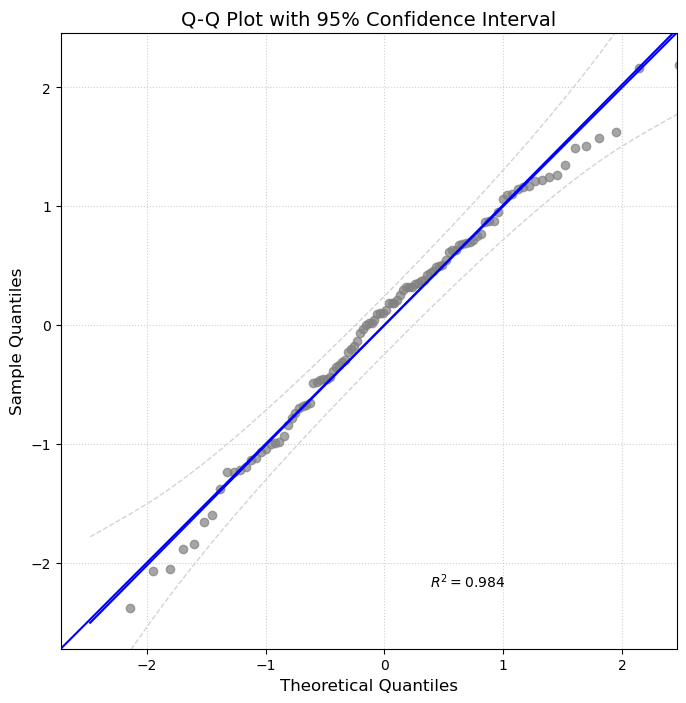


Variance Inflation Factors:
             Variable         VIF
0               const  223.427717
1                 age    1.286787
2              income    1.676433
3            gender_2    1.867471
4         education_3    1.643520
5         education_4    2.284489
6         education_5    2.052900
7         education_6    1.260054
8              race_2    1.231170
9             race_99    1.289926
10       employment_5    2.452343
11       employment_6    2.021125
12       employment_7    4.533852
13      employment_99    2.925199
14       Extraversion    1.557372
15      Agreeableness    1.474634
16  Conscientiousness    1.908142
17        Neuroticism    2.539991
18    Open_Mindedness    1.219343


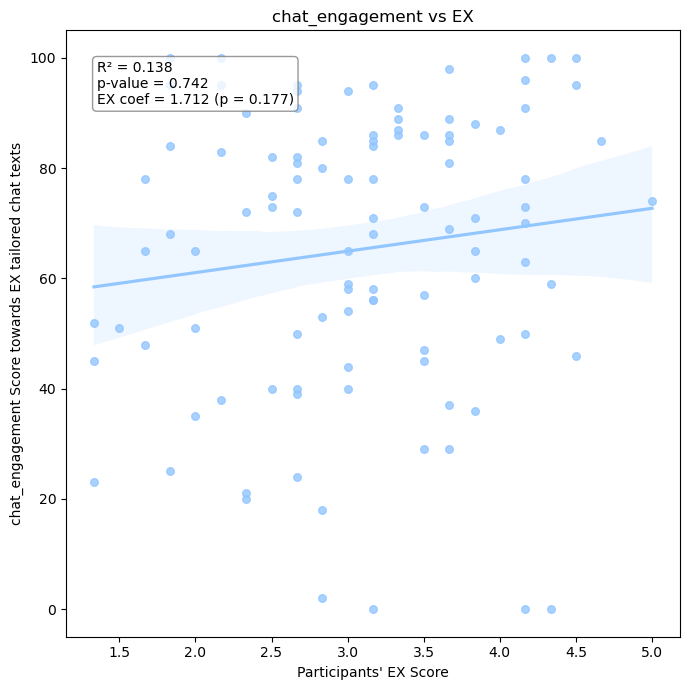


--------------------------------------------------
chat_engagement AG (Full Model)
--------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:     chat_engagement_AG   R-squared:                       0.318
Model:                            OLS   Adj. R-squared:                  0.173
Method:                 Least Squares   F-statistic:                     2.199
Date:                Mon, 09 Sep 2024   Prob (F-statistic):            0.00842
Time:                        15:48:07   Log-Likelihood:                -464.22
No. Observations:                 104   AIC:                             966.4
Df Residuals:                      85   BIC:                             1017.
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
                        coef    std err          t      P>|t|      [0.025  

<Figure size 1000x800 with 0 Axes>

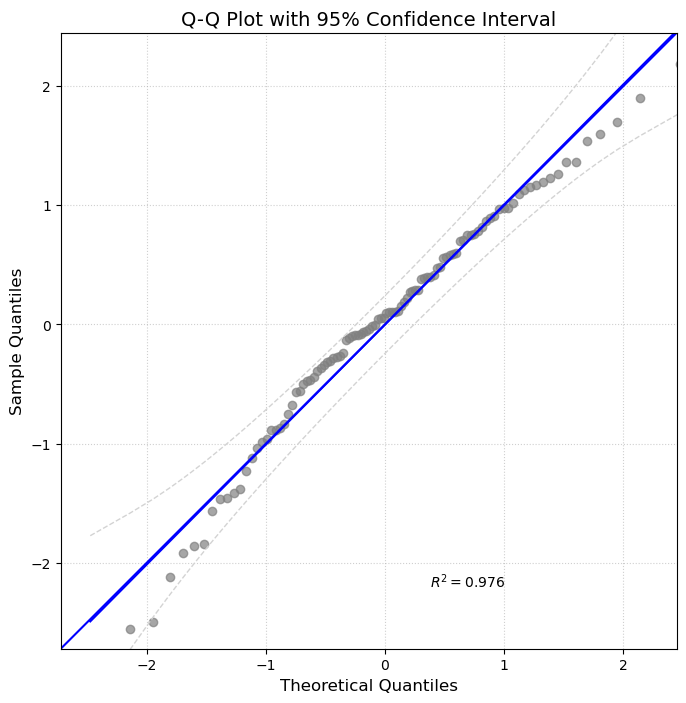


Variance Inflation Factors:
             Variable         VIF
0               const  223.427717
1                 age    1.286787
2              income    1.676433
3            gender_2    1.867471
4         education_3    1.643520
5         education_4    2.284489
6         education_5    2.052900
7         education_6    1.260054
8              race_2    1.231170
9             race_99    1.289926
10       employment_5    2.452343
11       employment_6    2.021125
12       employment_7    4.533852
13      employment_99    2.925199
14       Extraversion    1.557372
15      Agreeableness    1.474634
16  Conscientiousness    1.908142
17        Neuroticism    2.539991
18    Open_Mindedness    1.219343


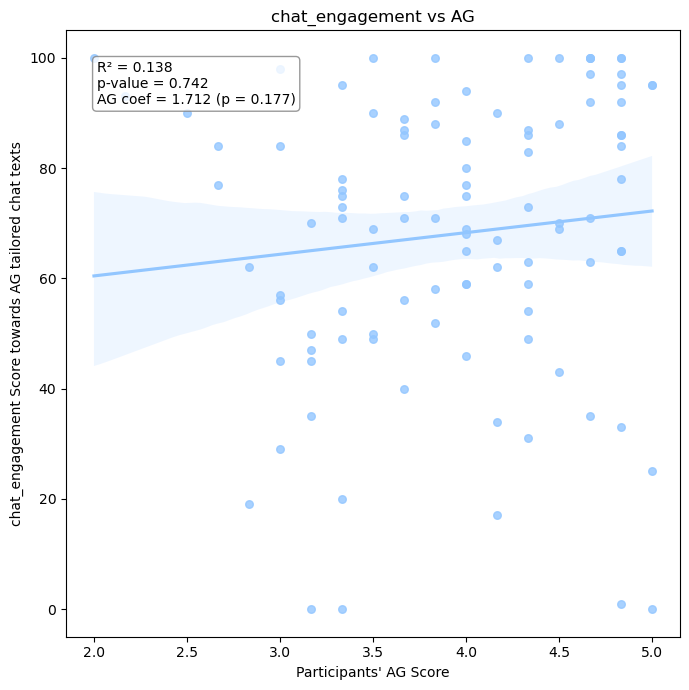

In [93]:
X = chat_big5_df_final.iloc[:,1:]

continuous_columns = []
dummy_columns = []

for col in X.columns:
    if 'race_' in col or 'employment_' in col or 'gender_' in col or 'education_' in col:
        dummy_columns.append(col)
    else:
        continuous_columns.append(col)

scaler = StandardScaler()
X_continuous_scaled = scaler.fit_transform(X[continuous_columns])
X_continuous_scaled = pd.DataFrame(X_continuous_scaled, columns=continuous_columns)
X_scaled = pd.concat([X_continuous_scaled, X[dummy_columns].reset_index(drop=True)], axis=1)

X = sm.add_constant(X)

Study2b_1_results_list = []
Study2b_1_plot_list = []

for construct in chat_constructs:
    for big5_type in big5_types:
        col = construct + '_' + big5_type
        y = chat_scores_df[col]
        
        # Fit the model with all data points
        model_full = sm.OLS(y, X)
        results_full = model_full.fit()
        
        print(f"\n{'-'*50}\n{construct} {big5_type} (Full Model)\n{'-'*50}")
        print(results_full.summary())
        
        # Check regression assumptions and store results
        results_full.assumption_results = check_regression_assumptions(results_full, X, y)
        
        Study2b_1_results_list.append((results_full, None))
        
        # Plotting (using full dataset for visualization)
        col_flag = big5_lookup[big5_type]
        p_value = results_full.pvalues[col_flag]
        fig, ax = plt.subplots(figsize=(7, 7))
        sns.regplot(x=ads_big5_df_final[col_flag], y=y, ci=95, scatter_kws={"s": 30}, ax=ax)
        ax.set_xlabel(f"Participants' {big5_type} Score")
        ax.set_ylabel(f"{construct} Score towards {big5_type} tailored chat texts")
        ax.set_title(f"{construct} vs {big5_type}")
        
        # Add annotations
        ax.annotate(f"R² = {r_squared:.3f}\np-value = {f_pvalue:.3f}\n{big5_type} coef = {coef:.3f} (p = {p_value_ols:.3f})", 
                    xy=(0.05, 0.95), xycoords='axes fraction',
                    ha='left', va='top',
                    bbox=dict(boxstyle='round', fc='white', ec='gray', alpha=0.8))

        # Save or show the plot
        plt.tight_layout()
        Study2b_1_plot_list.append(plt)
        plt.show()


--------------------------------------------------
chat_perceived_personalization OP (Ridge Regression)
--------------------------------------------------
Ridge R-squared: 0.2690 (best alpha=10.0000)

Ridge Coefficients:
const: 68.6317 (95% CI: [61.1718, 76.9844])
age: 1.1903 (95% CI: [-2.4875, 4.8565])
income: 0.7039 (95% CI: [-3.1130, 4.9925])
gender_2: 1.2074 (95% CI: [-3.7577, 6.0604])
education_3: 3.4112 (95% CI: [-1.2414, 8.0464])
education_4: -0.7371 (95% CI: [-4.4644, 3.7016])
education_5: 4.0841 (95% CI: [-0.8473, 9.3175])
education_6: -2.5489 (95% CI: [-6.2386, 1.3375])
race_2: 11.9424 (95% CI: [5.9147, 16.9788])
race_99: 5.1778 (95% CI: [-0.8129, 10.7250])
employment_5: -5.2665 (95% CI: [-11.6057, 1.3513])
employment_6: 1.8960 (95% CI: [-3.3271, 7.1551])
employment_7: 1.1958 (95% CI: [-0.6846, 3.4360])
employment_99: 4.3561 (95% CI: [-2.3676, 9.7402])
Extraversion: -1.6689 (95% CI: [-8.4664, 5.1707])
Agreeableness: -6.7256 (95% CI: [-14.7442, 2.6794])
Conscientiousness: 2.9

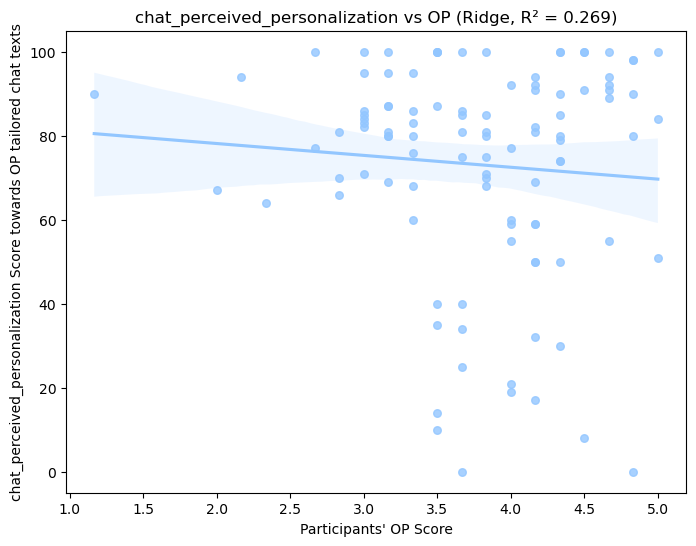


--------------------------------------------------
chat_perceived_personalization CO (Ridge Regression)
--------------------------------------------------
Ridge R-squared: 0.2551 (best alpha=10.0000)

Ridge Coefficients:
const: 68.2176 (95% CI: [60.7486, 76.0239])
age: 1.6749 (95% CI: [-1.4596, 4.9549])
income: 2.7109 (95% CI: [-1.1512, 6.5299])
gender_2: 2.1783 (95% CI: [-2.1039, 6.6300])
education_3: 3.1933 (95% CI: [-1.6103, 7.5125])
education_4: -1.2625 (95% CI: [-4.9930, 3.1549])
education_5: 3.7232 (95% CI: [-1.4011, 8.2500])
education_6: -2.9821 (95% CI: [-6.3155, 0.4929])
race_2: 10.2289 (95% CI: [4.9942, 15.3730])
race_99: 2.8530 (95% CI: [-2.1379, 7.5537])
employment_5: -1.2273 (95% CI: [-7.3223, 4.4121])
employment_6: 1.7986 (95% CI: [-3.2867, 6.4547])
employment_7: 0.9758 (95% CI: [-0.3422, 2.8132])
employment_99: 7.2367 (95% CI: [0.4531, 13.0687])
Extraversion: -1.3416 (95% CI: [-7.3343, 4.6190])
Agreeableness: -4.9765 (95% CI: [-13.3472, 3.8934])
Conscientiousness: 2.462

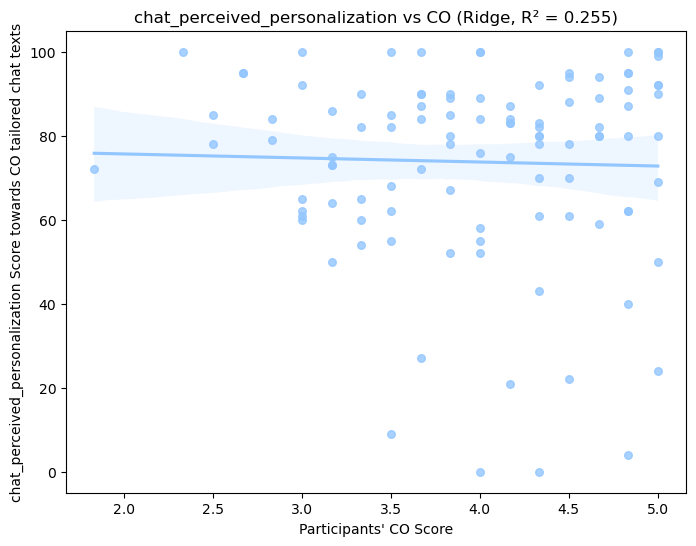


--------------------------------------------------
chat_perceived_personalization EX (Ridge Regression)
--------------------------------------------------
Ridge R-squared: 0.2497 (best alpha=10.0000)

Ridge Coefficients:
const: 64.1837 (95% CI: [56.9222, 71.4500])
age: 2.0710 (95% CI: [-1.3615, 5.5301])
income: 3.6999 (95% CI: [-0.4208, 7.7589])
gender_2: 4.0593 (95% CI: [-1.3662, 8.8869])
education_3: 4.5490 (95% CI: [-0.3071, 9.2059])
education_4: -0.9245 (95% CI: [-5.7054, 3.9344])
education_5: 6.2190 (95% CI: [0.9403, 10.9461])
education_6: -2.3795 (95% CI: [-6.6820, 2.0635])
race_2: 6.7760 (95% CI: [1.0292, 12.2250])
race_99: 1.9701 (95% CI: [-2.5995, 6.6020])
employment_5: -3.4055 (95% CI: [-9.9806, 3.0452])
employment_6: 0.2652 (95% CI: [-4.6899, 5.0532])
employment_7: 2.2857 (95% CI: [0.0000, 4.9735])
employment_99: 10.7304 (95% CI: [3.1106, 16.4940])
Extraversion: -3.0412 (95% CI: [-8.8424, 2.9890])
Agreeableness: -3.7437 (95% CI: [-11.6581, 4.0756])
Conscientiousness: 2.1288

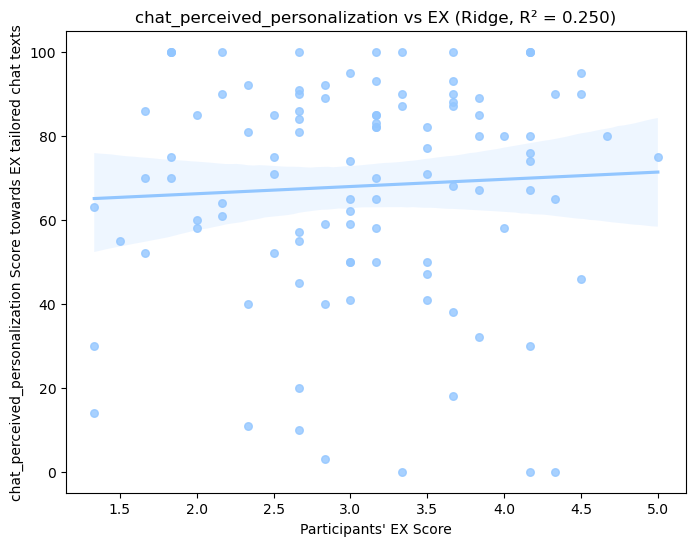


--------------------------------------------------
chat_perceived_personalization AG (Ridge Regression)
--------------------------------------------------
Ridge R-squared: 0.1357 (best alpha=100.0000)

Ridge Coefficients:
const: 74.0933 (95% CI: [69.5447, 78.3660])
age: 0.2864 (95% CI: [-1.5859, 2.1701])
income: 1.0322 (95% CI: [-0.7770, 2.8619])
gender_2: -0.5245 (95% CI: [-2.6712, 1.5174])
education_3: 1.9668 (95% CI: [-0.2514, 4.2694])
education_4: -0.0936 (95% CI: [-1.9741, 1.6013])
education_5: 2.7693 (95% CI: [0.7457, 4.8612])
education_6: -1.4937 (95% CI: [-3.3470, 0.3898])
race_2: 2.6700 (95% CI: [1.1505, 4.0419])
race_99: 0.2755 (95% CI: [-0.4292, 1.0132])
employment_5: -1.5294 (95% CI: [-3.1627, 0.1642])
employment_6: 0.5039 (95% CI: [-0.4708, 1.4987])
employment_7: 0.1617 (95% CI: [-0.0019, 0.4469])
employment_99: 1.1360 (95% CI: [-0.4623, 2.3933])
Extraversion: -0.5783 (95% CI: [-1.8580, 0.6006])
Agreeableness: -1.0846 (95% CI: [-2.7878, 0.5758])
Conscientiousness: 0.4749 

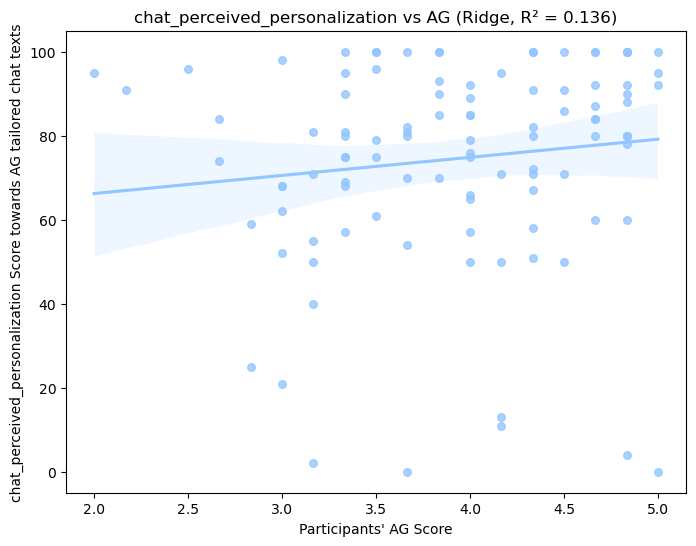


--------------------------------------------------
chat_overall_attitude OP (Ridge Regression)
--------------------------------------------------
Ridge R-squared: 0.1110 (best alpha=100.0000)

Ridge Coefficients:
const: 74.6507 (95% CI: [69.7441, 79.0880])
age: 0.9830 (95% CI: [-0.6078, 2.6667])
income: 0.2430 (95% CI: [-1.3684, 2.1740])
gender_2: -0.4720 (95% CI: [-2.5981, 1.4061])
education_3: 0.9194 (95% CI: [-1.1701, 3.0307])
education_4: 0.3104 (95% CI: [-1.3800, 1.8829])
education_5: 2.0134 (95% CI: [-0.0240, 4.0367])
education_6: -0.3924 (95% CI: [-2.2652, 1.5393])
race_2: 2.8114 (95% CI: [1.4089, 4.1495])
race_99: 0.9560 (95% CI: [0.1557, 1.7527])
employment_5: -1.7674 (95% CI: [-3.4359, -0.0465])
employment_6: 0.5122 (95% CI: [-0.6629, 1.6611])
employment_7: 0.0630 (95% CI: [-0.0732, 0.2792])
employment_99: 1.0871 (95% CI: [-0.2367, 2.2948])
Extraversion: -0.3080 (95% CI: [-1.3514, 0.7034])
Agreeableness: -1.5294 (95% CI: [-3.2695, 0.2226])
Conscientiousness: 0.4503 (95% CI: 

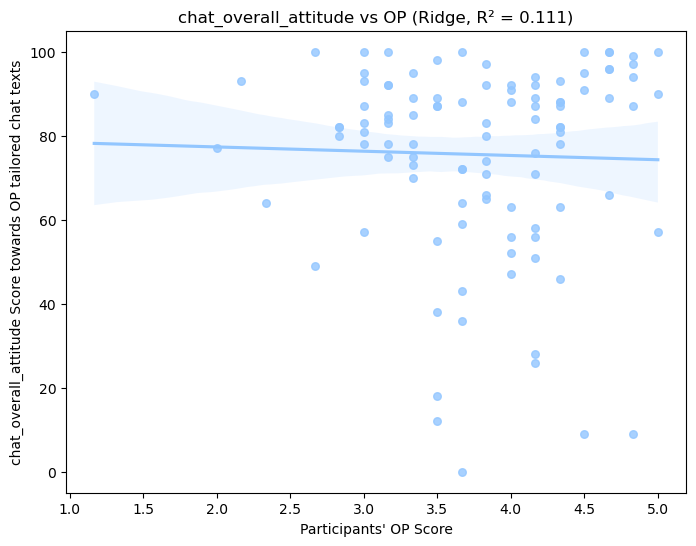


--------------------------------------------------
chat_overall_attitude CO (Ridge Regression)
--------------------------------------------------
Ridge R-squared: 0.0934 (best alpha=100.0000)

Ridge Coefficients:
const: 73.8936 (95% CI: [69.5165, 78.1806])
age: 0.7305 (95% CI: [-0.8777, 2.2001])
income: 1.0383 (95% CI: [-0.4725, 2.6342])
gender_2: -0.2729 (95% CI: [-2.3180, 1.6387])
education_3: 0.8178 (95% CI: [-1.3979, 2.9259])
education_4: 0.1897 (95% CI: [-1.4618, 1.6894])
education_5: 1.5354 (95% CI: [-0.4213, 3.3862])
education_6: -1.1593 (95% CI: [-2.8155, 0.4613])
race_2: 2.5205 (95% CI: [1.2127, 3.7463])
race_99: 0.2582 (95% CI: [-0.4168, 0.9780])
employment_5: -0.9069 (95% CI: [-2.4333, 0.6799])
employment_6: 0.5176 (95% CI: [-0.6308, 1.5747])
employment_7: 0.0995 (95% CI: [-0.0197, 0.3173])
employment_99: 1.0026 (95% CI: [-0.3936, 2.2703])
Extraversion: -0.1205 (95% CI: [-0.9619, 0.7452])
Agreeableness: -1.3507 (95% CI: [-3.0622, 0.3592])
Conscientiousness: 0.3632 (95% CI: 

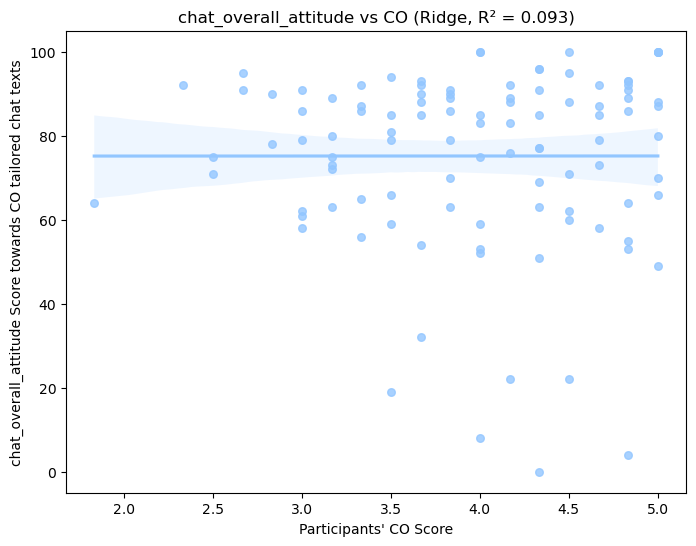


--------------------------------------------------
chat_overall_attitude EX (Ridge Regression)
--------------------------------------------------
Ridge R-squared: 0.2219 (best alpha=10.0000)

Ridge Coefficients:
const: 66.1278 (95% CI: [59.0759, 74.3311])
age: 1.2356 (95% CI: [-2.4104, 5.0429])
income: 0.7091 (95% CI: [-2.6116, 4.0215])
gender_2: 3.1322 (95% CI: [-1.1976, 7.9067])
education_3: 2.9023 (95% CI: [-1.2130, 7.2361])
education_4: 0.3523 (95% CI: [-4.0376, 4.8916])
education_5: 4.5758 (95% CI: [-0.2465, 9.2785])
education_6: -2.4965 (95% CI: [-6.2573, 1.3465])
race_2: 3.4149 (95% CI: [-1.7457, 8.5127])
race_99: 1.9492 (95% CI: [-2.2165, 6.0575])
employment_5: -2.6074 (95% CI: [-9.2386, 4.3123])
employment_6: -0.9505 (95% CI: [-6.3999, 4.1370])
employment_7: 1.8013 (95% CI: [-0.0088, 4.5623])
employment_99: 10.9748 (95% CI: [4.4612, 15.6516])
Extraversion: -4.6547 (95% CI: [-10.8263, 1.9640])
Agreeableness: -6.6388 (95% CI: [-15.0026, 2.1464])
Conscientiousness: 0.6517 (95% C

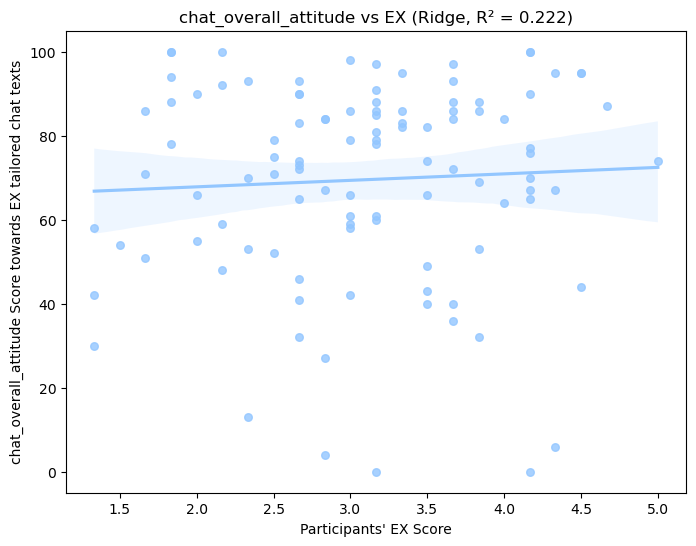


--------------------------------------------------
chat_overall_attitude AG (Ridge Regression)
--------------------------------------------------
Ridge R-squared: 0.0972 (best alpha=100.0000)

Ridge Coefficients:
const: 75.6101 (95% CI: [71.5969, 79.9522])
age: 0.3259 (95% CI: [-1.2865, 1.9095])
income: 0.8402 (95% CI: [-0.8273, 2.5682])
gender_2: -0.5354 (95% CI: [-2.3763, 1.4259])
education_3: 1.6513 (95% CI: [-0.4936, 3.6905])
education_4: 0.5761 (95% CI: [-1.1797, 2.1894])
education_5: 1.6340 (95% CI: [-0.4934, 3.6139])
education_6: -0.8675 (95% CI: [-2.6409, 0.7250])
race_2: 1.9034 (95% CI: [0.5494, 3.1990])
race_99: 0.1625 (95% CI: [-0.4222, 0.8581])
employment_5: -1.3132 (95% CI: [-2.8122, 0.2511])
employment_6: 0.2271 (95% CI: [-0.7048, 1.1741])
employment_7: 0.0487 (95% CI: [-0.0687, 0.2277])
employment_99: 1.5012 (95% CI: [0.3747, 2.4926])
Extraversion: -0.5937 (95% CI: [-1.7054, 0.4449])
Agreeableness: -1.0047 (95% CI: [-2.6245, 0.5170])
Conscientiousness: 0.1124 (95% CI: [

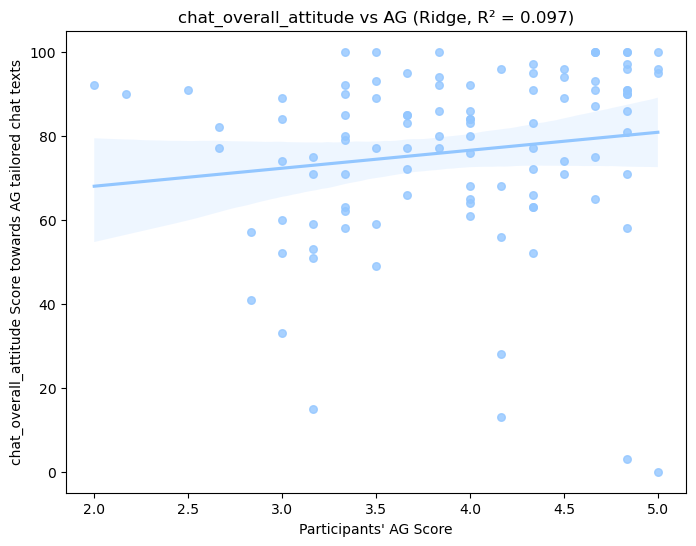


--------------------------------------------------
chat_engagement OP (Ridge Regression)
--------------------------------------------------
Ridge R-squared: 0.2211 (best alpha=10.0000)

Ridge Coefficients:
const: 63.3107 (95% CI: [56.1593, 70.9442])
age: 1.7378 (95% CI: [-2.1449, 5.6638])
income: 2.1475 (95% CI: [-1.9208, 6.1879])
gender_2: 3.6475 (95% CI: [-1.3811, 8.0087])
education_3: 2.0448 (95% CI: [-2.9173, 6.6682])
education_4: -0.4615 (95% CI: [-5.1080, 4.1588])
education_5: 2.8394 (95% CI: [-2.5841, 7.5443])
education_6: -3.4037 (95% CI: [-7.2484, 0.9203])
race_2: 6.1676 (95% CI: [-0.2211, 12.2417])
race_99: 0.7617 (95% CI: [-5.2777, 6.5724])
employment_5: -2.3188 (95% CI: [-8.7714, 3.7681])
employment_6: -0.6748 (95% CI: [-6.1629, 5.0494])
employment_7: 1.6418 (95% CI: [-0.9575, 4.7987])
employment_99: 12.1068 (95% CI: [5.0687, 17.8646])
Extraversion: -5.0368 (95% CI: [-10.3439, 1.0639])
Agreeableness: -5.2877 (95% CI: [-12.3724, 2.6080])
Conscientiousness: 2.6296 (95% CI: [

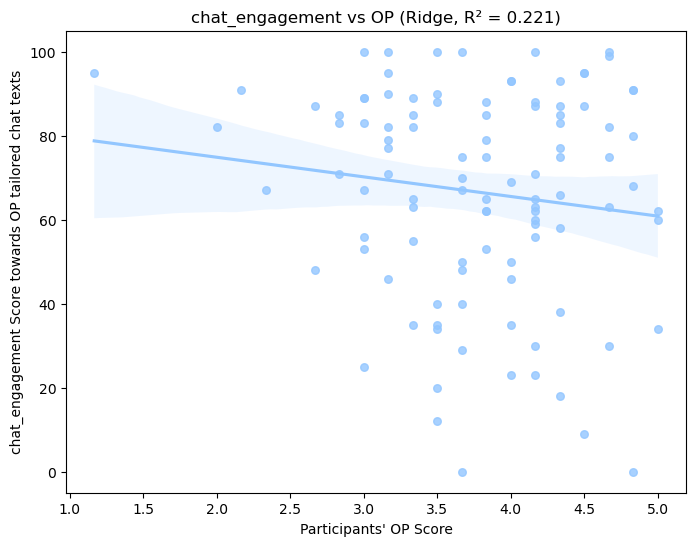


--------------------------------------------------
chat_engagement CO (Ridge Regression)
--------------------------------------------------
Ridge R-squared: 0.2359 (best alpha=10.0000)

Ridge Coefficients:
const: 62.8096 (95% CI: [55.5904, 70.7180])
age: 2.0471 (95% CI: [-1.4806, 5.3470])
income: 1.7738 (95% CI: [-1.9269, 5.7583])
gender_2: 4.4938 (95% CI: [-0.4227, 8.8522])
education_3: 1.4823 (95% CI: [-3.2828, 6.3668])
education_4: -0.6055 (95% CI: [-5.0080, 4.0842])
education_5: 2.8405 (95% CI: [-2.6738, 7.6650])
education_6: -3.4025 (95% CI: [-7.1076, 0.5057])
race_2: 5.9368 (95% CI: [0.2518, 11.4003])
race_99: 0.8176 (95% CI: [-4.6686, 6.3725])
employment_5: -0.4896 (95% CI: [-6.4379, 5.2341])
employment_6: -0.7755 (95% CI: [-5.8952, 4.6685])
employment_7: 0.6829 (95% CI: [-0.8218, 2.6212])
employment_99: 12.1069 (95% CI: [4.4487, 17.6299])
Extraversion: -2.2459 (95% CI: [-6.5613, 2.5078])
Agreeableness: -6.8912 (95% CI: [-14.1079, 0.7869])
Conscientiousness: 2.1304 (95% CI: [-2

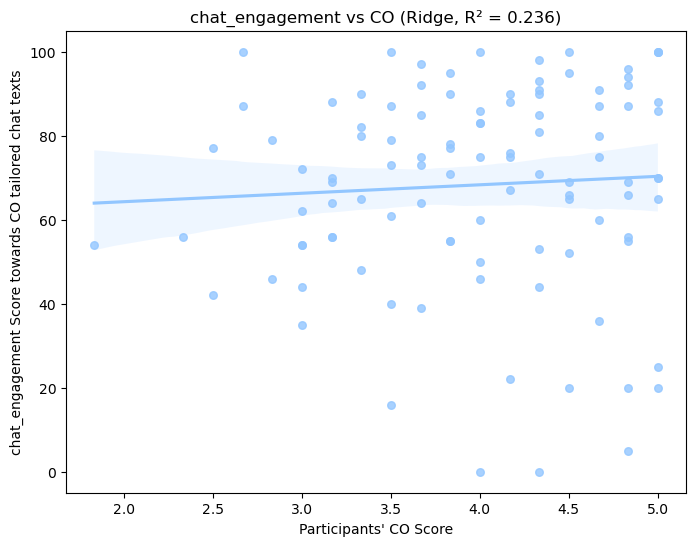


--------------------------------------------------
chat_engagement EX (Ridge Regression)
--------------------------------------------------
Ridge R-squared: 0.2991 (best alpha=10.0000)

Ridge Coefficients:
const: 62.0240 (95% CI: [55.2464, 69.3362])
age: 1.9192 (95% CI: [-1.9450, 5.8785])
income: 2.7987 (95% CI: [-0.6807, 6.5958])
gender_2: 5.2386 (95% CI: [0.4183, 9.5720])
education_3: 1.9002 (95% CI: [-2.2487, 6.5817])
education_4: 0.0239 (95% CI: [-4.7411, 4.7643])
education_5: 5.2013 (95% CI: [-0.5110, 10.0748])
education_6: -3.4108 (95% CI: [-7.4348, 0.4528])
race_2: 2.4953 (95% CI: [-3.2577, 7.5714])
race_99: 0.2181 (95% CI: [-5.2612, 5.3618])
employment_5: -1.0099 (95% CI: [-7.4441, 5.6440])
employment_6: -1.4460 (95% CI: [-6.5351, 3.8292])
employment_7: 1.4465 (95% CI: [-0.5740, 4.1580])
employment_99: 15.1365 (95% CI: [8.3472, 19.9946])
Extraversion: -7.3353 (95% CI: [-13.0854, -1.1594])
Agreeableness: -6.2034 (95% CI: [-13.6089, 1.8020])
Conscientiousness: 1.1592 (95% CI: [-

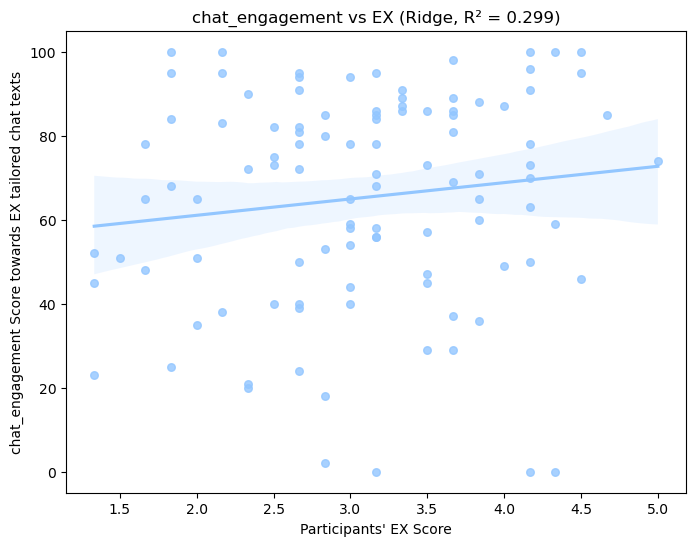


--------------------------------------------------
chat_engagement AG (Ridge Regression)
--------------------------------------------------
Ridge R-squared: 0.2708 (best alpha=10.0000)

Ridge Coefficients:
const: 63.4915 (95% CI: [55.6772, 71.0776])
age: -0.0439 (95% CI: [-3.5962, 3.8254])
income: 1.4074 (95% CI: [-2.4541, 5.3464])
gender_2: 4.2300 (95% CI: [-0.7596, 8.2373])
education_3: 2.2681 (95% CI: [-2.8103, 7.0355])
education_4: -0.1153 (95% CI: [-4.5351, 4.6179])
education_5: 2.8146 (95% CI: [-2.4764, 8.0853])
education_6: -3.9701 (95% CI: [-7.9662, 0.0310])
race_2: 2.7892 (95% CI: [-2.9582, 8.8957])
race_99: 0.3235 (95% CI: [-4.8258, 5.3498])
employment_5: 0.3677 (95% CI: [-6.8134, 6.8285])
employment_6: -1.7607 (95% CI: [-7.4453, 3.6662])
employment_7: -0.1204 (95% CI: [-2.0973, 2.2351])
employment_99: 14.2829 (95% CI: [7.3888, 19.1640])
Extraversion: -6.6119 (95% CI: [-12.5066, 0.1686])
Agreeableness: -7.9170 (95% CI: [-15.6432, 0.0857])
Conscientiousness: 0.1840 (95% CI: [

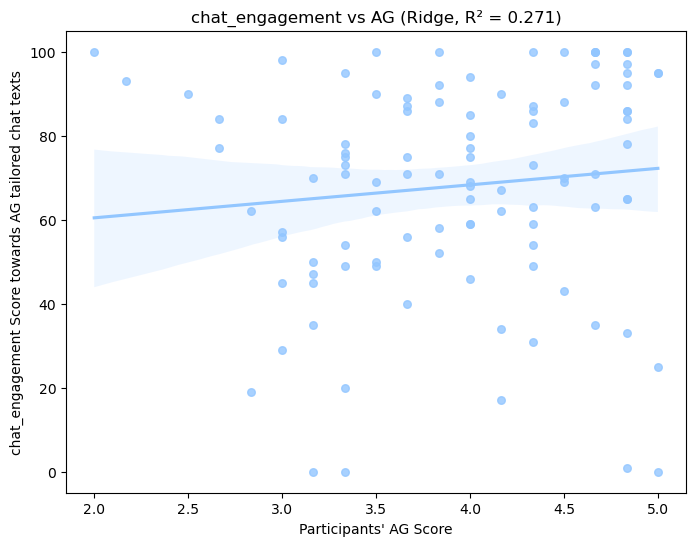

In [94]:
# Ridge Regression for Study2b_1
X = chat_big5_df_final.iloc[:,1:]

continuous_columns = []
dummy_columns = []

for col in X.columns:
    if 'race_' in col or 'employment_' in col or 'gender_' in col or 'education_' in col:
        dummy_columns.append(col)
    else:
        continuous_columns.append(col)

scaler = StandardScaler()
X_continuous_scaled = scaler.fit_transform(X[continuous_columns])
X_continuous_scaled = pd.DataFrame(X_continuous_scaled, columns=continuous_columns)
X_scaled = pd.concat([X_continuous_scaled, X[dummy_columns].reset_index(drop=True)], axis=1)

Study2b_1_ridge_results = []
Study2b_1_ridge_plot_list = []

for construct in chat_constructs:
    for big5_type in big5_types:
        col = construct + '_' + big5_type
        y = chat_scores_df[col]
        
        # Perform Ridge regression with cross-validation
        alphas = np.logspace(-6, 6, 13)
        ridge_cv = RidgeCV(alphas=alphas, store_cv_values=True, fit_intercept=True)
        ridge_cv.fit(X_scaled, y)
        best_alpha = ridge_cv.alpha_
        
        # Make predictions
        y_pred_ridge = ridge_cv.predict(X_scaled)
        
        # Calculate R-squared
        r_squared_ridge = calculate_r_squared(y, y_pred_ridge)
        
        # Bootstrap for Ridge CI
        coef_samples = bootstrap_ridge(X_scaled, y, n_iterations=1000, alpha=best_alpha)
        ci_lower = np.percentile(coef_samples, 2.5, axis=0)
        ci_upper = np.percentile(coef_samples, 97.5, axis=0)
        
        print(f"\n{'-'*50}\n{construct} {big5_type} (Ridge Regression)\n{'-'*50}")
        print(f"Ridge R-squared: {r_squared_ridge:.4f} (best alpha={best_alpha:.4f})")
        
        # Store results
        Study2b_1_ridge_results.append((ridge_cv, r_squared_ridge, best_alpha, ci_lower, ci_upper))
        
        # Print coefficients
        print("\nRidge Coefficients:")
        for i, (name, coef) in enumerate(zip(['const'] + list(X.columns), np.insert(ridge_cv.coef_, 0, ridge_cv.intercept_))):
            ci_l, ci_u = ci_lower[i], ci_upper[i]
            print(f"{name}: {coef:.4f} (95% CI: [{ci_l:.4f}, {ci_u:.4f}])")
        
        # Plotting (using full dataset for visualization)
        col_flag = big5_lookup[big5_type]
        plt.figure(figsize=(8, 6))
        sns.regplot(x=chat_big5_df_final[col_flag], y=y, ci=95, scatter_kws={"s": 30})
        plt.xlabel(f"Participants' {big5_type} Score")
        plt.ylabel(f"{construct} Score towards {big5_type} tailored chat texts")
        plt.title(f"{construct} vs {big5_type} (Ridge, R² = {r_squared_ridge:.3f})")

        # Save or show the plot
        Study2b_1_ridge_plot_list.append(plt)
        plt.show()

#### Study2b.2

Study2b.2: [y] 'chat_overall_attitude' scores for each of 4 versions vs [X] 'chat_perceived_personalization' scores for each of 4 versions & matched big5 scores for each of 4 versions, controlling for socioeconomic 



In [95]:
# Definition of X
# 1. big 5 trait scores + socio economics = chat_big5_df_final.iloc[:,1:]
# 2. chat_perceived_personalization for each of 4 personality traits

# Definition of y
# chat_overall_attitude for each of 4 personality traits

X = chat_big5_df_final.iloc[:,1:]
X_target_constructs = ['chat_perceived_personalization']
y_target_constract = 'chat_overall_attitude'

for construct in X_target_constructs:
    for big5_type in big5_types:
        col_name = construct + '_' + big5_type
        
        X[col_name] = chat_scores_df[col_name]

continuous_columns = []
dummy_columns = []

for col in X.columns:
    if 'race_' in col or 'employment_' in col or 'gender_' in col or 'education_' in col:
        dummy_columns.append(col)
    else:
        continuous_columns.append(col)

scaler = StandardScaler()
X_continuous_scaled = scaler.fit_transform(X[continuous_columns])
X_continuous_scaled = pd.DataFrame(X_continuous_scaled, columns=continuous_columns)
X_scaled = pd.concat([X_continuous_scaled, X[dummy_columns].reset_index(drop=True)], axis=1)

X = sm.add_constant(X)


--------------------------------------------------
chat_overall_attitude_OP (Linear Model)
--------------------------------------------------
                               OLS Regression Results                               
Dep. Variable:     chat_overall_attitude_OP   R-squared:                       0.870
Model:                                  OLS   Adj. R-squared:                  0.835
Method:                       Least Squares   F-statistic:                     24.63
Date:                      Mon, 09 Sep 2024   Prob (F-statistic):           3.88e-27
Time:                              15:48:57   Log-Likelihood:                -365.77
No. Observations:                       104   AIC:                             777.5
Df Residuals:                            81   BIC:                             838.4
Df Model:                                22                                         
Covariance Type:                  nonrobust                                         
       

<Figure size 1000x800 with 0 Axes>

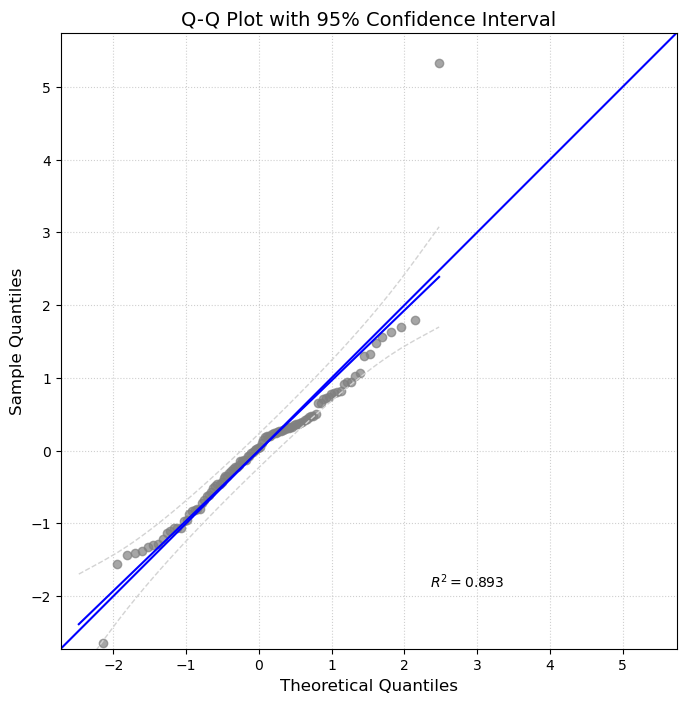


Variance Inflation Factors:
                             Variable         VIF
0                               const  238.249722
1                                 age    1.319389
2                              income    1.801255
3                            gender_2    2.157040
4                         education_3    1.747293
5                         education_4    2.363051
6                         education_5    2.093958
7                         education_6    1.272193
8                              race_2    1.415676
9                             race_99    1.301684
10                       employment_5    2.527204
11                       employment_6    2.033921
12                       employment_7    4.690114
13                      employment_99    3.035113
14                       Extraversion    1.661631
15                      Agreeableness    1.532895
16                  Conscientiousness    1.945453
17                        Neuroticism    2.686327
18                   

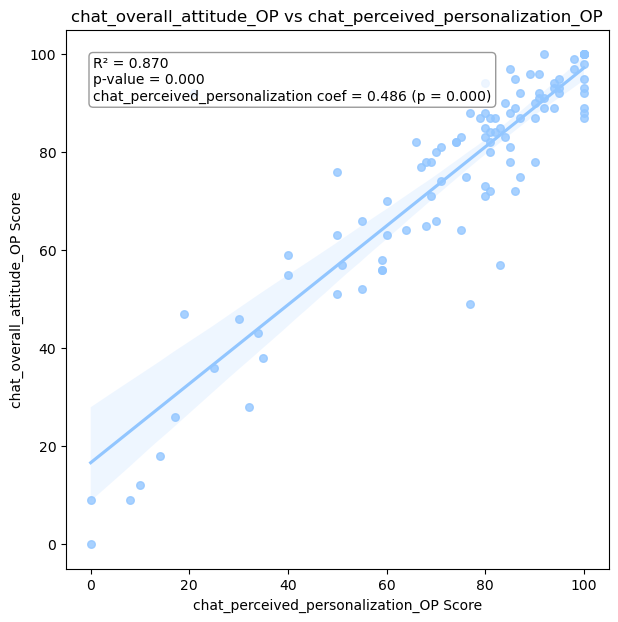


--------------------------------------------------
chat_overall_attitude_CO (Linear Model)
--------------------------------------------------
                               OLS Regression Results                               
Dep. Variable:     chat_overall_attitude_CO   R-squared:                       0.895
Model:                                  OLS   Adj. R-squared:                  0.866
Method:                       Least Squares   F-statistic:                     31.35
Date:                      Mon, 09 Sep 2024   Prob (F-statistic):           9.17e-31
Time:                              15:48:58   Log-Likelihood:                -348.18
No. Observations:                       104   AIC:                             742.4
Df Residuals:                            81   BIC:                             803.2
Df Model:                                22                                         
Covariance Type:                  nonrobust                                         
       

<Figure size 1000x800 with 0 Axes>

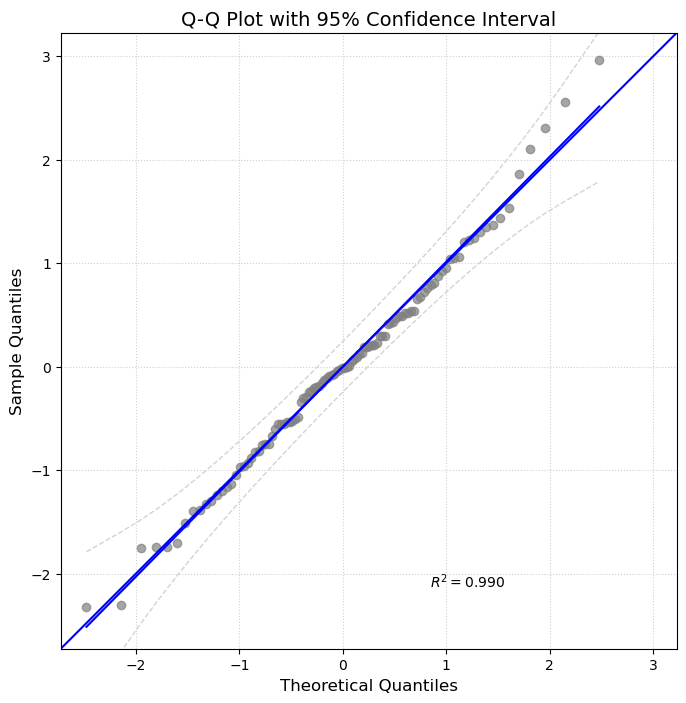


Variance Inflation Factors:
                             Variable         VIF
0                               const  238.249722
1                                 age    1.319389
2                              income    1.801255
3                            gender_2    2.157040
4                         education_3    1.747293
5                         education_4    2.363051
6                         education_5    2.093958
7                         education_6    1.272193
8                              race_2    1.415676
9                             race_99    1.301684
10                       employment_5    2.527204
11                       employment_6    2.033921
12                       employment_7    4.690114
13                      employment_99    3.035113
14                       Extraversion    1.661631
15                      Agreeableness    1.532895
16                  Conscientiousness    1.945453
17                        Neuroticism    2.686327
18                   

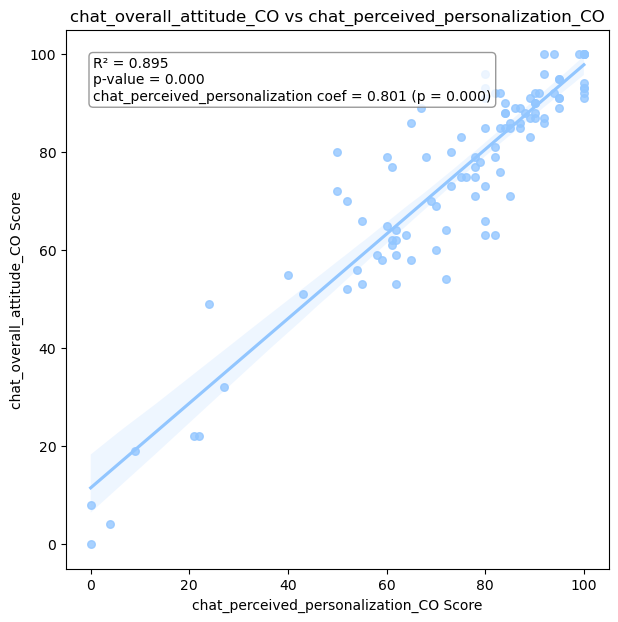


--------------------------------------------------
chat_overall_attitude_EX (Linear Model)
--------------------------------------------------
                               OLS Regression Results                               
Dep. Variable:     chat_overall_attitude_EX   R-squared:                       0.790
Model:                                  OLS   Adj. R-squared:                  0.732
Method:                       Least Squares   F-statistic:                     13.82
Date:                      Mon, 09 Sep 2024   Prob (F-statistic):           4.41e-19
Time:                              15:48:59   Log-Likelihood:                -395.47
No. Observations:                       104   AIC:                             836.9
Df Residuals:                            81   BIC:                             897.8
Df Model:                                22                                         
Covariance Type:                  nonrobust                                         
       

<Figure size 1000x800 with 0 Axes>

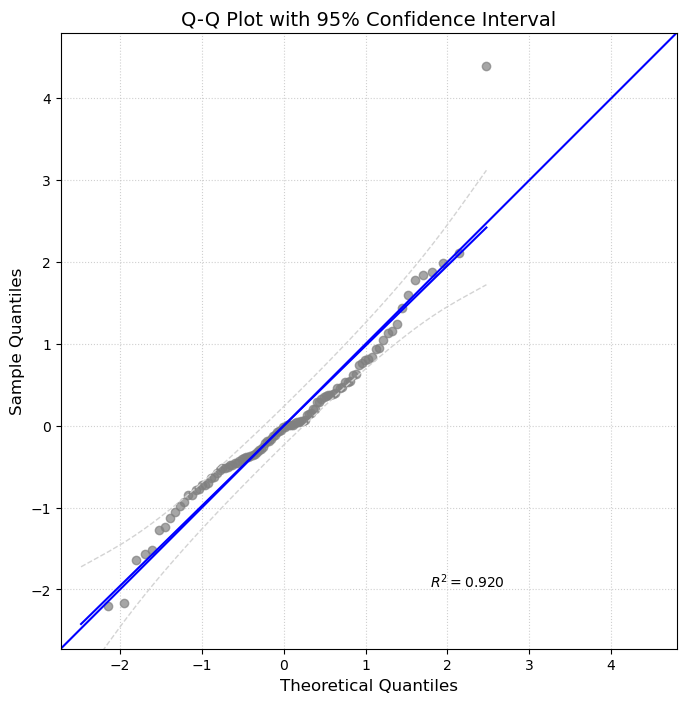


Variance Inflation Factors:
                             Variable         VIF
0                               const  238.249722
1                                 age    1.319389
2                              income    1.801255
3                            gender_2    2.157040
4                         education_3    1.747293
5                         education_4    2.363051
6                         education_5    2.093958
7                         education_6    1.272193
8                              race_2    1.415676
9                             race_99    1.301684
10                       employment_5    2.527204
11                       employment_6    2.033921
12                       employment_7    4.690114
13                      employment_99    3.035113
14                       Extraversion    1.661631
15                      Agreeableness    1.532895
16                  Conscientiousness    1.945453
17                        Neuroticism    2.686327
18                   

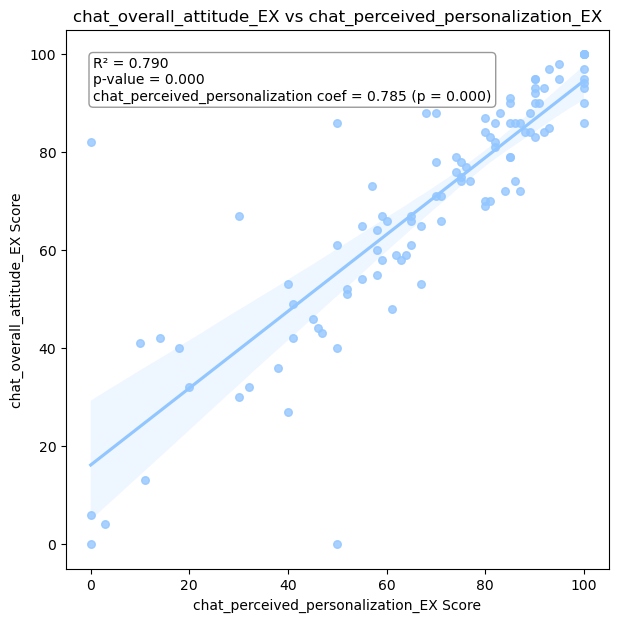


--------------------------------------------------
chat_overall_attitude_AG (Linear Model)
--------------------------------------------------
                               OLS Regression Results                               
Dep. Variable:     chat_overall_attitude_AG   R-squared:                       0.828
Model:                                  OLS   Adj. R-squared:                  0.781
Method:                       Least Squares   F-statistic:                     17.69
Date:                      Mon, 09 Sep 2024   Prob (F-statistic):           2.12e-22
Time:                              15:49:00   Log-Likelihood:                -372.64
No. Observations:                       104   AIC:                             791.3
Df Residuals:                            81   BIC:                             852.1
Df Model:                                22                                         
Covariance Type:                  nonrobust                                         
       

<Figure size 1000x800 with 0 Axes>

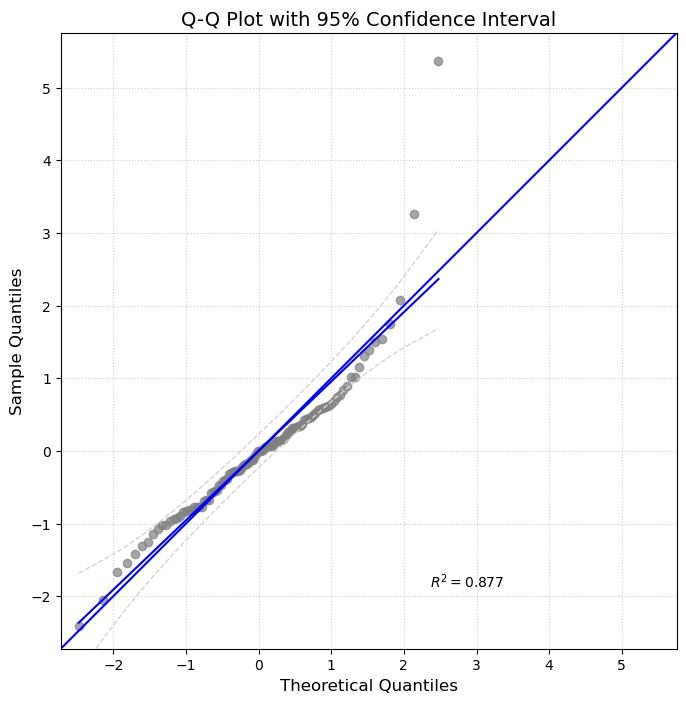


Variance Inflation Factors:
                             Variable         VIF
0                               const  238.249722
1                                 age    1.319389
2                              income    1.801255
3                            gender_2    2.157040
4                         education_3    1.747293
5                         education_4    2.363051
6                         education_5    2.093958
7                         education_6    1.272193
8                              race_2    1.415676
9                             race_99    1.301684
10                       employment_5    2.527204
11                       employment_6    2.033921
12                       employment_7    4.690114
13                      employment_99    3.035113
14                       Extraversion    1.661631
15                      Agreeableness    1.532895
16                  Conscientiousness    1.945453
17                        Neuroticism    2.686327
18                   

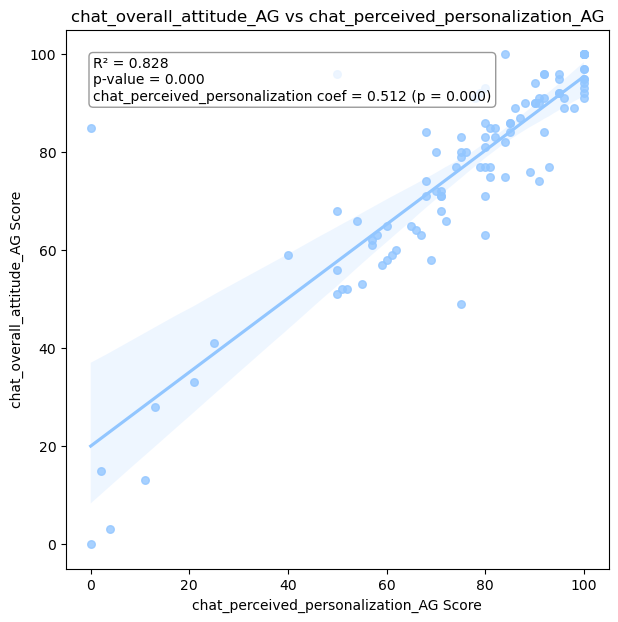

In [96]:
Study2b_2_results_list = []
Study2b_2_plot_list = []

fit_OLS_and_draw_plot(input_df=chat_scores_df, 
                      output_list_for_OLS=Study2b_2_results_list, 
                      output_list_for_plots=Study2b_2_plot_list,
                      study = 'b')


--------------------------------------------------
chat_overall_attitude_OP (Robust SE Model)
--------------------------------------------------
                               OLS Regression Results                               
Dep. Variable:     chat_overall_attitude_OP   R-squared:                       0.870
Model:                                  OLS   Adj. R-squared:                  0.835
Method:                       Least Squares   F-statistic:                     50.55
Date:                      Mon, 09 Sep 2024   Prob (F-statistic):           2.81e-38
Time:                              15:49:01   Log-Likelihood:                -365.77
No. Observations:                       104   AIC:                             777.5
Df Residuals:                            81   BIC:                             838.4
Df Model:                                22                                         
Covariance Type:                        HC3                                         
    

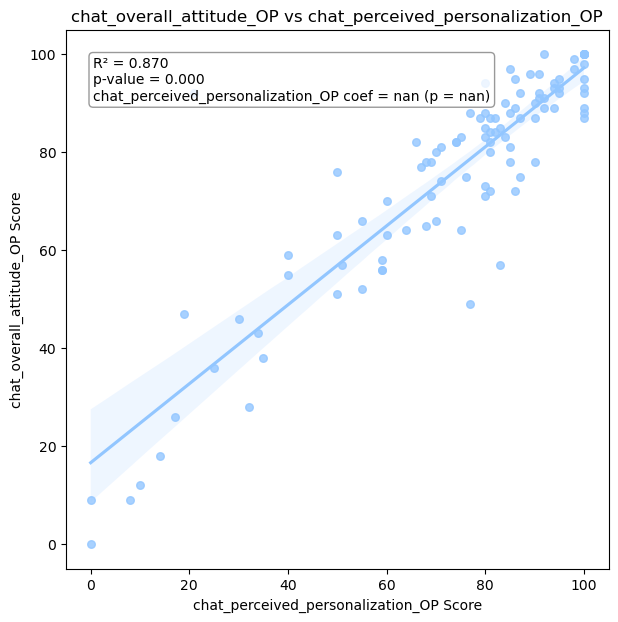


--------------------------------------------------
chat_overall_attitude_CO (Robust SE Model)
--------------------------------------------------
                               OLS Regression Results                               
Dep. Variable:     chat_overall_attitude_CO   R-squared:                       0.895
Model:                                  OLS   Adj. R-squared:                  0.866
Method:                       Least Squares   F-statistic:                     31.49
Date:                      Mon, 09 Sep 2024   Prob (F-statistic):           7.89e-31
Time:                              15:49:01   Log-Likelihood:                -348.18
No. Observations:                       104   AIC:                             742.4
Df Residuals:                            81   BIC:                             803.2
Df Model:                                22                                         
Covariance Type:                        HC3                                         
    

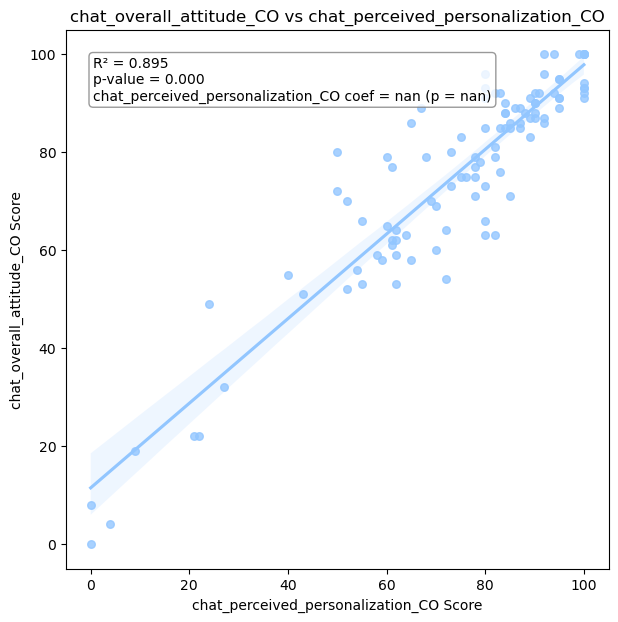


--------------------------------------------------
chat_overall_attitude_EX (Robust SE Model)
--------------------------------------------------
                               OLS Regression Results                               
Dep. Variable:     chat_overall_attitude_EX   R-squared:                       0.790
Model:                                  OLS   Adj. R-squared:                  0.732
Method:                       Least Squares   F-statistic:                     15.89
Date:                      Mon, 09 Sep 2024   Prob (F-statistic):           6.16e-21
Time:                              15:49:01   Log-Likelihood:                -395.47
No. Observations:                       104   AIC:                             836.9
Df Residuals:                            81   BIC:                             897.8
Df Model:                                22                                         
Covariance Type:                        HC3                                         
    

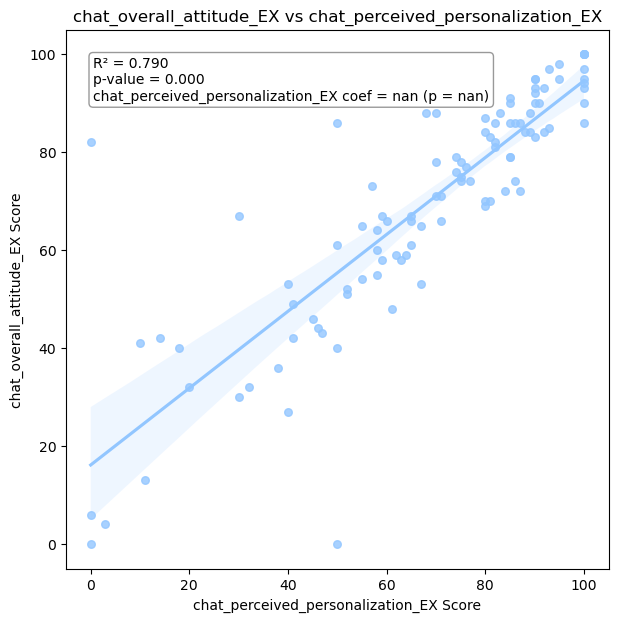


--------------------------------------------------
chat_overall_attitude_AG (Robust SE Model)
--------------------------------------------------
                               OLS Regression Results                               
Dep. Variable:     chat_overall_attitude_AG   R-squared:                       0.828
Model:                                  OLS   Adj. R-squared:                  0.781
Method:                       Least Squares   F-statistic:                     17.32
Date:                      Mon, 09 Sep 2024   Prob (F-statistic):           4.16e-22
Time:                              15:49:02   Log-Likelihood:                -372.64
No. Observations:                       104   AIC:                             791.3
Df Residuals:                            81   BIC:                             852.1
Df Model:                                22                                         
Covariance Type:                        HC3                                         
    

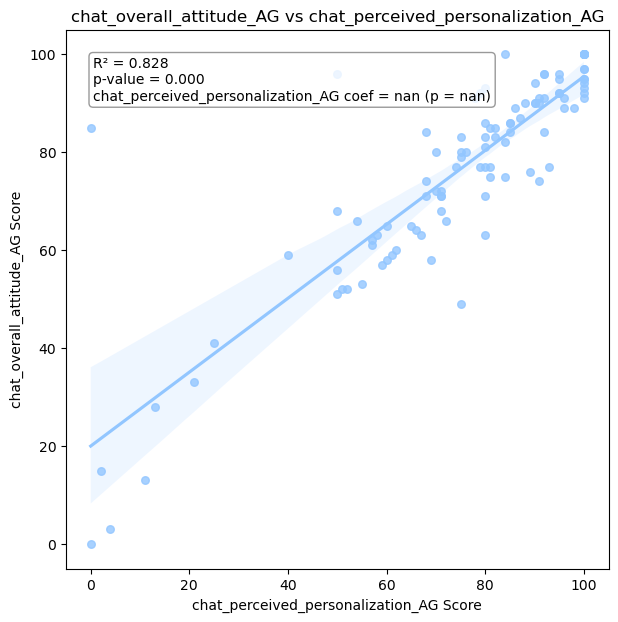

In [97]:
import statsmodels.api as sm
import numpy as np

def fit_OLS_with_robust_SE(input_df, output_list_for_OLS, output_list_for_plots, study='b'):
    for big5_type in big5_types:
        y = input_df[f'{y_target_constract}_{big5_type}']
        suffix = f'_{big5_type}'
        
        X_processed = X.copy()
        
        if study == 'b':
            pp_col = f'chat_perceived_personalization{suffix}'
        else:
            pp_col = f'perceived_personalization_{big5_type}'
        
        X_with_const = sm.add_constant(X_processed)
        
        # Fit the model
        model = sm.OLS(y, X_with_const)
        results = model.fit()
        
        # Get results with robust standard errors
        robust_results = results.get_robustcov_results(cov_type='HC3')
        
        print(f"\n{'-'*50}\n{y_target_constract}{suffix} (Robust SE Model)\n{'-'*50}")
        print(robust_results.summary())
        
        # Store results
        output_list_for_OLS.append((robust_results, None))
        
        # Visualizing
        try:
            p_value = robust_results.pvalues[pp_col]
        except:
            p_value = np.nan
        r_squared = robust_results.rsquared
        f_pvalue = robust_results.f_pvalue
        try:
            coef = robust_results.params[pp_col]
        except:
            coef = np.nan
        
        plt.figure(figsize=(7, 7))
        sns.regplot(x=X_processed[pp_col], y=y, ci=95, scatter_kws={"s": 30})
        
        plt.xlabel(f"{pp_col} Score")
        plt.ylabel(f"{y_target_constract}{suffix} Score")
        plt.title(f"{y_target_constract}{suffix} vs {pp_col}")
        
        # Add annotations
        plt.annotate(f"R² = {r_squared:.3f}\np-value = {f_pvalue:.3f}\n{pp_col} coef = {coef:.3f} (p = {p_value:.3f})", 
                     xy=(0.05, 0.95), xycoords='axes fraction',
                     ha='left', va='top',
                     bbox=dict(boxstyle='round', fc='white', ec='gray', alpha=0.8))
        
        output_list_for_plots.append(plt)
        plt.show()

# Usage
Study2b_2_results_list_robust = []
Study2b_2_plot_list_robust = []

fit_OLS_with_robust_SE(input_df=chat_scores_df, 
                       output_list_for_OLS=Study2b_2_results_list_robust, 
                       output_list_for_plots=Study2b_2_plot_list_robust,
                       study='b')


--------------------------------------------------
chat_overall_attitude_OP (Ridge Regression)
--------------------------------------------------
Ridge R-squared: 0.1110 (best alpha=100.0000)

Ridge Coefficients:
const: 74.6507 (95% CI: [70.0915, 79.2139])
age: 0.9830 (95% CI: [-0.8144, 2.7327])
income: 0.2430 (95% CI: [-1.4286, 2.0858])
Extraversion: -0.4720 (95% CI: [-2.6658, 1.3740])
Agreeableness: 0.9194 (95% CI: [-1.1861, 3.0120])
Conscientiousness: 0.3104 (95% CI: [-1.3453, 2.0176])
Neuroticism: 2.0134 (95% CI: [-0.0502, 3.7781])
Open_Mindedness: -0.3924 (95% CI: [-2.1876, 1.3452])
gender_2: 2.8114 (95% CI: [1.3145, 4.2212])
education_3: 0.9560 (95% CI: [0.1686, 1.7518])
education_4: -1.7674 (95% CI: [-3.3186, -0.1279])
education_5: 0.5122 (95% CI: [-0.6446, 1.5677])
education_6: 0.0630 (95% CI: [-0.0856, 0.2803])
race_2: 1.0871 (95% CI: [-0.2053, 2.3033])
race_99: -0.3080 (95% CI: [-1.3997, 0.7624])
employment_5: -1.5294 (95% CI: [-3.3828, 0.3285])
employment_6: 0.4503 (95% CI:

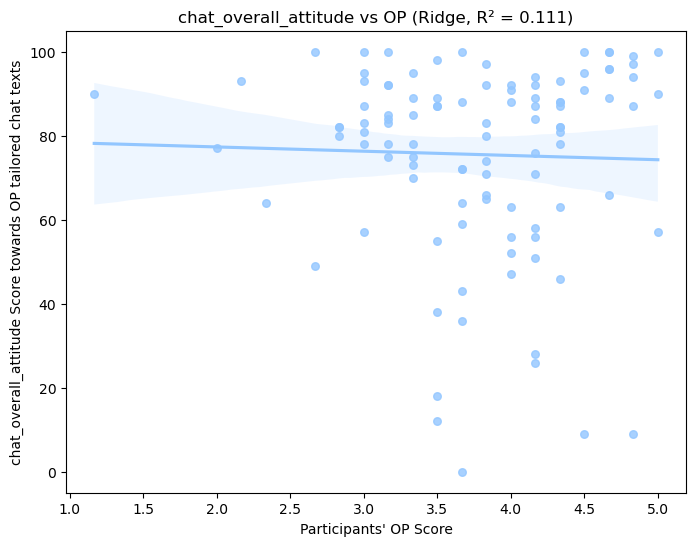


--------------------------------------------------
chat_overall_attitude_CO (Ridge Regression)
--------------------------------------------------
Ridge R-squared: 0.0934 (best alpha=100.0000)

Ridge Coefficients:
const: 73.8936 (95% CI: [69.4185, 78.1601])
age: 0.7305 (95% CI: [-0.7923, 2.2797])
income: 1.0383 (95% CI: [-0.6029, 2.6721])
Extraversion: -0.2729 (95% CI: [-2.2878, 1.7412])
Agreeableness: 0.8178 (95% CI: [-1.2513, 3.0304])
Conscientiousness: 0.1897 (95% CI: [-1.1826, 1.7120])
Neuroticism: 1.5354 (95% CI: [-0.3428, 3.2660])
Open_Mindedness: -1.1593 (95% CI: [-2.8415, 0.5490])
gender_2: 2.5205 (95% CI: [1.1288, 3.8347])
education_3: 0.2582 (95% CI: [-0.4437, 1.0003])
education_4: -0.9069 (95% CI: [-2.3855, 0.6985])
education_5: 0.5176 (95% CI: [-0.6389, 1.5686])
education_6: 0.0995 (95% CI: [-0.0286, 0.3050])
race_2: 1.0026 (95% CI: [-0.3624, 2.2575])
race_99: -0.1205 (95% CI: [-0.9718, 0.7355])
employment_5: -1.3507 (95% CI: [-3.1180, 0.2210])
employment_6: 0.3632 (95% CI:

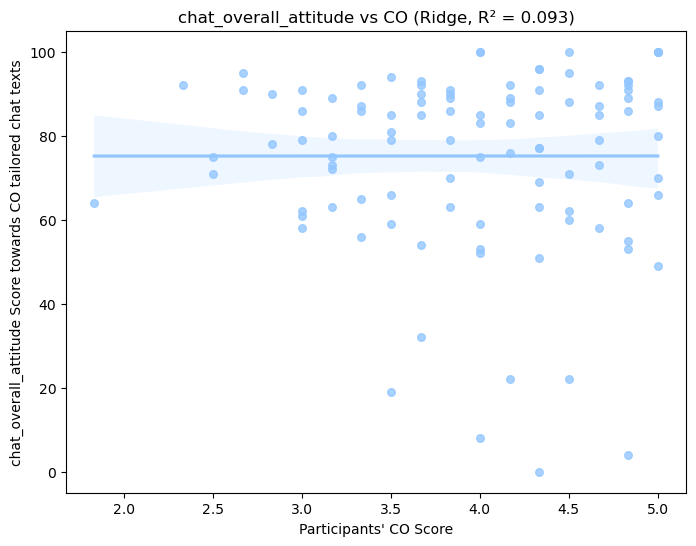


--------------------------------------------------
chat_overall_attitude_EX (Ridge Regression)
--------------------------------------------------
Ridge R-squared: 0.2219 (best alpha=10.0000)

Ridge Coefficients:
const: 66.1278 (95% CI: [58.5809, 74.0796])
age: 1.2356 (95% CI: [-2.2313, 4.9914])
income: 0.7091 (95% CI: [-2.8929, 4.1697])
Extraversion: 3.1322 (95% CI: [-1.3414, 7.8447])
Agreeableness: 2.9023 (95% CI: [-1.4663, 6.9863])
Conscientiousness: 0.3523 (95% CI: [-4.0610, 4.5040])
Neuroticism: 4.5758 (95% CI: [-0.6718, 9.0768])
Open_Mindedness: -2.4965 (95% CI: [-6.6348, 1.3180])
gender_2: 3.4149 (95% CI: [-2.0063, 8.7679])
education_3: 1.9492 (95% CI: [-2.6013, 6.2551])
education_4: -2.6074 (95% CI: [-8.9755, 4.0213])
education_5: -0.9505 (95% CI: [-6.6641, 4.5284])
education_6: 1.8013 (95% CI: [-0.1559, 4.4528])
race_2: 10.9748 (95% CI: [4.8852, 15.7676])
race_99: -4.6547 (95% CI: [-11.2361, 2.0716])
employment_5: -6.6388 (95% CI: [-14.3239, 2.1928])
employment_6: 0.6517 (95% 

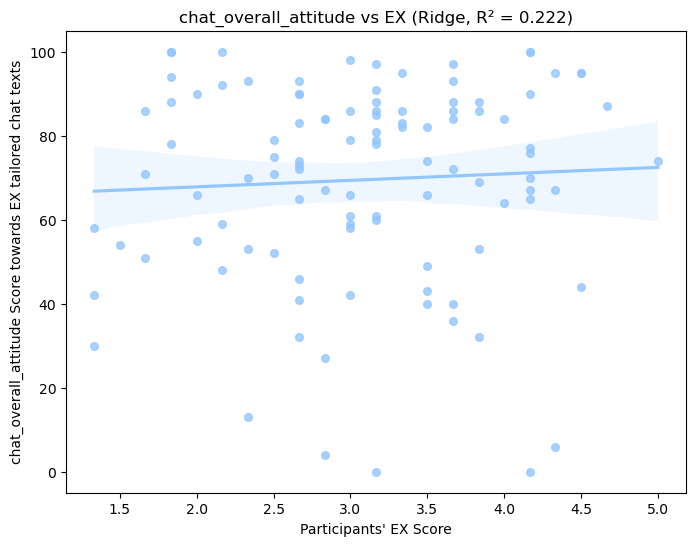


--------------------------------------------------
chat_overall_attitude_AG (Ridge Regression)
--------------------------------------------------
Ridge R-squared: 0.0972 (best alpha=100.0000)

Ridge Coefficients:
const: 75.6101 (95% CI: [71.0549, 79.9745])
age: 0.3259 (95% CI: [-1.2430, 2.0994])
income: 0.8402 (95% CI: [-0.7407, 2.5514])
Extraversion: -0.5354 (95% CI: [-2.5257, 1.5056])
Agreeableness: 1.6513 (95% CI: [-0.4956, 3.7014])
Conscientiousness: 0.5761 (95% CI: [-1.1184, 2.2555])
Neuroticism: 1.6340 (95% CI: [-0.2662, 3.5988])
Open_Mindedness: -0.8675 (95% CI: [-2.6350, 0.8434])
gender_2: 1.9034 (95% CI: [0.5553, 3.1553])
education_3: 0.1625 (95% CI: [-0.4240, 0.8524])
education_4: -1.3132 (95% CI: [-2.7639, 0.2013])
education_5: 0.2271 (95% CI: [-0.5905, 1.1689])
education_6: 0.0487 (95% CI: [-0.0677, 0.2128])
race_2: 1.5012 (95% CI: [0.4302, 2.5341])
race_99: -0.5937 (95% CI: [-1.7274, 0.4797])
employment_5: -1.0047 (95% CI: [-2.7269, 0.5350])
employment_6: 0.1124 (95% CI: 

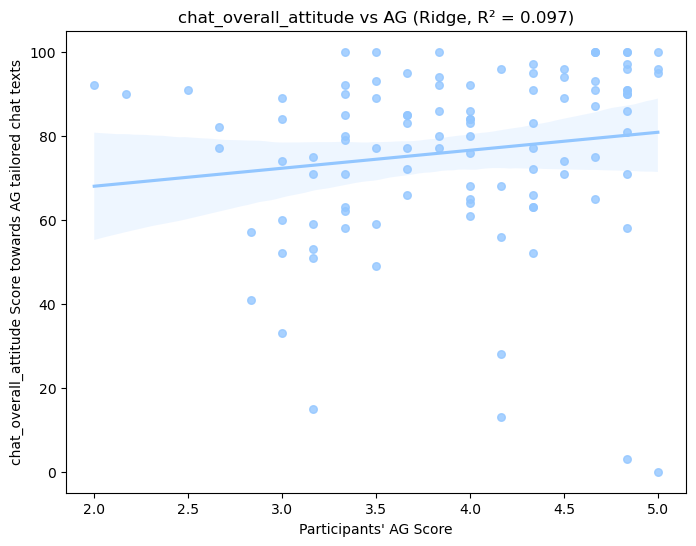

In [98]:
# Ridge Regression for Study2b_2
X = chat_big5_df_final.iloc[:,1:]

continuous_columns = []
dummy_columns = []

for col in X.columns:
    if 'race_' in col or 'employment_' in col or 'gender_' in col or 'education_' in col:
        dummy_columns.append(col)
    else:
        continuous_columns.append(col)

scaler = StandardScaler()
X_continuous_scaled = scaler.fit_transform(X[continuous_columns])
X_continuous_scaled = pd.DataFrame(X_continuous_scaled, columns=continuous_columns)
X_scaled = pd.concat([X_continuous_scaled, X[dummy_columns].reset_index(drop=True)], axis=1)

Study2b_2_ridge_results = []
Study2b_2_ridge_plot_list = []

for big5_type in big5_types:
    col = y_target_constract + '_' + big5_type
    y = chat_scores_df[col]
    
    # Perform Ridge regression with cross-validation
    alphas = np.logspace(-6, 6, 13)
    ridge_cv = RidgeCV(alphas=alphas, store_cv_values=True, fit_intercept=True)
    ridge_cv.fit(X_scaled, y)
    best_alpha = ridge_cv.alpha_
    
    # Make predictions
    y_pred_ridge = ridge_cv.predict(X_scaled)
    
    # Calculate R-squared
    r_squared_ridge = calculate_r_squared(y, y_pred_ridge)
    
    # Bootstrap for Ridge CI
    coef_samples = bootstrap_ridge(X_scaled, y, n_iterations=1000, alpha=best_alpha)
    ci_lower = np.percentile(coef_samples, 2.5, axis=0)
    ci_upper = np.percentile(coef_samples, 97.5, axis=0)
    
    print(f"\n{'-'*50}\n{y_target_constract}_{big5_type} (Ridge Regression)\n{'-'*50}")
    print(f"Ridge R-squared: {r_squared_ridge:.4f} (best alpha={best_alpha:.4f})")
    
    # Store results
    Study2b_2_ridge_results.append((ridge_cv, r_squared_ridge, best_alpha, ci_lower, ci_upper))
    
    # Print coefficients
    print("\nRidge Coefficients:")
    for i, (name, coef) in enumerate(zip(['const'] + list(X_scaled.columns), np.insert(ridge_cv.coef_, 0, ridge_cv.intercept_))):
        ci_l, ci_u = ci_lower[i], ci_upper[i]
        print(f"{name}: {coef:.4f} (95% CI: [{ci_l:.4f}, {ci_u:.4f}])")
    
    # Plotting (using full dataset for visualization)
    col_flag = big5_lookup[big5_type]
    plt.figure(figsize=(8, 6))
    sns.regplot(x=chat_big5_df_final[col_flag], y=y, ci=95, scatter_kws={"s": 30})
    plt.xlabel(f"Participants' {big5_type} Score")
    plt.ylabel(f"{y_target_constract} Score towards {big5_type} tailored chat texts")
    plt.title(f"{y_target_constract} vs {big5_type} (Ridge, R² = {r_squared_ridge:.3f})")

    # Save or show the plot
    Study2b_2_ridge_plot_list.append(plt)
    plt.show()

In [99]:
save_all_regression_results(Study2b_2_results_list, 
                            'chat_perceived_personalization',
                            'presentation_materials/tmp/study2b_2_results.csv')

Results saved to presentation_materials/tmp/study2b_2_results.csv


#### Study2b.3

Study2b.3: [y] 'chat_engagement' scores for each of 4 versions vs [X] 'chat_overall_attitude' scores for each of 4 versions & matched big5 scores for each of 4 versions & 'chat_perceived_personalization' scores for each of 4 versions, controlling for socioeconomic 

In [100]:
# Definition of X
# 1. big 5 trait scores + socio economics = chat_big5_df_final.iloc[:,1:]
# 2. chat_perceived_personalization for each of 4 personality traits
# 3. chat_overall_attitude for each of 4 personality traits

# Definition of y
# chat_engagement for each of 4 personality traits

X = chat_big5_df_final.iloc[:,1:]
X_target_constructs = ['chat_perceived_personalization', 'chat_overall_attitude']
#X_target_constructs = ['chat_overall_attitude']
y_target_constract = 'chat_engagement'

for construct in X_target_constructs:
    for big5_type in big5_types:
        col_name = construct + '_' + big5_type
        
        X[col_name] = chat_scores_df[col_name]

continuous_columns = []
dummy_columns = []

for col in X.columns:
    if 'race_' in col or 'employment_' in col or 'gender_' in col or 'education_' in col:
        dummy_columns.append(col)
    else:
        continuous_columns.append(col)

scaler = StandardScaler()
X_continuous_scaled = scaler.fit_transform(X[continuous_columns])
X_continuous_scaled = pd.DataFrame(X_continuous_scaled, columns=continuous_columns)
X_scaled = pd.concat([X_continuous_scaled, X[dummy_columns].reset_index(drop=True)], axis=1)

X = sm.add_constant(X)




--------------------------------------------------
chat_engagement_OP (Linear Model)
--------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:     chat_engagement_OP   R-squared:                       0.758
Model:                            OLS   Adj. R-squared:                  0.676
Method:                 Least Squares   F-statistic:                     9.280
Date:                Mon, 09 Sep 2024   Prob (F-statistic):           1.04e-14
Time:                        15:49:18   Log-Likelihood:                -408.15
No. Observations:                 104   AIC:                             870.3
Df Residuals:                      77   BIC:                             941.7
Df Model:                          26                                         
Covariance Type:            nonrobust                                         
                                        coef    std err          t      P

<Figure size 1000x800 with 0 Axes>

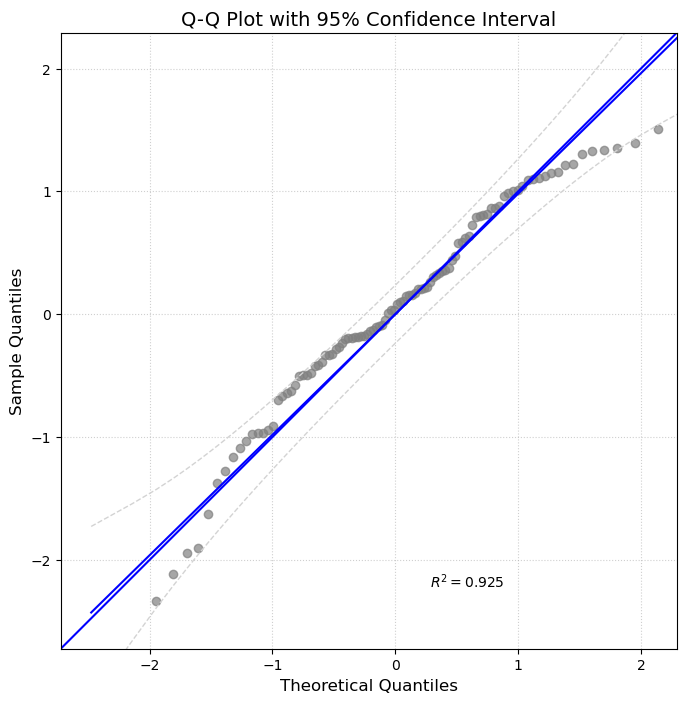


Variance Inflation Factors:
                             Variable         VIF
0                               const  252.225582
1                                 age    1.345833
2                              income    1.941685
3                            gender_2    2.211603
4                         education_3    1.833304
5                         education_4    2.498926
6                         education_5    2.190615
7                         education_6    1.307579
8                              race_2    1.527222
9                             race_99    1.351753
10                       employment_5    2.652200
11                       employment_6    2.095812
12                       employment_7    5.287195
13                      employment_99    3.226853
14                       Extraversion    1.769651
15                      Agreeableness    1.672041
16                  Conscientiousness    1.998742
17                        Neuroticism    2.762186
18                   

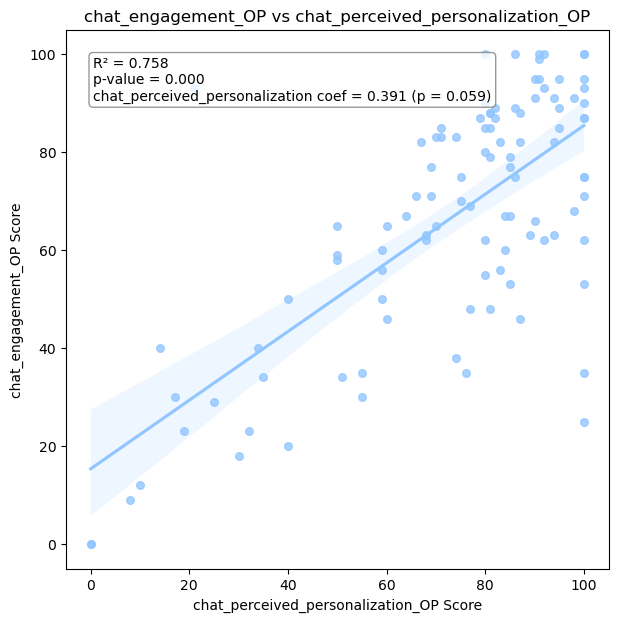

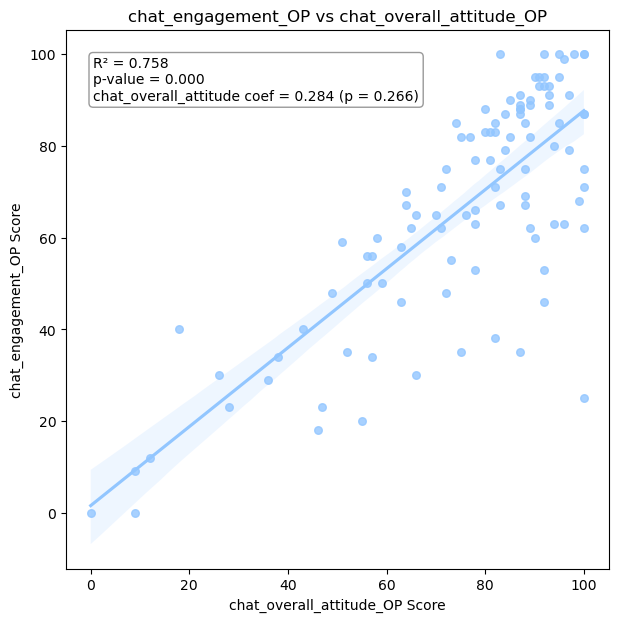


--------------------------------------------------
chat_engagement_CO (Linear Model)
--------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:     chat_engagement_CO   R-squared:                       0.759
Model:                            OLS   Adj. R-squared:                  0.677
Method:                 Least Squares   F-statistic:                     9.321
Date:                Mon, 09 Sep 2024   Prob (F-statistic):           9.21e-15
Time:                        15:49:19   Log-Likelihood:                -403.25
No. Observations:                 104   AIC:                             860.5
Df Residuals:                      77   BIC:                             931.9
Df Model:                          26                                         
Covariance Type:            nonrobust                                         
                                        coef    std err          t      P

<Figure size 1000x800 with 0 Axes>

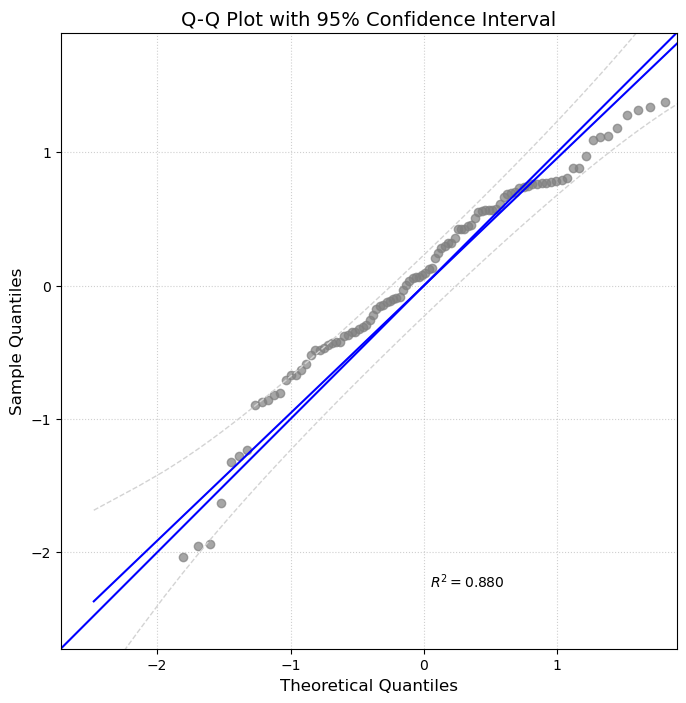


Variance Inflation Factors:
                             Variable         VIF
0                               const  252.225582
1                                 age    1.345833
2                              income    1.941685
3                            gender_2    2.211603
4                         education_3    1.833304
5                         education_4    2.498926
6                         education_5    2.190615
7                         education_6    1.307579
8                              race_2    1.527222
9                             race_99    1.351753
10                       employment_5    2.652200
11                       employment_6    2.095812
12                       employment_7    5.287195
13                      employment_99    3.226853
14                       Extraversion    1.769651
15                      Agreeableness    1.672041
16                  Conscientiousness    1.998742
17                        Neuroticism    2.762186
18                   

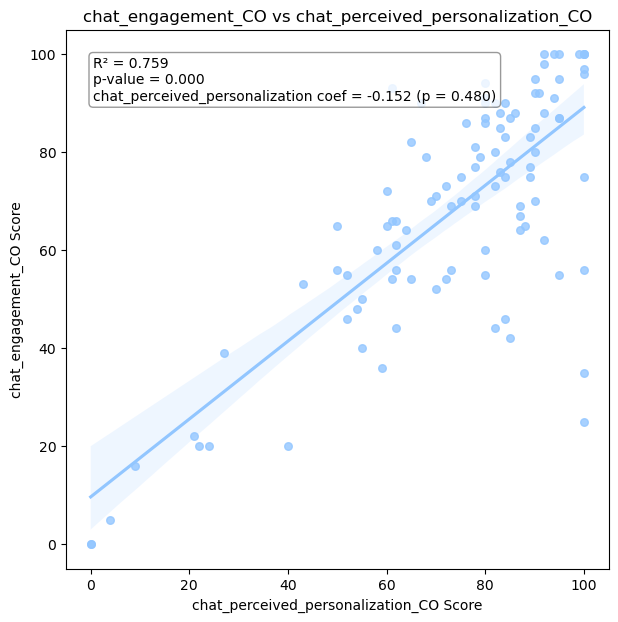

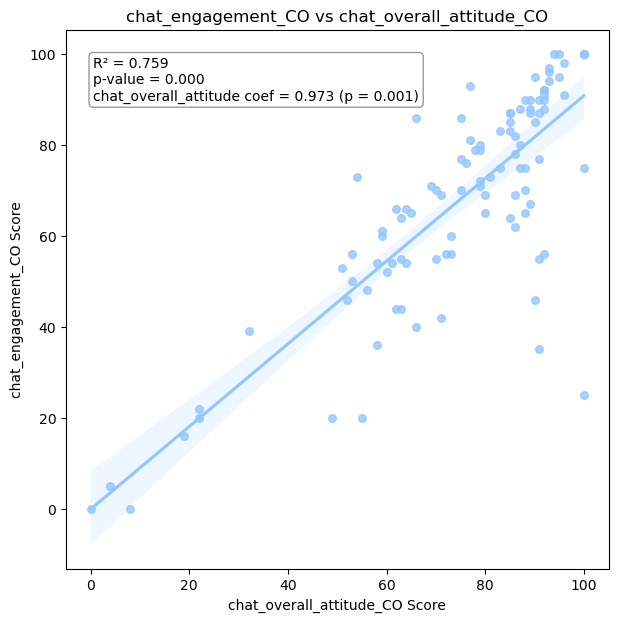


--------------------------------------------------
chat_engagement_EX (Linear Model)
--------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:     chat_engagement_EX   R-squared:                       0.823
Model:                            OLS   Adj. R-squared:                  0.763
Method:                 Least Squares   F-statistic:                     13.74
Date:                Mon, 09 Sep 2024   Prob (F-statistic):           1.71e-19
Time:                        15:49:21   Log-Likelihood:                -394.16
No. Observations:                 104   AIC:                             842.3
Df Residuals:                      77   BIC:                             913.7
Df Model:                          26                                         
Covariance Type:            nonrobust                                         
                                        coef    std err          t      P

<Figure size 1000x800 with 0 Axes>

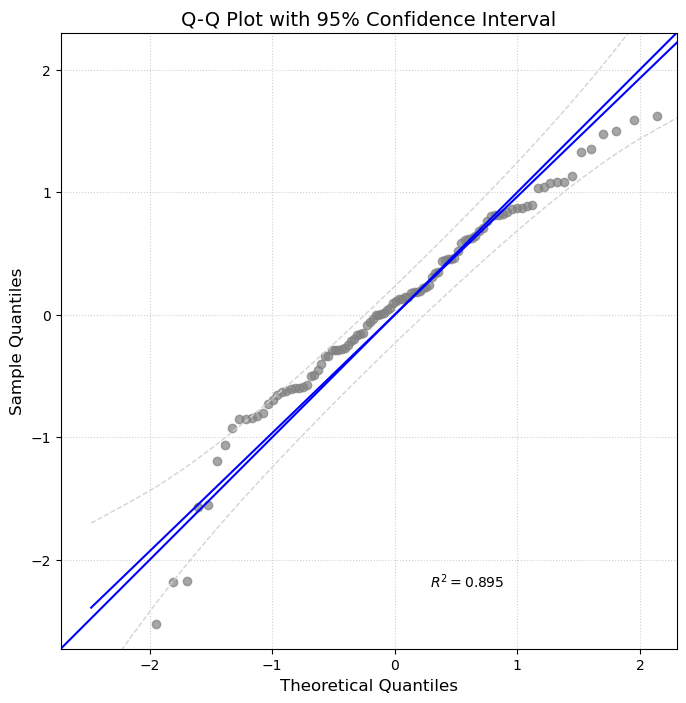


Variance Inflation Factors:
                             Variable         VIF
0                               const  252.225582
1                                 age    1.345833
2                              income    1.941685
3                            gender_2    2.211603
4                         education_3    1.833304
5                         education_4    2.498926
6                         education_5    2.190615
7                         education_6    1.307579
8                              race_2    1.527222
9                             race_99    1.351753
10                       employment_5    2.652200
11                       employment_6    2.095812
12                       employment_7    5.287195
13                      employment_99    3.226853
14                       Extraversion    1.769651
15                      Agreeableness    1.672041
16                  Conscientiousness    1.998742
17                        Neuroticism    2.762186
18                   

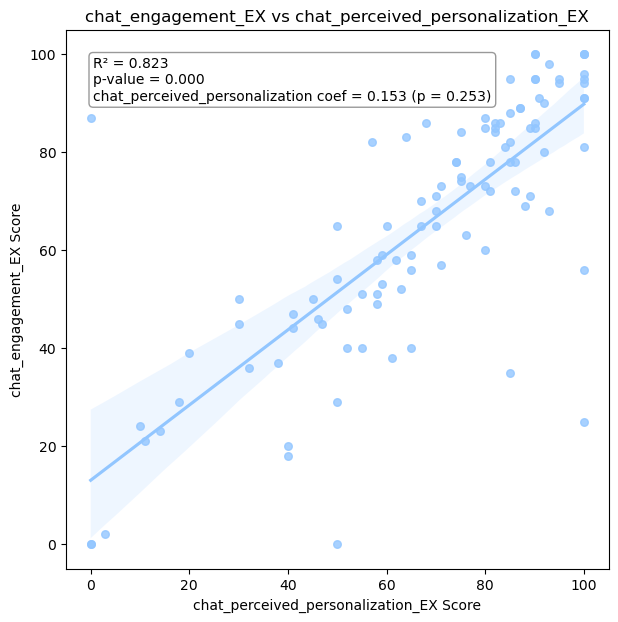

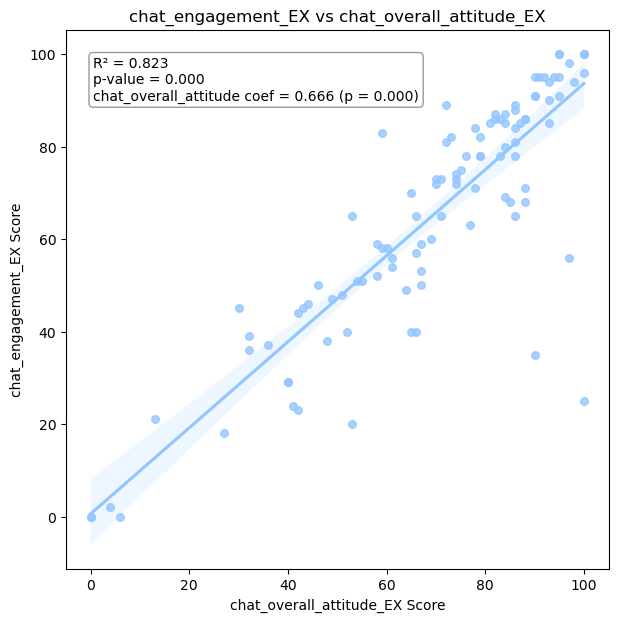


--------------------------------------------------
chat_engagement_AG (Linear Model)
--------------------------------------------------
                            OLS Regression Results                            
Dep. Variable:     chat_engagement_AG   R-squared:                       0.754
Model:                            OLS   Adj. R-squared:                  0.670
Method:                 Least Squares   F-statistic:                     9.057
Date:                Mon, 09 Sep 2024   Prob (F-statistic):           1.96e-14
Time:                        15:49:22   Log-Likelihood:                -411.26
No. Observations:                 104   AIC:                             876.5
Df Residuals:                      77   BIC:                             947.9
Df Model:                          26                                         
Covariance Type:            nonrobust                                         
                                        coef    std err          t      P

<Figure size 1000x800 with 0 Axes>

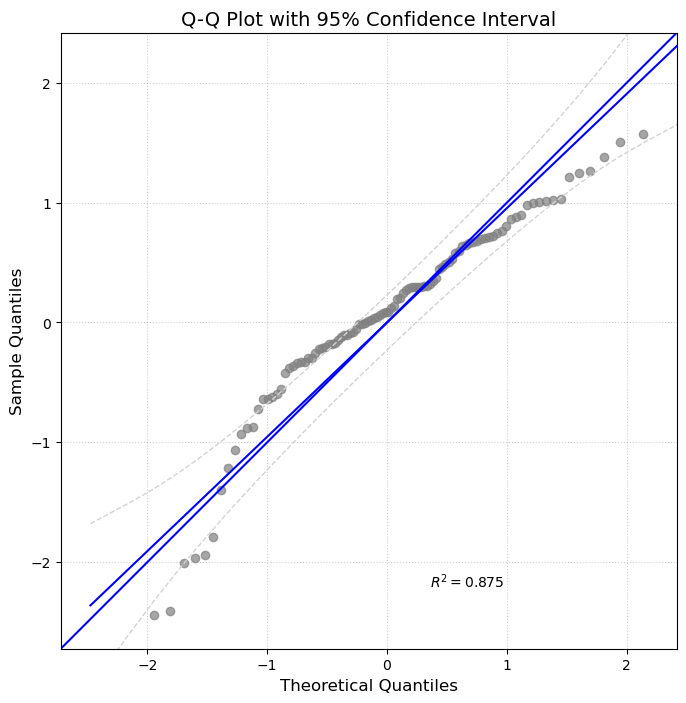


Variance Inflation Factors:
                             Variable         VIF
0                               const  252.225582
1                                 age    1.345833
2                              income    1.941685
3                            gender_2    2.211603
4                         education_3    1.833304
5                         education_4    2.498926
6                         education_5    2.190615
7                         education_6    1.307579
8                              race_2    1.527222
9                             race_99    1.351753
10                       employment_5    2.652200
11                       employment_6    2.095812
12                       employment_7    5.287195
13                      employment_99    3.226853
14                       Extraversion    1.769651
15                      Agreeableness    1.672041
16                  Conscientiousness    1.998742
17                        Neuroticism    2.762186
18                   

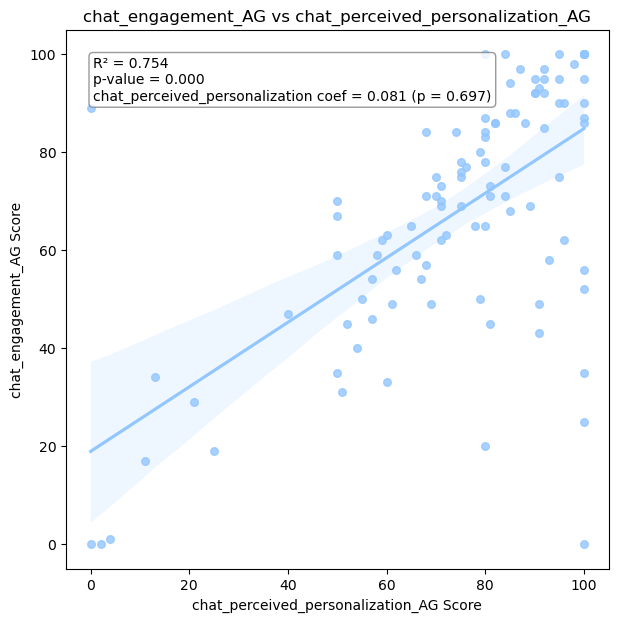

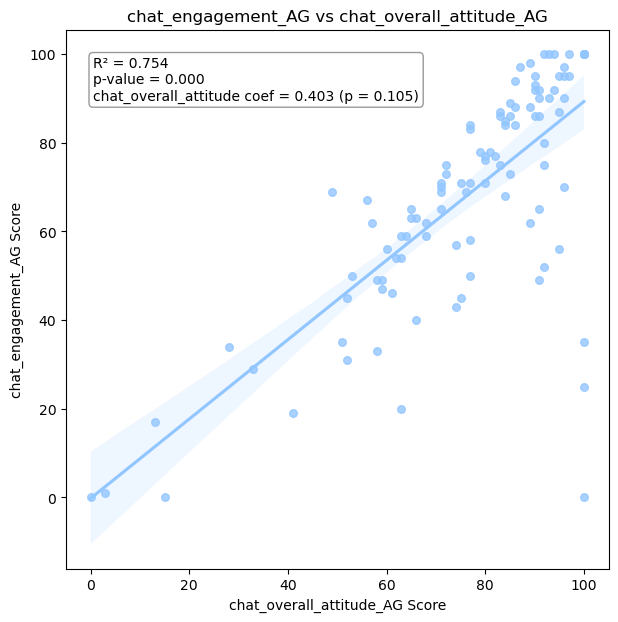

In [101]:
Study2b_3_results_list = []
Study2b_3_plot_list = []

fit_OLS_and_draw_plot(input_df = chat_scores_df, 
                      output_list_for_OLS = Study2b_3_results_list, 
                      output_list_for_plots = Study2b_3_plot_list,
                      use_composite_scores = False,
                      study = 'b')


--------------------------------------------------
chat_engagement_OP (Ridge Regression)
--------------------------------------------------
Ridge R-squared: 0.7289 (best alpha=10.0000)

Ridge Coefficients:
const: 67.4481 (95% CI: [62.8381, 71.6766])
age: 0.4690 (95% CI: [-2.0984, 2.9201])
income: 1.1329 (95% CI: [-1.5197, 3.7163])
Extraversion: 2.8519 (95% CI: [-0.9407, 6.4797])
Agreeableness: 0.1735 (95% CI: [-2.2604, 2.5430])
Conscientiousness: -0.6277 (95% CI: [-4.0968, 2.5576])
Neuroticism: -0.0241 (95% CI: [-3.0185, 3.1526])
Open_Mindedness: -1.7379 (95% CI: [-3.7383, 0.7527])
chat_perceived_personalization_OP: 3.7895 (95% CI: [-0.5907, 7.2222])
chat_perceived_personalization_CO: 0.1256 (95% CI: [-3.3175, 4.1664])
chat_perceived_personalization_EX: 1.7969 (95% CI: [-1.1156, 5.4376])
chat_perceived_personalization_AG: -3.6192 (95% CI: [-6.2525, 1.2257])
chat_overall_attitude_OP: 6.7633 (95% CI: [2.4814, 9.6364])
chat_overall_attitude_CO: 5.8292 (95% CI: [2.4242, 8.3479])
chat_over

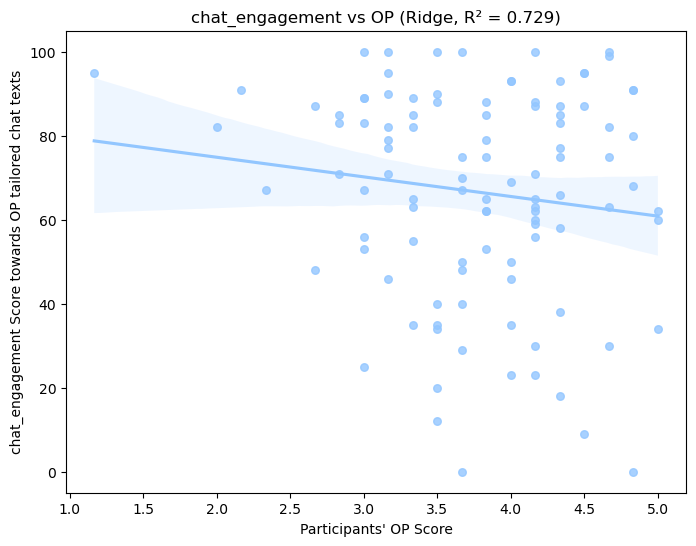


--------------------------------------------------
chat_engagement_CO (Ridge Regression)
--------------------------------------------------
Ridge R-squared: 0.7353 (best alpha=10.0000)

Ridge Coefficients:
const: 67.0065 (95% CI: [62.9670, 70.9539])
age: 0.8959 (95% CI: [-1.0558, 2.8949])
income: 0.3196 (95% CI: [-2.0126, 3.1235])
Extraversion: 3.7542 (95% CI: [0.0930, 7.4095])
Agreeableness: -0.2404 (95% CI: [-2.9169, 2.2160])
Conscientiousness: -0.6406 (95% CI: [-4.1904, 2.7667])
Neuroticism: 0.2409 (95% CI: [-2.8372, 3.4081])
Open_Mindedness: -1.5377 (95% CI: [-3.2845, 0.9362])
chat_perceived_personalization_OP: -0.6239 (95% CI: [-3.6958, 2.2582])
chat_perceived_personalization_CO: 3.0163 (95% CI: [-0.5333, 6.5309])
chat_perceived_personalization_EX: 0.5534 (95% CI: [-2.3626, 4.3884])
chat_perceived_personalization_AG: -0.9513 (95% CI: [-3.4331, 2.9590])
chat_overall_attitude_OP: 3.5510 (95% CI: [-0.0924, 6.8918])
chat_overall_attitude_CO: 9.2471 (95% CI: [5.0867, 11.2435])
chat_ov

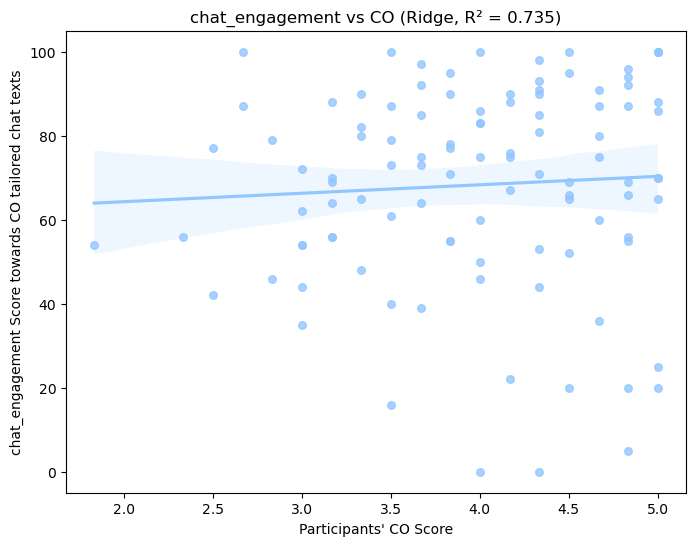


--------------------------------------------------
chat_engagement_EX (Ridge Regression)
--------------------------------------------------
Ridge R-squared: 0.8048 (best alpha=10.0000)

Ridge Coefficients:
const: 64.7742 (95% CI: [60.8583, 68.8442])
age: 0.7705 (95% CI: [-1.0118, 2.6139])
income: 1.5348 (95% CI: [-0.6141, 3.9611])
Extraversion: 2.8987 (95% CI: [-0.4024, 6.3252])
Agreeableness: -0.6298 (95% CI: [-2.7492, 1.2610])
Conscientiousness: -0.2874 (95% CI: [-3.7221, 2.9687])
Neuroticism: 1.2218 (95% CI: [-1.8161, 4.3266])
Open_Mindedness: -1.5687 (95% CI: [-3.3886, 0.4302])
chat_perceived_personalization_OP: -1.8580 (95% CI: [-4.0381, 0.9901])
chat_perceived_personalization_CO: -2.8237 (95% CI: [-5.6883, 0.5942])
chat_perceived_personalization_EX: 6.0089 (95% CI: [3.3429, 9.8099])
chat_perceived_personalization_AG: -0.0421 (95% CI: [-2.3892, 3.8206])
chat_overall_attitude_OP: 1.6733 (95% CI: [-1.5492, 4.1696])
chat_overall_attitude_CO: 2.0952 (95% CI: [-0.1780, 4.4748])
chat_o

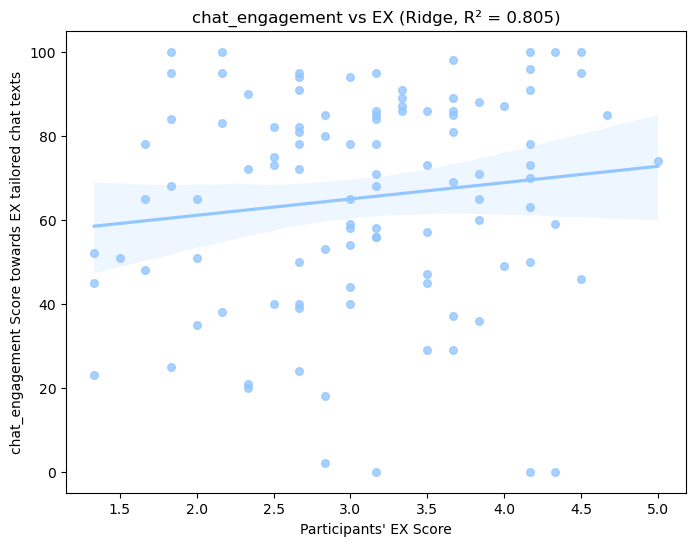


--------------------------------------------------
chat_engagement_AG (Ridge Regression)
--------------------------------------------------
Ridge R-squared: 0.7322 (best alpha=10.0000)

Ridge Coefficients:
const: 66.0773 (95% CI: [61.6512, 71.0829])
age: -0.9041 (95% CI: [-3.5326, 1.6821])
income: -0.1371 (95% CI: [-3.0392, 2.7777])
Extraversion: 2.9435 (95% CI: [-0.7174, 6.7417])
Agreeableness: -0.1359 (95% CI: [-2.5991, 2.0343])
Conscientiousness: -0.6404 (95% CI: [-3.5987, 2.7321])
Neuroticism: -0.7091 (95% CI: [-4.0089, 2.7325])
Open_Mindedness: -2.1258 (95% CI: [-4.1174, 0.3268])
chat_perceived_personalization_OP: -3.0366 (95% CI: [-5.0266, -0.1887])
chat_perceived_personalization_CO: -1.8518 (95% CI: [-5.2672, 1.7550])
chat_perceived_personalization_EX: 2.4580 (95% CI: [-0.0794, 6.2559])
chat_perceived_personalization_AG: 1.7094 (95% CI: [-1.2824, 5.1962])
chat_overall_attitude_OP: 0.7155 (95% CI: [-2.7261, 4.1183])
chat_overall_attitude_CO: 4.3501 (95% CI: [1.6849, 7.1753])
cha

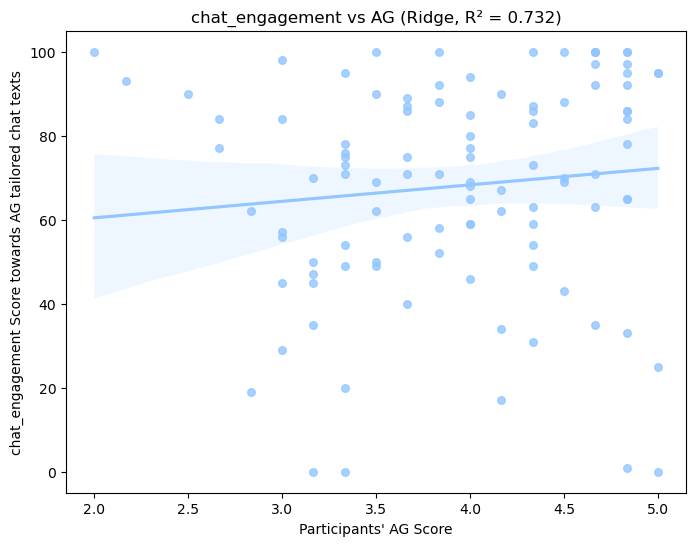

In [102]:
# Ridge Regression for Study2b_3
X = chat_big5_df_final.iloc[:,1:]
X_target_constructs = ['chat_perceived_personalization', 'chat_overall_attitude']
y_target_constract = 'chat_engagement'

for construct in X_target_constructs:
    for big5_type in big5_types:
        col_name = construct + '_' + big5_type
        X[col_name] = chat_scores_df[col_name]

continuous_columns = []
dummy_columns = []

for col in X.columns:
    if 'race_' in col or 'employment_' in col or 'gender_' in col or 'education_' in col:
        dummy_columns.append(col)
    else:
        continuous_columns.append(col)

scaler = StandardScaler()
X_continuous_scaled = scaler.fit_transform(X[continuous_columns])
X_continuous_scaled = pd.DataFrame(X_continuous_scaled, columns=continuous_columns)
X_scaled = pd.concat([X_continuous_scaled, X[dummy_columns].reset_index(drop=True)], axis=1)

Study2b_3_ridge_results = []
Study2b_3_ridge_plot_list = []

for big5_type in big5_types:
    col = y_target_constract + '_' + big5_type
    y = chat_scores_df[col]
    
    # Perform Ridge regression with cross-validation
    alphas = np.logspace(-6, 6, 13)
    ridge_cv = RidgeCV(alphas=alphas, store_cv_values=True, fit_intercept=True)
    ridge_cv.fit(X_scaled, y)
    best_alpha = ridge_cv.alpha_
    
    # Make predictions
    y_pred_ridge = ridge_cv.predict(X_scaled)
    
    # Calculate R-squared
    r_squared_ridge = calculate_r_squared(y, y_pred_ridge)
    
    # Bootstrap for Ridge CI
    coef_samples = bootstrap_ridge(X_scaled, y, n_iterations=1000, alpha=best_alpha)
    ci_lower = np.percentile(coef_samples, 2.5, axis=0)
    ci_upper = np.percentile(coef_samples, 97.5, axis=0)
    
    print(f"\n{'-'*50}\n{y_target_constract}_{big5_type} (Ridge Regression)\n{'-'*50}")
    print(f"Ridge R-squared: {r_squared_ridge:.4f} (best alpha={best_alpha:.4f})")
    
    # Store results
    Study2b_3_ridge_results.append((ridge_cv, r_squared_ridge, best_alpha, ci_lower, ci_upper))
    
    # Print coefficients
    print("\nRidge Coefficients:")
    for i, (name, coef) in enumerate(zip(['const'] + list(X_scaled.columns), np.insert(ridge_cv.coef_, 0, ridge_cv.intercept_))):
        ci_l, ci_u = ci_lower[i], ci_upper[i]
        print(f"{name}: {coef:.4f} (95% CI: [{ci_l:.4f}, {ci_u:.4f}])")
    
    # Plotting (using full dataset for visualization)
    col_flag = big5_lookup[big5_type]
    plt.figure(figsize=(8, 6))
    sns.regplot(x=chat_big5_df_final[col_flag], y=y, ci=95, scatter_kws={"s": 30})
    plt.xlabel(f"Participants' {big5_type} Score")
    plt.ylabel(f"{y_target_constract} Score towards {big5_type} tailored chat texts")
    plt.title(f"{y_target_constract} vs {big5_type} (Ridge, R² = {r_squared_ridge:.3f})")

    # Save or show the plot
    Study2b_3_ridge_plot_list.append(plt)
    plt.show()

In [103]:
X = chat_big5_df_final.iloc[:,1:].copy()

# Create composite scores
chat_scores_df['chat_perceived_personalization_mean'] = chat_scores_df[[f'chat_perceived_personalization_{t}' for t in big5_types]].mean(axis=1)
chat_scores_df['chat_overall_attitude_mean'] = chat_scores_df[[f'chat_overall_attitude_{t}' for t in big5_types]].mean(axis=1)
chat_scores_df['chat_engagement_mean'] = chat_scores_df[[f'chat_engagement_{t}' for t in big5_types]].mean(axis=1)

# Add composite scores to X
X['chat_perceived_personalization_mean'] = chat_scores_df['chat_perceived_personalization_mean']
X['chat_overall_attitude_mean'] = chat_scores_df['chat_overall_attitude_mean']

# Define target constructs
X_target_constructs = ['chat_perceived_personalization_mean', 'chat_overall_attitude_mean']
y_target_constract = 'chat_engagement_mean'

# Separate continuous and categorical columns
continuous_columns = [col for col in X.columns if not (col.startswith('race_') or col.startswith('employment_') or col.startswith('gender_') or col.startswith('education_'))]
dummy_columns = [col for col in X.columns if col.startswith('race_') or col.startswith('employment_') or col.startswith('gender_') or col.startswith('education_')]

# Scale continuous variables
scaler = StandardScaler()
X_continuous_scaled = pd.DataFrame(scaler.fit_transform(X[continuous_columns]), columns=continuous_columns)
X_scaled = pd.concat([X_continuous_scaled, X[dummy_columns].reset_index(drop=True)], axis=1)

# Add constant term for regression
X = sm.add_constant(X_scaled)

# Prepare y
y = chat_scores_df[y_target_constract]


--------------------------------------------------
chat_engagement_mean (Linear Model)
--------------------------------------------------
                             OLS Regression Results                             
Dep. Variable:     chat_engagement_mean   R-squared:                       0.783
Model:                              OLS   Adj. R-squared:                  0.730
Method:                   Least Squares   F-statistic:                     14.96
Date:                  Mon, 09 Sep 2024   Prob (F-statistic):           9.77e-20
Time:                          15:49:40   Log-Likelihood:                -396.17
No. Observations:                   104   AIC:                             834.3
Df Residuals:                        83   BIC:                             889.9
Df Model:                            20                                         
Covariance Type:              nonrobust                                         
                                          coef    s

<Figure size 1000x800 with 0 Axes>

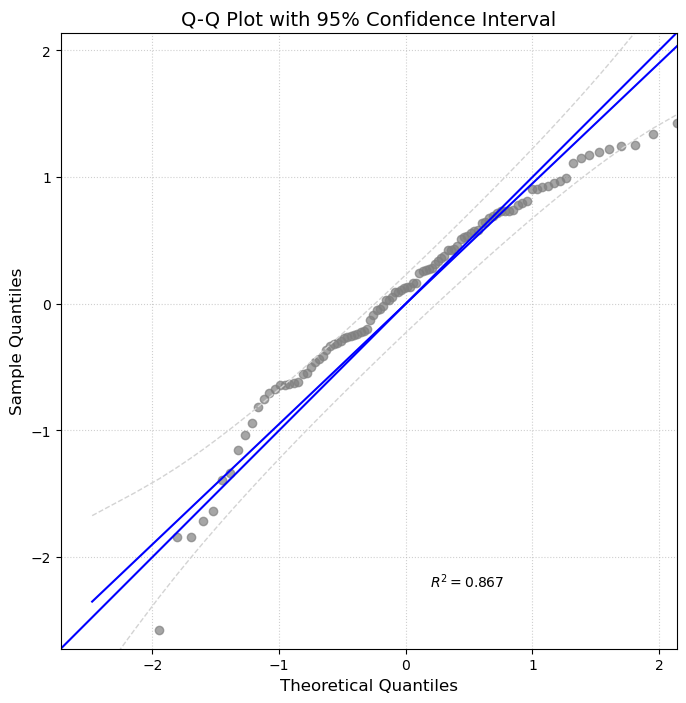


Variance Inflation Factors:
                               Variable        VIF
0                                 const  20.986907
1                                   age   1.294486
2                                income   1.726781
3                          Extraversion   1.597468
4                         Agreeableness   1.558687
5                     Conscientiousness   1.937575
6                           Neuroticism   2.603159
7                       Open_Mindedness   1.253338
8   chat_perceived_personalization_mean   8.413267
9            chat_overall_attitude_mean   7.715868
10                             gender_2   2.006136
11                          education_3   1.666964
12                          education_4   2.299982
13                          education_5   2.080747
14                          education_6   1.271923
15                               race_2   1.305528
16                              race_99   1.292733
17                         employment_5   2.497269
18

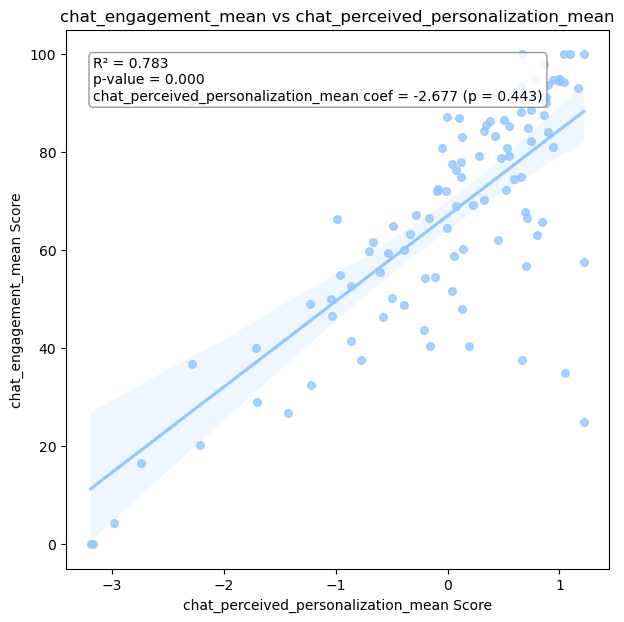

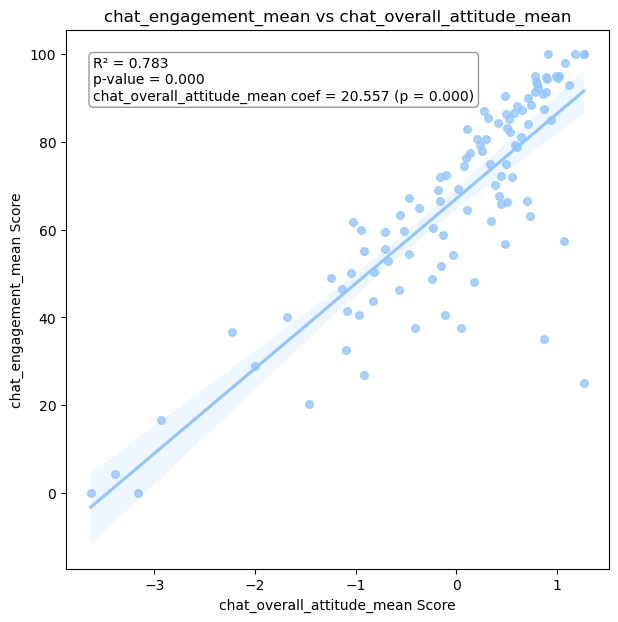

In [104]:
Study2b_3_results_composite_list = []
Study2b_3_plot_composite_list = []

fit_OLS_and_draw_plot(input_df = chat_scores_df, 
                      output_list_for_OLS = Study2b_3_results_composite_list, 
                      output_list_for_plots = Study2b_3_plot_composite_list,
                      use_composite_scores = True)

In [105]:
"""
save_all_regression_results(Study2b_3_results_composite_list, 
                            'chat_overall_attitude_mean',
                            'presentation_materials/tmp/study2b_3_results_composite.csv')
"""

"\nsave_all_regression_results(Study2b_3_results_composite_list, \n                            'chat_overall_attitude_mean',\n                            'presentation_materials/tmp/study2b_3_results_composite.csv')\n"